In [1]:
#Import module
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy import stats
import scipy.optimize as optimization  
import pandas as pd
#Latex font
import matplotlib as mpl
from matplotlib import rc
plt.rc('text', usetex=True)
plt.rc('font', family='serif',size=16)

In [2]:
ls

2022_Feb_week4_Linear_fit_period.dat
2022_Feb_week4_OC_diagram.jpg
2022_Feb_week4_OC_diagram.out
2022_Feb_week4_Weighted_mean_calculation_This_work_combined.out
2022_Feb_week4_new_ephemeris_sin_fit.ipynb
2022_Feb_week4_new_ephemeris_sin_fit.jpg
2022_Feb_week4_new_ephemeris_sin_fit.out
2022_Feb_week4_new_ephemeris_sin_fit_Res.jpg
2022_Feb_week4_new_ephemeris_sin_fit_weighted_data.ipynb
interporate.out
interporate_weighted_mean.out


In [3]:
DP_Leo = open("2022_Feb_week4_Linear_fit_period.dat",'r').readlines()
N_dpleo = len(DP_Leo)

#Read datat
Cycle = []
T_obs = []
T_obs_err = []
#Please change the input file
for line in open("2022_Feb_week4_Linear_fit_period.dat"):
    li=line.strip()
    if not li.startswith("#"):
        Cycle.append(float(li.split(" ")[0]))
        T_obs.append(float(li.split(" ")[1]))
        T_obs_err.append(float(li.split(" ")[2]))

In [4]:
#New ephemeris
T0_bjd = 2448773.2148464173
T0_bjd_err = 2.9564294265740673e-09
P0_day = 0.062362845525219396
P0_day_err = 2.6193240365559364e-19

In [5]:
#Arrays
BJD_time_a = [i for i in range(N_dpleo)]
Delta_aT = [i for i in range(N_dpleo)]
Delta_aT_err = [i for i in range(N_dpleo)]
E_af = [i for i in range(N_dpleo)] #float number
E_ak = [i for i in range(N_dpleo)] #integer number
E_aj = [i for i in range(N_dpleo)] #integer number
P_aE = [i for i in range(N_dpleo)]
P_err_aE = [i for i in range(N_dpleo)]
T_aC_linear = [i for i in range(N_dpleo)]
T_aO_linear = [i for i in range(N_dpleo)]
P_aver_a = [i for i in range(N_dpleo)]
P_aver_std_a = [i for i in range(N_dpleo)]

In [6]:
delta_tdb_tt = 0.0013/(24*60*60)
OC_cal = []
#print ('-----------------------------------------------------------------------------')
#print ('Cycle \t\t T_O \t   T_C \t\t BJD - 2450000 \t OC_lin OC_err_Lin OC_occ')
print('No. \t BJD_time \t Cycle \t T_O_linear \t T_C_linear \t OC_s \t\t OC_s_err')
#print ('-----------------------------------------------------------------------------')
for i in range (0,N_dpleo):
    BJD_time = np.array(T_obs)+delta_tdb_tt
    BJD_time_a[i] = BJD_time
    Delta_T = np.array(T_obs) - np.array(T0_bjd)
    Delta_aT[i] = Delta_T #arrays
    Delta_T_err = np.sqrt((np.array(T_obs_err)/np.array(T_obs))**2 + (np.array(T0_bjd_err)/np.array(T0_bjd))**2)
    E_k = Cycle
    E_ak[i] = E_k #arrays
    #    print (Delta_T_err[i])
    E_f = Delta_T / P0_day                      #Calculate cycle with float number
    ##    print (E_f)                                 #print cycle with float number
    E_af[i] = E_f #arrays
    E_j = np.round(Delta_T / P0_day)           #Calculate cycle with integer number
##print (Delta_T)
    if  E_j[i] != 0:
        P_E_day = Delta_T[i] / E_j[i]
        P_aE[i] = P_E_day
        P_E_err_day = np.abs((np.array(T_obs_err[i]) - np.array(T0_bjd_err)) / E_j[i])
        P_err_aE[i] = P_E_err_day
        T_O_linear = T0_bjd + P_aE[i]*E_j[i]               #Linear
        T_aO_linear[i] = T_O_linear #arrays
    else:
        E_k[i] = 1
        P_E_day = Delta_T[i] / E_k[i]
#        print (P_E_day)
        P_aE[i] = P_E_day
        P_E_err_day = np.abs((np.array(T_obs_err[i]) - np.array(T0_bjd_err)) / E_k[i])
        P_err_aE[i] = P_E_err_day
        T_O_linear = T0_bjd + P_aE[i]*E_k[i]               #Linear
        T_aO_linear[i] = T_O_linear #arrays
#    print ('%0.6f' %(T_O))
#print (E_j)                                #print cycle with integer number
    if  E_j[i] != 0:
        P_E_day = Delta_T[i] / E_j[i]
        P_aE[i] = P_E_day
        P_E_err_day = np.abs((np.array(T_obs_err[i]) - np.array(T0_bjd_err)) / E_j[i])
#        print (P_E_err_day)
        P_err_aE[i] = P_E_err_day
        T_C_linear = T0_bjd + P0_day*E_j[i]              #Linear
        T_aC_linear[i] = T_C_linear #arrays
#    print (T_O, T_C)
        OC = np.array(T_O_linear) - np.array(T_C_linear)
        OC_s = (np.array(T_O_linear) - np.array(T_C_linear))*24*60*60
        OC_err = np.abs(np.sqrt((np.array(P_err_aE[i])**2 + (np.array(P0_day_err)**2))) * np.array(E_j[i]))
#        print (OC_err)
        OC_s_err = OC_err*24*60*60
    else:
        P_E_day = Delta_T[i] / E_k[i]
        P_aE[i] = P_E_day
        P_E_err_day = np.abs((np.array(T_obs_err[i]) - np.array(T0_bjd_err)) / E_k[i])
        P_err_aE[i] = P_E_err_day
        T_C_linear = T0_bjd + P0_day*E_j[i]              #Linear
        T_aC_linear[i] = T_C_linear #arrays
#    print (T_O, T_C)
        OC = np.array(T_O_linear) - np.array(T_C_linear)
        OC_s = (np.array(T_O_linear) - np.array(T_C_linear))*24*60*60
        OC_err = np.abs(np.sqrt((np.array(P_err_aE[i])**2)) *np.array(E_k[i]))
#        print (OC_err)
        OC_s_err = OC_err*24*60*60
    print ('%0.0f\t%0.6f\t%0.0f\t%0.6f\t%0.6f\t%0.6f\t%0.6f' %(i, BJD_time[i], Cycle[i], T_O_linear, T_C_linear, OC_s, OC_s_err))
    OC_cal.append('%0.6f\t%0.0f\t%0.6f\t%0.6f\t%0.6f\t%0.6f' %(BJD_time[i], Cycle[i], T_O_linear, T_C_linear, OC_s, OC_s_err))

#P_aver = mean(P_aE[i])
#P_aver_a[i] = P_aver
#P_aver_std = np.std(P_aE[i])
#P_aver_std = mean(P_err_aE[i])
#P_aver_std_a[i] = P_aver_std
#print('%0.11f %0.11f' %(P_aver, P_aver_std))

rerults = OC_cal
f = open("2022_Feb_week4_OC_diagram.out", 'w')
for i in range(len(rerults)):
    f.write(str(rerults[i])+ '\n')
f.close()

No. 	 BJD_time 	 Cycle 	 T_O_linear 	 T_C_linear 	 OC_s 		 OC_s_err
0	2444214.553250	-73099	2444214.553250	2444214.553201	4.201667	14.687745
1	2444214.615620	-73098	2444214.615620	2444214.615564	4.819809	14.687745
2	2444214.677980	-73097	2444214.677980	2444214.677927	4.573984	14.687745
3	2444968.023090	-61017	2444968.023090	2444968.021101	171.849158	100.223745
4	2444968.957120	-61002	2444968.957120	2444968.956544	49.793373	100.223745
5	2444969.019620	-61001	2444969.019620	2444969.018907	61.643520	100.223745
6	2444978.997550	-60841	2444978.997550	2444978.996962	50.818956	100.223745
7	2444993.900780	-60602	2444993.900780	2444993.901682	-77.924019	59.615745
8	2444993.963280	-60601	2444993.963280	2444993.964045	-66.073872	59.615745
9	2444994.026420	-60600	2444994.026420	2444994.026408	1.072294	59.615745
10	2445020.905130	-60169	2445020.905130	2445020.904794	29.029495	19.871745
11	2445021.902920	-60153	2445021.902920	2445021.902600	27.687840	19.871745
12	2445024.833860	-60106	2445024.833860

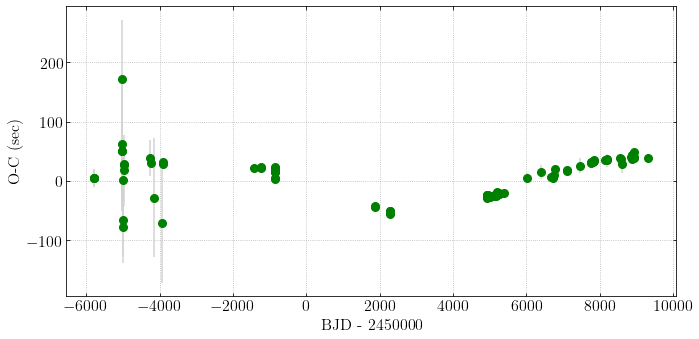

In [7]:
#Plot O-C vs BJD
Input  = '2022_Feb_week4_OC_diagram.out'
Data   = np.genfromtxt(Input)

N = 2450000
BJD_time = Data[:,0] - N
Cycle = Data[:,1]
T_O_linear = Data[:,2]
T_C_linear = Data[:,3]
OC_s = Data[:,4]
OC_s_err = Data[:,5]

 ##Plotgraph
fig=plt.figure(figsize=(10, 5), tight_layout=True)
plt.tick_params(direction='in', which='both', bottom='on',top='on', right = 'on')

x1 = min(BJD_time)
x2 = max(BJD_time)
#plt.errorbar(BJD_time, OC_s, yerr=OC_s_err, fmt='o', color='limegreen')
plt.errorbar(BJD_time, OC_s, yerr= OC_s_err, fmt='o', markersize=8, color='green',
                    ecolor='lightgray')

#Schwope_2002
#plt.text(BJD_time_Schwope_2002[0], 300, '1979')
#plt.text(BJD_time_Schwope_2002[3], 300, '1981')
#plt.text(BJD_time_Schwope_2002[13], 300, '1984')
#plt.text(BJD_time_Schwope_2002[17], 300, '1985')
#plt.text(BJD_time_Schwope_2002[19]-100, 300, '1991')
#plt.text(BJD_time_Schwope_2002[20], 300, '1992')
#plt.text(BJD_time_Schwope_2002[22], 300, '1993')
#plt.text(BJD_time_Schwope_2002[30], 300, '2000')
#plt.text(BJD_time_Schwope_2002[32], 300, '2002')

#plt.hlines(y= 0, xmin= x1, xmax= x2, colors='k', linestyles='dotted')
#plt.xlim(x1,x2)
#plt.ylim(-20,20)
plt.xlabel('BJD - 2450000')
plt.ylabel('O-C (sec)')
#plt.legend()
plt.grid(linestyle='dotted')
######plt.title('O-C diagram: DP Leo')
#output_filename = os.path.splitext(__file__)[0] + '.png'
#plt.savefig(output_filename, dpi=1000)
plt.savefig("2022_Feb_week4_OC_diagram.jpg", dpi=1000)
plt.show()

In [8]:
#Read data ---#1
Input = "2022_Feb_week4_OC_diagram.out"
Data   = np.genfromtxt(Input)

Epoch = Data[:,1]
OC = Data[:,4]
OC_err = Data[:,5]

In [9]:
x = Epoch
y = OC
dy = OC_err

len_x = len(x)
print(len_x)

123


In [10]:
def sin_fit(x, a, b, c, d):
    return a*np.sin(b*x - np.radians(c)) + d

In [11]:
guess = [41.9455, 0.0000324289, -145.235, -5.46613]
params, params_covariance = optimization.curve_fit(sin_fit, x, y, guess)

a = params[0]
b = params[1]
c = params[2]
d = params[3]


da = params_covariance[0,0]
db = params_covariance[1,1]
dc = params_covariance[2,2]
dd = params_covariance[3,3]

output_fit = sin_fit(x, a, b, c, d)


print("The parameters of egress part")
print("a =", a, "+/-", da**0.5)
print("b =", b, "+/-", db**0.5)
print("c =", c, "+/-", dc**0.5)
print("d =", d, "+/-", dd**0.5)

The parameters of egress part
a = 42.56828153546464 +/- 3.7765907137230754
b = 3.255249381277433e-05 +/- 1.05095566005842e-06
c = -145.40688358296845 +/- 5.649917120191178
d = -5.004414968773284 +/- 3.266654398124648


In [12]:
x_min, x_max = np.amin(x), np.amax(x)
x_line = np.linspace(x_min, x_max, len_x)
#y_line = sin_fit(x_line, *params)
y_line = sin_fit(x_line, *params) #### For all interporation 
s = a*np.sin(b*x - np.radians(c)) + d #just only our data point
Res = y - s
print(y)
print(s)

len_y_line = len(y_line)
print(len_y_line)

np.savetxt('2022_Feb_week4_new_ephemeris_sin_fit.out', np.c_[x_line, y_line, y, dy], fmt="%.5f")

#Reduced_chisqrt
m = 4
dof = len_x - m
Chi_sqr = ((y - s)**2/(dy)**2)/dof
Reduced_chisq = sum(Chi_sqr)
print(Reduced_chisq)

[  4.201667   4.819809   4.573984 171.849158  49.793373  61.64352
  50.818956 -77.924019 -66.073872   1.072294  29.029495  27.68784
  17.860736  38.129264  30.866218 -28.271744 -71.337372  32.363816
  27.797958  22.18958   21.045551  24.023889  14.942989  15.287183
   4.67332   17.387474  24.313527  18.883704   3.949848  21.84796
 -43.515797 -41.415466 -50.924648 -55.244641 -51.170513 -27.598885
 -26.116736 -24.234228 -26.039489 -25.034988 -24.634588 -25.744459
 -26.85433  -27.100155 -25.624926 -25.006784 -24.128777 -27.830628
 -26.566221 -26.812086 -26.193944 -22.983782 -25.807585 -26.05345
 -26.65751  -26.285233 -25.667091 -25.048949 -25.653009 -26.76288
 -27.008745 -27.317695 -25.835547 -26.453608 -24.521855 -26.137416
 -23.298968 -22.961734 -24.935572 -22.575375 -23.298888 -24.008359
 -24.254224 -24.486007 -23.003858 -22.371675 -22.666503 -22.912368
 -21.416178 -19.070023 -21.261603 -20.875244 -23.713088 -22.23098
 -21.93591  -21.668883 -21.050741 -22.006036 -19.462578   5.364405
 

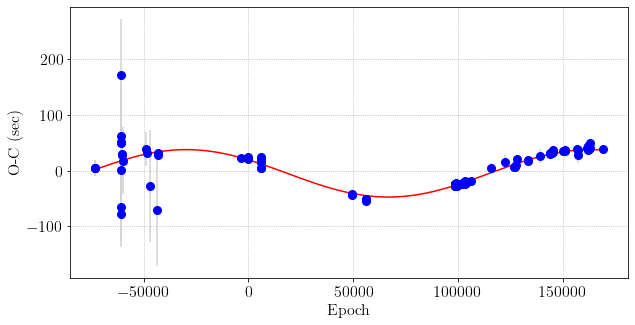

In [13]:
#Plotgraph
fig=plt.figure(figsize=(10, 5))
plt.errorbar(x, y, yerr= dy, fmt='o', markersize=8, color='blue', ecolor='lightgray')
# create a line plot for the mapping function
plt.plot(x_line, y_line, '-', color='red')
#plt.plot(BJD_time, OC_s_ecc, lw=2, color='black')
#plt.xlim(-6000,6000)
#plt.ylim(-200,200)
#plt.ylim(-40,60)
plt.xlabel('Epoch')
plt.ylabel('O-C (sec)')
plt.grid(linestyle='dotted')
#####plt.title('O-C diagram: DP Leo')
#output_filename = os.path.splitext(__file__)[0] + '.png'
#plt.savefig(output_filename, dpi=1000)
plt.show()

#### Interporate output

In [14]:
N = 300000
x_range = [i for i in range(N)]
y_range = [i for i in range(len(x_range))]
step=1
#step

interporate = []
for i in range(-200000, N):
    x_range[i] = i*step
    y_range[i] = sin_fit(x_range[i], a, b, c, d)
    print(x_range[i], y_range[i])
    interporate.append('%0.0f %0.2f %0.2f' %(i, x_range[i], y_range[i]))
    
data_out = interporate
f = open("interporate.out", 'w')
for i in range(len(data_out)):
    f.write(str(data_out[i])+ '\n')
f.close()

-200000 26.438984300997795
-199999 26.438050208560085
-199998 26.437116082803882
-199997 26.436181923730217
-199996 26.435247731340056
-199995 26.43431350563437
-199994 26.433379246614194
-199993 26.432444954280484
-199992 26.431510628634214
-199991 26.43057626967643
-199990 26.429641877408088
-199989 26.428707451830178
-199988 26.427772992943673
-199987 26.426838500749604
-199986 26.425903975248943
-199985 26.424969416442643
-199984 26.42403482433177
-199983 26.42310019891726
-199982 26.422165540200098
-199981 26.421230848181317
-199980 26.42029612286189
-199979 26.41936136424279
-199978 26.418426572324996
-199977 26.41749174710955
-199976 26.41655688859742
-199975 26.415621996789554
-199974 26.414687071687005
-199973 26.41375211329074
-199972 26.412817121601755
-199971 26.411882096621007
-199970 26.41094703834952
-199969 26.410011946788295
-199968 26.409076821938278
-199967 26.408141663800514
-199966 26.407206472375968
-199965 26.4062712476656
-199964 26.405335989670462
-199963 26.40

-198873 25.365359387752157
-198872 25.36438838178995
-198871 25.36341734364698
-198870 25.362446273324267
-198869 25.361475170822878
-198868 25.36050403614383
-198867 25.359532869288138
-198866 25.35856167025682
-198865 25.357590439050938
-198864 25.35661917567151
-198863 25.355647880119534
-198862 25.3546765523961
-198861 25.353705192502197
-198860 25.35273380043884
-198859 25.3517623762071
-198858 25.350790919807984
-198857 25.34981943124253
-198856 25.34884791051173
-198855 25.34787635761667
-198854 25.346904772558354
-198853 25.34593315533779
-198852 25.34496150595605
-198851 25.34398982441415
-198850 25.343018110713082
-198849 25.34204636485393
-198848 25.341074586837692
-198847 25.34010277666541
-198846 25.339130934338094
-198845 25.3381590598568
-198844 25.33718715322256
-198843 25.33621521443635
-198842 25.335243243499278
-198841 25.334271240412335
-198840 25.333299205176523
-198839 25.33232713779293
-198838 25.331355038262558
-198837 25.33038290658643
-198836 25.32941074276556

-197623 24.12681840805788
-197622 24.125807990359583
-197621 24.124797541793008
-197620 24.123787062359213
-197619 24.122776552059307
-197618 24.12176601089434
-197617 24.120755438865366
-197616 24.119744835973485
-197615 24.118734202219763
-197614 24.117723537605265
-197613 24.116712842131022
-197612 24.115702115798186
-197611 24.11469135860777
-197610 24.113680570560845
-197609 24.112669751658522
-197608 24.111658901901848
-197607 24.110648021291865
-197606 24.1096371098297
-197605 24.108626167516398
-197604 24.10761519435303
-197603 24.106604190340647
-197602 24.10559315548035
-197601 24.104582089773217
-197600 24.103570993220266
-197599 24.102559865822634
-197598 24.101548707581365
-197597 24.100537518497504
-197596 24.099526298572172
-197595 24.098515047806423
-197594 24.097503766201314
-197593 24.096492453757904
-197592 24.0954811104773
-197591 24.094469736360573
-197590 24.09345833140874
-197589 24.092446895622956
-197588 24.091435429004243
-197587 24.090423931553644
-197586 24.

-196373 22.840050732869713
-196372 22.83900257617971
-196371 22.83795438998498
-196370 22.836906174286696
-196369 22.835857929085954
-196368 22.83480965438384
-196367 22.833761350181454
-196366 22.832713016479964
-196365 22.83166465328044
-196364 22.83061626058398
-196363 22.82956783839174
-196362 22.828519386704812
-196361 22.827470905524265
-196360 22.826422394851278
-196359 22.825373854686937
-196358 22.824325285032344
-196357 22.823276685888587
-196356 22.822228057256822
-196355 22.821179399138146
-196354 22.820130711533643
-196353 22.819081994444467
-196352 22.81803324787171
-196351 22.816984471816454
-196350 22.81593566627987
-196349 22.814886831263046
-196348 22.813837966767075
-196347 22.812789072793052
-196346 22.81174014934215
-196345 22.810691196415434
-196344 22.809642214014012
-196343 22.80859320213903
-196342 22.807544160791586
-196341 22.806495089972785
-196340 22.80544598968371
-196339 22.80439685992554
-196338 22.80334770069934
-196337 22.802298512006203
-196336 22.801

-195123 21.50718660336353
-195122 21.506102442903
-195121 21.505018254350176
-195120 21.503934037706273
-195119 21.5028497929724
-195118 21.501765520149682
-195117 21.50068121923932
-195116 21.499596890242444
-195115 21.498512533160195
-195114 21.497428147993702
-195113 21.49634373474416
-195112 21.4952592934127
-195111 21.49417482400044
-195110 21.49309032650858
-195109 21.492005800938244
-195108 21.49092124729055
-195107 21.489836665566713
-195106 21.488752055767854
-195105 21.48766741789511
-195104 21.486582751949612
-195103 21.48549805793256
-195102 21.484413335845083
-195101 21.48332858568829
-195100 21.482243807463398
-195099 21.481159001171527
-195098 21.480074166813793
-195097 21.478989304391412
-195096 21.477904413905485
-195095 21.47681949535719
-195094 21.475734548747624
-195093 21.474649574078
-195092 21.47356457134945
-195091 21.47247954056308
-195090 21.47139448172011
-195089 21.470309394821655
-195088 21.469224279868833
-195087 21.468139136862852
-195086 21.4670539658048

-193874 20.131550916069372
-193873 20.1304325732982
-193872 20.12931420389247
-193871 20.12819580785346
-193870 20.12707738518229
-193869 20.125958935880163
-193868 20.12484045994824
-193867 20.12372195738775
-193866 20.12260342819986
-193865 20.12148487238572
-193864 20.12036628994658
-193863 20.11924768088359
-193862 20.11812904519791
-193861 20.117010382890783
-193860 20.115891693963363
-193859 20.114772978416838
-193858 20.11365423625236
-193857 20.112535467471183
-193856 20.111416672074448
-193855 20.110297850063326
-193854 20.109179001439045
-193853 20.10806012620278
-193852 20.10694122435568
-193851 20.10582229589898
-193850 20.10470334083385
-193849 20.103584359161474
-193848 20.102465350882994
-193847 20.10134631599967
-193846 20.100227254512653
-193845 20.0991081664231
-193844 20.097989051732256
-193843 20.09686991044127
-193842 20.09575074255134
-193841 20.094631548063617
-193840 20.093512326979344
-193839 20.09239307929969
-193838 20.091273805025793
-193837 20.0901545041589

-192624 18.713218557831652
-192623 18.71206785607052
-192622 18.71091712917783
-192621 18.70976637715487
-192620 18.708615600002823
-192619 18.707464797722885
-192618 18.70631397031633
-192617 18.705163117784345
-192616 18.704012240128158
-192615 18.70286133734895
-192614 18.701710409448005
-192613 18.700559456426518
-192612 18.69940847828567
-192611 18.698257475026736
-192610 18.69710644665092
-192609 18.6959553931594
-192608 18.694804314553465
-192607 18.6936532108343
-192606 18.69250208200313
-192605 18.691350928061127
-192604 18.690199749009594
-192603 18.68904854484971
-192602 18.68789731558266
-192601 18.686746061209732
-192600 18.685594781732114
-192599 18.684443477150992
-192598 18.683292147467654
-192597 18.682140792683278
-192596 18.6809894127991
-192595 18.6798380078163
-192594 18.67868657773616
-192593 18.677535122559867
-192592 18.676383642288613
-192591 18.675232136923675
-192590 18.674080606466255
-192589 18.67292905091753
-192588 18.67177747027879
-192587 18.67062586455

-191337 17.21190324471263
-191336 17.210721217063345
-191335 17.2095391658735
-191334 17.208357091144308
-191333 17.20717499287702
-191332 17.20599287107286
-191331 17.20481072573314
-191330 17.203628556859087
-191329 17.202446364451916
-191328 17.201264148512955
-191327 17.200081909043412
-191326 17.19889964604451
-191325 17.19771735951757
-191324 17.196535049463805
-191323 17.195352715884482
-191322 17.19417035878081
-191321 17.192987978154108
-191320 17.191805574005592
-191319 17.1906231463365
-191318 17.18944069514813
-191317 17.188258220441718
-191316 17.187075722218474
-191315 17.18589320047972
-191314 17.18471065522668
-191313 17.183528086460598
-191312 17.182345494182705
-191311 17.18116287839431
-191310 17.179980239096643
-191309 17.17879757629092
-191308 17.17761488997845
-191307 17.176432180160475
-191306 17.175249446838222
-191305 17.174066690012936
-191304 17.172883909685922
-191303 17.171701105858403
-191302 17.170518278531603
-191301 17.169335427706834
-191300 17.1681525

-189903 15.49330717400551
-189902 15.492092688111684
-189901 15.490878180498397
-189900 15.489663651167005
-189899 15.488449100118755
-189898 15.487234527354905
-189897 15.48601993287681
-189896 15.484805316685717
-189895 15.483590678782884
-189894 15.482376019169669
-189893 15.481161337847317
-189892 15.479946634817123
-189891 15.478731910080336
-189890 15.477517163638312
-189889 15.476302395492302
-189888 15.475087605643568
-189887 15.473872794093454
-189886 15.47265796084322
-189885 15.471443105894119
-189884 15.470228229247498
-189883 15.469013330904625
-189882 15.467798410866775
-189881 15.466583469135207
-189880 15.465368505711277
-189879 15.464153520596236
-189878 15.462938513791338
-189877 15.46172348529794
-189876 15.460508435117292
-189875 15.459293363250653
-189874 15.458078269699373
-189873 15.456863154464708
-189872 15.455648017547949
-189871 15.454432858950343
-189870 15.45321767867325
-189869 15.452002476717924
-189868 15.450787253085617
-189867 15.449572007777684
-18986

-189375 14.849068308682144
-189374 14.84784253454062
-189373 14.846616739362387
-189372 14.845390923148715
-189371 14.84416508590087
-189370 14.842939227620215
-189369 14.841713348308017
-189368 14.84048744796557
-189367 14.839261526594148
-189366 14.838035584195113
-189365 14.836809620769726
-189364 14.835583636319262
-189363 14.834357630845082
-189362 14.83313160434845
-189361 14.831905556830636
-189360 14.830679488293002
-189359 14.829453398736815
-189358 14.828227288163374
-189357 14.827001156573948
-189356 14.8257750039699
-189355 14.824548830352496
-189354 14.823322635723004
-189353 14.822096420082788
-189352 14.820870183433113
-189351 14.819643925775251
-189350 14.818417647110559
-189349 14.817191347440309
-189348 14.815965026765804
-189347 14.8147386850883
-189346 14.813512322409172
-189345 14.812285938729682
-189344 14.811059534051095
-189343 14.809833108374784
-189342 14.80860666170201
-189341 14.807380194034069
-189340 14.806153705372234
-189339 14.804927195717871
-189338 14

-188125 13.30085286399767
-188124 13.299601815009291
-188123 13.29835074662479
-188122 13.297099658845488
-188121 13.295848551672679
-188120 13.294597425107762
-188119 13.293346279152024
-188118 13.292095113806754
-188117 13.290843929073352
-188116 13.289592724953105
-188115 13.288341501447343
-188114 13.287090258557358
-188113 13.285838996284538
-188112 13.284587714630183
-188111 13.283336413595576
-188110 13.282085093182117
-188109 13.280833753391098
-188108 13.279582394223807
-188107 13.278331015681642
-188106 13.277079617765894
-188105 13.275828200477891
-188104 13.274576763818919
-188103 13.273325307790378
-188102 13.272073832393557
-188101 13.270822337629747
-188100 13.26957082350035
-188099 13.26831929000665
-188098 13.267067737149942
-188097 13.265816164931616
-188096 13.264564573352972
-188095 13.263312962415332
-188094 13.26206133211999
-188093 13.260809682468336
-188092 13.25955801346167
-188091 13.258306325101275
-188090 13.257054617388553
-188089 13.255802890324793
-188088

-186786 11.608855342901547
-186785 11.607579518082835
-186784 11.606303675660937
-186783 11.605027815637287
-186782 11.603751938013191
-186781 11.602476042789968
-186780 11.601200129969042
-186779 11.599924199551731
-186778 11.59864825153935
-186777 11.59737228593332
-186776 11.596096302734958
-186775 11.594820301945623
-186774 11.593544283566624
-186773 11.592268247599383
-186772 11.590992194045223
-186771 11.58971612290546
-186770 11.588440034181511
-186769 11.5871639278747
-186768 11.585887803986337
-186767 11.584611662517853
-186766 11.583335503470556
-186765 11.582059326845807
-186764 11.580783132644916
-186763 11.579506920869308
-186762 11.578230691520302
-186761 11.576954444599215
-186760 11.575678180107468
-186759 11.57440189804638
-186758 11.5731255984173
-186757 11.571849281221551
-186756 11.570572946460553
-186755 11.56929659413562
-186754 11.568020224248075
-186753 11.566743836799331
-186752 11.56546743179072
-186751 11.564191009223551
-186750 11.562914569099247
-186749 11.

-185375 9.791790349038308
-185374 9.79049103953165
-185373 9.789191714347387
-185372 9.787892373486859
-185371 9.786593016951441
-185370 9.78529364474248
-185369 9.783994256861414
-185368 9.782694853309595
-185367 9.78139543408836
-185366 9.780095999199155
-185365 9.778796548643324
-185364 9.777497082422244
-185363 9.776197600537254
-185362 9.774898102989805
-185361 9.773598589781239
-185360 9.772299060912895
-185359 9.77099951638622
-185358 9.76969995620256
-185357 9.768400380363254
-185356 9.76710078886975
-185355 9.76580118172339
-185354 9.764501558925549
-185353 9.763201920477574
-185352 9.761902266380906
-185351 9.760602596636895
-185350 9.759302911246873
-185349 9.7580032102123
-185348 9.756703493534507
-185347 9.75540376121484
-185346 9.75410401325475
-185345 9.752804249655574
-185344 9.751504470418691
-185343 9.750204675545445
-185342 9.748904865037282
-185341 9.747605038895545
-185340 9.746305197121576
-185339 9.74500533971682
-185338 9.743705466682623
-185337 9.74240557802032

-183924 7.890702327613562
-183923 7.889381726430603
-183922 7.8880611115845785
-183921 7.886740483076849
-183920 7.885419840908813
-183919 7.884099185081839
-183918 7.882778515597392
-183917 7.881457832456842
-183916 7.880137135661549
-183915 7.8788164252129835
-183914 7.8774957011125135
-183913 7.876174963361532
-183912 7.874854211961408
-183911 7.87353344691361
-183910 7.872212668219504
-183909 7.870891875880451
-183908 7.869571069897926
-183907 7.86825025027329
-183906 7.8669294170079045
-183905 7.8656085701032445
-183904 7.864287709560674
-183903 7.862966835381593
-183902 7.861645947567361
-183901 7.8603250461194545
-183900 7.859004131039233
-183899 7.857683202328065
-183898 7.856362259987419
-183897 7.8550413040186555
-183896 7.853720334423146
-183895 7.852399351202358
-183894 7.851078354357655
-183893 7.84975734389044
-183892 7.848436319802071
-183891 7.847115282094025
-183890 7.845794230767664
-183889 7.844473165824352
-183888 7.84315208726556
-183887 7.841830995092652
-183886 7

-182626 6.165571570467035
-182625 6.1642344176222945
-182624 6.16289725294253
-182623 6.1615600764291205
-182622 6.160222888083558
-182621 6.158885687907217
-182620 6.157548475901523
-182619 6.156211252067848
-182618 6.154874016407689
-182617 6.153536768922423
-182616 6.15219950961343
-182615 6.150862238482203
-182614 6.149524955530119
-182613 6.148187660758563
-182612 6.146850354169022
-182611 6.145513035762875
-182610 6.144175705541542
-182609 6.142838363506403
-182608 6.141501009658947
-182607 6.140163644000557
-182606 6.138826266532613
-182605 6.137488877256603
-182604 6.136151476173909
-182603 6.134814063285949
-182602 6.133476638594102
-182601 6.132139202099859
-182600 6.130801753804603
-182599 6.129464293709711
-182598 6.128126821816675
-182597 6.1267893381268745
-182596 6.125451842641695
-182595 6.12411433536262
-182594 6.1227768162910365
-182593 6.121439285428359
-182592 6.120101742775965
-182591 6.118764188335351
-182590 6.117426622107892
-182589 6.116089044094974
-182588 6.1

-181126 4.147334755175336
-181125 4.145981449517935
-181124 4.144628134164217
-181123 4.143274809115578
-181122 4.141921474373456
-181121 4.140568129939245
-181120 4.1392147758144535
-181119 4.137861412000479
-181118 4.136508038498716
-181117 4.135154655310679
-181116 4.133801262437759
-181115 4.132447859881394
-181114 4.13109444764298
-181113 4.129741025724021
-181112 4.128387594125922
-181111 4.127034152850074
-181110 4.125680701897988
-181109 4.124327241271061
-181108 4.122973770970688
-181107 4.121620290998381
-181106 4.120266801355534
-181105 4.118913302043584
-181104 4.117559793063924
-181103 4.116206274418067
-181102 4.114852746107408
-181101 4.113499208133343
-181100 4.112145660497383
-181099 4.110792103200925
-181098 4.109438536245364
-181097 4.10808495963221
-181096 4.1067313733628605
-181095 4.105377777438749
-181094 4.104024171861274
-181093 4.102670556631942
-181092 4.101316931752153
-181091 4.099963297223303
-181090 4.098609653046898
-181089 4.097255999224339
-181088 4.09

-179646 2.134605318417238
-179645 2.1332392369150783
-179644 2.1318731478493964
-179643 2.1305070512216036
-179642 2.129140947033222
-179641 2.1277748352856634
-179640 2.126408715980336
-179639 2.1250425891187605
-179638 2.123676454702352
-179637 2.122310312732517
-179636 2.1209441632107797
-179635 2.119578006138549
-179634 2.118211841517274
-179633 2.116845669348365
-179632 2.1154794896333415
-179631 2.1141133023736183
-179630 2.112747107570603
-179629 2.1113809052258183
-179628 2.1100146953406744
-179627 2.1086484779166197
-179626 2.1072822529550645
-179625 2.1059160204575305
-179624 2.1045497804254296
-179623 2.1031835328601707
-179622 2.101817277763277
-179621 2.1004510151361577
-179620 2.0990847449802255
-179619 2.0977184672970015
-179618 2.0963521820878963
-179617 2.0949858893543576
-179616 2.0936195890977967
-179615 2.092253281319734
-179614 2.090886966021582
-179613 2.08952064320475
-179612 2.0881543128707634
-179611 2.0867879750210276
-179610 2.085421629656958
-179609 2.084055

-178377 0.39545538524663826
-178376 0.39408087285159255
-178375 0.3927063547359495
-178374 0.3913318309011302
-178373 0.389957301348665
-178372 0.3885827660799732
-178371 0.38720822509651054
-178370 0.38583367839969807
-178369 0.38445912599106524
-178368 0.3830845678720314
-178367 0.38171000404401667
-178366 0.38033543450855234
-178365 0.3789608592670568
-178364 0.3775862783209867
-178363 0.37621169167176216
-178362 0.37483709932091536
-178361 0.373462501269862
-178360 0.372087897520025
-178359 0.3707132880729338
-178358 0.36933867293000766
-178357 0.3679640520926668
-178356 0.36658942556244245
-178355 0.36521479334075213
-178354 0.3638401554290551
-178353 0.36246551182876985
-178352 0.36109086254142575
-178351 0.3597162075684448
-178350 0.3583415469112454
-178349 0.35696688057135706
-178348 0.35559220855020346
-178347 0.3542175308491995
-178346 0.35284284746987904
-178345 0.35146815841365964
-178344 0.35009346368200056
-178343 0.34871876327631934
-178342 0.3473440571981481
-178341 0.3

-176890 -1.6539671888176248
-176889 -1.6553485955060951
-176888 -1.656730005743417
-176887 -1.6581114195281623
-176886 -1.6594928368589055
-176885 -1.6608742577341076
-176884 -1.6622556821523422
-176883 -1.6636371101121452
-176882 -1.665018541612091
-176881 -1.6663999766506405
-176880 -1.6677814152263668
-176879 -1.6691628573378448
-176878 -1.6705443029835338
-176877 -1.6719257521620081
-176876 -1.6733072048718047
-176875 -1.6746886611114968
-176874 -1.6760701208795452
-176873 -1.677451584174523
-176872 -1.6788330509950056
-176871 -1.680214521339452
-176870 -1.681595995206437
-176869 -1.682977472594534
-176868 -1.6843589535022048
-176867 -1.6857404379280214
-176866 -1.6871219258705206
-176865 -1.6885034173282767
-176864 -1.6898849122997501
-176863 -1.691266410783515
-176862 -1.6926479127781437
-176861 -1.6940294182820983
-176860 -1.6954109272939522
-176859 -1.6967924398122793
-176858 -1.6981739558355393
-176857 -1.699555475362307
-176856 -1.7009369983911187
-176855 -1.702318524920547
-

-175627 -3.4010214147237594
-175626 -3.4024061359570155
-175625 -3.4037908588878265
-175624 -3.4051755835147626
-175623 -3.4065603098363937
-175622 -3.407945037851178
-175621 -3.4093297675576855
-175620 -3.410714498954448
-175619 -3.4120992320400374
-175618 -3.4134839668129096
-175617 -3.414868703271636
-175616 -3.416253441414786
-175615 -3.417638181240817
-175614 -3.4190229227483
-175613 -3.4204076659358047
-175612 -3.421792410801789
-175611 -3.4231771573448224
-175610 -3.4245619055634378
-175609 -3.4259466554562055
-175608 -3.4273314070215837
-175607 -3.4287161602581415
-175606 -3.4301009151644495
-175605 -3.4314856717389652
-175604 -3.432870429980259
-175603 -3.434255189886863
-175602 -3.4356399514573477
-175601 -3.437024714690171
-175600 -3.4384094795839024
-175599 -3.4397942461371125
-175598 -3.4411790143482586
-175597 -3.4425637842159107
-175596 -3.443948555738639
-175595 -3.4453333289149013
-175594 -3.446718103743268
-175593 -3.4481028802222706
-175592 -3.4494876583504808
-17559

-174247 -5.312910469779749
-174246 -5.314296136948228
-174245 -5.315681803788375
-174244 -5.317067470298646
-174243 -5.3184531364776095
-174242 -5.319838802323836
-174241 -5.321224467835781
-174240 -5.322610133012014
-174239 -5.323995797851104
-174238 -5.325381462351508
-174237 -5.326767126511796
-174236 -5.328152790330498
-174235 -5.329538453806184
-174234 -5.330924116937311
-174233 -5.332309779722447
-174232 -5.333695442160162
-174231 -5.335081104248913
-174230 -5.336466765987269
-174229 -5.337852427373798
-174228 -5.339238088406958
-174227 -5.340623749085318
-174226 -5.342009409407408
-174225 -5.343395069371801
-174224 -5.344780728976949
-174223 -5.346166388221424
-174222 -5.347552047103795
-174221 -5.348937705622518
-174220 -5.3503233637761625
-174219 -5.351709021563297
-174218 -5.353094678982379
-174217 -5.354480336031977
-174216 -5.355865992710624
-174215 -5.357251649016887
-174214 -5.358637304949225
-174213 -5.360022960506205
-174212 -5.361408615686398
-174211 -5.362794270488259

-172878 -7.208954932854392
-172877 -7.210338775909921
-172876 -7.211722616627911
-172875 -7.213106455006933
-172874 -7.214490291045443
-172873 -7.215874124742015
-172872 -7.217257956095218
-172871 -7.218641785103513
-172870 -7.220025611765468
-172869 -7.221409436079619
-172868 -7.222793258044536
-172867 -7.224177077658679
-172866 -7.225560894920617
-172865 -7.226944709828923
-172864 -7.228328522382054
-172863 -7.229712332578583
-172862 -7.23109614041708
-172861 -7.232479945896003
-172860 -7.233863749013924
-172859 -7.235247549769377
-172858 -7.236631348160932
-172857 -7.238015144187049
-172856 -7.239398937846298
-172855 -7.24078272913725
-172854 -7.242166518058365
-172853 -7.243550304608213
-172852 -7.244934088785327
-172851 -7.246317870588281
-172850 -7.2477016500155305
-172849 -7.249085427065649
-172848 -7.250469201737205
-172847 -7.25185297402866
-172846 -7.253236743938584
-172845 -7.254620511465548
-172844 -7.25600427660801
-172843 -7.2573880393645425
-172842 -7.258771799733679
-17

-171406 -9.242663799493663
-171405 -9.244042615693129
-171404 -9.245421427400048
-171403 -9.246800234612884
-171402 -9.248179037330214
-171401 -9.249557835550574
-171400 -9.250936629272545
-171399 -9.252315418494588
-171398 -9.253694203215279
-171397 -9.255072983433198
-171396 -9.256451759146806
-171395 -9.25783053035468
-171394 -9.259209297055396
-171393 -9.260588059247418
-171392 -9.261966816929323
-171391 -9.26334557009965
-171390 -9.264724318756976
-171389 -9.266103062899765
-171388 -9.267481802526593
-171387 -9.268860537636034
-171386 -9.270239268226558
-171385 -9.271617994296735
-171384 -9.272996715845146
-171383 -9.27437543287025
-171382 -9.275754145370632
-171381 -9.277132853344824
-171380 -9.278511556791404
-171379 -9.279890255708837
-171378 -9.281268950095699
-171377 -9.282647639950568
-171376 -9.284026325271904
-171375 -9.285405006058287
-171374 -9.286783682308293
-171373 -9.288162354020388
-171372 -9.289541021193145
-171371 -9.290919683825104
-171370 -9.292298341914842
-171

-170128 -11.000618409284883
-170127 -11.001990293541187
-170126 -11.003362171442035
-170125 -11.004734042986009
-170124 -11.006105908171692
-170123 -11.007477766997557
-170122 -11.00884961946219
-170121 -11.010221465564168
-170120 -11.01159330530197
-170119 -11.012965138674176
-170118 -11.01433696567933
-170117 -11.015708786316019
-170116 -11.017080600582716
-170115 -11.018452408478002
-170114 -11.01982421000046
-170113 -11.021196005148564
-170112 -11.022567793920896
-170111 -11.023939576316039
-170110 -11.025311352332468
-170109 -11.026683121968762
-170108 -11.028054885223472
-170107 -11.029426642095181
-170106 -11.030798392582359
-170105 -11.03217013668359
-170104 -11.033541874397457
-170103 -11.034913605722434
-170102 -11.036285330657101
-170101 -11.037657049200048
-170100 -11.03902876134974
-170099 -11.040400467104766
-170098 -11.04177216646367
-170097 -11.043143859425037
-170096 -11.044515545987336
-170095 -11.045887226149153
-170094 -11.047258899909071
-170093 -11.048630567265565

-168628 -13.05048513611426
-168627 -13.051845856988697
-168626 -13.053206569335591
-168625 -13.054567273153427
-168624 -13.0559279684408
-168623 -13.057288655196304
-168622 -13.058649333418424
-168621 -13.060010003105756
-168620 -13.061370664256854
-168619 -13.062731316870318
-168618 -13.064091960944632
-168617 -13.065452596478387
-168616 -13.066813223470183
-168615 -13.0681738419185
-168614 -13.069534451821935
-168613 -13.070895053179084
-168612 -13.072255645988431
-168611 -13.073616230248572
-168610 -13.07497680595806
-168609 -13.076337373115498
-168608 -13.077697931719365
-168607 -13.079058481768259
-168606 -13.080419023260772
-168605 -13.081779556195391
-168604 -13.083140080570713
-168603 -13.084500596385292
-168602 -13.085861103637725
-168601 -13.087221602326498
-168600 -13.088582092450203
-168599 -13.089942574007438
-168598 -13.091303046996686
-168597 -13.092663511416545
-168596 -13.094023967265606
-168595 -13.095384414542355
-168594 -13.096744853245392
-168593 -13.09810528337326

-167220 -14.957265495345313
-167219 -14.958612785590557
-167218 -14.959960065287651
-167217 -14.961307334435203
-167216 -14.962654593031788
-167215 -14.964001841076012
-167214 -14.965349078566375
-167213 -14.966696305501486
-167212 -14.968043521879954
-167211 -14.96939072770028
-167210 -14.970737922961069
-167209 -14.972085107660934
-167208 -14.973432281798372
-167207 -14.974779445371993
-167206 -14.97612659838037
-167205 -14.977473740822111
-167204 -14.978820872695715
-167203 -14.980167993999792
-167202 -14.981515104732951
-167201 -14.98286220489369
-167200 -14.98420929448062
-167199 -14.985556373492313
-167198 -14.986903441927376
-167197 -14.988250499784312
-167196 -14.989597547061727
-167195 -14.990944583758234
-167194 -14.992291609872328
-167193 -14.993638625402621
-167192 -14.99498563034772
-167191 -14.996332624706127
-167190 -14.997679608476451
-167189 -14.999026581657262
-167188 -15.000373544247172
-167187 -15.001720496244678
-167186 -15.003067437648392
-167185 -15.0044143684569

-165985 -16.612685336548267
-165984 -16.614018515646336
-165983 -16.615351682442117
-165982 -16.616684836934237
-165981 -16.618017979121202
-165980 -16.61935110900164
-165979 -16.620684226574177
-165978 -16.622017331837327
-165977 -16.623350424789706
-165976 -16.62468350542995
-165975 -16.626016573756566
-165974 -16.627349629768176
-165973 -16.628682673463373
-165972 -16.63001570484078
-165971 -16.631348723898906
-165970 -16.63268173063638
-165969 -16.634014725051827
-165968 -16.635347707143758
-165967 -16.6366806769108
-165966 -16.638013634351573
-165965 -16.639346579464593
-165964 -16.64067951224849
-165963 -16.642012432701843
-165962 -16.64334534082328
-165961 -16.644678236611313
-165960 -16.64601112006457
-165959 -16.647343991181675
-165958 -16.648676849961138
-165957 -16.65000969640159
-165956 -16.651342530501644
-165955 -16.652675352259827
-165954 -16.65400816167476
-165953 -16.655340958745022
-165952 -16.65667374346925
-165951 -16.658006515845948
-165950 -16.659339275873744
-165

-164629 -18.40859032941743
-164628 -18.409905534384635
-164627 -18.41122072514651
-164626 -18.41253590170167
-164625 -18.41385106404875
-164624 -18.415166212186286
-164623 -18.416481346112917
-164622 -18.417796465827294
-164621 -18.419111571327942
-164620 -18.420426662613508
-164619 -18.421741739682634
-164618 -18.423056802533857
-164617 -18.424371851165812
-164616 -18.425686885577115
-164615 -18.427001905766403
-164614 -18.42831691173221
-164613 -18.42963190347318
-164612 -18.430946880987953
-164611 -18.432261844275068
-164610 -18.43357679333317
-164609 -18.434891728160892
-164608 -18.436206648756773
-164607 -18.43752155511946
-164606 -18.438836447247557
-164605 -18.440151325139702
-164604 -18.441466188794436
-164603 -18.4427810382104
-164602 -18.44409587338623
-164601 -18.445410694320472
-164600 -18.446725501011763
-164599 -18.448040293458746
-164598 -18.44935507165995
-164597 -18.450669835614033
-164596 -18.451984585319586
-164595 -18.45329932077526
-164594 -18.454614041979585
-1645

-163161 -20.323284897345122
-163160 -20.324577756433115
-163159 -20.325870599286866
-163158 -20.32716342590504
-163157 -20.32845623628621
-163156 -20.329749030429028
-163155 -20.33104180833213
-163154 -20.332334569994174
-163153 -20.33362731541373
-163152 -20.33492004458946
-163151 -20.336212757520023
-163150 -20.337505454203985
-163149 -20.338798134640008
-163148 -20.340090798826765
-163147 -20.341383446762805
-163146 -20.342676078446804
-163145 -20.343968693877382
-163144 -20.34526129305321
-163143 -20.346553875972848
-163142 -20.34784644263496
-163141 -20.349138993038213
-163140 -20.350431527181165
-163139 -20.351724045062483
-163138 -20.353016546680795
-163137 -20.35430903203477
-163136 -20.35560150112297
-163135 -20.356893953944052
-163134 -20.35818639049669
-163133 -20.359478810779443
-163132 -20.36077121479097
-163131 -20.362063602529943
-163130 -20.36335597399492
-163129 -20.364648329184565
-163128 -20.365940668097515
-163127 -20.367232990732425
-163126 -20.36852529708787
-1631

-161880 -21.965651031430802
-161879 -21.966921977470257
-161878 -21.968192905535176
-161877 -21.969463815624138
-161876 -21.970734707735836
-161875 -21.972005581868956
-161874 -21.973276438022076
-161873 -21.974547276193896
-161872 -21.97581809638306
-161871 -21.977088898588264
-161870 -21.978359682808083
-161869 -21.97963044904121
-161868 -21.980901197286336
-161867 -21.982171927542034
-161866 -21.98344263980701
-161865 -21.9847133340799
-161864 -21.985984010359402
-161863 -21.98725466864409
-161862 -21.988525308932672
-161861 -21.989795931223817
-161860 -21.99106653551612
-161859 -21.992337121808262
-161858 -21.993607690098933
-161857 -21.99487824038672
-161856 -21.99614877267031
-161855 -21.997419286948357
-161854 -21.998689783219554
-161853 -21.99996026148247
-161852 -22.001230721735816
-161851 -22.002501163978266
-161850 -22.0037715882084
-161849 -22.005041994424914
-161848 -22.006312382626504
-161847 -22.007582752811736
-161846 -22.008853104979316
-161845 -22.010123439127888
-161

-160425 -23.795177933237923
-160424 -23.796421311717395
-160423 -23.797664670283666
-160422 -23.798908008935356
-160421 -23.80015132767118
-160420 -23.801394626489866
-160419 -23.802637905390014
-160418 -23.803881164370345
-160417 -23.805124403429573
-160416 -23.80636762256632
-160415 -23.8076108217793
-160414 -23.808854001067196
-160413 -23.810097160428718
-160412 -23.811340299862486
-160411 -23.812583419367222
-160410 -23.81382651894163
-160409 -23.815069598584337
-160408 -23.816312658294052
-160407 -23.81755569806949
-160406 -23.818798717909274
-160405 -23.820041717812117
-160404 -23.821284697776704
-160403 -23.822527657801743
-160402 -23.82377059788586
-160401 -23.825013518027767
-160400 -23.82625641822618
-160399 -23.827499298479715
-160398 -23.828742158787094
-160397 -23.829984999147023
-160396 -23.831227819558123
-160395 -23.832470620019116
-160394 -23.83371340052868
-160393 -23.83495616108553
-160392 -23.836198901688277
-160391 -23.837441622335653
-160390 -23.838684323026364
-1

-159130 -25.388195179182745
-159129 -25.38941167389042
-159128 -25.390628146996832
-159127 -25.391844598500725
-159126 -25.393061028400737
-159125 -25.394277436695624
-159124 -25.395493823384115
-159123 -25.396710188464873
-159122 -25.397926531936626
-159121 -25.399142853798097
-159120 -25.40035915404802
-159119 -25.40157543268505
-159118 -25.402791689707918
-159117 -25.40400792511538
-159116 -25.40522413890608
-159115 -25.406440331078755
-159114 -25.407656501632125
-159113 -25.40887265056493
-159112 -25.410088777875814
-159111 -25.411304883563517
-159110 -25.412520967626797
-159109 -25.41373703006429
-159108 -25.414953070874738
-159107 -25.41616909005689
-159106 -25.41738508760939
-159105 -25.418601063530986
-159104 -25.419817017820385
-159103 -25.421032950476338
-159102 -25.42224886149748
-159101 -25.42346475088256
-159100 -25.424680618630326
-159099 -25.425896464739424
-159098 -25.427112289208587
-159097 -25.428328092036573
-159096 -25.42954387322203
-159095 -25.43075963276369
-1590

-157675 -27.13468940709879
-157674 -27.135873120405257
-157673 -27.13705681025983
-157672 -27.138240476661174
-157671 -27.139424119608094
-157670 -27.140607739099316
-157669 -27.141791335133625
-157668 -27.142974907709707
-157667 -27.144158456826332
-157666 -27.14534198248228
-157665 -27.14652548467624
-157664 -27.147708963406977
-157663 -27.148892418673242
-157662 -27.15007585047382
-157661 -27.151259258807386
-157660 -27.15244264367272
-157659 -27.153626005068602
-157658 -27.1548093429937
-157657 -27.155992657446816
-157656 -27.157175948426712
-157655 -27.158359215932073
-157654 -27.159542459961678
-157653 -27.160725680514275
-157652 -27.161908877588637
-157651 -27.163092051183455
-157650 -27.164275201297492
-157649 -27.165458327929542
-157648 -27.166641431078283
-157647 -27.16782451074249
-157646 -27.16900756692094
-157645 -27.17019059961232
-157644 -27.171373608815408
-157643 -27.17255659452895
-157642 -27.17373955675172
-157641 -27.174922495482406
-157640 -27.176105410719785
-1576

-156381 -28.646346243596703
-156380 -28.6474985698924
-156379 -28.648650871134393
-156378 -28.649803147321386
-156377 -28.65095539845219
-156376 -28.65210762452562
-156375 -28.65325982554039
-156374 -28.65441200149531
-156373 -28.65556415238919
-156372 -28.656716278220742
-156371 -28.657868378988788
-156370 -28.659020454692097
-156369 -28.66017250532949
-156368 -28.66132453089967
-156367 -28.66247653140146
-156366 -28.66362850683366
-156365 -28.664780457194993
-156364 -28.665932382484264
-156363 -28.667084282700294
-156362 -28.66823615784179
-156361 -28.66938800790757
-156360 -28.670539832896416
-156359 -28.671691632807118
-156358 -28.672843407638418
-156357 -28.673995157389115
-156356 -28.675146882058016
-156355 -28.67629858164384
-156354 -28.677450256145413
-156353 -28.678601905561493
-156352 -28.67975352989091
-156351 -28.680905129132363
-156350 -28.682056703284672
-156349 -28.683208252346653
-156348 -28.68435977631701
-156347 -28.68551127519457
-156346 -28.68666274897813
-156345 -2

-155015 -30.196552783856056
-155014 -30.197669759794564
-155013 -30.198786709036668
-155012 -30.199903631581215
-155011 -30.201020527426955
-155010 -30.202137396572738
-155009 -30.20325423901741
-155008 -30.204371054759726
-155007 -30.205487843798537
-155006 -30.206604606132693
-155005 -30.20772134176093
-155004 -30.208838050682118
-155003 -30.209954732895064
-155002 -30.211071388398615
-155001 -30.21218801719153
-155000 -30.213304619272648
-154999 -30.214421194640828
-154998 -30.215537743294817
-154997 -30.216654265233466
-154996 -30.217770760455593
-154995 -30.218887228960043
-154994 -30.22000367074557
-154993 -30.221120085811023
-154992 -30.222236474155252
-154991 -30.223352835777014
-154990 -30.22446917067515
-154989 -30.225585478848515
-154988 -30.22670176029586
-154987 -30.227818015016034
-154986 -30.228934243007856
-154985 -30.23005044427017
-154984 -30.23116661880173
-154983 -30.232282766601394
-154982 -30.233398887668002
-154981 -30.234514982000313
-154980 -30.235631049597167


-153686 -31.656997102534916
-153685 -31.658077565685446
-153684 -31.659158000592
-153683 -31.66023840725346
-153682 -31.661318785668705
-153681 -31.662399135836544
-153680 -31.663479457755855
-153679 -31.664559751425514
-153678 -31.66564001684433
-153677 -31.66672025401118
-153676 -31.66780046292493
-153675 -31.668880643584444
-153674 -31.669960795988544
-153673 -31.671040920136093
-153672 -31.67212101602599
-153671 -31.673201083657027
-153670 -31.674281123028088
-153669 -31.675361134138065
-153668 -31.676441116985735
-153667 -31.677521071570006
-153666 -31.678600997889717
-153665 -31.67968089594376
-153664 -31.680760765730945
-153663 -31.68184060725013
-153662 -31.682920420500217
-153661 -31.684000205480004
-153660 -31.685079962188375
-153659 -31.6861596906242
-153658 -31.687239390786296
-153657 -31.688319062673543
-153656 -31.68939870628479
-153655 -31.690478321618933
-153654 -31.69155790867476
-153653 -31.692637467451156
-153652 -31.693716997947014
-153651 -31.694796500161125
-15365

-152381 -33.04255039996667
-152380 -33.04359304182034
-152379 -33.044635653961905
-152378 -33.0456782363902
-152377 -33.046720789104164
-152376 -33.047763312102674
-152375 -33.04880580538466
-152374 -33.04984826894897
-152373 -33.05089070279451
-152372 -33.05193310692023
-152371 -33.05297548132494
-152370 -33.05401782600758
-152369 -33.055060140967065
-152368 -33.056102426202244
-152367 -33.05714468171203
-152366 -33.05818690749533
-152365 -33.05922910355106
-152364 -33.060271269878065
-152363 -33.061313406475264
-152362 -33.06235551334158
-152361 -33.06339759047585
-152360 -33.064439637877015
-152359 -33.06548165554398
-152358 -33.066523643475584
-152357 -33.067565601670765
-152356 -33.0686075301284
-152355 -33.06964942884744
-152354 -33.070691297826706
-152353 -33.071733137065124
-152352 -33.072774946561616
-152351 -33.07381672631503
-152350 -33.07485847632428
-152349 -33.0759001965883
-152348 -33.076941887105924
-152347 -33.07798354787608
-152346 -33.07902517889766
-152345 -33.08006

-150882 -34.57149890536046
-150881 -34.572495786175224
-150880 -34.5734926356577
-150879 -34.574489453806876
-150878 -34.57548624062167
-150877 -34.57648299610107
-150876 -34.577479720243964
-150875 -34.57847641304932
-150874 -34.579473074516116
-150873 -34.58046970464323
-150872 -34.581466303429636
-150871 -34.58246287087431
-150870 -34.58345940697614
-150869 -34.584455911734096
-150868 -34.585452385147114
-150867 -34.586448827214184
-150866 -34.58744523793418
-150865 -34.58844161730608
-150864 -34.589437965328855
-150863 -34.5904342820014
-150862 -34.59143056732267
-150861 -34.59242682129164
-150860 -34.59342304390722
-150859 -34.59441923516837
-150858 -34.59541539507402
-150857 -34.59641152362316
-150856 -34.59740762081468
-150855 -34.598403686647536
-150854 -34.59939972112072
-150853 -34.6003957242331
-150852 -34.601391695983665
-150851 -34.60238763637138
-150850 -34.60338354539515
-150849 -34.60437942305391
-150848 -34.605375269346645
-150847 -34.606371084272304
-150846 -34.607366

-149382 -36.031008888448206
-149381 -36.03195760217617
-149380 -36.03290628302535
-149379 -36.033854930994735
-149378 -36.0348035460833
-149377 -36.03575212829005
-149376 -36.036700677614014
-149375 -36.037649194054126
-149374 -36.03859767760941
-149373 -36.039546128278886
-149372 -36.0404945460615
-149371 -36.04144293095627
-149370 -36.04239128296219
-149369 -36.04333960207829
-149368 -36.0442878883035
-149367 -36.045236141636856
-149366 -36.04618436207736
-149365 -36.047132549623974
-149364 -36.04808070427571
-149363 -36.04902882603159
-149362 -36.04997691489056
-149361 -36.05092497085163
-149360 -36.05187299391381
-149359 -36.05282098407612
-149358 -36.053768941337495
-149357 -36.05471686569696
-149356 -36.05566475715354
-149355 -36.05661261570617
-149354 -36.057560441353885
-149353 -36.05850823409567
-149352 -36.05945599393055
-149351 -36.06040372085747
-149350 -36.06135141487545
-149349 -36.06229907598352
-149348 -36.0632467041806
-149347 -36.06419429946573
-149346 -36.06514186183

-147995 -37.31483132579863
-147994 -37.31573348598919
-147993 -37.31663561194059
-147992 -37.31753770365188
-147991 -37.31843976112207
-147990 -37.319341784350215
-147989 -37.320243773335406
-147988 -37.321145728076615
-147987 -37.32204764857293
-147986 -37.322949534823366
-147985 -37.32385138682703
-147984 -37.32475320458289
-147983 -37.32565498809003
-147982 -37.3265567373475
-147981 -37.32745845235432
-147980 -37.32836013310954
-147979 -37.32926177961224
-147978 -37.33016339186141
-147977 -37.33106496985612
-147976 -37.33196651359542
-147975 -37.33286802307837
-147974 -37.33376949830397
-147973 -37.334670939271284
-147972 -37.335572345979394
-147971 -37.336473718427285
-147970 -37.337375056614036
-147969 -37.33827636053871
-147968 -37.33917763020029
-147967 -37.34007886559787
-147966 -37.34098006673048
-147965 -37.34188123359719
-147964 -37.34278236619701
-147963 -37.343683464528986
-147962 -37.34458452859221
-147961 -37.345485558385654
-147960 -37.34638655390842
-147959 -37.3472875

-146632 -38.51229745431059
-146631 -38.51315207461973
-146630 -38.51400665942086
-146629 -38.51486120871304
-146628 -38.5157157224954
-146627 -38.51657020076699
-146626 -38.51742464352694
-146625 -38.51827905077434
-146624 -38.51913342250826
-146623 -38.51998775872781
-146622 -38.520842059432105
-146621 -38.5216963246202
-146620 -38.522550554291215
-146619 -38.523404748444236
-146618 -38.52425890707838
-146617 -38.5251130301927
-146616 -38.52596711778632
-146615 -38.52682116985835
-146614 -38.52767518640784
-146613 -38.52852916743391
-146612 -38.52938311293568
-146611 -38.530237022912196
-146610 -38.531090897362574
-146609 -38.531944736285915
-146608 -38.53279853968134
-146607 -38.533652307547875
-146606 -38.53450603988467
-146605 -38.53535973669082
-146604 -38.53621339796539
-146603 -38.53706702370749
-146602 -38.537920613916214
-146601 -38.538774168590685
-146600 -38.53962768772996
-146599 -38.540481171333134
-146598 -38.54133461939935
-146597 -38.542188031927644
-146596 -38.54304140

-145265 -39.64703173967073
-145264 -39.64783699112509
-145263 -39.648642205869024
-145262 -39.649447383901695
-145261 -39.650252525222264
-145260 -39.65105762982982
-145259 -39.651862697723566
-145258 -39.65266772890264
-145257 -39.653472723366164
-145256 -39.65427768111329
-145255 -39.6550826021432
-145254 -39.655887486455
-145253 -39.65669233404785
-145252 -39.657497144920896
-145251 -39.65830191907331
-145250 -39.6591066565042
-145249 -39.65991135721273
-145248 -39.66071602119806
-145247 -39.66152064845932
-145246 -39.662325238995656
-145245 -39.663129792806224
-145244 -39.66393430989019
-145243 -39.66473879024666
-145242 -39.66554323387481
-145241 -39.66634764077379
-145240 -39.66715201094273
-145239 -39.66795634438077
-145238 -39.668760641087104
-145237 -39.66956490106083
-145236 -39.67036912430111
-145235 -39.6711733108071
-145234 -39.67197746057797
-145233 -39.67278157361281
-145232 -39.673585649910805
-145231 -39.67438968947113
-145230 -39.675193692292865
-145229 -39.6759976583

-143883 -40.724488937939896
-143882 -40.72524265857075
-143881 -40.72599634134952
-143880 -40.726749986275365
-143879 -40.72750359334751
-143878 -40.72825716256515
-143877 -40.729010693927506
-143876 -40.72976418743375
-143875 -40.7305176430831
-143874 -40.73127106087477
-143873 -40.732024440807926
-143872 -40.73277778288179
-143871 -40.73353108709558
-143870 -40.734284353448466
-143869 -40.735037581939665
-143868 -40.735790772568386
-143867 -40.736543925333834
-143866 -40.73729704023518
-143865 -40.73805011727165
-143864 -40.738803156442465
-143863 -40.73955615774678
-143862 -40.74030912118383
-143861 -40.74106204675282
-143860 -40.741814934452925
-143859 -40.74256778428336
-143858 -40.743320596243336
-143857 -40.74407337033207
-143856 -40.74482610654872
-143855 -40.74557880489251
-143854 -40.74633146536267
-143853 -40.747084087958356
-143852 -40.747836672678794
-143851 -40.748589219523204
-143850 -40.74934172849075
-143849 -40.750094199580644
-143848 -40.750846632792104
-143847 -40.7

-142453 -41.76325319909613
-142452 -41.763951994858814
-142451 -41.76465075166871
-142450 -41.7653494695251
-142449 -41.766048148427195
-142448 -41.766746788374284
-142447 -41.76744538936565
-142446 -41.768143951400496
-142445 -41.768842474478106
-142444 -41.76954095859775
-142443 -41.7702394037587
-142442 -41.77093780996018
-142441 -41.77163617720147
-142440 -41.772334505481844
-142439 -41.77303279480053
-142438 -41.7737310451568
-142437 -41.774429256549915
-142436 -41.77512742897916
-142435 -41.77582556244376
-142434 -41.776523656942985
-142433 -41.77722171247611
-142432 -41.77791972904238
-142431 -41.77861770664105
-142430 -41.77931564527141
-142429 -41.780013544932686
-142428 -41.780711405624146
-142427 -41.78140922734506
-142426 -41.782107010094705
-142425 -41.782804753872306
-142424 -41.783502458677134
-142423 -41.78420012450848
-142422 -41.784897751365556
-142421 -41.78559533924766
-142420 -41.786292888154044
-142419 -41.786990398083944
-142418 -41.78768786903665
-142417 -41.788

-141133 -42.65147567838579
-141132 -42.65212242776112
-141131 -42.652769137242494
-141130 -42.65341580682925
-141129 -42.65406243652067
-141128 -42.65470902631608
-141127 -42.65535557621479
-141126 -42.65600208621614
-141125 -42.65664855631941
-141124 -42.65729498652394
-141123 -42.65794137682904
-141122 -42.658587727234014
-141121 -42.65923403773817
-141120 -42.659880308340874
-141119 -42.66052653904138
-141118 -42.66117272983903
-141117 -42.661818880733136
-141116 -42.66246499172303
-141115 -42.663111062808
-141114 -42.663757093987364
-141113 -42.664403085260474
-141112 -42.6650490366266
-141111 -42.66569494808506
-141110 -42.66634081963522
-141109 -42.66698665127634
-141108 -42.667632443007754
-141107 -42.66827819482878
-141106 -42.66892390673875
-141105 -42.66956957873695
-141104 -42.67021521082271
-141103 -42.67086080299536
-141102 -42.67150635525418
-141101 -42.67215186759851
-141100 -42.672797340027685
-141099 -42.67344277254098
-141098 -42.67408816513773
-141097 -42.67473351781

-139707 -43.53288382302876
-139706 -43.53347300786128
-139705 -43.53406215186589
-139704 -43.534651255041986
-139703 -43.53524031738895
-139702 -43.53582933890616
-139701 -43.536418319592975
-139700 -43.53700725944877
-139699 -43.53759615847296
-139698 -43.53818501666487
-139697 -43.5387738340239
-139696 -43.53936261054944
-139695 -43.539951346240834
-139694 -43.54054004109748
-139693 -43.541128695118736
-139692 -43.541717308304015
-139691 -43.54230588065265
-139690 -43.54289441216404
-139689 -43.543482902837574
-139688 -43.544071352672596
-139687 -43.5446597616685
-139686 -43.54524812982466
-139685 -43.54583645714046
-139684 -43.54642474361526
-139683 -43.54701298924846
-139682 -43.54760119403942
-139681 -43.54818935798752
-139680 -43.548777481092124
-139679 -43.549365563352644
-139678 -43.54995360476842
-139677 -43.55054160533884
-139676 -43.551129565063285
-139675 -43.551717483941154
-139674 -43.552305361971776
-139673 -43.55289319915456
-139672 -43.55348099548889
-139671 -43.554068

-138384 -44.27643636585777
-138383 -44.27697100618809
-138382 -44.27750560490269
-138381 -44.278040162000956
-138380 -44.27857467748234
-138379 -44.2791091513463
-138378 -44.279643583592225
-138377 -44.28017797421957
-138376 -44.28071232322777
-138375 -44.28124663061627
-138374 -44.28178089638448
-138373 -44.282315120531855
-138372 -44.28284930305782
-138371 -44.2833834439618
-138370 -44.28391754324324
-138369 -44.28445160090158
-138368 -44.28498561693625
-138367 -44.285519591346656
-138366 -44.286053524132264
-138365 -44.286587415292516
-138364 -44.28712126482682
-138363 -44.287655072734616
-138362 -44.288188839015355
-138361 -44.28872256366845
-138360 -44.28925624669334
-138359 -44.28978988808949
-138358 -44.290323487856284
-138357 -44.290857045993185
-138356 -44.29139056249962
-138355 -44.29192403737505
-138354 -44.29245747061887
-138353 -44.29299086223053
-138352 -44.293524212209476
-138351 -44.29405752055513
-138350 -44.29459078726693
-138349 -44.295124012344324
-138348 -44.295657

-137001 -44.97583123456148
-137000 -44.97630779842943
-136999 -44.97678431994057
-136998 -44.9772607990944
-136997 -44.9777372358904
-136996 -44.97821363032808
-136995 -44.97868998240694
-136994 -44.97916629212646
-136993 -44.97964255948613
-136992 -44.98011878448548
-136991 -44.98059496712396
-136990 -44.98107110740109
-136989 -44.98154720531637
-136988 -44.98202326086929
-136987 -44.982499274059336
-136986 -44.982975244886006
-136985 -44.98345117334882
-136984 -44.98392705944723
-136983 -44.98440290318077
-136982 -44.98487870454893
-136981 -44.98535446355118
-136980 -44.985830180187044
-136979 -44.986305854456
-136978 -44.986781486357565
-136977 -44.98725707589121
-136976 -44.987732623056445
-136975 -44.98820812785277
-136974 -44.98868359027967
-136973 -44.98915901033664
-136972 -44.989634388023184
-136971 -44.99010972333881
-136970 -44.990585016282985
-136969 -44.99106026685522
-136968 -44.99153547505503
-136967 -44.99201064088187
-136966 -44.99248576433527
-136965 -44.9929608454147

-135634 -45.58753915125727
-135633 -45.587957361054286
-135632 -45.58837552784635
-135631 -45.58879365163303
-135630 -45.58921173241386
-135629 -45.5896297701884
-135628 -45.59004776495624
-135627 -45.59046571671689
-135626 -45.59088362546993
-135625 -45.59130149121493
-135624 -45.591719313951415
-135623 -45.592137093678964
-135622 -45.59255483039713
-135621 -45.592972524105484
-135620 -45.59339017480355
-135619 -45.59380778249092
-135618 -45.59422534716714
-135617 -45.594642868831755
-135616 -45.59506034748433
-135615 -45.59547778312442
-135614 -45.59589517575161
-135613 -45.59631252536542
-135612 -45.59672983196542
-135611 -45.597147095551186
-135610 -45.597564316122245
-135609 -45.59798149367817
-135608 -45.59839862821853
-135607 -45.598815719742866
-135606 -45.599232768250744
-135605 -45.59964977374171
-135604 -45.600066736215354
-135603 -45.60048365567119
-135602 -45.60090053210881
-135601 -45.60131736552776
-135600 -45.6017341559276
-135599 -45.60215090330789
-135598 -45.60256760

-134289 -46.11098864063965
-134288 -46.11134862676866
-134287 -46.11170856933809
-134286 -46.112068468347566
-134285 -46.112428323796706
-134284 -46.112788135685136
-134283 -46.11314790401246
-134282 -46.11350762877831
-134281 -46.1138673099823
-134280 -46.11422694762404
-134279 -46.11458654170316
-134278 -46.114946092219284
-134277 -46.11530559917202
-134276 -46.11566506256098
-134275 -46.116024482385804
-134274 -46.1163838586461
-134273 -46.116743191341484
-134272 -46.11710248047158
-134271 -46.117461726036005
-134270 -46.117820928034384
-134269 -46.11818008646632
-134268 -46.11853920133146
-134267 -46.118898272629394
-134266 -46.11925730035976
-134265 -46.119616284522166
-134264 -46.11997522511626
-134263 -46.12033412214162
-134262 -46.12069297559789
-134261 -46.12105178548469
-134260 -46.12141055180163
-134259 -46.12176927454833
-134258 -46.12212795372442
-134257 -46.122486589329526
-134256 -46.12284518136324
-134255 -46.1232037298252
-134254 -46.12356223471504
-134253 -46.12392069

-132885 -46.57333898119731
-132884 -46.57363745533367
-132883 -46.573935885420575
-132882 -46.57423427145771
-132881 -46.57453261344479
-132880 -46.57483091138147
-132879 -46.575129165267434
-132878 -46.57542737510238
-132877 -46.57572554088598
-132876 -46.57602366261793
-132875 -46.57632174029791
-132874 -46.5766197739256
-132873 -46.576917763500674
-132872 -46.57721570902284
-132871 -46.577513610491756
-132870 -46.57781146790714
-132869 -46.578109281268645
-132868 -46.57840705057597
-132867 -46.5787047758288
-132866 -46.5790024570268
-132865 -46.57930009416969
-132864 -46.57959768725713
-132863 -46.57989523628881
-132862 -46.58019274126441
-132861 -46.580490202183626
-132860 -46.580787619046134
-132859 -46.58108499185162
-132858 -46.58138232059977
-132857 -46.581679605290276
-132856 -46.58197684592281
-132855 -46.58227404249706
-132854 -46.58257119501271
-132853 -46.58286830346947
-132852 -46.58316536786698
-132851 -46.58346238820496
-132850 -46.58375936448309
-132849 -46.58405629670

-131885 -46.849759808244066
-131884 -46.850014082746355
-131883 -46.85026831290634
-131882 -46.85052249872374
-131881 -46.85077664019829
-131880 -46.85103073732972
-131879 -46.85128479011777
-131878 -46.85153879856215
-131877 -46.85179276266262
-131876 -46.85204668241889
-131875 -46.85230055783069
-131874 -46.85255438889775
-131873 -46.85280817561982
-131872 -46.85306191799661
-131871 -46.853315616027864
-131870 -46.853569269713304
-131869 -46.85382287905268
-131868 -46.854076444045695
-131867 -46.8543299646921
-131866 -46.854583440991625
-131865 -46.854836872943984
-131864 -46.855090260548934
-131863 -46.8553436038062
-131862 -46.85559690271549
-131861 -46.85585015727656
-131860 -46.85610336748913
-131859 -46.85635653335296
-131858 -46.85660965486773
-131857 -46.856862732033214
-131856 -46.857115764849134
-131855 -46.857368753315214
-131854 -46.857621697431185
-131853 -46.85787459719679
-131852 -46.858127452611754
-131851 -46.858380263675805
-131850 -46.85863303038868
-131849 -46.8588

-130385 -47.18117837422111
-130384 -47.18136585882076
-130383 -47.18155329872698
-130382 -47.181740693939574
-130381 -47.18192804445834
-130380 -47.18211535028307
-130379 -47.182302611413576
-130378 -47.18248982784966
-130377 -47.182676999591116
-130376 -47.18286412663775
-130375 -47.18305120898937
-130374 -47.18323824664577
-130373 -47.18342523960675
-130372 -47.183612187872114
-130371 -47.18379909144167
-130370 -47.18398595031521
-130369 -47.184172764492544
-130368 -47.18435953397348
-130367 -47.18454625875779
-130366 -47.184732938845315
-130365 -47.18491957423583
-130364 -47.18510616492915
-130363 -47.18529271092508
-130362 -47.185479212223406
-130361 -47.18566566882395
-130360 -47.1858520807265
-130359 -47.18603844793086
-130358 -47.18622477043685
-130357 -47.18641104824425
-130356 -47.18659728135287
-130355 -47.18678346976251
-130354 -47.18696961347298
-130353 -47.187155712484085
-130352 -47.18734176679562
-130351 -47.18752777640739
-130350 -47.18771374131919
-130349 -47.187899661

-129063 -47.38993725455321
-129062 -47.39006549922166
-129061 -47.39019369897553
-129060 -47.39032185381467
-129059 -47.39044996373896
-129058 -47.39057802874825
-129057 -47.39070604884242
-129056 -47.39083402402132
-129055 -47.39096195428483
-129054 -47.391089839632805
-129053 -47.39121768006511
-129052 -47.39134547558161
-129051 -47.39147322618217
-129050 -47.391600931866655
-129049 -47.39172859263492
-129048 -47.39185620848685
-129047 -47.39198377942229
-129046 -47.39211130544111
-129045 -47.39223878654319
-129044 -47.39236622272838
-129043 -47.39249361399654
-129042 -47.39262096034755
-129041 -47.392748261781264
-129040 -47.39287551829756
-129039 -47.39300272989628
-129038 -47.393129896577314
-129037 -47.393257018340506
-129036 -47.393384095185745
-129035 -47.39351112711287
-129034 -47.39363811412177
-129033 -47.393765056212295
-129032 -47.39389195338432
-129031 -47.39401880563771
-129030 -47.394145612972316
-129029 -47.39427237538801
-129028 -47.39439909288468
-129027 -47.39452576

-127651 -47.526220596195266
-127650 -47.52628530844802
-127649 -47.52634997564184
-127648 -47.52641459777667
-127647 -47.526479174852426
-127646 -47.52654370686905
-127645 -47.52660819382647
-127644 -47.52667263572461
-127643 -47.52673703256341
-127642 -47.5268013843428
-127641 -47.52686569106271
-127640 -47.52692995272308
-127639 -47.52699416932383
-127638 -47.52705834086489
-127637 -47.52712246734621
-127636 -47.52718654876771
-127635 -47.52725058512932
-127634 -47.52731457643098
-127633 -47.52737852267262
-127632 -47.52744242385416
-127631 -47.52750627997555
-127630 -47.527570091036715
-127629 -47.52763385703758
-127628 -47.52769757797809
-127627 -47.52776125385817
-127626 -47.527824884677756
-127625 -47.52788847043678
-127624 -47.52795201113518
-127623 -47.52801550677287
-127622 -47.5280789573498
-127621 -47.52814236286589
-127620 -47.52820572332109
-127619 -47.52826903871532
-127618 -47.52833230904852
-127617 -47.528395534320616
-127616 -47.52845871453155
-127615 -47.5285218496812

-126386 -47.57203988899906
-126385 -47.57204756299589
-126384 -47.57205519188531
-126383 -47.5720627756673
-126382 -47.572070314341836
-126381 -47.57207780790893
-126380 -47.57208525636857
-126379 -47.572092659720745
-126378 -47.57210001796545
-126377 -47.57210733110267
-126376 -47.57211459913241
-126375 -47.57212182205465
-126374 -47.572128999869385
-126373 -47.57213613257661
-126372 -47.57214322017632
-126371 -47.57215026266851
-126370 -47.57215726005316
-126369 -47.572164212330264
-126368 -47.57217111949983
-126367 -47.572177981561836
-126366 -47.57218479851628
-126365 -47.57219157036316
-126364 -47.57219829710246
-126363 -47.57220497873417
-126362 -47.57221161525829
-126361 -47.57221820667482
-126360 -47.57222475298374
-126359 -47.57223125418505
-126358 -47.57223771027874
-126357 -47.57224412126481
-126356 -47.572250487143236
-126355 -47.57225680791403
-126354 -47.57226308357718
-126353 -47.572269314132676
-126352 -47.572275499580506
-126351 -47.572281639920675
-126350 -47.57228773

-124948 -47.53647445288037
-124947 -47.536417277687086
-124946 -47.536360057424126
-124945 -47.53630279209157
-124944 -47.536245481689456
-124943 -47.53618812621786
-124942 -47.536130725676834
-124941 -47.536073280066454
-124940 -47.53601578938677
-124939 -47.53595825363784
-124938 -47.53590067281972
-124937 -47.535843046932484
-124936 -47.5357853759762
-124935 -47.5357276599509
-124934 -47.535669898856675
-124933 -47.53561209269357
-124932 -47.53555424146165
-124931 -47.53549634516097
-124930 -47.53543840379161
-124929 -47.535380417353615
-124928 -47.53532238584705
-124927 -47.53526430927198
-124926 -47.53520618762846
-124925 -47.53514802091656
-124924 -47.53508980913633
-124923 -47.53503155228784
-124922 -47.53497325037115
-124921 -47.53491490338633
-124920 -47.53485651133342
-124919 -47.53479807421251
-124918 -47.53473959202365
-124917 -47.534681064766886
-124916 -47.5346224924423
-124915 -47.53456387504995
-124914 -47.53450521258989
-124913 -47.53444650506219
-124912 -47.5343877524

-123681 -47.42791272060054
-123680 -47.42779850691014
-123679 -47.42768424826517
-123678 -47.42756994466576
-123677 -47.42745559611202
-123676 -47.427341202604076
-123675 -47.42722676414205
-123674 -47.42711228072606
-123673 -47.42699775235622
-123672 -47.42688317903267
-123671 -47.42676856075552
-123670 -47.426653897524886
-123669 -47.42653918934091
-123668 -47.42642443620369
-123667 -47.42630963811335
-123666 -47.42619479507003
-123665 -47.42607990707384
-123664 -47.42596497412491
-123663 -47.42584999622334
-123662 -47.42573497336927
-123661 -47.425619905562826
-123660 -47.42550479280411
-123659 -47.42538963509327
-123658 -47.425274432430406
-123657 -47.42515918481565
-123656 -47.42504389224912
-123655 -47.42492855473094
-123654 -47.42481317226124
-123653 -47.424697744840124
-123652 -47.42458227246774
-123651 -47.42446675514418
-123650 -47.42435119286959
-123649 -47.424235585644084
-123648 -47.42411993346778
-123647 -47.42400423634081
-123646 -47.423888494263295
-123645 -47.423772707

-122387 -47.242561673593585
-122386 -47.24238940712636
-122385 -47.24221709590105
-122384 -47.242044739917816
-122383 -47.24187233917685
-122382 -47.24169989367834
-122381 -47.24152740342245
-122380 -47.241354868409395
-122379 -47.24118228863933
-122378 -47.24100966411245
-122377 -47.24083699482893
-122376 -47.24066428078896
-122375 -47.24049152199272
-122374 -47.240318718440406
-122373 -47.240145870132174
-122372 -47.23997297706823
-122371 -47.23980003924875
-122370 -47.23962705667392
-122369 -47.239454029343904
-122368 -47.23928095725892
-122367 -47.23910784041912
-122366 -47.23893467882471
-122365 -47.238761472475865
-122364 -47.23858822137275
-122363 -47.238414925515585
-122362 -47.23824158490453
-122361 -47.23806819953977
-122360 -47.237894769421494
-122359 -47.23772129454988
-122358 -47.23754777492512
-122357 -47.237374210547394
-122356 -47.23720060141688
-122355 -47.23702694753378
-122354 -47.23685324889825
-122353 -47.236679505510494
-122352 -47.23650571737069
-122351 -47.23633

-120950 -46.94893337292527
-120949 -46.9486970008355
-120948 -46.94846058429886
-120947 -46.94822412331557
-120946 -46.947987617885914
-120945 -46.94775106801012
-120944 -46.94751447368845
-120943 -46.947277834921145
-120942 -46.94704115170847
-120941 -46.94680442405067
-120940 -46.94656765194799
-120939 -46.94633083540069
-120938 -46.946093974409
-120937 -46.945857068973204
-120936 -46.94562011909353
-120935 -46.94538312477024
-120934 -46.945146086003575
-120933 -46.944909002793786
-120932 -46.94467187514113
-120931 -46.94443470304587
-120930 -46.94419748650824
-120929 -46.9439602255285
-120928 -46.943722920106886
-120927 -46.943485570243666
-120926 -46.9432481759391
-120925 -46.943010737193404
-120924 -46.942773254006866
-120923 -46.942535726379724
-120922 -46.94229815431222
-120921 -46.94206053780462
-120920 -46.94182287685718
-120919 -46.94158517147014
-120918 -46.94134742164374
-120917 -46.94110962737826
-120916 -46.94087178867394
-120915 -46.94063390553102
-120914 -46.94039597794

-119681 -46.61330781201023
-119680 -46.613015254358125
-119679 -46.61272265261485
-119678 -46.61243000678072
-119677 -46.612137316856035
-119676 -46.6118445828411
-119675 -46.611551804736244
-119674 -46.61125898254177
-119673 -46.61096611625798
-119672 -46.61067320588519
-119671 -46.61038025142371
-119670 -46.61008725287385
-119669 -46.609794210235926
-119668 -46.60950112351024
-119667 -46.609207992697115
-119666 -46.608914817796844
-119665 -46.60862159880975
-119664 -46.60832833573614
-119663 -46.608035028576325
-119662 -46.607741677330615
-119661 -46.607448281999325
-119660 -46.60715484258276
-119659 -46.606861359081236
-119658 -46.606567831495056
-119657 -46.606274259824545
-119656 -46.60598064407
-119655 -46.605686984231745
-119654 -46.605393280310075
-119653 -46.60509953230532
-119652 -46.60480574021777
-119651 -46.60451190404776
-119650 -46.60421802379558
-119649 -46.60392409946155
-119648 -46.603630131045996
-119647 -46.6033361185492
-119646 -46.6030420619715
-119645 -46.6027479

-118388 -46.19831923871809
-118387 -46.19796994692198
-118386 -46.1976206114745
-118385 -46.19727123237604
-118384 -46.19692180962695
-118383 -46.19657234322761
-118382 -46.19622283317839
-118381 -46.195873279479656
-118380 -46.195523682131785
-118379 -46.19517404113514
-118378 -46.1948243564901
-118377 -46.19447462819703
-118376 -46.19412485625629
-118375 -46.19377504066828
-118374 -46.19342518143334
-118373 -46.19307527855186
-118372 -46.1927253320242
-118371 -46.19237534185074
-118370 -46.192025308031845
-118369 -46.19167523056788
-118368 -46.191325109459235
-118367 -46.190974944706255
-118366 -46.19062473630933
-118365 -46.19027448426883
-118364 -46.189924188585124
-118363 -46.18957384925858
-118362 -46.18922346628957
-118361 -46.18887303967846
-118360 -46.188522569425636
-118359 -46.18817205553145
-118358 -46.187821497996296
-118357 -46.18747089682053
-118356 -46.187120252004526
-118355 -46.18676956354865
-118354 -46.18641883145329
-118353 -46.1860680557188
-118352 -46.18571723634

-117108 -45.715628702087535
-117107 -45.71522385564538
-117106 -45.7148189660634
-117105 -45.714414033342045
-117104 -45.714009057481725
-117103 -45.713604038482885
-117102 -45.71319897634595
-117101 -45.71279387107134
-117100 -45.712388722659504
-117099 -45.711983531110846
-117098 -45.71157829642581
-117097 -45.71117301860483
-117096 -45.71076769764833
-117095 -45.71036233355674
-117094 -45.70995692633048
-117093 -45.709551475969995
-117092 -45.7091459824757
-117091 -45.70874044584803
-117090 -45.70833486608743
-117089 -45.70792924319431
-117088 -45.707523577169106
-117087 -45.70711786801225
-117086 -45.706712115724166
-117085 -45.706306320305295
-117084 -45.70590048175605
-117083 -45.70549460007688
-117082 -45.70508867526821
-117081 -45.704682707330456
-117080 -45.70427669626407
-117079 -45.70387064206946
-117078 -45.70346454474707
-117077 -45.70305840429733
-117076 -45.702652220720665
-117075 -45.70224599401752
-117074 -45.7018397241883
-117073 -45.70143341123345
-117072 -45.7010270

-115747 -45.124894023200504
-115746 -45.124430879645416
-115745 -45.123967693576574
-115744 -45.12350446499445
-115743 -45.12304119389953
-115742 -45.12257788029231
-115741 -45.122114524173284
-115740 -45.121651125542954
-115739 -45.12118768440178
-115738 -45.12072420075029
-115737 -45.12026067458894
-115736 -45.11979710591825
-115735 -45.1193334947387
-115734 -45.11886984105077
-115733 -45.11840614485497
-115732 -45.11794240615178
-115731 -45.117478624941704
-115730 -45.11701480122522
-115729 -45.11655093500281
-115728 -45.116087026275
-115727 -45.11562307504225
-115726 -45.115159081305066
-115725 -45.11469504506393
-115724 -45.11423096631934
-115723 -45.1137668450718
-115722 -45.11330268132178
-115721 -45.112838475069786
-115720 -45.1123742263163
-115719 -45.11190993506182
-115718 -45.11144560130684
-115717 -45.11098122505185
-115716 -45.11051680629734
-115715 -45.1100523450438
-115714 -45.10958784129173
-115713 -45.10912329504162
-115712 -45.10865870629395
-115711 -45.10819407504923

-114388 -44.456463103198665
-114387 -44.45594265506867
-114386 -44.45542216513328
-114385 -44.45490163339305
-114384 -44.454381059848515
-114383 -44.45386044450024
-114382 -44.453339787348774
-114381 -44.452819088394676
-114380 -44.45229834763849
-114379 -44.45177756508077
-114378 -44.45125674072205
-114377 -44.45073587456291
-114376 -44.450214966603895
-114375 -44.44969401684554
-114374 -44.44917302528842
-114373 -44.44865199193307
-114372 -44.44813091678005
-114371 -44.44760979982991
-114370 -44.447088641083205
-114369 -44.446567440540484
-114368 -44.446046198202296
-114367 -44.445524914069196
-114366 -44.44500358814175
-114365 -44.44448222042049
-114364 -44.443960810905985
-114363 -44.44343935959877
-114362 -44.44291786649941
-114361 -44.44239633160846
-114360 -44.44187475492645
-114359 -44.44135313645397
-114358 -44.44083147619154
-114357 -44.44030977413973
-114356 -44.43978803029909
-114355 -44.439266244670165
-114354 -44.438744417253524
-114353 -44.4382225480497
-114352 -44.43770

-113028 -43.710257427773314
-113027 -43.70968065244304
-113026 -43.709103836098166
-113025 -43.708526978739286
-113024 -43.70795008036702
-113023 -43.70737314098198
-113022 -43.70679616058477
-113021 -43.706219139176014
-113020 -43.70564207675631
-113019 -43.70506497332629
-113018 -43.704487828886535
-113017 -43.70391064343768
-113016 -43.70333341698033
-113015 -43.70275614951509
-113014 -43.70217884104259
-113013 -43.701601491563416
-113012 -43.70102410107821
-113011 -43.70044666958755
-113010 -43.69986919709207
-113009 -43.699291683592385
-113008 -43.69871412908909
-113007 -43.69813653358282
-113006 -43.69755889707415
-113005 -43.69698121956373
-113004 -43.69640350105216
-113003 -43.69582574154004
-113002 -43.69524794102801
-113001 -43.69467009951664
-113000 -43.69409221700658
-112999 -43.69351429349843
-112998 -43.69293632899279
-112997 -43.6923583234903
-112996 -43.691780276991544
-112995 -43.691202189497155
-112994 -43.69062406100773
-112993 -43.690045891523894
-112992 -43.6894676

-111730 -42.92730624162409
-111729 -42.92667675956325
-111728 -42.92604723731751
-111727 -42.92541767488755
-111726 -42.92478807227405
-111725 -42.92415842947765
-111724 -42.923528746499045
-111723 -42.92289902333887
-111722 -42.92226925999782
-111721 -42.92163945647655
-111720 -42.921009612775734
-111719 -42.92037972889603
-111718 -42.91974980483811
-111717 -42.91911984060264
-111716 -42.918489836190304
-111715 -42.91785979160174
-111714 -42.917229706837645
-111713 -42.916599581898666
-111712 -42.91596941678548
-111711 -42.91533921149875
-111710 -42.914708966039136
-111709 -42.91407868040733
-111708 -42.91344835460398
-111707 -42.91281798862976
-111706 -42.91218758248534
-111705 -42.911557136171375
-111704 -42.91092664968856
-111703 -42.91029612303753
-111702 -42.90966555621899
-111701 -42.90903494923357
-111700 -42.90840430208197
-111699 -42.907773614764835
-111698 -42.907142887282845
-111697 -42.90651211963667
-111696 -42.905881311826974
-111695 -42.90525046385442
-111694 -42.904619

-110389 -42.04733907948014
-110388 -42.0466563258178
-110387 -42.04597353290311
-110386 -42.045290700736786
-110385 -42.04460782931953
-110384 -42.0439249186521
-110383 -42.0432419687352
-110382 -42.04255897956956
-110381 -42.041875951155895
-110380 -42.041192883494936
-110379 -42.040509776587406
-110378 -42.03982663043403
-110377 -42.03914344503553
-110376 -42.038460220392615
-110375 -42.037776956506036
-110374 -42.037093653376516
-110373 -42.03641031100475
-110372 -42.03572692939149
-110371 -42.03504350853745
-110370 -42.03436004844334
-110369 -42.03367654910992
-110368 -42.03299301053788
-110367 -42.03230943272796
-110366 -42.031625815680876
-110365 -42.03094215939736
-110364 -42.03025846387815
-110363 -42.02957472912394
-110362 -42.02889095513547
-110361 -42.02820714191347
-110360 -42.02752328945865
-110359 -42.02683939777176
-110358 -42.02615546685349
-110357 -42.02547149670459
-110356 -42.024787487325774
-110355 -42.02410343871778
-110354 -42.02341935088131
-110353 -42.0227352238

-108889 -40.9794939814965
-108888 -40.978753185908516
-108887 -40.97801235219979
-108886 -40.97727148037112
-108885 -40.976530570423265
-108884 -40.97578962235703
-108883 -40.97504863617319
-108882 -40.97430761187253
-108881 -40.973566549455846
-108880 -40.97282544892391
-108879 -40.97208431027752
-108878 -40.97134313351746
-108877 -40.9706019186445
-108876 -40.96986066565944
-108875 -40.96911937456306
-108874 -40.96837804535615
-108873 -40.96763667803948
-108872 -40.966895272613854
-108871 -40.96615382908006
-108870 -40.96541234743887
-108869 -40.96467082769108
-108868 -40.963929269837465
-108867 -40.96318767387882
-108866 -40.96244603981592
-108865 -40.96170436764956
-108864 -40.960962657380534
-108863 -40.96022090900961
-108862 -40.95947912253759
-108861 -40.958737297965236
-108860 -40.957995435293356
-108859 -40.95725353452274
-108858 -40.956511595654156
-108857 -40.95576961868841
-108856 -40.95502760362626
-108855 -40.95428555046852
-108854 -40.953543459215965
-108853 -40.95280132

-107539 -39.94503487621713
-107538 -39.94424334887255
-107537 -39.943451784503466
-107536 -39.94266018311071
-107535 -39.94186854469512
-107534 -39.94107686925754
-107533 -39.94028515679881
-107532 -39.93949340731977
-107531 -39.93870162082125
-107530 -39.937909797304094
-107529 -39.93711793676915
-107528 -39.936326039217235
-107527 -39.935534104649214
-107526 -39.9347421330659
-107525 -39.933950124468154
-107524 -39.93315807885681
-107523 -39.932365996232704
-107522 -39.93157387659667
-107521 -39.93078171994956
-107520 -39.929989526292196
-107519 -39.92919729562544
-107518 -39.92840502795011
-107517 -39.927612723267075
-107516 -39.92682038157713
-107515 -39.92602800288115
-107514 -39.92523558717996
-107513 -39.924443134474416
-107512 -39.92365064476534
-107511 -39.92285811805357
-107510 -39.92206555433996
-107509 -39.92127295362533
-107508 -39.920480315910545
-107507 -39.91968764119644
-107506 -39.91889492948383
-107505 -39.91810218077359
-107504 -39.917309395066525
-107503 -39.916516

-106179 -38.83469901472061
-106178 -38.833857925474334
-106177 -38.8330168003802
-106176 -38.83217563943908
-106175 -38.83133444265187
-106174 -38.830493210019455
-106173 -38.829651941542735
-106172 -38.82881063722261
-106171 -38.82796929705995
-106170 -38.82712792105568
-106169 -38.82628650921065
-106168 -38.82544506152577
-106167 -38.82460357800194
-106166 -38.82376205864004
-106165 -38.822920503440976
-106164 -38.82207891240562
-106163 -38.82123728553487
-106162 -38.82039562282964
-106161 -38.819553924290794
-106160 -38.81871218991924
-106159 -38.81787041971585
-106158 -38.817028613681536
-106157 -38.81618677181719
-106156 -38.81534489412369
-106155 -38.81450298060195
-106154 -38.81366103125283
-106153 -38.81281904607725
-106152 -38.81197702507609
-106151 -38.81113496825024
-106150 -38.8102928756006
-106149 -38.80945074712807
-106148 -38.80860858283352
-106147 -38.80776638271786
-106146 -38.80692414678196
-106145 -38.80608187502675
-106144 -38.80523956745309
-106143 -38.804397224061

-104890 -37.72109881880504
-104889 -37.72021227496159
-104888 -37.71932569645034
-104887 -37.71843908327226
-104886 -37.717552435428274
-104885 -37.71666575291933
-104884 -37.715779035746365
-104883 -37.7148922839103
-104882 -37.71400549741212
-104881 -37.71311867625271
-104880 -37.712231820433054
-104879 -37.71134492995406
-104878 -37.71045800481669
-104877 -37.709571045021875
-104876 -37.708684050570554
-104875 -37.707797021463676
-104874 -37.706909957702166
-104873 -37.70602285928697
-104872 -37.705135726219034
-104871 -37.70424855849929
-104870 -37.703361356128696
-104869 -37.70247411910815
-104868 -37.70158684743864
-104867 -37.70069954112108
-104866 -37.699812200156416
-104865 -37.6989248245456
-104864 -37.698037414289544
-104863 -37.69714996938921
-104862 -37.696262489845545
-104861 -37.69537497565946
-104860 -37.694487426831934
-104859 -37.69359984336387
-104858 -37.69271222525623
-104857 -37.69182457250996
-104856 -37.69093688512598
-104855 -37.69004916310525
-104854 -37.68916

-103482 -36.43894775451256
-103481 -36.438013345900856
-103480 -36.43707890398005
-103479 -36.43614442875116
-103478 -36.435209920215186
-103477 -36.434275378373094
-103476 -36.43334080322588
-103475 -36.43240619477454
-103474 -36.43147155302006
-103473 -36.43053687796344
-103472 -36.42960216960566
-103471 -36.428667427947715
-103470 -36.42773265299059
-103469 -36.426797844735276
-103468 -36.425863003182776
-103467 -36.42492812833407
-103466 -36.423993220190155
-103465 -36.42305827875201
-103464 -36.42212330402062
-103463 -36.42118829599701
-103462 -36.420253254682144
-103461 -36.41931818007702
-103460 -36.41838307218262
-103459 -36.41744793099995
-103458 -36.41651275652999
-103457 -36.415577548773726
-103456 -36.41464230773217
-103455 -36.4137070334063
-103454 -36.412771725797086
-103453 -36.41183638490557
-103452 -36.41090101073269
-103451 -36.409965603279474
-103450 -36.4090301625469
-103449 -36.40809468853595
-103448 -36.40715918124763
-103447 -36.40622364068292
-103446 -36.4052880

-102232 -35.24526019231752
-102231 -35.244284931682365
-102230 -35.2433096390031
-102229 -35.24233431428073
-102228 -35.2413589575163
-102227 -35.240383568710854
-102226 -35.239408147865404
-102225 -35.23843269498101
-102224 -35.23745721005867
-102223 -35.23648169309945
-102222 -35.23550614410437
-102221 -35.23453056307446
-102220 -35.23355495001077
-102219 -35.23257930491431
-102218 -35.231603627786136
-102217 -35.23062791862726
-102216 -35.22965217743874
-102215 -35.228676404221595
-102214 -35.22770059897686
-102213 -35.22672476170558
-102212 -35.225748892408774
-102211 -35.22477299108747
-102210 -35.22379705774274
-102209 -35.222821092375575
-102208 -35.22184509498704
-102207 -35.22086906557815
-102206 -35.21989300414993
-102205 -35.218916910703456
-102204 -35.21794078523972
-102203 -35.216964627759786
-102202 -35.21598843826466
-102201 -35.2150122167554
-102200 -35.21403596323303
-102199 -35.21305967769858
-102198 -35.21208336015311
-102197 -35.21110701059761
-102196 -35.2101306290

-100891 -33.90906395314228
-100890 -33.908046663354476
-100889 -33.90702934293849
-100888 -33.90601199189544
-100887 -33.90499461022636
-100886 -33.903977197932356
-100885 -33.902959755014514
-100884 -33.901942281473886
-100883 -33.90092477731158
-100882 -33.89990724252865
-100881 -33.89888967712617
-100880 -33.89787208110525
-100879 -33.89685445446694
-100878 -33.89583679721233
-100877 -33.89481910934249
-100876 -33.893801390858506
-100875 -33.89278364176146
-100874 -33.891765862052424
-100873 -33.89074805173248
-100872 -33.889730210802696
-100871 -33.88871233926415
-100870 -33.88769443711796
-100869 -33.88667650436514
-100868 -33.88565854100683
-100867 -33.884640547044064
-100866 -33.88362252247794
-100865 -33.88260446730955
-100864 -33.88158638153993
-100863 -33.88056826517022
-100862 -33.879550118201436
-100861 -33.87853194063471
-100860 -33.87751373247107
-100859 -33.87649549371164
-100858 -33.87547722435748
-100857 -33.87445892440966
-100856 -33.87344059386928
-100855 -33.8724222

-99633 -32.60545733789721
-99632 -32.60440238084304
-99631 -32.60334739454213
-99630 -32.60229237899562
-99629 -32.60123733420459
-99628 -32.60018226017018
-99627 -32.59912715689351
-99626 -32.59807202437569
-99625 -32.597016862617856
-99624 -32.59596167162109
-99623 -32.59490645138653
-99622 -32.59385120191532
-99621 -32.592795923208534
-99620 -32.59174061526733
-99619 -32.590685278092785
-99618 -32.58962991168604
-99617 -32.588574516048226
-99616 -32.58751909118043
-99615 -32.58646363708381
-99614 -32.58540815375945
-99613 -32.584352641208476
-99612 -32.58329709943202
-99611 -32.58224152843119
-99610 -32.58118592820712
-99609 -32.58013029876089
-99608 -32.57907464009365
-99607 -32.57801895220653
-99606 -32.57696323510061
-99605 -32.57590748877704
-99604 -32.574851713236924
-99603 -32.57379590848139
-99602 -32.57274007451155
-99601 -32.57168421132852
-99600 -32.57062831893344
-99599 -32.56957239732739
-99598 -32.56851644651152
-99597 -32.56746046648695
-99596 -32.56640445725478
-99595

-98254 -31.12337547059991
-98253 -31.122281257813945
-98252 -31.121187017351787
-98251 -31.120092749214592
-98250 -31.11899845340355
-98249 -31.117904129919786
-98248 -31.116809778764498
-98247 -31.1157153999388
-98246 -31.11462099344387
-98245 -31.1135265592809
-98244 -31.112432097451
-98243 -31.11133760795537
-98242 -31.11024309079513
-98241 -31.109148545971465
-98240 -31.108053973485546
-98239 -31.106959373338512
-98238 -31.105864745531534
-98237 -31.104770090065756
-98236 -31.103675406942358
-98235 -31.102580696162484
-98234 -31.10148595772729
-98233 -31.100391191637975
-98232 -31.09929639789565
-98231 -31.098201576501516
-98230 -31.09710672745669
-98229 -31.09601185076236
-98228 -31.094916946419694
-98227 -31.093822014429833
-98226 -31.092727054793954
-98225 -31.09163206751319
-98224 -31.09053705258873
-98223 -31.08944201002172
-98222 -31.08834693981332
-98221 -31.087251841964708
-98220 -31.086156716477014
-98219 -31.085061563351424
-98218 -31.083966382589097
-98217 -31.0828711741

-96892 -29.60789756817426
-96891 -29.606766747267983
-96890 -29.60563590029144
-96889 -29.60450502724585
-96888 -29.603374128132423
-96887 -29.60224320295233
-96886 -29.6011122517068
-96885 -29.599981274396995
-96884 -29.598850271024133
-96883 -29.59771924158943
-96882 -29.596588186094053
-96881 -29.59545710453923
-96880 -29.594325996926123
-96879 -29.593194863255967
-96878 -29.592063703529938
-96877 -29.590932517749238
-96876 -29.58980130591508
-96875 -29.58867006802864
-96874 -29.587538804091146
-96873 -29.58640751410377
-96872 -29.58527619806771
-96871 -29.584144855984192
-96870 -29.583013487854387
-96869 -29.581882093679518
-96868 -29.580750673460756
-96867 -29.579619227199316
-96866 -29.578487754896408
-96865 -29.57735625655321
-96864 -29.576224732170935
-96863 -29.575093181750766
-96862 -29.57396160529391
-96861 -29.572830002801595
-96860 -29.571698374274973
-96859 -29.570566719715274
-96858 -29.569435039123675
-96857 -29.568303332501387
-96856 -29.56717159984963
-96855 -29.56603

-95502 -28.011428902317753
-95501 -28.01026301271071
-95500 -28.00909709872517
-95499 -28.007931160362396
-95498 -28.006765197623587
-95497 -28.005599210510006
-95496 -28.00443319902287
-95495 -28.00326716316343
-95494 -28.00210110293292
-95493 -28.000935018332555
-95492 -27.999768909363603
-95491 -27.99860277602727
-95490 -27.997436618324805
-95489 -27.996270436257454
-95488 -27.995104229826424
-95487 -27.993937999032994
-95486 -27.99277174387835
-95485 -27.99160546436375
-95484 -27.990439160490453
-95483 -27.989272832259665
-95482 -27.988106479672638
-95481 -27.986940102730586
-95480 -27.98577370143478
-95479 -27.984607275786416
-95478 -27.98344082578675
-95477 -27.982274351437034
-95476 -27.981107852738475
-95475 -27.979941329692338
-95474 -27.978774782299823
-95473 -27.977608210562188
-95472 -27.976441614480684
-95471 -27.975274994056512
-95470 -27.97410834929095
-95469 -27.972941680185187
-95468 -27.971774986740492
-95467 -27.970608268958102
-95466 -27.969441526839233
-95465 -27.9

-94234 -26.513919717095263
-94233 -26.512723916612465
-94232 -26.511528093338065
-94231 -26.51033224727336
-94230 -26.50913637841957
-94229 -26.507940486777997
-94228 -26.50674457234988
-94227 -26.5055486351365
-94226 -26.50435267513913
-94225 -26.503156692359028
-94224 -26.501960686797474
-94223 -26.500764658455715
-94222 -26.49956860733503
-94221 -26.4983725334367
-94220 -26.49717643676196
-94219 -26.495980317312117
-94218 -26.494784175088398
-94217 -26.493588010092097
-94216 -26.49239182232448
-94215 -26.4911956117868
-94214 -26.48999937848035
-94213 -26.48880312240636
-94212 -26.48760684356614
-94211 -26.48641054196092
-94210 -26.48521421759198
-94209 -26.48401787046061
-94208 -26.48282150056805
-94207 -26.48162510791559
-94206 -26.480428692504468
-94205 -26.47923225433597
-94204 -26.47803579341138
-94203 -26.47683930973193
-94202 -26.475642803298925
-94201 -26.47444627411359
-94200 -26.47324972217723
-94199 -26.47205314749111
-94198 -26.470856550056475
-94197 -26.469659929874616
-

-92898 -24.896510814299923
-92897 -24.89528570367763
-92896 -24.89406057197767
-92895 -24.892835419201347
-92894 -24.89161024534998
-92893 -24.89038505042484
-92892 -24.889159834427247
-92891 -24.887934597358473
-92890 -24.886709339219834
-92889 -24.885484060012644
-92888 -24.884258759738167
-92887 -24.88303343839774
-92886 -24.88180809599261
-92885 -24.88058273252411
-92884 -24.879357347993555
-92883 -24.878131942402206
-92882 -24.876906515751386
-92881 -24.875681068042375
-92880 -24.87445559927648
-92879 -24.873230109455022
-92878 -24.87200459857926
-92877 -24.870779066650528
-92876 -24.869553513670084
-92875 -24.868327939639258
-92874 -24.867102344559363
-92873 -24.86587672843165
-92872 -24.864651091257464
-92871 -24.863425433038067
-92870 -24.86219975377478
-92869 -24.860974053468908
-92868 -24.85974833212172
-92867 -24.858522589734555
-92866 -24.85729682630867
-92865 -24.856071041845382
-92864 -24.85484523634601
-92863 -24.85361940981182
-92862 -24.85239356224414
-92861 -24.851167

-91643 -23.342840223696726
-91642 -23.34158968937033
-91641 -23.340339135612687
-91640 -23.33908856242509
-91639 -23.337837969808888
-91638 -23.336587357765417
-91637 -23.335336726295964
-91636 -23.334086075401906
-91635 -23.332835405084516
-91634 -23.331584715345144
-91633 -23.330334006185133
-91632 -23.32908327760577
-91631 -23.327832529608422
-91630 -23.326581762194373
-91629 -23.325330975364984
-91628 -23.324080169121544
-91627 -23.3228293434654
-91626 -23.321578498397898
-91625 -23.32032763392032
-91624 -23.319076750034036
-91623 -23.31782584674032
-91622 -23.316574924040538
-91621 -23.31532398193601
-91620 -23.314073020428047
-91619 -23.312822039517997
-91618 -23.31157103920716
-91617 -23.310320019496864
-91616 -23.309068980388467
-91615 -23.30781792188325
-91614 -23.30656684398258
-91613 -23.305315746687747
-91612 -23.304064630000084
-91611 -23.30281349392095
-91610 -23.30156233845163
-91609 -23.300311163593484
-91608 -23.2990599693478
-91607 -23.29780875571592
-91606 -23.296557

-90296 -21.64129679226938
-90295 -21.640021293517584
-90294 -21.638745777137636
-90293 -21.637470243130856
-90292 -21.63619469149861
-90291 -21.634919122242273
-90290 -21.633643535363156
-90289 -21.632367930862642
-90288 -21.631092308742062
-90287 -21.62981666900277
-90286 -21.62854101164615
-90285 -21.627265336673503
-90284 -21.625989644086225
-90283 -21.62471393388563
-90282 -21.62343820607309
-90281 -21.622162460649967
-90280 -21.620886697617593
-90279 -21.619610916977344
-90278 -21.618335118730528
-90277 -21.61705930287853
-90276 -21.615783469422723
-90275 -21.614507618364406
-90274 -21.61323174970498
-90273 -21.61195586344575
-90272 -21.61067995958812
-90271 -21.60940403813339
-90270 -21.60812809908294
-90269 -21.60685214243813
-90268 -21.605576168200287
-90267 -21.6043001763708
-90266 -21.603024166950973
-90265 -21.60174813994219
-90264 -21.600472095345808
-90263 -21.599196033163153
-90262 -21.597919953395603
-90261 -21.596643856044487
-90260 -21.595367741111176
-90259 -21.594091

-88958 -19.919452717819137
-88957 -19.918154848789023
-88956 -19.916856963955325
-88955 -19.91555906331944
-88954 -19.91426114688275
-88953 -19.91296321464661
-88952 -19.91166526661242
-88951 -19.910367302781523
-88950 -19.90906932315531
-88949 -19.90777132773518
-88948 -19.906473316522465
-88947 -19.905175289518585
-88946 -19.903877246724875
-88945 -19.902579188142724
-88944 -19.901281113773535
-88943 -19.89998302361864
-88942 -19.898684917679454
-88941 -19.897386795957313
-88940 -19.896088658453614
-88939 -19.894790505169752
-88938 -19.893492336107066
-88937 -19.892194151266963
-88936 -19.890895950650783
-88935 -19.889597734259926
-88934 -19.88829950209578
-88933 -19.887001254159692
-88932 -19.885702990453062
-88931 -19.884404710977236
-88930 -19.883106415733614
-88929 -19.88180810472358
-88928 -19.880509777948475
-88927 -19.879211435409715
-88926 -19.877913077108637
-88925 -19.87661470304664
-88924 -19.875316313225113
-88923 -19.874017907645392
-88922 -19.872719486308895
-88921 -19.

-87728 -18.311555986706377
-87727 -18.310239723849303
-87726 -18.30892344689253
-87725 -18.307607155837417
-87724 -18.306290850685382
-87723 -18.304974531437832
-87722 -18.30365819809613
-87721 -18.302341850661705
-87720 -18.301025489135917
-87719 -18.299709113520176
-87718 -18.2983927238159
-87717 -18.297076320024445
-87716 -18.29575990214724
-87715 -18.294443470185648
-87714 -18.29312702414108
-87713 -18.29181056401494
-87712 -18.290494089808607
-87711 -18.289177601523498
-87710 -18.28786109916097
-87709 -18.28654458272245
-87708 -18.285228052209334
-87707 -18.283911507622992
-87706 -18.282594948964853
-87705 -18.281278376236276
-87704 -18.279961789438673
-87703 -18.278645188573456
-87702 -18.277328573641988
-87701 -18.276011944645695
-87700 -18.27469530158594
-87699 -18.273378644464138
-87698 -18.272061973281694
-87697 -18.27074528803998
-87696 -18.269428588740414
-87695 -18.268111875384363
-87694 -18.26679514797326
-87693 -18.265478406508457
-87692 -18.264161650991372
-87691 -18.26

-86395 -16.54501147180372
-86394 -16.543677658000767
-86393 -16.54234383197009
-86392 -16.541009993713054
-86391 -16.539676143231112
-86390 -16.53834228052564
-86389 -16.537008405598073
-86388 -16.535674518449838
-86387 -16.534340619082318
-86386 -16.53300670749696
-86385 -16.531672783695132
-86384 -16.53033884767828
-86383 -16.529004899447827
-86382 -16.527670939005155
-86381 -16.526336966351714
-86380 -16.525002981488875
-86379 -16.523668984418094
-86378 -16.522334975140744
-86377 -16.521000953658262
-86376 -16.519666919972074
-86375 -16.518332874083562
-86374 -16.516998815994178
-86373 -16.515664745705287
-86372 -16.514330663218335
-86371 -16.512996568534746
-86370 -16.511662461655902
-86369 -16.510328342583243
-86368 -16.50899421131816
-86367 -16.507660067862076
-86366 -16.50632591221643
-86365 -16.504991744382593
-86364 -16.503657564362015
-86363 -16.502323372156077
-86362 -16.500989167766207
-86361 -16.499654951193847
-86360 -16.49832072244036
-86359 -16.496986481507207
-86358 -1

-85144 -14.867311202886883
-85143 -14.865963201341076
-85142 -14.864615189345313
-85141 -14.863267166901045
-85140 -14.861919134009716
-85139 -14.860571090672716
-85138 -14.859223036891512
-85137 -14.857874972667497
-85136 -14.856526898002116
-85135 -14.855178812896817
-85134 -14.853830717352992
-85133 -14.852482611372105
-85132 -14.851134494955549
-85131 -14.84978636810477
-85130 -14.848438230821214
-85129 -14.847090083106277
-85128 -14.84574192496142
-85127 -14.844393756388037
-85126 -14.843045577387574
-85125 -14.841697387961476
-85124 -14.84034918811114
-85123 -14.839000977838028
-85122 -14.837652757143532
-85121 -14.836304526029101
-85120 -14.83495628449618
-85119 -14.83360803254616
-85118 -14.832259770180508
-85117 -14.830911497400619
-85116 -14.829563214207933
-85115 -14.828214920603903
-85114 -14.82686661658992
-85113 -14.825518302167447
-85112 -14.824169977337878
-85111 -14.822821642102678
-85110 -14.82147329646324
-85109 -14.820124940421008
-85108 -14.818776573977434
-85107 -

-83820 -13.073957493676206
-83819 -13.072596911560604
-83818 -13.071236320895453
-83817 -13.069875721682157
-83816 -13.068515113922174
-83815 -13.067154497616968
-83814 -13.06579387276794
-83813 -13.064433239376573
-83812 -13.063072597444267
-83811 -13.061711946972485
-83810 -13.060351287962687
-83809 -13.05899062041628
-83808 -13.057629944334739
-83807 -13.056269259719471
-83806 -13.054908566571935
-83805 -13.053547864893595
-83804 -13.052187154685852
-83803 -13.050826435950185
-83802 -13.049465708688002
-83801 -13.048104972900779
-83800 -13.046744228589922
-83799 -13.045383475756891
-83798 -13.044022714403146
-83797 -13.042661944530096
-83796 -13.041301166139213
-83795 -13.039940379231906
-83794 -13.038579583809637
-83793 -13.037218779873864
-83792 -13.035857967425992
-83791 -13.034497146467503
-83790 -13.033136316999798
-83789 -13.031775479024338
-83788 -13.030414632542586
-83787 -13.029053777555944
-83786 -13.027692914065895
-83785 -13.026332042073841
-83784 -13.024971161581243
-83

-82543 -11.330028757281678
-82542 -11.328658434981996
-82541 -11.32728810598072
-82540 -11.325917770279332
-82539 -11.324547427879255
-82538 -11.323177078781953
-82537 -11.321806722988901
-82536 -11.32043636050151
-82535 -11.319065991321274
-82534 -11.317695615449605
-82533 -11.316325232887976
-82532 -11.314954843637853
-82531 -11.313584447700658
-82530 -11.312214045077873
-82529 -11.310843635770919
-82528 -11.30947321978128
-82527 -11.308102797110374
-82526 -11.306732367759674
-82525 -11.305361931730648
-82524 -11.303991489024709
-82523 -11.30262103964335
-82522 -11.301250583587985
-82521 -11.299880120860085
-82520 -11.298509651461119
-82519 -11.297139175392505
-82518 -11.29576869265573
-82517 -11.29439820325221
-82516 -11.293027707183416
-82515 -11.291657204450821
-82514 -11.290286695055833
-82513 -11.288916178999951
-82512 -11.287545656284582
-82511 -11.286175126911202
-82510 -11.284804590881281
-82509 -11.28343404819623
-82508 -11.282063498857545
-82507 -11.280692942866636
-82506 -

-81252 -9.555882600160666
-81251 -9.554504837633464
-81250 -9.55312707028471
-81249 -9.551749298115826
-81248 -9.550371521128294
-81247 -9.548993739323588
-81246 -9.547615952703135
-81245 -9.54623816126843
-81244 -9.544860365020895
-81243 -9.543482563962009
-81242 -9.542104758093252
-81241 -9.540726947416045
-81240 -9.539349131931889
-81239 -9.537971311642202
-81238 -9.536593486548464
-81237 -9.535215656652156
-81236 -9.533837821954698
-81235 -9.532459982457588
-81234 -9.531082138162251
-81233 -9.529704289070164
-81232 -9.528326435182803
-81231 -9.526948576501596
-81230 -9.525570713028035
-81229 -9.524192844763547
-81228 -9.52281497170961
-81227 -9.521437093867702
-81226 -9.520059211239245
-81225 -9.518681323825737
-81224 -9.517303431628601
-81223 -9.515925534649316
-81222 -9.51454763288936
-81221 -9.513169726350156
-81220 -9.511791815033204
-81219 -9.510413898939923
-81218 -9.509035978071811
-81217 -9.507658052430294
-81216 -9.506280122016847
-81215 -9.50490218683295
-81214 -9.5035242

-79942 -7.7474260465103315
-79941 -7.746043221218648
-79940 -7.744660393021777
-79939 -7.743277561921145
-79938 -7.741894727918236
-79937 -7.740511891014535
-79936 -7.73912905121147
-79935 -7.737746208510543
-79934 -7.736363362913182
-79933 -7.7349805144208705
-79932 -7.733597663035095
-79931 -7.732214808757281
-79930 -7.730831951588932
-79929 -7.729449091531476
-79928 -7.728066228586398
-79927 -7.72668336275518
-79926 -7.725300494039252
-79925 -7.723917622440116
-79924 -7.7225347479592
-79923 -7.721151870597987
-79922 -7.719768990357963
-79921 -7.718386107240555
-79920 -7.717003221247265
-79919 -7.7156203323795225
-79918 -7.7142374406388114
-79917 -7.712854546026614
-79916 -7.711471648544361
-79915 -7.710088748193554
-79914 -7.70870584497562
-79913 -7.707322938892045
-79912 -7.705940029944311
-79911 -7.704557118133847
-79910 -7.703174203462158
-79909 -7.701791285930668
-79908 -7.700408365540863
-79907 -7.699025442294229
-79906 -7.697642516192191
-79905 -7.696259587236254
-79904 -7.694

-78645 -5.951991877156264
-78644 -5.950606516294106
-78643 -5.949221154429284
-78642 -5.947835791563302
-78641 -5.946450427697593
-78640 -5.945065062833641
-78639 -5.943679696972934
-78638 -5.942294330116903
-78637 -5.940908962267052
-78636 -5.939523593424814
-78635 -5.938138223591691
-78634 -5.936752852769117
-78633 -5.935367480958577
-78632 -5.933982108161558
-78631 -5.932596734379491
-78630 -5.93121135961388
-78629 -5.929825983866158
-78628 -5.9284406071378095
-78627 -5.927055229430323
-78626 -5.925669850745128
-78625 -5.92428447108373
-78624 -5.922899090447561
-78623 -5.921513708838106
-78622 -5.920128326256852
-78621 -5.918742942705229
-78620 -5.9173575581847455
-78619 -5.915972172696829
-78618 -5.914586786242968
-78617 -5.913201398824649
-78616 -5.911816010443301
-78615 -5.910430621100431
-78614 -5.90904523079747
-78613 -5.907659839535904
-78612 -5.9062744473172195
-78611 -5.904889054142847
-78610 -5.9035036600142945
-78609 -5.902118264932989
-78608 -5.900732868900419
-78607 -5.8

-77393 -4.2172139665157085
-77392 -4.215828500172557
-77391 -4.214443034665061
-77390 -4.2130575699946515
-77389 -4.211672106162835
-77388 -4.210286643171042
-77387 -4.208901181020758
-77386 -4.207515719713471
-77385 -4.206130259250611
-77384 -4.204744799633684
-77383 -4.203359340864122
-77382 -4.201973882943409
-77381 -4.200588425873034
-77380 -4.199202969654427
-77379 -4.197817514289094
-77378 -4.196432059778464
-77377 -4.195046606124025
-77376 -4.193661153327265
-77375 -4.1922757013896135
-77374 -4.1908902503125764
-77373 -4.189504800097583
-77372 -4.188119350746122
-77371 -4.18673390225968
-77370 -4.185348454639686
-77369 -4.183963007887648
-77368 -4.182577562004995
-77367 -4.181192116993232
-77366 -4.1798066728537915
-77365 -4.178421229588159
-77364 -4.177035787197822
-77363 -4.175650345684211
-77362 -4.174264905048831
-77361 -4.172879465293113
-77360 -4.171494026418545
-77359 -4.170108588426612
-77358 -4.168723151318746
-77357 -4.167337715096451
-77356 -4.165952279761159
-77355 -

-76049 -2.3564938922377476
-76048 -2.3551108734032264
-76047 -2.3537278573760987
-76046 -2.3523448441577925
-76045 -2.3509618337497913
-76044 -2.3495788261535804
-76043 -2.3481958213705867
-76042 -2.3468128194023143
-76041 -2.34542982025019
-76040 -2.3440468239156997
-76039 -2.342663830400326
-76038 -2.3412808397054987
-76037 -2.339897851832719
-76036 -2.3385148667834157
-76035 -2.337131884559073
-76034 -2.335748905161176
-76033 -2.334365928591151
-76032 -2.332982954850502
-76031 -2.3315999839406576
-76030 -2.3302170158631004
-76029 -2.328834050619316
-76028 -2.3274510882107315
-76027 -2.3260681286388505
-76026 -2.324685171905101
-76025 -2.3233022180109666
-76024 -2.321919266957932
-76023 -2.3205363187474255
-76022 -2.3191533733809493
-76021 -2.317770430859931
-76020 -2.3163874911858566
-76019 -2.315004554360209
-76018 -2.3136216203844158
-76017 -2.312238689259981
-76016 -2.3108557609883316
-76015 -2.3094728355709524
-76014 -2.3080899130093275
-76013 -2.3067069933048847
-76012 -2.30532

-74678 -0.46363914224801217
-74677 -0.46226134715459466
-74676 -0.46088355687431903
-74675 -0.45950577140868276
-74674 -0.4581279907591078
-74673 -0.4567502149270739
-74672 -0.45537244391405984
-74671 -0.45399467772148583
-74670 -0.452616916350852
-74669 -0.4512391598035803
-74668 -0.44986140808114783
-74667 -0.44848366118503513
-74666 -0.4471059191166642
-74665 -0.4457281818775316
-74664 -0.4443504494690611
-74663 -0.4429727218927306
-74662 -0.4415949991500181
-74661 -0.44021728124234727
-74660 -0.4388395681712156
-74659 -0.4374618599380442
-74658 -0.43608415654431276
-74657 -0.4347064579915001
-74656 -0.4333287642810273
-74655 -0.4319510754143936
-74654 -0.4305733913930192
-74653 -0.42919571221840425
-74652 -0.4278180378919689
-74651 -0.42644036841519206
-74650 -0.42506270378955335
-74649 -0.4236850440164748
-74648 -0.4223073890974529
-74647 -0.42092973903390973
-74646 -0.41955209382732583
-74645 -0.41817445347917914
-74644 -0.41679681799089074
-74643 -0.415419187363959
-74642 -0.414

-73646 0.9554183955504119
-73645 0.9567904477546696
-73644 0.9581624936420283
-73643 0.9595345332110732
-73642 0.9609065664603103
-73641 0.9622785933883256
-73640 0.9636506139936456
-73639 0.9650226282747969
-73638 0.9663946362303646
-73637 0.9677666378588548
-73636 0.9691386331588534
-73635 0.970510622128888
-73634 0.9718826047674849
-73633 0.9732545810732276
-73632 0.9746265510446257
-73631 0.9759985146802617
-73630 0.9773704719786656
-73629 0.9787424229383603
-73628 0.9801143675579338
-73627 0.9814863058358929
-73626 0.9828582377708219
-73625 0.9842301633612474
-73624 0.9856020826056975
-73623 0.9869739955027557
-73622 0.9883459020509306
-73621 0.9897178022488067
-73620 0.9910896960949103
-73619 0.9924615835877697
-73618 0.9938334647259692
-73617 0.9952053395080167
-73616 0.9965772079324964
-73615 0.9979490699979356
-73614 0.999320925702861
-73613 1.0006927750458585
-73612 1.0020646180254342
-73611 1.0034364546401742
-73610 1.0048082848886057
-73609 1.0061801087692546
-73608 1.00755

-72396 2.665081110822764
-72395 2.6664441342996534
-72394 2.667807149648003
-72393 2.6691701568663504
-72392 2.6705331559532874
-72391 2.671896146907333
-72390 2.6732591297270805
-72389 2.674622104411066
-72388 2.675985070957829
-72387 2.677348029365959
-72386 2.6787109796339763
-72385 2.6800739217604734
-72384 2.6814368557439883
-72383 2.682799781583057
-72382 2.684162699276273
-72381 2.6855256088221555
-72380 2.6868885102192968
-72379 2.6882514034662153
-72378 2.689614288561504
-72377 2.6909771655037007
-72376 2.692340034291342
-72375 2.693702894923021
-72374 2.6950657473972575
-72373 2.6964285917126416
-72372 2.697791427867714
-72371 2.6991542558610098
-72370 2.7005170756911223
-72369 2.7018798873565713
-72368 2.703242690855949
-72367 2.704605486187792
-72366 2.7059682733506385
-72365 2.7073310523430827
-72364 2.7086938231636415
-72363 2.710056585810908
-72362 2.7114193402834204
-72361 2.7127820865797156
-72360 2.714144824698388
-72359 2.715507554637954
-72358 2.7168702763970094
-72

-71186 4.307969337325288
-71185 4.3093214714873405
-71184 4.310673595779974
-71183 4.312025710201736
-71182 4.313377814751174
-71181 4.314729909426893
-71180 4.316081994227423
-71179 4.317434069151368
-71178 4.318786134197278
-71177 4.3201381893637
-71176 4.321490234649239
-71175 4.322842270052426
-71174 4.324194295571866
-71173 4.325546311206107
-71172 4.326898316953695
-71171 4.328250312813239
-71170 4.329602298783266
-71169 4.330954274862382
-71168 4.3323062410491335
-71167 4.333658197342073
-71166 4.335010143739803
-71165 4.336362080240853
-71164 4.3377140068438305
-71163 4.339065923547279
-71162 4.340417830349754
-71161 4.341769727249856
-71160 4.343121614246115
-71159 4.344473491337137
-71158 4.345825358521468
-71157 4.347177215797663
-71156 4.348529063164321
-71155 4.349880900619976
-71154 4.351232728163229
-71153 4.352584545792613
-71152 4.353936353506734
-71151 4.355288151304137
-71150 4.356639939183374
-71149 4.357991717143047
-71148 4.3593434851816895
-71147 4.36069524329790

-69874 6.072944742922401
-69873 6.07428270026489
-69872 6.075620645867652
-69871 6.0769585797293075
-69870 6.0782965018484045
-69869 6.079634412223559
-69868 6.080972310853337
-69867 6.082310197736298
-69866 6.083648072871069
-69865 6.084985936256189
-69864 6.086323787890278
-69863 6.087661627771903
-69862 6.088999455899623
-69861 6.090337272272063
-69860 6.091675076887762
-69859 6.093012869745346
-69858 6.094350650843374
-69857 6.095688420180414
-69856 6.09702617775508
-69855 6.098363923565923
-69854 6.099701657611558
-69853 6.101039379890555
-69852 6.102377090401468
-69851 6.103714789142925
-69850 6.105052476113469
-69849 6.10639015131172
-69848 6.10772781473624
-69847 6.109065466385596
-69846 6.110403106258403
-69845 6.11174073435321
-69844 6.113078350668641
-69843 6.11441595520323
-69842 6.115753547955606
-69841 6.117091128924331
-69840 6.118428698107968
-69839 6.1197662555051355
-69838 6.121103801114382
-69837 6.122441334934326
-69836 6.123778856963529
-69835 6.125116367200562
-69

-68596 7.77278393809673
-68595 7.774105739670468
-68594 7.775427527703238
-68593 7.776749302193677
-68592 7.778071063140345
-68591 7.779392810541882
-68590 7.780714544396867
-68589 7.782036264703882
-68588 7.783357971461561
-68587 7.784679664668467
-68586 7.786001344323239
-68585 7.787323010424458
-68584 7.7886446629707
-68583 7.789966301960607
-68582 7.791287927392739
-68581 7.792609539265733
-68580 7.79393113757817
-68579 7.79525272232863
-68578 7.796574293515752
-68577 7.797895851138096
-68576 7.799217395194299
-68575 7.800538925682925
-68574 7.80186044260261
-68573 7.803181945951934
-68572 7.804503435729481
-68571 7.805824911933884
-68570 7.807146374563711
-68569 7.808467823617592
-68568 7.809789259094112
-68567 7.8111106809918525
-68566 7.812432089309448
-68565 7.813753484045463
-68564 7.815074865198536
-68563 7.816396232767243
-68562 7.81771758675017
-68561 7.819038927145954
-68560 7.8203602539531545
-68559 7.82168156717041
-68558 7.823002866796299
-68557 7.82432415282941
-68556 

-67284 9.494817979582718
-67283 9.49612081641864
-67282 9.497423637888838
-67281 9.498726443991965
-67280 9.500029234726622
-67279 9.501332010091412
-67278 9.502634770084988
-67277 9.503937514705937
-67276 9.505240243952914
-67275 9.506542957824516
-67274 9.507845656319349
-67273 9.509148339436067
-67272 9.510451007173256
-67271 9.511753659529568
-67270 9.513056296503606
-67269 9.514358918093974
-67268 9.515661524299324
-67267 9.516964115118244
-67266 9.518266690549382
-67265 9.519569250591347
-67264 9.52087179524274
-67263 9.522174324502215
-67262 9.523476838368355
-67261 9.524779336839817
-67260 9.526081819915182
-67259 9.527384287593112
-67258 9.528686739872203
-67257 9.529989176751057
-67256 9.531291598228336
-67255 9.532594004302616
-67254 9.533896394972558
-67253 9.535198770236764
-67252 9.536501130093832
-67251 9.537803474542422
-67250 9.539105803581116
-67249 9.54040811720857
-67248 9.541710415423383
-67247 9.543012698224166
-67246 9.544314965609564
-67245 9.545617217578169
-67

-66110 11.013398299804697
-66109 11.014682151212524
-66108 11.01596598564546
-66107 11.017249803102176
-66106 11.018533603581298
-66105 11.019817387081448
-66104 11.021101153601299
-66103 11.022384903139455
-66102 11.023668635694593
-66101 11.02495235126534
-66100 11.026236049850302
-66099 11.027519731448171
-66098 11.028803396057542
-66097 11.030087043677094
-66096 11.031370674305448
-66095 11.032654287941222
-66094 11.033937884583102
-66093 11.03522146422968
-66092 11.036505026879636
-66091 11.037788572531598
-66090 11.03907210118418
-66089 11.040355612836061
-66088 11.04163910748584
-66087 11.042922585132205
-66086 11.044206045773764
-66085 11.045489489409151
-66084 11.046772916037034
-66083 11.048056325656018
-66082 11.04933971826478
-66081 11.050623093861928
-66080 11.051906452446131
-66079 11.053189794016015
-66078 11.054473118570202
-66077 11.055756426107367
-66076 11.057039716626116
-66075 11.058322990125125
-66074 11.059606246603012
-66073 11.060889486058409
-66072 11.06217270

-64844 12.624704607396195
-64843 12.625965885474608
-64842 12.627227144870703
-64841 12.628488385583191
-64840 12.62974960761069
-64839 12.631010810951901
-64838 12.632271995605473
-64837 12.633533161570051
-64836 12.634794308844333
-64835 12.636055437426945
-64834 12.637316547316589
-64833 12.63857763851191
-64832 12.639838711011555
-64831 12.64109976481422
-64830 12.64236079991854
-64829 12.643621816323206
-64828 12.64488281402687
-64827 12.646143793028171
-64826 12.647404753325818
-64825 12.648665694918433
-64824 12.649926617804715
-64823 12.651187521983315
-64822 12.652448407452871
-64821 12.653709274212092
-64820 12.6549701222596
-64819 12.656230951594095
-64818 12.657491762214223
-64817 12.658752554118633
-64816 12.660013327306023
-64815 12.661274081775025
-64814 12.66253481752433
-64813 12.663795534552571
-64812 12.665056232858452
-64811 12.666316912440616
-64810 12.667577573297704
-64809 12.668838215428424
-64808 12.670098838831398
-64807 12.671359443505333
-64806 12.6726200294

-63471 14.338270656209593
-63470 14.339505033395456
-63469 14.340739390083263
-63468 14.341973726271673
-63467 14.343208041959409
-63466 14.344442337145152
-63465 14.345676611827573
-63464 14.3469108660054
-63463 14.348145099677287
-63462 14.34937931284197
-63461 14.350613505498112
-63460 14.351847677644395
-63459 14.35308182927954
-63458 14.354315960402216
-63457 14.355550071011136
-63456 14.356784161104967
-63455 14.358018230682434
-63454 14.35925227974221
-63453 14.36048630828297
-63452 14.361720316303442
-63451 14.362954303802285
-63450 14.364188270778227
-63449 14.36542221722994
-63448 14.366656143156098
-63447 14.367890048555429
-63446 14.369123933426595
-63445 14.37035779776832
-63444 14.371591641579277
-63443 14.372825464858144
-63442 14.374059267603647
-63441 14.375293049814447
-63440 14.376526811489265
-63439 14.377760552626784
-63438 14.378994273225674
-63437 14.380227973284667
-63436 14.381461652802413
-63435 14.382695311777647
-63434 14.383928950209041
-63433 14.3851625680

-62335 15.726991216852005
-62334 15.728201470372477
-62333 15.72941170192331
-62332 15.73062191150325
-62331 15.731832099110983
-62330 15.733042264745263
-62329 15.734252408404787
-62328 15.735462530088254
-62327 15.736672629794425
-62326 15.73788270752197
-62325 15.739092763269655
-62324 15.74030279703617
-62323 15.741512808820223
-62322 15.74272279862056
-62321 15.74393276643587
-62320 15.745142712264899
-62319 15.746352636106336
-62318 15.747562537958926
-62317 15.74877241782138
-62316 15.749982275692394
-62315 15.751192111570719
-62314 15.752401925455038
-62313 15.753611717344105
-62312 15.75482148723662
-62311 15.756031235131287
-62310 15.757240961026854
-62309 15.758450664922007
-62308 15.7596603468155
-62307 15.76087000670603
-62306 15.762079644592303
-62305 15.763289260473064
-62304 15.764498854347005
-62303 15.765708426212877
-62302 15.766917976069374
-62301 15.768127503915208
-62300 15.76933700974912
-62299 15.770546493569805
-62298 15.771755955376006
-62297 15.77296539516643

-61165 17.127623959803948
-61164 17.128807638151407
-61163 17.129991293045087
-61162 17.131174924483695
-61161 17.132358532466007
-61160 17.133542116990753
-61159 17.134725678056682
-61158 17.13590921566255
-61157 17.137092729807087
-61156 17.138276220489047
-61155 17.139459687707173
-61154 17.140643131460223
-61153 17.14182655174693
-61152 17.14300994856604
-61151 17.144193321916305
-61150 17.145376671796463
-61149 17.14655999820527
-61148 17.147743301141467
-61147 17.148926580603806
-61146 17.150109836591014
-61145 17.15129306910186
-61144 17.152476278135076
-61143 17.153659463689415
-61142 17.154842625763628
-61141 17.15602576435645
-61140 17.15720887946663
-61139 17.15839197109291
-61138 17.15957503923405
-61137 17.1607580838888
-61136 17.16194110505588
-61135 17.163124102734052
-61134 17.164307076922064
-61133 17.16549002761866
-61132 17.166672954822594
-61131 17.167855858532597
-61130 17.169038738747425
-61129 17.17022159546582
-61128 17.171404428686536
-61127 17.17258723840832
-

-59856 18.656515711603745
-59855 18.657667624591056
-59854 18.65881951250448
-59853 18.659971375342813
-59852 18.66112321310483
-59851 18.6622750257893
-59850 18.663426813395006
-59849 18.664578575920743
-59848 18.66573031336528
-59847 18.66688202572739
-59846 18.668033713005862
-59845 18.66918537519947
-59844 18.670337012306994
-59843 18.671488624327225
-59842 18.672640211258923
-59841 18.67379177310088
-59840 18.67494330985187
-59839 18.67609482151068
-59838 18.677246308076093
-59837 18.678397769546876
-59836 18.67954920592181
-59835 18.680700617199676
-59834 18.68185200337927
-59833 18.683003364459353
-59832 18.684154700438718
-59831 18.685306011316136
-59830 18.686457297090378
-59829 18.687608557760242
-59828 18.688759793324508
-59827 18.689911003781944
-59826 18.691062189131337
-59825 18.692213349371464
-59824 18.693364484501103
-59823 18.694515594519046
-59822 18.695666679424065
-59821 18.696817739214936
-59820 18.697968773890445
-59819 18.69911978344937
-59818 18.700270767890487

-58399 20.30763428117409
-58398 20.308748380730144
-58397 20.309862453462735
-58396 20.310976499370675
-58395 20.312090518452777
-58394 20.31320451070787
-58393 20.314318476134765
-58392 20.3154324147323
-58391 20.316546326499285
-58390 20.31766021143453
-58389 20.318774069536857
-58388 20.3198879008051
-58387 20.32100170523806
-58386 20.322115482834576
-58385 20.32322923359345
-58384 20.324342957513515
-58383 20.32545665459358
-58382 20.326570324832474
-58381 20.327683968229017
-58380 20.328797584782023
-58379 20.329911174490306
-58378 20.3310247373527
-58377 20.332138273368017
-58376 20.333251782535086
-58375 20.334365264852714
-58374 20.335478720319728
-58373 20.336592148934947
-58372 20.337705550697194
-58371 20.33881892560528
-58370 20.339932273658043
-58369 20.341045594854286
-58368 20.34215888919283
-58367 20.343272156672505
-58366 20.344385397292122
-58365 20.345498611050516
-58364 20.346611797946494
-58363 20.347724957978876
-58362 20.34883809114649
-58361 20.34995119744815
-5

-57149 21.678939194671848
-57148 21.680018852685706
-57147 21.68109848242301
-57146 21.68217808388261
-57145 21.683257657063372
-57144 21.684337201964148
-57143 21.68541671858378
-57142 21.68649620692114
-57141 21.68757566697508
-57140 21.688655098744455
-57139 21.689734502228127
-57138 21.690813877424944
-57137 21.69189322433376
-57136 21.69297254295344
-57135 21.694051833282842
-57134 21.69513109532081
-57133 21.69621032906621
-57132 21.6972895345179
-57131 21.698368711674725
-57130 21.69944786053555
-57129 21.70052698109923
-57128 21.70160607336463
-57127 21.702685137330583
-57126 21.703764172995967
-57125 21.70484318035964
-57124 21.705922159420446
-57123 21.707001110177245
-57122 21.7080800326289
-57121 21.709158926774258
-57120 21.710237792612176
-57119 21.711316630141518
-57118 21.712395439361146
-57117 21.71347422026991
-57116 21.71455297286665
-57115 21.71563169715025
-57114 21.716710393119556
-57113 21.717789060773427
-57112 21.718867700110714
-57111 21.719946311130272
-57110

-55900 23.0050264127755
-55899 23.006069871557315
-55898 23.007113300657416
-55897 23.008156700074686
-55896 23.00920006980801
-55895 23.0102434098563
-55894 23.01128672021843
-55893 23.012330000893314
-55892 23.01337325187984
-55891 23.014416473176894
-55890 23.015459664783386
-55889 23.016502826698186
-55888 23.017545958920216
-55887 23.018589061448367
-55886 23.01963213428151
-55885 23.02067517741856
-55884 23.021718190858408
-55883 23.022761174599943
-55882 23.023804128642077
-55881 23.02484705298368
-55880 23.02588994762366
-55879 23.026932812560915
-55878 23.027975647794335
-55877 23.029018453322813
-55876 23.03006122914526
-55875 23.031103975260542
-55874 23.03214669166757
-55873 23.033189378365243
-55872 23.03423203535246
-55871 23.035274662628105
-55870 23.036317260191076
-55869 23.03735982804026
-55868 23.038402366174566
-55867 23.03944487459288
-55866 23.04048735329411
-55865 23.04152980227714
-55864 23.042572221540865
-55863 23.043614611084188
-55862 23.044656970905997
-558

-54650 24.28582374595981
-54649 24.286829249790372
-54648 24.287834722582033
-54647 24.288840164333713
-54646 24.289845575044374
-54645 24.290850954712937
-54644 24.291856303338335
-54643 24.292861620919503
-54642 24.293866907455367
-54641 24.294872162944884
-54640 24.29587738738698
-54639 24.296882580780576
-54638 24.29788774312462
-54637 24.298892874418037
-54636 24.29989797465977
-54635 24.30090304384877
-54634 24.30190808198394
-54633 24.302913089064226
-54632 24.303918065088574
-54631 24.30492301005591
-54630 24.305927923965164
-54629 24.30693280681529
-54628 24.307937658605205
-54627 24.30894247933385
-54626 24.309947269000155
-54625 24.310952027603065
-54624 24.311956755141516
-54623 24.312961451614434
-54622 24.31396611702076
-54621 24.314970751359425
-54620 24.315975354629366
-54619 24.316979926829525
-54618 24.317984467958837
-54617 24.318988978016222
-54616 24.319993457000628
-54615 24.32099790491099
-54614 24.322002321746247
-54613 24.32300670750533
-54612 24.32401106218716

-53316 25.59915257825901
-53315 25.600115742010054
-53314 25.60107887333055
-53313 25.60204197221948
-53312 25.603005038675818
-53311 25.603968072698557
-53310 25.60493107428666
-53309 25.605894043439122
-53308 25.60685698015491
-53307 25.607819884433013
-53306 25.608782756272404
-53305 25.609745595672067
-53304 25.610708402630983
-53303 25.611671177148118
-53302 25.612633919222475
-53301 25.613596628853017
-53300 25.61455930603873
-53299 25.615521950778593
-53298 25.616484563071573
-53297 25.617447142916674
-53296 25.61840969031286
-53295 25.61937220525911
-53294 25.620334687754415
-53293 25.621297137797754
-53292 25.622259555388098
-53291 25.62322194052443
-53290 25.62418429320573
-53289 25.625146613430978
-53288 25.626108901199167
-53287 25.62707115650926
-53286 25.628033379360247
-53285 25.628995569751098
-53284 25.629957727680804
-53283 25.63091985314835
-53282 25.631881946152696
-53281 25.632844006692835
-53280 25.63380603476775
-53279 25.63476803037642
-53278 25.635729993517828


-52051 26.79128731552079
-52050 26.792208650366298
-52049 26.793129951518047
-52048 26.79405121897505
-52047 26.79497245273633
-52046 26.795893652800935
-52045 26.796814819167857
-52044 26.797735951836138
-52043 26.798657050804792
-52042 26.79957811607285
-52041 26.800499147639343
-52040 26.80142014550328
-52039 26.802341109663693
-52038 26.80326204011959
-52037 26.80418293687002
-52036 26.805103799914015
-52035 26.806024629250558
-52034 26.806945424878705
-52033 26.80786618679747
-52032 26.808786915005875
-52031 26.809707609502958
-52030 26.81062827028773
-52029 26.81154889735921
-52028 26.81246949071644
-52027 26.81339005035843
-52026 26.814310576284207
-52025 26.815231068492814
-52024 26.816151526983248
-52023 26.81707195175455
-52022 26.817992342805738
-52021 26.818912700135847
-52020 26.81983302374389
-52019 26.82075331362889
-52018 26.821673569789887
-52017 26.822593792225888
-52016 26.823513980935935
-52015 26.82443413591904
-52014 26.825354257174226
-52013 26.82627434470053
-52

-50742 27.968110131022392
-50741 27.968986538400337
-50740 27.969862910837534
-50739 27.970739248333047
-50738 27.971615550885943
-50737 27.9724918184953
-50736 27.973368051160193
-50735 27.974244248879685
-50734 27.975120411652853
-50733 27.975996539478764
-50732 27.97687263235649
-50731 27.97774869028511
-50730 27.97862471326369
-50729 27.979500701291293
-50728 27.980376654367006
-50727 27.9812525724899
-50726 27.982128455659037
-50725 27.983004303873493
-50724 27.983880117132344
-50723 27.984755895434645
-50722 27.985631638779495
-50721 27.986507347165947
-50720 27.98738302059308
-50719 27.988258659059966
-50718 27.98913426256567
-50717 27.99000983110927
-50716 27.990885364689838
-50715 27.991760863306453
-50714 27.99263632695817
-50713 27.99351175564407
-50712 27.994387149363234
-50711 27.995262508114727
-50710 27.996137831897627
-50709 27.997013120710996
-50708 27.997888374553902
-50707 27.998763593425437
-50706 27.999638777324662
-50705 28.000513926250655
-50704 28.00138904020248

-49539 28.996900377974427
-49538 28.997734091001412
-49537 28.99856776799752
-49536 28.99940140896186
-49535 29.00023501389355
-49534 29.001068582791703
-49533 29.001902115655454
-49532 29.002735612483896
-49531 29.00356907327616
-49530 29.004402498031354
-49529 29.0052358867486
-49528 29.006069239427013
-49527 29.00690255606571
-49526 29.00773583666382
-49525 29.008569081220443
-49524 29.0094022897347
-49523 29.010235462205713
-49522 29.01106859863259
-49521 29.011901699014466
-49520 29.012734763350437
-49519 29.01356779163963
-49518 29.01440078388117
-49517 29.01523374007416
-49516 29.01606666021773
-49515 29.016899544310988
-49514 29.017732392353054
-49513 29.018565204343048
-49512 29.019397980280083
-49511 29.020230720163283
-49510 29.021063423991762
-49509 29.02189609176463
-49508 29.022728723481023
-49507 29.023561319140036
-49506 29.024393878740803
-49505 29.025226402282442
-49504 29.026058889764066
-49503 29.02689134118478
-49502 29.02772375654373
-49501 29.028556135840006
-495

-48202 30.079048928378896
-48201 30.079833694418717
-48200 30.08061842328099
-48199 30.081403114964886
-48198 30.08218776946957
-48197 30.082972386794225
-48196 30.083756966937997
-48195 30.084541509900077
-48194 30.085326015679613
-48193 30.086110484275785
-48192 30.086894915687765
-48191 30.08767930991472
-48190 30.08846366695581
-48189 30.089247986810214
-48188 30.090032269477092
-48187 30.09081651495562
-48186 30.091600723244966
-48185 30.0923848943443
-48184 30.093169028252788
-48183 30.093953124969595
-48182 30.094737184493894
-48181 30.095521206824856
-48180 30.096305191961655
-48179 30.097089139903453
-48178 30.09787305064942
-48177 30.09865692419872
-48176 30.099440760550536
-48175 30.100224559704024
-48174 30.10100832165837
-48173 30.101792046412726
-48172 30.102575733966262
-48171 30.10335938431816
-48170 30.104142997467584
-48169 30.104926573413707
-48168 30.105710112155684
-48167 30.106493613692706
-48166 30.107277078023927
-48165 30.108060505148522
-48164 30.1088438950656

-46901 31.068290577534235
-46900 31.069026286916937
-46899 31.069761958073883
-46898 31.07049759100429
-46897 31.071233185707378
-46896 31.071968742182378
-46895 31.072704260428495
-46894 31.07343974044496
-46893 31.074175182230988
-46892 31.074910585785794
-46891 31.07564595110862
-46890 31.076381278198674
-46889 31.07711656705517
-46888 31.077851817677335
-46887 31.07858703006439
-46886 31.07932220421555
-46885 31.08005734013006
-46884 31.080792437807105
-46883 31.081527497245936
-46882 31.08226251844576
-46881 31.082997501405792
-46880 31.083732446125268
-46879 31.084467352603404
-46878 31.08520222083942
-46877 31.085937050832527
-46876 31.086671842581964
-46875 31.08740659608695
-46874 31.088141311346696
-46873 31.088875988360428
-46872 31.08961062712737
-46871 31.090345227646736
-46870 31.091079789917764
-46869 31.091814313939658
-46868 31.092548799711643
-46867 31.093283247232954
-46866 31.094017656502793
-46865 31.094752027520393
-46864 31.09548636028498
-46863 31.09622065479576

-45461 32.087727260804265
-45460 32.08840713766634
-45459 32.08908697522244
-45458 32.08976677347187
-45457 32.0904465324139
-45456 32.0911262520478
-45455 32.09180593237288
-45454 32.09248557338838
-45453 32.0931651750936
-45452 32.09384473748782
-45451 32.09452426057032
-45450 32.095203744340374
-45449 32.09588318879727
-45448 32.096562593940284
-45447 32.097241959768695
-45446 32.09792128628178
-45445 32.098600573478834
-45444 32.09927982135912
-45443 32.09995902992192
-45442 32.100638199166525
-45441 32.101317329092204
-45440 32.101996419698246
-45439 32.10267547098393
-45438 32.10335448294853
-45437 32.10403345559134
-45436 32.10471238891162
-45435 32.10539128290867
-45434 32.10607013758177
-45433 32.106748952930175
-45432 32.10742772895319
-45431 32.108106465650096
-45430 32.10878516302016
-45429 32.109463821062675
-45428 32.110142439776915
-45427 32.11082101916217
-45426 32.1114995592177
-45425 32.112178059942806
-45424 32.11285652133677
-45423 32.113534943398854
-45422 32.11421

-44153 32.94314533664103
-44152 32.94377320111602
-44151 32.94440102537863
-44150 32.94502880942823
-44149 32.94565655326413
-44148 32.946284256885676
-44147 32.9469119202922
-44146 32.94753954348303
-44145 32.94816712645752
-44144 32.94879466921498
-44143 32.94942217175477
-44142 32.9500496340762
-44141 32.95067705617863
-44140 32.95130443806138
-44139 32.95193177972378
-44138 32.95255908116518
-44137 32.9531863423849
-44136 32.9538135633823
-44135 32.95444074415669
-44134 32.95506788470741
-44133 32.95569498503381
-44132 32.95632204513521
-44131 32.95694906501095
-44130 32.95757604466037
-44129 32.9582029840828
-44128 32.95882988327758
-44127 32.95945674224405
-44126 32.96008356098153
-44125 32.96071033948937
-44124 32.9613370777669
-44123 32.96196377581345
-44122 32.96259043362837
-44121 32.96321705121099
-44120 32.96384362856064
-44119 32.964470165676666
-44118 32.965096662558395
-44117 32.965723119205165
-44116 32.96634953561632
-44115 32.96697591179118
-44114 32.96760224772911
-4

-42909 33.69291002053241
-42908 33.693487360177215
-42907 33.69406465881521
-42906 33.69464191644579
-42905 33.695219133068335
-42904 33.69579630868225
-42903 33.6963734432869
-42902 33.69695053688169
-42901 33.697527589466
-42900 33.69810460103922
-42899 33.698681571600744
-42898 33.699258501149956
-42897 33.69983538968625
-42896 33.700412237209
-42895 33.70098904371761
-42894 33.701565809211466
-42893 33.70214253368996
-42892 33.70271921715246
-42891 33.703295859598384
-42890 33.7038724610271
-42889 33.70444902143801
-42888 33.70502554083049
-42887 33.70560201920394
-42886 33.706178456557744
-42885 33.7067548528913
-42884 33.70733120820398
-42883 33.707907522495184
-42882 33.70848379576431
-42881 33.709060028010725
-42880 33.70963621923384
-42879 33.71021236943304
-42878 33.7107884786077
-42877 33.711364546757224
-42876 33.711940573880995
-42875 33.712516559978404
-42874 33.71309250504884
-42873 33.7136684090917
-42872 33.71424427210637
-42871 33.71482009409223
-42870 33.715395875048

-41652 34.38605784357255
-41651 34.38658316916922
-41650 34.38710845302463
-41649 34.38763369513822
-41648 34.38815889550945
-41647 34.38868405413775
-41646 34.389209171022564
-41645 34.38973424616334
-41644 34.39025927955953
-41643 34.390784271210556
-41642 34.39130922111588
-41641 34.39183412927494
-41640 34.39235899568718
-41639 34.39288382035204
-41638 34.39340860326897
-41637 34.393933344437414
-41636 34.39445804385681
-41635 34.3949827015266
-41634 34.39550731744624
-41633 34.39603189161516
-41632 34.396556424032816
-41631 34.39708091469865
-41630 34.397605363612094
-41629 34.39812977077261
-41628 34.39865413617964
-41627 34.399178459832605
-41626 34.39970274173098
-41625 34.4002269818742
-41624 34.40075118026169
-41623 34.40127533689292
-41622 34.40179945176733
-41621 34.40232352488435
-41620 34.402847556243444
-41619 34.40337154584404
-41618 34.40389549368559
-41617 34.40441939976754
-41616 34.40494326408933
-41615 34.40546708665041
-41614 34.40599086745023
-41613 34.4065146064

-40370 35.02506059733473
-40369 35.02553196914582
-40368 35.026003298538576
-40367 35.02647458551251
-40366 35.02694583006711
-40365 35.02741703220189
-40364 35.02788819191635
-40363 35.02835930920997
-40362 35.028830384082276
-40361 35.02930141653276
-40360 35.029772406560916
-40359 35.03024335416625
-40358 35.03071425934827
-40357 35.03118512210648
-40356 35.03165594244035
-40355 35.03212672034942
-40354 35.03259745583317
-40353 35.0330681488911
-40352 35.03353879952272
-40351 35.034009407727524
-40350 35.03447997350502
-40349 35.034950496854705
-40348 35.03542097777608
-40347 35.03589141626865
-40346 35.03636181233191
-40345 35.03683216596537
-40344 35.03730247716853
-40343 35.03777274594089
-40342 35.03824297228195
-40341 35.038713156191214
-40340 35.03918329766818
-40339 35.03965339671235
-40338 35.04012345332323
-40337 35.04059346750032
-40336 35.041063439243125
-40335 35.04153336855114
-40334 35.04200325542388
-40333 35.04247309986082
-40332 35.042942901861494
-40331 35.04341266

-39131 35.57640437725099
-39130 35.57682282396952
-39129 35.57724122768555
-39128 35.57765958839862
-39127 35.57807790610829
-39126 35.57849618081413
-39125 35.57891441251568
-39124 35.5793326012125
-39123 35.579750746904146
-39122 35.58016884959018
-39121 35.58058690927016
-39120 35.58100492594364
-39119 35.58142289961018
-39118 35.58184083026933
-39117 35.582258717920645
-39116 35.5826765625637
-39115 35.58309436419803
-39114 35.58351212282321
-39113 35.583929838438785
-39112 35.58434751104432
-39111 35.58476514063938
-39110 35.5851827272235
-39109 35.58560027079625
-39108 35.58601777135719
-39107 35.58643522890588
-39106 35.586852643441865
-39105 35.587270014964716
-39104 35.58768734347398
-39103 35.588104628969226
-39102 35.58852187145
-39101 35.58893907091586
-39100 35.58935622736638
-39099 35.58977334080111
-39098 35.590190411219595
-39097 35.59060743862141
-39096 35.591024423006104
-39095 35.59144136437324
-39094 35.591858262722376
-39093 35.59227511805306
-39092 35.592691930364

-37820 36.08790102980649
-37819 36.08826273664028
-37818 36.088624399929614
-37817 36.0889860196741
-37816 36.08934759587335
-37815 36.089709128526984
-37814 36.090070617634616
-37813 36.09043206319587
-37812 36.09079346521036
-37811 36.0911548236777
-37810 36.09151613859751
-37809 36.091877409969406
-37808 36.092238637793
-37807 36.092599822067925
-37806 36.09296096279378
-37805 36.09332205997019
-37804 36.093683113596775
-37803 36.09404412367315
-37802 36.09440509019893
-37801 36.09476601317374
-37800 36.09512689259719
-37799 36.0954877284689
-37798 36.095848520788486
-37797 36.09620926955557
-37796 36.096569974769764
-37795 36.09693063643069
-37794 36.097291254537964
-37793 36.097651829091205
-37792 36.09801236009003
-37791 36.09837284753406
-37790 36.09873329142291
-37789 36.099093691756195
-37788 36.09945404853354
-37787 36.099814361754554
-37786 36.10017463141887
-37785 36.100534857526085
-37784 36.10089504007584
-37783 36.10125517906774
-37782 36.101615274501405
-37781 36.101975

-36415 36.552981490895505
-36414 36.55328166110639
-36413 36.553581787280045
-36412 36.55388186941615
-36411 36.55418190751439
-36410 36.55448190157445
-36409 36.554781851596
-36408 36.555081757578726
-36407 36.555381619522315
-36406 36.55568143742646
-36405 36.55598121129082
-36404 36.5562809411151
-36403 36.55658062689896
-36402 36.5568802686421
-36401 36.55717986634419
-36400 36.557479420004924
-36399 36.55777892962398
-36398 36.558078395201036
-36397 36.55837781673578
-36396 36.5586771942279
-36395 36.55897652767706
-36394 36.55927581708296
-36393 36.55957506244528
-36392 36.5598742637637
-36391 36.5601734210379
-36390 36.560472534267575
-36389 36.560771603452395
-36388 36.56107062859205
-36387 36.56136960968621
-36386 36.56166854673458
-36385 36.561967439736826
-36384 36.56226628869264
-36383 36.562565093601705
-36382 36.5628638544637
-36381 36.56316257127831
-36380 36.56346124404522
-36379 36.56375987276411
-36378 36.56405845743467
-36377 36.564356998056574
-36376 36.564655494629

-35184 36.88905778922879
-35183 36.88930352334097
-35182 36.88954921305986
-35181 36.88979485838517
-35180 36.89004045931667
-35179 36.890286015854095
-35178 36.89053152799717
-35177 36.89077699574564
-35176 36.89102241909925
-35175 36.89126779805774
-35174 36.891513132620844
-35173 36.89175842278831
-35172 36.892003668559866
-35171 36.892248869935266
-35170 36.89249402691424
-35169 36.892739139496534
-35168 36.89298420768189
-35167 36.893229231470045
-35166 36.89347421086073
-35165 36.8937191458537
-35164 36.893964036448686
-35163 36.89420888264544
-35162 36.89445368444369
-35161 36.89469844184318
-35160 36.89494315484366
-35159 36.89518782344485
-35158 36.89543244764651
-35157 36.89567702744838
-35156 36.89592156285019
-35155 36.89616605385169
-35154 36.89641050045261
-35153 36.8966549026527
-35152 36.896899260451704
-35151 36.89714357384935
-35150 36.89738784284539
-35149 36.89763206743957
-35148 36.89787624763161
-35147 36.89812038342127
-35146 36.89836447480829
-35145 36.898608521

-34233 37.10266175814773
-34232 37.10286516335573
-34231 37.10306852394412
-34230 37.10327183991268
-34229 37.10347511126121
-34228 37.10367833798949
-34227 37.10388152009731
-34226 37.104084657584444
-34225 37.10428775045068
-34224 37.1044907986958
-34223 37.104693802319595
-34222 37.10489676132185
-34221 37.10509967570234
-34220 37.10530254546086
-34219 37.1055053705972
-34218 37.10570815111113
-34217 37.105910887002445
-34216 37.10611357827093
-34215 37.10631622491636
-34214 37.10651882693854
-34213 37.106721384337234
-34212 37.10692389711224
-34211 37.10712636526334
-34210 37.10732878879032
-34209 37.10753116769297
-34208 37.10773350197106
-34207 37.10793579162439
-34206 37.108138036652754
-34205 37.10834023705591
-34204 37.10854239283367
-34203 37.1087445039858
-34202 37.1089465705121
-34201 37.10914859241235
-34200 37.10935056968634
-34199 37.10955250233385
-34198 37.10975439035467
-34197 37.10995623374858
-34196 37.11015803251538
-34195 37.11035978665484
-34194 37.11056149616676

-32904 37.33353445131719
-32903 37.33367838539023
-32902 37.33382227459907
-32901 37.33396611894357
-32900 37.33410991842358
-32899 37.33425367303893
-32898 37.33439738278949
-32897 37.3345410476751
-32896 37.334684667695605
-32895 37.334828242850854
-32894 37.334971773140694
-32893 37.335115258564976
-32892 37.33525869912354
-32891 37.33540209481625
-32890 37.335545445642936
-32889 37.335688751603456
-32888 37.33583201269766
-32887 37.335975228925385
-32886 37.336118400286495
-32885 37.336261526780824
-32884 37.33640460840823
-32883 37.33654764516855
-32882 37.33669063706165
-32881 37.336833584087366
-32880 37.33697648624555
-32879 37.337119343536045
-32878 37.337262155958705
-32877 37.337404923513375
-32876 37.337547646199916
-32875 37.33769032401816
-32874 37.337832956967965
-32873 37.337975545049176
-32872 37.338118088261645
-32871 37.33826058660522
-32870 37.33840304007976
-32869 37.338545448685096
-32868 37.33868781242108
-32867 37.33883013128757
-32866 37.338972405284416
-32865 

-31479 37.49305606011905
-31478 37.49313593092638
-31477 37.49321575670055
-31476 37.493295537441476
-31475 37.49337527314907
-31474 37.49345496382325
-31473 37.49353460946393
-31472 37.49361421007102
-31471 37.49369376564445
-31470 37.49377327618413
-31469 37.49385274168997
-31468 37.49393216216189
-31467 37.4940115375998
-31466 37.49409086800363
-31465 37.49417015337329
-31464 37.49424939370868
-31463 37.49432858900974
-31462 37.49440773927637
-31461 37.49448684450849
-31460 37.494565904706015
-31459 37.49464491986887
-31458 37.49472388999696
-31457 37.49480281509021
-31456 37.49488169514853
-31455 37.494960530171845
-31454 37.49503932016006
-31453 37.4951180651131
-31452 37.495196765030876
-31451 37.495275419913305
-31450 37.49535402976031
-31449 37.4954325945718
-31448 37.4955111143477
-31447 37.49558958908792
-31446 37.49566801879238
-31445 37.49574640346099
-31444 37.49582474309368
-31443 37.495903037690354
-31442 37.49598128725094
-31441 37.49605949177534
-31440 37.4961376512634

-30278 37.55650976017451
-30277 37.55653549895098
-30276 37.556561192627115
-30275 37.55658684120287
-30274 37.55661244467824
-30273 37.55663800305317
-30272 37.55666351632766
-30271 37.55668898450167
-30270 37.556714407575164
-30269 37.55673978554813
-30268 37.55676511842054
-30267 37.55679040619236
-30266 37.55681564886358
-30265 37.55684084643414
-30264 37.556865998904044
-30263 37.55689110627325
-30262 37.55691616854174
-30261 37.556941185709476
-30260 37.55696615777644
-30259 37.55699108474261
-30258 37.557015966607956
-30257 37.557040803372445
-30256 37.55706559503605
-30255 37.55709034159876
-30254 37.557115043060534
-30253 37.55713969942135
-30252 37.55716431068118
-30251 37.55718887684
-30250 37.55721339789779
-30249 37.55723787385452
-30248 37.55726230471016
-30247 37.557286690464686
-30246 37.55731103111807
-30245 37.557335326670284
-30244 37.55735957712132
-30243 37.55738378247113
-30242 37.5574079427197
-30241 37.557432057867
-30240 37.55745612791301
-30239 37.557480152857

-28984 37.55208184606446
-28983 37.55204921943983
-28982 37.55201654771961
-28981 37.551983830903836
-28980 37.55195106899254
-28979 37.55191826198576
-28978 37.55188540988353
-28977 37.55185251268588
-28976 37.55181957039286
-28975 37.551786583004485
-28974 37.5517535505208
-28973 37.55172047294183
-28972 37.551687350267635
-28971 37.551654182498226
-28970 37.551620969633646
-28969 37.55158771167393
-28968 37.55155440861912
-28967 37.551521060469234
-28966 37.55148766722432
-28965 37.551454228884424
-28964 37.55142074544956
-28963 37.55138721691978
-28962 37.5513536432951
-28961 37.551320024575574
-28960 37.55128636076123
-28959 37.5512526518521
-28958 37.55121889784824
-28957 37.551185098749656
-28956 37.5511512545564
-28955 37.55111736526851
-28954 37.551083430886024
-28953 37.551049451408964
-28952 37.55101542683738
-28951 37.550981357171295
-28950 37.55094724241075
-28949 37.550913082555795
-28948 37.55087887760644
-28947 37.550844627562746
-28946 37.55081033242474
-28945 37.55077

-27858 37.48679324652036
-27857 37.48670987552688
-27856 37.486626459507036
-27855 37.48654299846094
-27854 37.48645949238867
-27853 37.48637594129031
-27852 37.48629234516596
-27851 37.48620870401569
-27850 37.486125017839605
-27849 37.486041286637786
-27848 37.485957510410316
-27847 37.4858736891573
-27846 37.48578982287882
-27845 37.48570591157496
-27844 37.48562195524582
-27843 37.48553795389147
-27842 37.485453907512024
-27841 37.48536981610755
-27840 37.48528567967814
-27839 37.48520149822389
-27838 37.48511727174489
-27837 37.48503300024122
-27836 37.48494868371298
-27835 37.484864322160256
-27834 37.48477991558313
-27833 37.4846954639817
-27832 37.48461096735606
-27831 37.484526425706285
-27830 37.48444183903248
-27829 37.48435720733472
-27828 37.4842725306131
-27827 37.484187808867716
-27826 37.484103042098646
-27825 37.48401823030599
-27824 37.48393337348984
-27823 37.483848471650276
-27822 37.4837635247874
-27821 37.48367853290129
-27820 37.48359349599203
-27819 37.483508414

-26405 37.31821180307418
-26404 37.318063126359164
-26403 37.3179144047965
-26402 37.31776563838635
-26401 37.31761682712888
-26400 37.31746797102423
-26399 37.31731907007258
-26398 37.317170124274064
-26397 37.31702113362886
-26396 37.31687209813712
-26395 37.316723017798985
-26394 37.31657389261464
-26393 37.31642472258423
-26392 37.316275507707914
-26391 37.31612624798585
-26390 37.31597694341819
-26389 37.3158275940051
-26388 37.31567819974674
-26387 37.31552876064326
-26386 37.315379276694834
-26385 37.3152297479016
-26384 37.31508017426372
-26383 37.31493055578137
-26382 37.31478089245469
-26381 37.31463118428385
-26380 37.314481431269
-26379 37.314331633410305
-26378 37.31418179070792
-26377 37.314031903162004
-26376 37.31388197077272
-26375 37.31373199354023
-26374 37.31358197146468
-26373 37.313431904546235
-26372 37.31328179278506
-26371 37.3131316361813
-26370 37.312981434735136
-26369 37.31283118844671
-26368 37.31268089731618
-26367 37.31253056134371
-26366 37.312380180529

-25047 37.07505840374692
-25046 37.074848988908585
-25045 37.07463952948033
-25044 37.07443002546238
-25043 37.074220476854954
-25042 37.07401088365828
-25041 37.07380124587257
-25040 37.07359156349807
-25039 37.07338183653497
-25038 37.07317206498352
-25037 37.07296224884392
-25036 37.072752388116406
-25035 37.0725424828012
-25034 37.072332532898514
-25033 37.07212253840858
-25032 37.07191249933162
-25031 37.07170241566785
-25030 37.0714922874175
-25029 37.0712821145808
-25028 37.07107189715794
-25027 37.070861635149186
-25026 37.07065132855473
-25025 37.07044097737481
-25024 37.070230581609636
-25023 37.07002014125945
-25022 37.06980965632445
-25021 37.06959912680489
-25020 37.069388552700964
-25019 37.06917793401291
-25018 37.06896727074095
-25017 37.068756562885305
-25016 37.068545810446196
-25015 37.06833501342385
-25014 37.068124171818496
-25013 37.06791328563035
-25012 37.06770235485963
-25011 37.06749137950656
-25010 37.067280359571384
-25009 37.0670692950543
-25008 37.06685818

-23681 36.74752767668261
-23680 36.74725757893937
-23679 36.74698743695334
-23678 36.74671725072482
-23677 36.746447020254095
-23676 36.746176745541455
-23675 36.745906426587176
-23674 36.745636063391544
-23673 36.745365655954856
-23672 36.7450952042774
-23671 36.74482470835944
-23670 36.74455416820128
-23669 36.74428358380322
-23668 36.744012955165516
-23667 36.74374228228847
-23666 36.74347156517238
-23665 36.743200803817516
-23664 36.74292999822416
-23663 36.74265914839263
-23662 36.74238825432318
-23661 36.74211731601612
-23660 36.74184633347171
-23659 36.74157530669027
-23658 36.74130423567207
-23657 36.74103312041739
-23656 36.740761960926534
-23655 36.74049075719977
-23654 36.740219509237406
-23653 36.73994821703972
-23652 36.739676880607
-23651 36.73940549993953
-23650 36.739134075037605
-23649 36.7388626059015
-23648 36.738591092531514
-23647 36.73831953492793
-23646 36.738047933091046
-23645 36.73777628702114
-23644 36.73750459671849
-23643 36.737232862183404
-23642 36.736961

-22406 36.36732395806892
-22405 36.36699769939693
-22404 36.36667139688512
-22403 36.36634505053381
-22402 36.366018660343364
-22401 36.36569222631412
-22400 36.365365748446436
-22399 36.36503922674064
-22398 36.364712661197096
-22397 36.36438605181613
-22396 36.36405939859811
-22395 36.36373270154337
-22394 36.36340596065226
-22393 36.363079175925115
-22392 36.362752347362296
-22391 36.36242547496414
-22390 36.362098558731006
-22389 36.36177159866322
-22388 36.361444594761146
-22387 36.361117547025124
-22386 36.36079045545551
-22385 36.36046332005263
-22384 36.36013614081684
-22383 36.359808917748495
-22382 36.35948165084794
-22381 36.35915434011551
-22380 36.358826985551566
-22379 36.35849958715644
-22378 36.35817214493049
-22377 36.357844658874065
-22376 36.3575171289875
-22375 36.357189555271155
-22374 36.35686193772537
-22373 36.356534276350494
-22372 36.35620657114688
-22371 36.35587882211485
-22370 36.35555102925479
-22369 36.35522319256702
-22368 36.354895312051895
-22367 36.35

-21092 35.90093820471851
-21091 35.9005546562627
-21090 35.90017106446134
-21089 35.899787429314834
-21088 35.89940375082358
-21087 35.899020028987984
-21086 35.89863626380845
-21085 35.898252455285395
-21084 35.89786860341922
-21083 35.897484708210335
-21082 35.89710076965915
-21081 35.89671678776605
-21080 35.89633276253147
-21079 35.8959486939558
-21078 35.89556458203946
-21077 35.895180426782844
-21076 35.89479622818636
-21075 35.89441198625043
-21074 35.894027700975435
-21073 35.893643372361815
-21072 35.89325900040995
-21071 35.89287458512026
-21070 35.89249012649315
-21069 35.89210562452902
-21068 35.8917210792283
-21067 35.891336490591364
-21066 35.89095185861864
-21065 35.89056718331055
-21064 35.89018246466747
-21063 35.889797702689826
-21062 35.88941289737802
-21061 35.88902804873247
-21060 35.888643156753574
-21059 35.88825822144173
-21058 35.88787324279737
-21057 35.887488220820885
-21056 35.88710315551268
-21055 35.886718046873185
-21054 35.886332894902786
-21053 35.88594

-19657 35.30615597288252
-19656 35.30571066426961
-19655 35.30526531294147
-19654 35.30481991889858
-19653 35.30437448214142
-19652 35.303929002670436
-19651 35.30348348048613
-19650 35.30303791558895
-19649 35.30259230797939
-19648 35.30214665765791
-19647 35.30170096462498
-19646 35.301255228881075
-19645 35.30080945042666
-19644 35.30036362926223
-19643 35.29991776538823
-19642 35.299471858805155
-19641 35.29902590951346
-19640 35.298579917513635
-19639 35.298133882806134
-19638 35.29768780539144
-19637 35.29724168527003
-19636 35.29679552244236
-19635 35.29634931690892
-19634 35.295903068670185
-19633 35.295456777726606
-19632 35.29501044407868
-19631 35.29456406772686
-19630 35.29411764867162
-19629 35.293671186913464
-19628 35.29322468245283
-19627 35.292778135290206
-19626 35.29233154542606
-19625 35.291884912860866
-19624 35.29143823759511
-19623 35.290991519629245
-19622 35.290544758963755
-19621 35.290097955599116
-19620 35.2896511095358
-19619 35.28920422077427
-19618 35.288

-18314 34.66980974148134
-18313 34.66930750976195
-18312 34.66880523600171
-18311 34.66830292020116
-18310 34.66780056236082
-18309 34.66729816248123
-18308 34.66679572056292
-18307 34.666293236606414
-18306 34.66579071061226
-18305 34.665288142580984
-18304 34.664785532513115
-18303 34.66428288040919
-18302 34.66378018626974
-18301 34.6632774500953
-18300 34.66277467188639
-18299 34.66227185164357
-18298 34.661768989367346
-18297 34.66126608505826
-18296 34.660763138716845
-18295 34.66026015034364
-18294 34.65975711993917
-18293 34.65925404750397
-18292 34.65875093303858
-18291 34.658247776543526
-18290 34.65774457801933
-18289 34.65724133746656
-18288 34.65673805488571
-18287 34.65623473027733
-18286 34.655731363641955
-18285 34.65522795498012
-18284 34.65472450429236
-18283 34.654221011579196
-18282 34.65371747684117
-18281 34.65321390007882
-18280 34.65271028129266
-18279 34.652206620483256
-18278 34.651702917651114
-18277 34.65119917279679
-18276 34.65069538592079
-18275 34.650191

-17029 33.98995234477738
-17028 33.98939654530235
-17027 33.98884070450694
-17026 33.988284822391755
-17025 33.98772889895737
-17024 33.98717293420439
-17023 33.98661692813339
-17022 33.98606088074496
-17021 33.9855047920397
-17020 33.98494866201818
-17019 33.98439249068101
-17018 33.983836278028775
-17017 33.983280024062054
-17016 33.98272372878145
-17015 33.982167392187534
-17014 33.981611014280915
-17013 33.981054595062176
-17012 33.980498134531906
-17011 33.97994163269069
-17010 33.979385089539115
-17009 33.97882850507779
-17008 33.97827187930728
-17007 33.9777152122282
-17006 33.97715850384112
-17005 33.97660175414663
-17004 33.976044963145334
-17003 33.97548813083781
-17002 33.97493125722466
-17001 33.97437434230646
-17000 33.97381738608381
-16999 33.9732603885573
-16998 33.97270334972752
-16997 33.972146269595044
-16996 33.97158914816048
-16995 33.97103198542442
-16994 33.97047478138745
-16993 33.969917536050154
-16992 33.969360249413135
-16991 33.96880292147697
-16990 33.968245

-15657 33.18879279464688
-15656 33.188180876296755
-15655 33.187568917475275
-15654 33.18695691818311
-15653 33.186344878420876
-15652 33.18573279818924
-15651 33.18512067748884
-15650 33.18450851632035
-15649 33.18389631468438
-15648 33.1832840725816
-15647 33.18267179001268
-15646 33.18205946697822
-15645 33.1814471034789
-15644 33.18083469951537
-15643 33.180222255088275
-15642 33.17960977019826
-15641 33.178997244845974
-15640 33.17838467903207
-15639 33.1777720727572
-15638 33.177159426021994
-15637 33.17654673882713
-15636 33.17593401117323
-15635 33.175321243060964
-15634 33.174708434490974
-15633 33.1740955854639
-15632 33.17348269598042
-15631 33.172869766041146
-15630 33.17225679564676
-15629 33.17164378479788
-15628 33.17103073349518
-15627 33.170417641739306
-15626 33.16980450953089
-15625 33.169191336870604
-15624 33.1685781237591
-15623 33.16796487019701
-15622 33.16735157618498
-15621 33.16673824172368
-15620 33.166124866813746
-15619 33.165511451455835
-15618 33.1648979

-14313 32.33011687690657
-14312 32.329451167521675
-14311 32.32878541857538
-14310 32.328119630068414
-14309 32.327453802001465
-14308 32.32678793437525
-14307 32.32612202719047
-14306 32.32545608044783
-14305 32.32479009414805
-14304 32.32412406829181
-14303 32.323458002879825
-14302 32.32279189791282
-14301 32.322125753391475
-14300 32.32145956931652
-14299 32.32079334568863
-14298 32.320127082508534
-14297 32.31946077977694
-14296 32.31879443749454
-14295 32.31812805566205
-14294 32.31746163428017
-14293 32.31679517334962
-14292 32.31612867287108
-14291 32.315462132845276
-14290 32.314795553272916
-14289 32.314128934154695
-14288 32.31346227549132
-14287 32.31279557728351
-14286 32.31212883953196
-14285 32.31146206223738
-14284 32.31079524540048
-14283 32.31012838902197
-14282 32.30946149310253
-14281 32.3087945576429
-14280 32.30812758264377
-14279 32.307460568105846
-14278 32.30679351402984
-14277 32.30612642041647
-14276 32.30545928726642
-14275 32.304792114580415
-14274 32.30412

-12909 31.35682809193527
-12908 31.356107552359994
-12907 31.355386974254742
-12906 31.354666357620296
-12905 31.353945702457395
-12904 31.35322500876682
-12903 31.35250427654934
-12902 31.351783505805706
-12901 31.351062696536694
-12900 31.35034184874305
-12899 31.349620962425547
-12898 31.34890003758496
-12897 31.34817907422203
-12896 31.347458072337552
-12895 31.346737031932257
-12894 31.34601595300692
-12893 31.34529483556232
-12892 31.3445736795992
-12891 31.343852485118354
-12890 31.343131252120507
-12889 31.342409980606455
-12888 31.341688670576936
-12887 31.340967322032732
-12886 31.340245934974618
-12885 31.339524509403326
-12884 31.338803045319644
-12883 31.33808154272434
-12882 31.337360001618165
-12881 31.33663842200189
-12880 31.335916803876273
-12879 31.33519514724209
-12878 31.33447345210009
-12877 31.333751718451047
-12876 31.33302994629574
-12875 31.33230813563491
-12874 31.331586286469324
-12873 31.33086439879977
-12872 31.33014247262699
-12871 31.32942050795176
-1287

-11658 30.42556014878985
-11657 30.424792018449303
-11656 30.424023850565654
-11655 30.423255645139754
-11654 30.42248740217238
-11653 30.42171912166438
-11652 30.420950803616535
-11651 30.42018244802967
-11650 30.41941405490462
-11649 30.41864562424218
-11648 30.41787715604316
-11647 30.417108650308393
-11646 30.41634010703868
-11645 30.415571526234835
-11644 30.414802907897666
-11643 30.414034252028017
-11642 30.41326555862667
-11641 30.412496827694447
-11640 30.411728059232175
-11639 30.410959253240655
-11638 30.41019040972072
-11637 30.409421528673157
-11636 30.408652610098798
-11635 30.407883653998468
-11634 30.40711466037296
-11633 30.406345629223104
-11632 30.40557656054971
-11631 30.40480745435358
-11630 30.404038310635556
-11629 30.403269129396435
-11628 30.402499910637033
-11627 30.40173065435817
-11626 30.400961360560665
-11625 30.400192029245318
-11624 30.399422660412945
-11623 30.398653254064385
-11622 30.397883810200426
-11621 30.3971143288219
-11620 30.396344809929623
-1

-10312 29.358008753109928
-10311 29.357190842611054
-10310 29.35637289570041
-10309 29.355554912378835
-10308 29.354736892647217
-10307 29.35391883650641
-10306 29.353100743957285
-10305 29.352282615000696
-10304 29.351464449637533
-10303 29.350646247868653
-10302 29.349828009694917
-10301 29.3490097351172
-10300 29.348191424136374
-10299 29.347373076753286
-10298 29.34655469296883
-10297 29.34573627278384
-10296 29.34491781619922
-10295 29.344099323215808
-10294 29.34328079383448
-10293 29.342462228056114
-10292 29.341643625881566
-10291 29.340824987311706
-10290 29.340006312347406
-10289 29.339187600989526
-10288 29.338368853238947
-10287 29.337550069096515
-10286 29.33673124856312
-10285 29.33591239163961
-10284 29.335093498326863
-10283 29.33427456862575
-10282 29.33345560253713
-10281 29.332636600061882
-10280 29.331817561200864
-10279 29.330998485954936
-10278 29.330179374325
-10277 29.329360226311884
-10276 29.328541041916488
-10275 29.327721821139647
-10274 29.32690256398225
-1

-8909 28.17507347766319
-8908 28.17420535145112
-8907 28.17333719008083
-8906 28.172468993553252
-8905 28.17160076186928
-8904 28.170732495029867
-8903 28.1698641930359
-8902 28.168995855888326
-8901 28.168127483588044
-8900 28.16725907613599
-8899 28.16639063353309
-8898 28.165522155780238
-8897 28.16465364287837
-8896 28.16378509482842
-8895 28.16291651163128
-8894 28.162047893287898
-8893 28.161179239799168
-8892 28.160310551166035
-8891 28.159441827389394
-8890 28.158573068470176
-8889 28.157704274409326
-8888 28.156835445207733
-8887 28.155966580866334
-8886 28.15509768138603
-8885 28.154228746767764
-8884 28.153359777012454
-8883 28.152490772121006
-8882 28.151621732094362
-8881 28.15075265693342
-8880 28.14988354663911
-8879 28.14901440121237
-8878 28.148145220654094
-8877 28.147276004965228
-8876 28.146406754146668
-8875 28.145537468199343
-8874 28.144668147124193
-8873 28.143798790922112
-8872 28.142929399594053
-8871 28.142059973140903
-8870 28.141190511563593
-8869 28.140321

-7627 27.0335929714332
-7626 27.03268054072617
-7625 27.03176807607055
-7624 27.03085557746732
-7623 27.02994304491743
-7622 27.029030478421852
-7621 27.02811787798158
-7620 27.027205243597535
-7619 27.026292575270723
-7618 27.025379873002088
-7617 27.0244671367926
-7616 27.023554366643246
-7615 27.022641562554973
-7614 27.021728724528757
-7613 27.020815852565555
-7612 27.019902946666335
-7611 27.01899000683209
-7610 27.018077033063754
-7609 27.01716402536232
-7608 27.01625098372873
-7607 27.01533790816397
-7606 27.014424798669012
-7605 27.013511655244805
-7604 27.01259847789234
-7603 27.011685266612552
-7602 27.01077202140644
-7601 27.009858742274957
-7600 27.008945429219068
-7599 27.008032082239765
-7598 27.007118701337973
-7597 27.006205286514692
-7596 27.00529183777089
-7595 27.00437835510752
-7594 27.00346483852556
-7593 27.00255128802597
-7592 27.00163770360973
-7591 27.000724085277795
-7590 26.999810433031136
-7589 26.998896746870734
-7588 26.997983026797534
-7587 26.99706927281

-6269 25.76363947132809
-6268 25.76268184419044
-6267 25.761724184449996
-6266 25.760766492107734
-6265 25.7598087671647
-6264 25.758851009621914
-6263 25.75789321948036
-6262 25.756935396741078
-6261 25.755977541405066
-6260 25.755019653473347
-6259 25.75406173294695
-6258 25.75310377982685
-6257 25.75214579411412
-6256 25.75118777580972
-6255 25.75022972491469
-6254 25.749271641430063
-6253 25.74831352535682
-6252 25.747355376696
-6251 25.7463971954486
-6250 25.745438981615642
-6249 25.74448073519816
-6248 25.74352245619714
-6247 25.74256414461363
-6246 25.741605800448603
-6245 25.740647423703102
-6244 25.739689014378158
-6243 25.73873057247475
-6242 25.737772097993926
-6241 25.736813590936677
-6240 25.73585505130402
-6239 25.734896479096996
-6238 25.733937874316595
-6237 25.73297923696385
-6236 25.73202056703976
-6235 25.73106186454536
-6234 25.73010312948164
-6233 25.729144361849634
-6232 25.728185561650363
-6231 25.72722672888483
-6230 25.726267863554057
-6229 25.725308965659067
-

-4909 24.431567024071697
-4908 24.430566009204
-4907 24.429564963145104
-4906 24.42856388589604
-4905 24.427562777457894
-4904 24.426561637831703
-4903 24.425560467018542
-4902 24.424559265019482
-4901 24.423558031835555
-4900 24.42255676746786
-4899 24.421555471917422
-4898 24.420554145185314
-4897 24.419552787272615
-4896 24.418551398180362
-4895 24.41754997790963
-4894 24.416548526461476
-4893 24.415547043836952
-4892 24.414545530037138
-4891 24.41354398506308
-4890 24.412542408915854
-4889 24.4115408015965
-4888 24.410539163106094
-4887 24.409537493445704
-4886 24.408535792616377
-4885 24.407534060619184
-4884 24.406532297455172
-4883 24.405530503125412
-4882 24.404528677630978
-4881 24.403526820972914
-4880 24.4025249331523
-4879 24.401523014170166
-4878 24.400521064027608
-4877 24.39951908272566
-4876 24.3985170702654
-4875 24.397515026647895
-4874 24.396512951874186
-4873 24.395510845945353
-4872 24.394508708862453
-4871 24.39350654062654
-4870 24.392504341238705
-4869 24.391502

-3568 23.061611496873596
-3567 23.06056962076189
-3566 23.059527714910693
-3565 23.058485779321153
-3564 23.057443813994325
-3563 23.056401818931327
-3562 23.05535979413328
-3561 23.054317739601267
-3560 23.05327565533642
-3559 23.052233541339803
-3558 23.051191397612556
-3557 23.05014922415576
-3556 23.049107020970524
-3555 23.04806478805797
-3554 23.04702252541918
-3553 23.045980233055282
-3552 23.04493791096734
-3551 23.043895559156496
-3550 23.042853177623854
-3549 23.041810766370496
-3548 23.04076832539755
-3547 23.03972585470609
-3546 23.03868335429725
-3545 23.03764082417213
-3544 23.036598264331822
-3543 23.03555567477745
-3542 23.03451305551009
-3541 23.03347040653086
-3540 23.03242772784089
-3539 23.031385019441245
-3538 23.030342281333063
-3537 23.029299513517422
-3536 23.028256715995433
-3535 23.027213888768223
-3534 23.026171031836867
-3533 23.0251281452025
-3532 23.024085228866205
-3531 23.02304228282908
-3530 23.021999307092265
-3529 23.02095630165683
-3528 23.0199132665

-2276 21.691104794411316
-2275 21.6900254268388
-2274 21.68894603097911
-2273 21.68786660683341
-2272 21.686787154402843
-2271 21.68570767368854
-2270 21.68462816469166
-2269 21.68354862741333
-2268 21.682469061854704
-2267 21.68138946801693
-2266 21.680309845901142
-2265 21.679230195508502
-2264 21.678150516840127
-2263 21.677070809897174
-2262 21.6759910746808
-2261 21.674911311192126
-2260 21.67383151943232
-2259 21.672751699402504
-2258 21.671671851103824
-2257 21.67059197453745
-2256 21.669512069704503
-2255 21.668432136606135
-2254 21.66735217524348
-2253 21.666272185617693
-2252 21.665192167729927
-2251 21.664112121581304
-2250 21.66303204717299
-2249 21.661951944506107
-2248 21.660871813581828
-2247 21.659791654401268
-2246 21.658711466965585
-2245 21.657631251275937
-2244 21.65655100733344
-2243 21.655470735139268
-2242 21.65439043469454
-2241 21.65331010600042
-2240 21.65222974905805
-2239 21.651149363868555
-2238 21.650068950433116
-2237 21.648988508752836
-2236 21.647908038

-910 20.19080583063745
-909 20.18968890169007
-908 20.1885719460454
-907 20.18745496370458
-906 20.18633795466883
-905 20.185220918939336
-904 20.184103856517254
-903 20.182986767403804
-902 20.18186965160013
-901 20.180752509107435
-900 20.179635339926925
-899 20.178518144059744
-898 20.1774009215071
-897 20.176283672270166
-896 20.17516639635013
-895 20.174049093748188
-894 20.172931764465503
-893 20.171814408503273
-892 20.170697025862673
-891 20.1695796165449
-890 20.168462180551124
-889 20.16734471788253
-888 20.166227228540315
-887 20.16510971252565
-886 20.16399216983973
-885 20.16287460048372
-884 20.161757004458828
-883 20.16063938176623
-882 20.1595217324071
-881 20.158404056382643
-880 20.15728635369402
-879 20.156168624342428
-878 20.155050868329056
-877 20.153933085655076
-876 20.15281527632169
-875 20.15169744033006
-874 20.150579577681377
-873 20.149461688376846
-872 20.148343772417626
-871 20.147225829804917
-870 20.146107860539892
-869 20.14498986462374
-868 20.1438718

351 18.761546826641215
352 18.76039718197587
353 18.759247512127807
354 18.758097817098204
355 18.756948096888323
356 18.755798351499344
357 18.754648580932496
358 18.753498785189024
359 18.752348964270112
360 18.751199118177006
361 18.75004924691089
362 18.748899350473003
363 18.747749428864587
364 18.746599482086815
365 18.74544951014095
366 18.744299513028174
367 18.74314949074971
368 18.74199944330681
369 18.74084937070065
370 18.739699272932484
371 18.7385491500035
372 18.73739900191495
373 18.73624882866801
374 18.735098630263927
375 18.733948406703938
376 18.732798157989215
377 18.731647884121024
378 18.730497585100544
379 18.72934726092901
380 18.728196911607654
381 18.727046537137674
382 18.725896137520316
383 18.724745712756757
384 18.72359526284825
385 18.722444787796015
386 18.72129428760124
387 18.72014376226518
388 18.718993211789034
389 18.71784263617402
390 18.71669203542138
391 18.7155414095323
392 18.71439075850804
393 18.713240082349763
394 18.712089381058732
395 18.

1771 17.104264632597676
1772 17.103080468324478
1773 17.10189628062472
1774 17.1007120694997
1775 17.099527834950635
1776 17.09834357697882
1777 17.09715929558547
1778 17.095974990771857
1779 17.09479066253926
1780 17.093606310888894
1781 17.09242193582204
1782 17.091237537339936
1783 17.090053115443837
1784 17.088868670135035
1785 17.08768420141473
1786 17.086499709284226
1787 17.08531519374474
1788 17.08413065479754
1789 17.082946092443898
1790 17.081761506685048
1791 17.080576897522263
1792 17.079392264956773
1793 17.078207608989857
1794 17.07702292962277
1795 17.07583822685674
1796 17.07465350069306
1797 17.073468751132957
1798 17.072283978177694
1799 17.071099181828544
1800 17.069914362086728
1801 17.068729518953546
1802 17.067544652430207
1803 17.066359762517983
1804 17.06517484921816
1805 17.063989912531945
1806 17.062804952460638
1807 17.061619969005456
1808 17.06043496216767
1809 17.059249931948557
1810 17.058064878349334
1811 17.056879801371302
1812 17.055694701015668
1813 17

3089 15.523684966289652
3090 15.522471024206622
3091 15.521257060371989
3092 15.520043074787006
3093 15.518829067452975
3094 15.517615038371202
3095 15.516400987542939
3096 15.515186914969503
3097 15.513972820652151
3098 15.512758704592185
3099 15.511544566790905
3100 15.51033040724957
3101 15.509116225969494
3102 15.507902022951937
3103 15.506687798198195
3104 15.50547355170958
3105 15.504259283487334
3106 15.503044993532788
3107 15.50183068184719
3108 15.500616348431842
3109 15.499401993288052
3110 15.498187616417072
3111 15.496973217820221
3112 15.49575879749875
3113 15.494544355453966
3114 15.493329891687173
3115 15.492115406199625
3116 15.490900898992637
3117 15.489686370067469
3118 15.488471819425422
3119 15.4872572470678
3120 15.486042652995854
3121 15.484828037210912
3122 15.483613399714217
3123 15.482398740507081
3124 15.481184059590808
3125 15.479969356966643
3126 15.478754632635917
3127 15.47753988659988
3128 15.476325118859831
3129 15.475110329417083
3130 15.473895518272881

4430 13.876764364173928
4431 13.875522418015075
4432 13.874280451849797
4433 13.873038465679434
4434 13.87179645950531
4435 13.870554433328712
4436 13.86931238715099
4437 13.868070320973422
4438 13.866828234797348
4439 13.8655861286241
4440 13.864344002454954
4441 13.863101856291268
4442 13.861859690134315
4443 13.860617503985457
4444 13.859375297845967
4445 13.858133071717178
4446 13.856890825600432
4447 13.855648559497007
4448 13.85440627340825
4449 13.853163967335446
4450 13.851921641279928
4451 13.850679295243031
4452 13.849436929226036
4453 13.84819454323029
4454 13.846952137257086
4455 13.845709711307746
4456 13.844467265383612
4457 13.843224799485961
4458 13.841982313616144
4459 13.840739807775448
4460 13.839497281965203
4461 13.838254736186743
4462 13.83701217044135
4463 13.835769584730377
4464 13.834526979055108
4465 13.83328435341687
4466 13.832041707817003
4467 13.830799042256787
4468 13.829556356737578
4469 13.828313651260649
4470 13.827070925827345
4471 13.825828180438991


5730 12.245825205502205
5731 12.244558369815843
5732 12.243291515851334
5733 12.242024643610032
5734 12.240757753093307
5735 12.239490844302457
5736 12.238223917238864
5737 12.236956971903838
5738 12.235690008298734
5739 12.234423026424915
5740 12.23315602628369
5741 12.23188900787643
5742 12.230621971204451
5743 12.229354916269104
5744 12.228087843071757
5745 12.226820751613717
5746 12.22555364189636
5747 12.224286513920989
5748 12.223019367688972
5749 12.221752203201662
5750 12.220485020460375
5751 12.219217819466481
5752 12.217950600221295
5753 12.216683362726188
5754 12.215416106982472
5755 12.214148832991507
5756 12.21288154075465
5757 12.211614230273215
5758 12.210346901548556
5759 12.209079554582038
5760 12.207812189374964
5761 12.20654480592872
5762 12.205277404244606
5763 12.204009984324005
5764 12.202742546168222
5765 12.20147508977862
5766 12.20020761515656
5767 12.198940122303346
5768 12.19767261122036
5769 12.196405081908912
5770 12.195137534370355
5771 12.193869968606057


7088 10.509182588500272
7089 10.50789217590558
7090 10.506601746873038
7091 10.505311301404035
7092 10.504020839499903
7093 10.502730361162046
7094 10.501439866391792
7095 10.50014935519053
7096 10.498858827559644
7097 10.497568283500465
7098 10.496277723014396
7099 10.494987146102773
7100 10.493696552766977
7101 10.492405943008395
7102 10.491115316828356
7103 10.489824674228268
7104 10.488534015209462
7105 10.48724333977332
7106 10.485952647921232
7107 10.48466193965453
7108 10.483371214974612
7109 10.482080473882814
7110 10.48078971638054
7111 10.47949894246912
7112 10.478208152149941
7113 10.476917345424388
7114 10.475626522293794
7115 10.474335682759545
7116 10.473044826823026
7117 10.471753954485564
7118 10.470463065748572
7119 10.469172160613379
7120 10.467881239081384
7121 10.466590301153925
7122 10.465299346832385
7123 10.464008376118148
7124 10.462717389012552
7125 10.461426385516996
7126 10.460135365632814
7127 10.45884432936139
7128 10.457553276704111
7129 10.456262207662311

8490 8.68450994035344
8491 8.683197832593947
8492 8.68188571033019
8493 8.680573573563525
8494 8.679261422295358
8495 8.677949256527096
8496 8.676637076260098
8497 8.67532488149579
8498 8.67401267223552
8499 8.672700448480702
8500 8.671388210232745
8501 8.670075957493
8502 8.668763690262898
8503 8.667451408543789
8504 8.666139112337103
8505 8.664826801644192
8506 8.663514476466469
8507 8.662202136805336
8508 8.660889782662153
8509 8.659577414038328
8510 8.658265030935265
8511 8.656952633354326
8512 8.655640221296931
8513 8.65432779476444
8514 8.653015353758276
8515 8.651702898279796
8516 8.650390428330406
8517 8.649077943911518
8518 8.647765445024485
8519 8.646452931670716
8520 8.645140403851618
8521 8.643827861568552
8522 8.64251530482294
8523 8.641202733616135
8524 8.639890147949568
8525 8.638577547824594
8526 8.63726493324262
8527 8.635952304205054
8528 8.634639660713253
8529 8.63332700276864
8530 8.632014330372577
8531 8.63070164352647
8532 8.629388942231724
8533 8.628076226489698


9824 6.9218131250104555
9825 6.920482910639919
9826 6.919152683632985
9827 6.917822443991083
9828 6.916492191715589
9829 6.915161926807929
9830 6.913831649269529
9831 6.912501359101764
9832 6.911171056306081
9833 6.909840740883851
9834 6.908510412836522
9835 6.907180072165465
9836 6.90584971887211
9837 6.904519352957884
9838 6.903188974424163
9839 6.9018585832723875
9840 6.900528179503935
9841 6.899197763120233
9842 6.8978673341227115
9843 6.89653689251274
9844 6.8952064382917655
9845 6.893875971461162
9846 6.892545492022359
9847 6.891214999976782
9848 6.889884495325806
9849 6.888553978070879
9850 6.887223448213369
9851 6.885892905754712
9852 6.884562350696328
9853 6.883231783039598
9854 6.881901202785961
9855 6.8805706099367985
9856 6.879240004493532
9857 6.877909386457592
9858 6.876578755830353
9859 6.87524811261326
9860 6.873917456807689
9861 6.872586788415083
9862 6.8712561074368175
9863 6.869925413874322
9864 6.868594707729022
9865 6.867263989002295
9866 6.8659332576955645
9867 6.

11025 5.315526966637364
11026 5.31418259543713
11027 5.312838213302621
11028 5.311493820235301
11029 5.310149416236557
11030 5.308805001307832
11031 5.307460575450568
11032 5.3061161386661535
11033 5.30477169095605
11034 5.303427232321646
11035 5.302082762764382
11036 5.300738282285705
11037 5.299393790887001
11038 5.298049288569729
11039 5.2967047753352805
11040 5.295360251185118
11041 5.294015716120624
11042 5.292671170143247
11043 5.291326613254428
11044 5.289982045455554
11045 5.288637466748071
11046 5.287292877133419
11047 5.285948276612988
11048 5.284603665188239
11049 5.283259042860561
11050 5.281914409631414
11051 5.280569765502186
11052 5.279225110474323
11053 5.277880444549266
11054 5.276535767728403
11055 5.275191080013178
11056 5.2738463814050345
11057 5.27250167190536
11058 5.271156951515616
11059 5.269812220237192
11060 5.268467478071548
11061 5.267122725020075
11062 5.265777961084213
11063 5.264433186265407
11064 5.263088400565046
11065 5.2617436039845895
11066 5.2603987

12337 3.542844685336066
12338 3.5414871977318825
12339 3.540129701071889
12340 3.5387721953575415
12341 3.537414680590297
12342 3.536057156771559
12343 3.5346996239027995
12344 3.533342081985422
12345 3.5319845310208837
12346 3.5306269710106406
12347 3.529269401956098
12348 3.527911823858725
12349 3.526554236719928
12350 3.525196640541182
12351 3.5238390353238866
12352 3.5224814210695
12353 3.521123797779481
12354 3.519766165455229
12355 3.518408524098202
12356 3.517050873709856
12357 3.515693214291595
12358 3.5143355458448937
12359 3.512977868371152
12360 3.511620181871848
12361 3.510262486348381
12362 3.50890478180221
12363 3.5075470682347927
12364 3.5061893456475293
12365 3.504831614041878
12366 3.5034738734192956
12367 3.5021161237811835
12368 3.500758365129018
12369 3.4994005974642004
12370 3.498042820788209
12371 3.4966850351024394
12372 3.495327240408356
12373 3.4939694367074114
12374 3.492611624001011
12375 3.491253802290627
12376 3.4898959715776634
12377 3.488538131863576
1237

13517 1.9351036687670362
13518 1.9337364984551408
13519 1.932369320791131
13520 1.931002135776474
13521 1.9296349434125792
13522 1.9282677437009346
13523 1.9269005366429512
13524 1.9255333222400965
13525 1.9241661004938377
13526 1.9227988714055861
13527 1.9214316349768286
13528 1.9200643912089763
13529 1.9186971401035153
13530 1.917329881661856
13531 1.9159626158854675
13532 1.9145953427758169
13533 1.9132280623343165
13534 1.911860774562431
13535 1.910493479461631
13536 1.9091261770333272
13537 1.9077588672790053
13538 1.9063915502000768
13539 1.9050242257980274
13540 1.9036568940742713
13541 1.902289555030273
13542 1.9009222086675015
13543 1.8995548549873682
13544 1.8981874939913403
13545 1.896820125680887
13546 1.8954527500574185
13547 1.894085367122421
13548 1.8927179768773073
13549 1.8913505793235608
13550 1.8899831744625963
13551 1.8886157622958804
13552 1.8872483428248819
13553 1.8858809160510113
13554 1.8845134819757527
13555 1.883146040600522
13556 1.8817785919267838
13557 1.8

15033 -0.1451282525259483
15034 -0.14650490076624312
15035 -0.14788155415427706
15036 -0.14925821268862638
15037 -0.15063487636779538
15038 -0.15201154519036475
15039 -0.1533882191548548
15040 -0.15476489825978934
15041 -0.15614158250374555
15042 -0.1575182718852286
15043 -0.15889496640281564
15044 -0.16027166605502963
15045 -0.1616483708403944
15046 -0.16302508075748712
15047 -0.16440179580481207
15048 -0.16577851598094728
15049 -0.16715524128441483
15050 -0.16853197171373857
15051 -0.16990870726749563
15052 -0.1712854479441912
15053 -0.17266219374240244
15054 -0.17403894466065228
15055 -0.1754157006974637
15056 -0.17679246185141384
15057 -0.17816922812100788
15058 -0.17954599950482297
15059 -0.18092277600138207
15060 -0.18229955760920813
15061 -0.18367634432687918
15062 -0.18505313615289776
15063 -0.18642993308584455
15064 -0.1878067351242212
15065 -0.18918354226660838
15066 -0.19056035451152553
15067 -0.19193717185749737
15068 -0.19331399430310103
15069 -0.19469082184685949
15070 -0

16200 -1.7547932674918005
16201 -1.7561749293374893
16202 -1.7575565946252052
16203 -1.7589382633535218
16204 -1.7603199355209371
16205 -1.7617016111260249
16206 -1.763083290167283
16207 -1.7644649726432853
16208 -1.7658466585525487
16209 -1.7672283478935902
16210 -1.7686100406649836
16211 -1.7699917368652462
16212 -1.7713734364928935
16213 -1.7727551395465007
16214 -1.7741368460245655
16215 -1.775518555925661
16216 -1.7769002692482863
16217 -1.7782819859910135
16218 -1.7796637061523612
16219 -1.7810454297308453
16220 -1.7824271567250394
16221 -1.783808887133461
16222 -1.7851906209546269
16223 -1.7865723581871102
16224 -1.78795409882941
16225 -1.789335842880099
16226 -1.790717590337675
16227 -1.7920993412007125
16228 -1.7934810954677278
16229 -1.7948628531372384
16230 -1.7962446142078168
16231 -1.7976263786779807
16232 -1.7990081465462469
16233 -1.8003899178111706
16234 -1.8017716924713048
16235 -1.8031534705251686
16236 -1.8045352519712776
16237 -1.805917036808205
16238 -1.80729882503

17475 -3.518702730163211
17476 -3.5200875904237847
17477 -3.52147245225723
17478 -3.522857315662116
17479 -3.5242421806369375
17480 -3.525627047180265
17481 -3.527011915290612
17482 -3.5283967849664926
17483 -3.529781656206476
17484 -3.531166529009077
17485 -3.5325514033728087
17486 -3.533936279296241
17487 -3.5353211567778695
17488 -3.5367060358162634
17489 -3.538090916409918
17490 -3.5394757985574046
17491 -3.540860682257235
17492 -3.5422455675079236
17493 -3.5436304543080404
17494 -3.5450153426560993
17495 -3.546400232550614
17496 -3.5477851239901357
17497 -3.5491700169732154
17498 -3.5505549114983674
17499 -3.5519398075641044
17500 -3.553324705168998
17501 -3.5547096043115602
17502 -3.5560945049903054
17503 -3.5574794072038043
17504 -3.5588643109505695
17505 -3.5602492162291153
17506 -3.561634123037993
17507 -3.5630190313757533
17508 -3.56440394124091
17509 -3.565788852631977
17510 -3.567173765547525
17511 -3.568558679986067
17512 -3.569943595946116
17513 -3.5713285134262427
17514 

18836 -5.404337811849829
18837 -5.405723454204259
18838 -5.4071090961334365
18839 -5.408494737635874
18840 -5.409880378710142
18841 -5.411266019354751
18842 -5.412651659568216
18843 -5.414037299349107
18844 -5.415422938695916
18845 -5.416808577607212
18846 -5.418194216081492
18847 -5.419579854117322
18848 -5.4209654917132175
18849 -5.42235112886769
18850 -5.423736765579309
18851 -5.425122401846587
18852 -5.426508037668038
18853 -5.427893673042211
18854 -5.429279307967658
18855 -5.430664942442891
18856 -5.432050576466422
18857 -5.433436210036823
18858 -5.434821843152605
18859 -5.436207475812281
18860 -5.437593108014419
18861 -5.438978739757536
18862 -5.44036437104014
18863 -5.441750001860784
18864 -5.44313563221802
18865 -5.444521262110357
18866 -5.445906891536311
18867 -5.447292520494451
18868 -5.448678148983288
18869 -5.450063777001337
18870 -5.451449404547166
18871 -5.452835031619269
18872 -5.454220658216217
18873 -5.455606284336502
18874 -5.4569919099786945
18875 -5.458377535141308


20246 -7.356986711527819
20247 -7.358370296197745
20248 -7.359753878373249
20249 -7.361137458052902
20250 -7.362521035235199
20251 -7.363904609918714
20252 -7.36528818210196
20253 -7.3666717517834535
20254 -7.3680553189617655
20255 -7.369438883635409
20256 -7.370822445802903
20257 -7.372206005462798
20258 -7.373589562613645
20259 -7.374973117253964
20260 -7.376356669382265
20261 -7.377740218997122
20262 -7.379123766097049
20263 -7.380507310680562
20264 -7.381890852746233
20265 -7.383274392292557
20266 -7.384657929318106
20267 -7.3860414638213765
20268 -7.38742499580094
20269 -7.388808525255312
20270 -7.390192052183006
20271 -7.3915755765825955
20272 -7.392959098452595
20273 -7.394342617791519
20274 -7.39572613459794
20275 -7.397109648870353
20276 -7.39849316060733
20277 -7.3998766698073695
20278 -7.401260176469039
20279 -7.402643680590858
20280 -7.404027182171338
20281 -7.4054106812090525
20282 -7.406794177702516
20283 -7.408177671650245
20284 -7.4095611630508085
20285 -7.4109446519027

21367 -8.90607613371602
21368 -8.907456002500366
21369 -8.908835867148815
21370 -8.910215727659867
21371 -8.9115955840321
21372 -8.91297543626401
21373 -8.914355284354173
21374 -8.915735128301112
21375 -8.917114968103345
21376 -8.918494803759444
21377 -8.919874635267929
21378 -8.921254462627322
21379 -8.922634285836198
21380 -8.924014104893054
21381 -8.925393919796468
21382 -8.926773730544939
21383 -8.928153537137044
21384 -8.9295333395713
21385 -8.930913137846229
21386 -8.932292931960403
21387 -8.933672721912343
21388 -8.935052507700568
21389 -8.936432289323635
21390 -8.9378120667801
21391 -8.939191840068482
21392 -8.940571609187302
21393 -8.941951374135131
21394 -8.943331134910494
21395 -8.944710891511905
21396 -8.946090643937943
21397 -8.947470392187125
21398 -8.948850136257972
21399 -8.950229876149038
21400 -8.951609611858883
21401 -8.952989343386024
21402 -8.954369070728982
21403 -8.955748793886329
21404 -8.957128512856588
21405 -8.958508227638276
21406 -8.959887938229969
21407 -8

22835 -10.926501593362977
22836 -10.927873818770337
22837 -10.929246037900832
22838 -10.930618250752994
22839 -10.931990457325348
22840 -10.933362657616458
22841 -10.934734851624889
22842 -10.93610703934917
22843 -10.937479220787825
22844 -10.938851395939441
22845 -10.94022356480254
22846 -10.941595727375656
22847 -10.942967883657367
22848 -10.944340033646183
22849 -10.945712177340688
22850 -10.947084314739392
22851 -10.948456445840876
22852 -10.949828570643668
22853 -10.951200689146297
22854 -10.952572801347344
22855 -10.953944907245337
22856 -10.955317006838802
22857 -10.956689100126326
22858 -10.958061187106413
22859 -10.959433267777651
22860 -10.96080534213855
22861 -10.962177410187685
22862 -10.963549471923589
22863 -10.96492152734479
22864 -10.966293576449871
22865 -10.967665619237358
22866 -10.96903765570578
22867 -10.97040968585372
22868 -10.971781709679686
22869 -10.973153727182261
22870 -10.974525738359954
22871 -10.975897743211352
22872 -10.977269741734979
22873 -10.97864173

24085 -12.63641197262698
24086 -12.637775219148308
24087 -12.639138457580852
24088 -12.640501687923148
24089 -12.64186491017373
24090 -12.643228124331197
24091 -12.644591330394078
24092 -12.645954528360917
24093 -12.647317718230305
24094 -12.648680900000755
24095 -12.650044073670866
24096 -12.651407239239155
24097 -12.652770396704213
24098 -12.654133546064577
24099 -12.655496687318784
24100 -12.656859820465428
24101 -12.658222945503045
24102 -12.659586062430172
24103 -12.660949171245381
24104 -12.662312271947254
24105 -12.663675364534317
24106 -12.665038449005115
24107 -12.666401525358237
24108 -12.66776459359222
24109 -12.669127653705605
24110 -12.67049070569698
24111 -12.671853749564885
24112 -12.673216785307858
24113 -12.674579812924467
24114 -12.675942832413293
24115 -12.67730584377287
24116 -12.678668847001736
24117 -12.680031842098483
24118 -12.681394829061649
24119 -12.682757807889772
24120 -12.68412077858144
24121 -12.685483741135176
24122 -12.686846695549573
24123 -12.68820964

25335 -14.333687596926994
25336 -14.335039607710566
25337 -14.336391608606784
25338 -14.337743599614253
25339 -14.339095580731502
25340 -14.340447551957137
25341 -14.341799513289708
25342 -14.343151464727761
25343 -14.3445034062699
25344 -14.34585533791468
25345 -14.347207259660642
25346 -14.348559171506393
25347 -14.349911073450468
25348 -14.351262965491465
25349 -14.352614847627917
25350 -14.35396671985843
25351 -14.355318582181551
25352 -14.35667043459583
25353 -14.35802227709987
25354 -14.359374109692222
25355 -14.360725932371434
25356 -14.362077745136112
25357 -14.363429547984783
25358 -14.364781340916055
25359 -14.366133123928456
25360 -14.367484897020592
25361 -14.368836660191013
25362 -14.370188413438266
25363 -14.371540156760958
25364 -14.372891890157636
25365 -14.374243613626849
25366 -14.375595327167202
25367 -14.376947030777227
25368 -14.378298724455528
25369 -14.379650408200634
25370 -14.381002082011152
25371 -14.38235374588563
25372 -14.383705399822617
25373 -14.385057043

26585 -16.015518630042102
26586 -16.016857166836893
26587 -16.018195691962184
26588 -16.019534205416544
26589 -16.020872707198585
26590 -16.022211197306873
26591 -16.02354967573997
26592 -16.024888142496504
26593 -16.026226597575004
26594 -16.027565040974096
26595 -16.028903472692328
26596 -16.030241892728313
26597 -16.03158030108062
26598 -16.032918697747803
26599 -16.034257082728494
26600 -16.035595456021245
26601 -16.03693381762462
26602 -16.03827216753723
26603 -16.039610505757665
26604 -16.04094883228449
26605 -16.04228714711627
26606 -16.04362545025162
26607 -16.04496374168911
26608 -16.0463020214273
26609 -16.04764028946481
26610 -16.048978545800182
26611 -16.050316790432035
26612 -16.05165502335892
26613 -16.052993244579447
26614 -16.054331454092186
26615 -16.0556696518957
26616 -16.0570078379886
26617 -16.058346012369462
26618 -16.059684175036843
26619 -16.06102232598936
26620 -16.062360465225563
26621 -16.063698592744064
26622 -16.065036708543417
26623 -16.066374812622232
266

27834 -17.67779794394746
27835 -17.679120804239567
27836 -17.680443651100717
27837 -17.68176648452954
27838 -17.683089304524607
27839 -17.68441211108454
27840 -17.68573490420793
27841 -17.68705768389335
27842 -17.68838045013944
27843 -17.689703202944777
27844 -17.691025942307938
27845 -17.692348668227567
27846 -17.693671380702217
27847 -17.694994079730527
27848 -17.696316765311057
27849 -17.697639437442447
27850 -17.698962096123267
27851 -17.700284741352107
27852 -17.701607373127597
27853 -17.70292999144832
27854 -17.704252596312855
27855 -17.705575187719834
27856 -17.706897765667822
27857 -17.708220330155456
27858 -17.709542881181292
27859 -17.71086541874397
27860 -17.71218794284207
27861 -17.713510453474175
27862 -17.714832950638915
27863 -17.71615543433487
27864 -17.71747790456062
27865 -17.718800361314788
27866 -17.720122804595988
27867 -17.721445234402793
27868 -17.722767650733793
27869 -17.72409005358762
27870 -17.725412442962856
27871 -17.726734818858077
27872 -17.72805718127192

29084 -19.320435047495245
29085 -19.32174002962416
29086 -19.323044996581512
29087 -19.324349948365892
29088 -19.325654884975968
29089 -19.32695980641032
29090 -19.32826471266756
29091 -19.329569603746318
29092 -19.33087447964523
29093 -19.332179340362902
29094 -19.333484185897927
29095 -19.334789016248955
29096 -19.336093831414594
29097 -19.337398631393434
29098 -19.338703416184135
29099 -19.340008185785273
29100 -19.341312940195508
29101 -19.342617679413422
29102 -19.34392240343766
29103 -19.345227112266826
29104 -19.34653180589952
29105 -19.347836484334394
29106 -19.349141147570048
29107 -19.350445795605083
29108 -19.35175042843815
29109 -19.353055046067833
29110 -19.354359648492785
29111 -19.355664235711586
29112 -19.356968807722893
29113 -19.3582733645253
29114 -19.359577906117412
29115 -19.36088243249788
29116 -19.3621869436653
29117 -19.36349143961828
29118 -19.36479592035547
29119 -19.36610038587545
29120 -19.367404836176874
29121 -19.368709271258325
29122 -19.37001369111845
29

30334 -20.939372009957708
30335 -20.940656953528254
30336 -20.941941880211736
30337 -20.943226790006765
30338 -20.944511682912015
30339 -20.945796558926105
30340 -20.947081418047652
30341 -20.948366260275336
30342 -20.949651085607776
30343 -20.95093589404359
30344 -20.95222068558146
30345 -20.953505460219972
30346 -20.95479021795782
30347 -20.956074958793593
30348 -20.957359682725972
30349 -20.95864438975358
30350 -20.95992907987503
30351 -20.961213753088998
30352 -20.96249840939411
30353 -20.963783048788986
30354 -20.965067671272294
30355 -20.96635227684265
30356 -20.96763686549871
30357 -20.968921437239093
30358 -20.970205992062468
30359 -20.97149052996745
30360 -20.97277505095267
30361 -20.974059555016794
30362 -20.975344042158447
30363 -20.97662851237625
30364 -20.977912965668867
30365 -20.97919740203494
30366 -20.9804818214731
30367 -20.981766223981964
30368 -20.983050609560213
30369 -20.98433497820646
30370 -20.985619329919327
30371 -20.986903664697493
30372 -20.98818798253956
30

31649 -22.613970547345083
31650 -22.615232115002655
31651 -22.61649366399869
31652 -22.61775519433182
31653 -22.619016706000693
31654 -22.620278199003998
31655 -22.621539673340415
31656 -22.622801129008558
31657 -22.62406256600712
31658 -22.62532398433477
31659 -22.626585383990168
31660 -22.62784676497195
31661 -22.62910812727882
31662 -22.63036947090942
31663 -22.6316307958624
31664 -22.632892102136438
31665 -22.634153389730216
31666 -22.635414658642382
31667 -22.63667590887158
31668 -22.637937140416504
31669 -22.63919835327581
31670 -22.64045954744813
31671 -22.641720722932178
31672 -22.64298187972659
31673 -22.64424301783002
31674 -22.64550413724114
31675 -22.646765237958633
31676 -22.64802631998115
31677 -22.64928738330734
31678 -22.650548427935888
31679 -22.651809453865447
31680 -22.65307046109467
31681 -22.654331449622255
31682 -22.65559241944684
31683 -22.65685337056707
31684 -22.658114302981637
31685 -22.659375216689213
31686 -22.660636111688454
31687 -22.661896987977997
31688 

32959 -24.250126572456615
32960 -24.251362554848612
32961 -24.25259851684531
32962 -24.253834458445382
32963 -24.255070379647506
32964 -24.25630628045039
32965 -24.257542160852744
32966 -24.258778020853214
32967 -24.260013860450506
32968 -24.261249679643335
32969 -24.26248547843037
32970 -24.263721256810292
32971 -24.26495701478182
32972 -24.266192752343628
32973 -24.26742846949439
32974 -24.268664166232817
32975 -24.269899842557628
32976 -24.271135498467444
32977 -24.272371133961002
32978 -24.273606749036993
32979 -24.274842343694104
32980 -24.276077917930998
32981 -24.27731347174641
32982 -24.278549005139006
32983 -24.279784518107462
32984 -24.281020010650487
32985 -24.282255482766793
32986 -24.28349093445504
32987 -24.284726365713915
32988 -24.285961776542138
32989 -24.287197166938384
32990 -24.288432536901333
32991 -24.289667886429697
32992 -24.290903215522157
32993 -24.292138524177382
32994 -24.293373812394094
32995 -24.29460908017098
32996 -24.295844327506735
32997 -24.2970795544

34333 -25.92856674962944
34334 -25.929773483007068
34335 -25.93098019421084
34336 -25.932186883239467
34337 -25.93339355009165
34338 -25.934600194766155
34339 -25.93580681726168
34340 -25.93701341757692
34341 -25.938219995710618
34342 -25.939426551661526
34343 -25.94063308542833
34344 -25.941839597009746
34345 -25.94304608640452
34346 -25.94425255361137
34347 -25.945458998628993
34348 -25.94666542145614
34349 -25.94787182209152
34350 -25.94907820053384
34351 -25.95028455678184
34352 -25.951490890834258
34353 -25.952697202689784
34354 -25.953903492347138
34355 -25.955109759805076
34356 -25.9563160050623
34357 -25.95752222811751
34358 -25.958728428969458
34359 -25.95993460761688
34360 -25.96114076405844
34361 -25.9623468982929
34362 -25.96355301031899
34363 -25.964759100135417
34364 -25.96596516774089
34365 -25.967171213134165
34366 -25.968377236313934
34367 -25.96958323727892
34368 -25.970789216027853
34369 -25.971995172559488
34370 -25.97320110687248
34371 -25.974407018965593
34372 -25

35613 -27.454591592360025
35614 -27.455768904831636
35615 -27.45694619351236
35616 -27.458123458400927
35617 -27.45930069949607
35618 -27.460477916796577
35619 -27.461655110301173
35620 -27.462832280008612
35621 -27.464009425917673
35622 -27.4651865480271
35623 -27.46636364633561
35624 -27.46754072084198
35625 -27.468717771544988
35626 -27.469894798443363
35627 -27.471071801535842
35628 -27.472248780821204
35629 -27.473425736298204
35630 -27.474602667965556
35631 -27.475779575822045
35632 -27.47695645986645
35633 -27.478133320097463
35634 -27.47931015651386
35635 -27.480486969114423
35636 -27.481663757897877
35637 -27.482840522862965
35638 -27.48401726400848
35639 -27.485193981333147
35640 -27.486370674835698
35641 -27.487547344514923
35642 -27.488723990369586
35643 -27.489900612398387
35644 -27.49107721060011
35645 -27.49225378497352
35646 -27.493430335517367
35647 -27.49460686223037
35648 -27.49578336511133
35649 -27.496959844158972
35650 -27.498136299372035
35651 -27.499312730749295

36896 -28.945082557372118
36897 -28.94622832913302
36898 -28.947374075523626
36899 -28.948519796542733
36900 -28.94966549218909
36901 -28.950811162461527
36902 -28.951956807358805
36903 -28.953102426879703
36904 -28.95424802102302
36905 -28.955393589787562
36906 -28.956539133172072
36907 -28.957684651175356
36908 -28.958830143796213
36909 -28.95997561103342
36910 -28.96112105288575
36911 -28.962266469352016
36912 -28.963411860430988
36913 -28.964557226121435
36914 -28.965702566422166
36915 -28.966847881331972
36916 -28.96799317084963
36917 -28.969138434973914
36918 -28.97028367370364
36919 -28.971428887037575
36920 -28.972574074974496
36921 -28.973719237513208
36922 -28.974864374652498
36923 -28.97600948639112
36924 -28.977154572727898
36925 -28.97829963366162
36926 -28.979444669191054
36927 -28.98058967931498
36928 -28.98173466403221
36929 -28.982879623341518
36930 -28.984024557241675
36931 -28.985169465731495
36932 -28.98631434880975
36933 -28.987459206475222
36934 -28.9886040387267


38157 -30.369343896455014
38158 -30.37045672084438
38159 -30.371569518354235
38160 -30.3726822889834
38161 -30.37379503273072
38162 -30.374907749595003
38163 -30.376020439575043
38164 -30.37713310266971
38165 -30.378245738877794
38166 -30.37935834819811
38167 -30.380470930629485
38168 -30.381583486170783
38169 -30.382696014820752
38170 -30.38380851657825
38171 -30.384920991442108
38172 -30.386033439411136
38173 -30.387145860484146
38174 -30.38825825465998
38175 -30.389370621937445
38176 -30.390482962315353
38177 -30.39159527579254
38178 -30.392707562367846
38179 -30.39381982204005
38180 -30.394932054807988
38181 -30.3960442606705
38182 -30.3971564396264
38183 -30.398268591674487
38184 -30.399380716813617
38185 -30.40049281504259
38186 -30.401604886360225
38187 -30.402716930765344
38188 -30.403828948256788
38189 -30.40494093883337
38190 -30.406052902493897
38191 -30.407164839237204
38192 -30.408276749062118
38193 -30.40938863196743
38194 -30.410500487952014
38195 -30.41161231701465
3819

39502 -31.841324718541586
39503 -31.842400335892137
39504 -31.843475924803442
39505 -31.84455148527433
39506 -31.845627017303656
39507 -31.846702520890297
39508 -31.847777996033116
39509 -31.848853442730977
39510 -31.849928860982708
39511 -31.851004250787213
39512 -31.85207961214332
39513 -31.853154945049894
39514 -31.854230249505818
39515 -31.855305525509927
39516 -31.856380773061083
39517 -31.857455992158158
39518 -31.858531182800014
39519 -31.859606344985515
39520 -31.860681478713495
39521 -31.861756583982853
39522 -31.862831660792423
39523 -31.863906709141062
39524 -31.86498172902764
39525 -31.86605672045105
39526 -31.867131683410094
39527 -31.86820661790366
39528 -31.869281523930624
39529 -31.870356401489836
39530 -31.871431250580137
39531 -31.87250607120042
39532 -31.87358086334953
39533 -31.874655627026314
39534 -31.875730362229653
39535 -31.876805068958433
39536 -31.877879747211452
39537 -31.87895439698761
39538 -31.880029018285775
39539 -31.88110361110479
39540 -31.88217817544

40765 -33.176786078109544
40766 -33.17782487854631
40767 -33.17886364912872
40768 -33.17990238985566
40769 -33.18094110072601
40770 -33.18197978173868
40771 -33.183018432892595
40772 -33.18405705418663
40773 -33.18509564561968
40774 -33.18613420719066
40775 -33.187172738898475
40776 -33.188211240741985
40777 -33.18924971272014
40778 -33.19028815483181
40779 -33.19132656707589
40780 -33.19236494945129
40781 -33.19340330195693
40782 -33.194441624591676
40783 -33.19547991735443
40784 -33.196518180244134
40785 -33.19755641325964
40786 -33.19859461639986
40787 -33.19963278966369
40788 -33.20067093305007
40789 -33.201709046557845
40790 -33.202747130185934
40791 -33.203785183933256
40792 -33.204823207798704
40793 -33.20586120178115
40794 -33.20689916587953
40795 -33.20793710009272
40796 -33.20897500441963
40797 -33.210012878859146
40798 -33.21105072341022
40799 -33.212088538071676
40800 -33.213126322842456
40801 -33.21416407772147
40802 -33.215201802707604
40803 -33.21623949779975
40804 -33.2

42020 -34.4566301855687
42021 -34.457630663122366
42022 -34.45863110946549
42023 -34.45963152459702
42024 -34.46063190851592
42025 -34.46163226122107
42026 -34.46263258271144
42027 -34.46363287298599
42028 -34.464633132043645
42029 -34.46563335988332
42030 -34.466633556504
42031 -34.4676337219046
42032 -34.46863385608404
42033 -34.46963395904129
42034 -34.4706340307753
42035 -34.47163407128499
42036 -34.472634080569286
42037 -34.47363405862717
42038 -34.474634005457546
42039 -34.47563392105936
42040 -34.47663380543157
42041 -34.477633658573104
42042 -34.4786334804829
42043 -34.47963327115989
42044 -34.48063303060305
42045 -34.481632758811294
42046 -34.48263245578355
42047 -34.483632121518795
42048 -34.48463175601594
42049 -34.48563135927394
42050 -34.48663093129173
42051 -34.487630472068254
42052 -34.488629981602436
42053 -34.48962945989324
42054 -34.4906289069396
42055 -34.49162832274046
42056 -34.492627707294744
42057 -34.49362706060142
42058 -34.49462638265941
42059 -34.495625673467

43332 -35.74202115037102
43333 -35.74297978052148
43334 -35.743938378099394
43335 -35.74489694310368
43336 -35.74585547553337
43337 -35.74681397538744
43338 -35.74777244266487
43339 -35.748730877364636
43340 -35.74968927948574
43341 -35.75064764902716
43342 -35.751605985987865
43343 -35.752564290366855
43344 -35.75352256216313
43345 -35.754480801375635
43346 -35.75543900800338
43347 -35.75639718204535
43348 -35.757355323500526
43349 -35.758313432367885
43350 -35.759271508646435
43351 -35.76022955233513
43352 -35.76118756343297
43353 -35.76214554193893
43354 -35.76310348785202
43355 -35.76406140117121
43356 -35.765019281895476
43357 -35.76597713002381
43358 -35.766934945555214
43359 -35.76789272848864
43360 -35.76885047882309
43361 -35.76980819655756
43362 -35.77076588169101
43363 -35.771723534222446
43364 -35.772681154150845
43365 -35.773638741475196
43366 -35.774596296194474
43367 -35.77555381830769
43368 -35.776511307813806
43369 -35.77746876471179
43370 -35.77842618900067
43371 -35.

44594 -36.92555888528052
44595 -36.92647561222994
44596 -36.92739230535266
44597 -36.928308964647755
44598 -36.92922559011419
44599 -36.93014218175104
44600 -36.931058739557315
44601 -36.93197526353206
44602 -36.93289175367427
44603 -36.93380820998301
44604 -36.934724632457296
44605 -36.93564102109614
44606 -36.93655737589859
44607 -36.93747369686369
44608 -36.93838998399043
44609 -36.93930623727786
44610 -36.94022245672502
44611 -36.94113864233092
44612 -36.942054794094595
44613 -36.942970912015085
44614 -36.94388699609141
44615 -36.944803046322576
44616 -36.945719062707646
44617 -36.94663504524565
44618 -36.94755099393561
44619 -36.94846690877653
44620 -36.949382789767476
44621 -36.95029863690746
44622 -36.95121445019551
44623 -36.95213022963066
44624 -36.95304597521195
44625 -36.953961686938385
44626 -36.954877364809
44627 -36.95579300882285
44628 -36.95670861897895
44629 -36.95762419527631
44630 -36.958539737714
44631 -36.959455246291014
44632 -36.96037072100639
44633 -36.961286161

45915 -38.10669525299755
45916 -38.10756646185074
45917 -38.108437635625705
45918 -38.109308774321484
45919 -38.11017987793717
45920 -38.11105094647184
45921 -38.111921979924595
45922 -38.112792978294465
45923 -38.11366394158055
45924 -38.11453486978195
45925 -38.1154057628977
45926 -38.11627662092689
45927 -38.11714744386864
45928 -38.118018231721955
45929 -38.11888898448595
45930 -38.11975970215973
45931 -38.12063038474231
45932 -38.121501032232814
45933 -38.12237164463033
45934 -38.12324222193387
45935 -38.124112764142566
45936 -38.12498327125548
45937 -38.1258537432717
45938 -38.1267241801903
45939 -38.12759458201034
45940 -38.128464948730915
45941 -38.129335280351114
45942 -38.13020557686998
45943 -38.13107583828661
45944 -38.13194606460011
45945 -38.132816255809495
45946 -38.13368641191388
45947 -38.13455653291237
45948 -38.13542661880399
45949 -38.136296669587836
45950 -38.13716668526302
45951 -38.138036665828565
45952 -38.13890661128357
45953 -38.13977652162713
45954 -38.140646

47253 -39.24063411321812
47254 -39.24145757659709
47255 -39.24228100369625
47256 -39.243104394514745
47257 -39.24392774905173
47258 -39.24475106730628
47259 -39.245574349277554
47260 -39.24639759496469
47261 -39.24722080436678
47262 -39.24804397748298
47263 -39.248867114312404
47264 -39.249690214854205
47265 -39.25051327910747
47266 -39.251336307071355
47267 -39.25215929874498
47268 -39.25298225412749
47269 -39.25380517321798
47270 -39.25462805601559
47271 -39.25545090251948
47272 -39.25627371272872
47273 -39.25709648664248
47274 -39.2579192242599
47275 -39.258741925580054
47276 -39.25956459060211
47277 -39.2603872193252
47278 -39.26120981174843
47279 -39.26203236787093
47280 -39.262854887691866
47281 -39.263677371210306
47282 -39.26449981842542
47283 -39.26532222933632
47284 -39.26614460394214
47285 -39.266966942242036
47286 -39.26778924423508
47287 -39.26861150992044
47288 -39.269433739297256
47289 -39.270255932364606
47290 -39.27107808912166
47291 -39.27190020956754
47292 -39.272722

48580 -40.30111693987334
48581 -40.30189150735027
48582 -40.302666037423684
48583 -40.30344053009278
48584 -40.304214985356765
48585 -40.30498940321477
48586 -40.305763783665995
48587 -40.30653812670965
48588 -40.307312432344844
48589 -40.30808670057082
48590 -40.30886093138675
48591 -40.309635124791775
48592 -40.3104092807851
48593 -40.31118339936591
48594 -40.311957480533394
48595 -40.31273152428669
48596 -40.313505530625015
48597 -40.31427949954753
48598 -40.31505343105344
48599 -40.3158273251419
48600 -40.31660118181209
48601 -40.31737500106322
48602 -40.318148782894426
48603 -40.318922527304906
48604 -40.319696234293865
48605 -40.32046990386045
48606 -40.321243536003834
48607 -40.32201713072325
48608 -40.322790688017825
48609 -40.323564207886754
48610 -40.324337690329244
48611 -40.325111135344436
48612 -40.32588454293152
48613 -40.32665791308969
48614 -40.32743124581812
48615 -40.32820454111601
48616 -40.32897779898251
48617 -40.3297510194168
48618 -40.33052420241809
48619 -40.331

49830 -41.23986568902721
49831 -41.24059287440145
49832 -41.24132002137746
49833 -41.2420471299545
49834 -41.24277420013181
49835 -41.24350123190858
49836 -41.24422822528408
49837 -41.24495518025753
49838 -41.24568209682814
49839 -41.246408974995155
49840 -41.24713581475781
49841 -41.24786261611532
49842 -41.248589379066914
49843 -41.249316103611854
49844 -41.25004278974933
49845 -41.25076943747858
49846 -41.25149604679885
49847 -41.25222261770938
49848 -41.25294915020936
49849 -41.25367564429805
49850 -41.25440209997466
49851 -41.25512851723846
49852 -41.25585489608863
49853 -41.256581236524426
49854 -41.25730753854509
49855 -41.258033802149825
49856 -41.25876002733787
49857 -41.259486214108485
49858 -41.260212362460855
49859 -41.26093847239422
49860 -41.26166454390785
49861 -41.26239057700093
49862 -41.2631165716727
49863 -41.26384252792242
49864 -41.26456844574928
49865 -41.26529432515254
49866 -41.266020166131405
49867 -41.26674596868513
49868 -41.26747173281296
49869 -41.268197458

51227 -42.21795842487231
51228 -42.21863123518184
51229 -42.21930400605676
51230 -42.21997673749639
51231 -42.22064942949998
51232 -42.221322082066834
51233 -42.22199469519624
51234 -42.222667268887484
51235 -42.22333980313988
51236 -42.22401229795266
51237 -42.22468475332515
51238 -42.22535716925664
51239 -42.22602954574639
51240 -42.226701882793705
51241 -42.22737418039789
51242 -42.22804643855819
51243 -42.22871865727392
51244 -42.229390836544376
51245 -42.23006297636882
51246 -42.230735076746555
51247 -42.23140713767688
51248 -42.232079159159056
51249 -42.23275114119238
51250 -42.23342308377615
51251 -42.23409498690967
51252 -42.23476685059218
51253 -42.235438674823
51254 -42.23611045960141
51255 -42.23678220492672
51256 -42.23745391079818
51257 -42.2381255772151
51258 -42.23879720417678
51259 -42.23946879168248
51260 -42.2401403397315
51261 -42.24081184832314
51262 -42.24148331745667
51263 -42.24215474713139
51264 -42.2428261373466
51265 -42.24349748810155
51266 -42.24416879939557

52424 -42.99488514395786
52425 -42.995510252726746
52426 -42.99613532123782
52427 -42.99676034949039
52428 -42.9973853374838
52429 -42.9980102852174
52430 -42.99863519269054
52431 -42.99926005990252
52432 -42.9998848868527
52433 -43.000509673540414
52434 -43.00113441996503
52435 -43.001759126125826
52436 -43.00238379202217
52437 -43.00300841765343
52438 -43.0036330030189
52439 -43.00425754811793
52440 -43.004882052949874
52441 -43.00550651751404
52442 -43.0061309418098
52443 -43.00675532583649
52444 -43.00737966959341
52445 -43.00800397307992
52446 -43.008628236295394
52447 -43.009252459239114
52448 -43.009876641910445
52449 -43.010500784308725
52450 -43.011124886433294
52451 -43.011748948283504
52452 -43.01237296985866
52453 -43.012996951158115
52454 -43.01362089218123
52455 -43.01424479292731
52456 -43.01486865339571
52457 -43.01549247358578
52458 -43.01611625349684
52459 -43.01673999312823
52460 -43.01736369247931
52461 -43.017987351549394
52462 -43.018610970337825
52463 -43.0192345

53686 -43.75152276889824
53687 -43.75209655958065
53688 -43.75267030920349
53689 -43.753244017766164
53690 -43.75381768526808
53691 -43.75439131170861
53692 -43.75496489708714
53693 -43.7555384414031
53694 -43.756111944655835
53695 -43.75668540684476
53696 -43.757258827969274
53697 -43.75783220802876
53698 -43.7584055470226
53699 -43.75897884495022
53700 -43.759552101810975
53701 -43.76012531760427
53702 -43.7606984923295
53703 -43.76127162598608
53704 -43.761844718573364
53705 -43.76241777009076
53706 -43.762990780537656
53707 -43.76356374991348
53708 -43.764136678217575
53709 -43.76470956544936
53710 -43.765282411608226
53711 -43.76585521669356
53712 -43.76642798070475
53713 -43.767000703641216
53714 -43.76757338550232
53715 -43.768146026287454
53716 -43.76871862599605
53717 -43.76929118462746
53718 -43.7698637021811
53719 -43.77043617865637
53720 -43.771008614052626
53721 -43.77158100836929
53722 -43.772153361605746
53723 -43.7727256737614
53724 -43.77329794483565
53725 -43.77387017

55079 -44.510738313295306
55080 -44.5112543382179
55081 -44.51177032127647
55082 -44.51228626247049
55083 -44.512802161799414
55084 -44.51331801926268
55085 -44.513833834859746
55086 -44.51434960859008
55087 -44.51486534045311
55088 -44.51538103044831
55089 -44.51589667857513
55090 -44.51641228483302
55091 -44.516927849221446
55092 -44.51744337173984
55093 -44.517958852387665
55094 -44.51847429116439
55095 -44.51898968806944
55096 -44.519505043102285
55097 -44.52002035626239
55098 -44.52053562754919
55099 -44.52105085696214
55100 -44.521566044500716
55101 -44.522081190164336
55102 -44.52259629395248
55103 -44.52311135586461
55104 -44.52362637590015
55105 -44.52414135405858
55106 -44.52465629033933
55107 -44.52517118474189
55108 -44.52568603726568
55109 -44.52620084791017
55110 -44.52671561667481
55111 -44.52723034355907
55112 -44.52774502856238
55113 -44.52825967168421
55114 -44.52877427292402
55115 -44.52928883228124
55116 -44.52980334975534
55117 -44.53031782534579
55118 -44.53083225

56329 -45.122916322099705
56330 -45.12337960465293
56331 -45.12384284469349
56332 -45.12430604222091
56333 -45.12476919723469
56334 -45.125232309734336
56335 -45.12569537971935
56336 -45.12615840718929
56337 -45.1266213921436
56338 -45.12708433458182
56339 -45.12754723450347
56340 -45.12801009190803
56341 -45.12847290679503
56342 -45.12893567916398
56343 -45.129398409014385
56344 -45.12986109634576
56345 -45.13032374115761
56346 -45.13078634344944
56347 -45.13124890322077
56348 -45.1317114204711
56349 -45.132173895199934
56350 -45.132636327406814
56351 -45.133098717091215
56352 -45.13356106425265
56353 -45.13402336889067
56354 -45.13448563100473
56355 -45.134947850594365
56356 -45.1354100276591
56357 -45.13587216219842
56358 -45.13633425421184
56359 -45.136796303698894
56360 -45.13725831065906
56361 -45.13772027509185
56362 -45.1381821969968
56363 -45.1386440763734
56364 -45.139105913221194
56365 -45.13956770753964
56366 -45.14002945932828
56367 -45.140491168586635
56368 -45.1409528353

57577 -45.667858560706335
57578 -45.668268420107445
57579 -45.6686782364185
57580 -45.669088009639076
57581 -45.669497739768715
57582 -45.669907426806994
57583 -45.67031707075349
57584 -45.67072667160775
57585 -45.671136229369345
57586 -45.67154574403786
57587 -45.67195521561283
57588 -45.67236464409384
57589 -45.672774029480465
57590 -45.67318337177225
57591 -45.673592670968766
57592 -45.6740019270696
57593 -45.674411140074284
57594 -45.67482030998241
57595 -45.67522943679353
57596 -45.67563852050723
57597 -45.676047561123056
57598 -45.67645655864058
57599 -45.676865513059376
57600 -45.67727442437901
57601 -45.677683292599035
57602 -45.678092117719025
57603 -45.678500899738566
57604 -45.67890963865719
57605 -45.67931833447449
57606 -45.67972698719003
57607 -45.68013559680336
57608 -45.68054416331405
57609 -45.6809526867217
57610 -45.68136116702584
57611 -45.68176960422605
57612 -45.682177998321905
57613 -45.68258634931295
57614 -45.68299465719877
57615 -45.68340292197893
57616 -45.683

58966 -46.19542944839396
58967 -46.195779057506435
58968 -46.19612862296987
58969 -46.19647814478389
58970 -46.196827622948135
58971 -46.19717705746223
58972 -46.19752644832579
58973 -46.197875795538465
58974 -46.19822509909987
58975 -46.198574359009655
58976 -46.198923575267436
58977 -46.19927274787284
58978 -46.199621876825496
58979 -46.19997096212505
58980 -46.20032000377111
58981 -46.20066900176332
58982 -46.20101795610131
58983 -46.2013668667847
58984 -46.20171573381314
58985 -46.20206455718625
58986 -46.20241333690364
58987 -46.20276207296498
58988 -46.20311076536987
58989 -46.20345941411795
58990 -46.20380801920886
58991 -46.204156580642206
58992 -46.20450509841764
58993 -46.204853572534795
58994 -46.205202002993275
58995 -46.20555038979274
58996 -46.205898732932816
58997 -46.20624703241312
58998 -46.20659528823329
58999 -46.20694350039295
59000 -46.20729166889176
59001 -46.207639793729314
59002 -46.207987874905264
59003 -46.20833591241923
59004 -46.208683906270856
59005 -46.209

59828 -46.48055639002728
59829 -46.48086824113546
59830 -46.48118004829251
59831 -46.481491811498074
59832 -46.48180353075184
59833 -46.482115206053486
59834 -46.48242683740266
59835 -46.482738424799045
59836 -46.48304996824231
59837 -46.483361467732124
59838 -46.48367292326815
59839 -46.48398433485008
59840 -46.48429570247755
59841 -46.48460702615026
59842 -46.48491830586786
59843 -46.48522954163003
59844 -46.485540733436444
59845 -46.48585188128676
59846 -46.48616298518066
59847 -46.486474045117816
59848 -46.48678506109788
59849 -46.48709603312054
59850 -46.487406961185464
59851 -46.487717845292316
59852 -46.48802868544077
59853 -46.4883394816305
59854 -46.488650233861165
59855 -46.488960942132444
59856 -46.48927160644402
59857 -46.48958222679554
59858 -46.489892803186684
59859 -46.49020333561714
59860 -46.49051382408655
59861 -46.4908242685946
59862 -46.49113466914097
59863 -46.491445025725305
59864 -46.49175533834731
59865 -46.49206560700663
59866 -46.492375831702944
59867 -46.4926

61092 -46.83954768056038
61093 -46.839803729362906
61094 -46.84005973383393
61095 -46.8403156939732
61096 -46.84057160978044
61097 -46.84082748125537
61098 -46.84108330839772
61099 -46.841339091207224
61100 -46.84159482968363
61101 -46.84185052382662
61102 -46.84210617363596
61103 -46.84236177911138
61104 -46.84261734025259
61105 -46.84287285705932
61106 -46.84312832953132
61107 -46.84338375766829
61108 -46.843639141469986
61109 -46.84389448093613
61110 -46.84414977606644
61111 -46.84440502686065
61112 -46.84466023331851
61113 -46.84491539543971
61114 -46.84517051322402
61115 -46.84542558667114
61116 -46.84568061578082
61117 -46.84593560055278
61118 -46.84619054098675
61119 -46.84644543708246
61120 -46.84670028883965
61121 -46.84695509625803
61122 -46.84720985933734
61123 -46.84746457807732
61124 -46.84771925247768
61125 -46.84797388253817
61126 -46.84822846825851
61127 -46.84848300963843
61128 -46.84873750667766
61129 -46.84899195937594
61130 -46.84924636773298
61131 -46.8495007317485

62386 -47.133696124763226
62387 -47.13389459862907
62388 -47.134093027851776
62389 -47.13429141243114
62390 -47.13448975236696
62391 -47.13468804765902
62392 -47.1348862983071
62393 -47.13508450431102
62394 -47.13528266567054
62395 -47.13548078238545
62396 -47.13567885445556
62397 -47.135876881880655
62398 -47.136074864660515
62399 -47.136272802794934
62400 -47.13647069628371
62401 -47.136668545126625
62402 -47.13686634932347
62403 -47.137064108874036
62404 -47.13726182377811
62405 -47.1374594940355
62406 -47.13765711964597
62407 -47.13785470060933
62408 -47.13805223692537
62409 -47.13824972859387
62410 -47.13844717561463
62411 -47.138644577987435
62412 -47.13884193571207
62413 -47.13903924878834
62414 -47.139236517216034
62415 -47.13943374099493
62416 -47.13963092012484
62417 -47.13982805460553
62418 -47.14002514443681
62419 -47.14022218961846
62420 -47.14041919015028
62421 -47.14061614603206
62422 -47.140813057263586
62423 -47.14100992384464
62424 -47.141206745775044
62425 -47.141403

63673 -47.35211882703063
63674 -47.35225968797633
63675 -47.352400504047495
63676 -47.35254127524399
63677 -47.35268200156567
63678 -47.35282268301238
63679 -47.35296331958396
63680 -47.35310391128028
63681 -47.35324445810118
63682 -47.35338496004651
63683 -47.35352541711614
63684 -47.35366582930989
63685 -47.35380619662764
63686 -47.35394651906922
63687 -47.35408679663449
63688 -47.3542270293233
63689 -47.35436721713551
63690 -47.354507360070954
63691 -47.3546474581295
63692 -47.354787511310995
63693 -47.35492751961529
63694 -47.35506748304223
63695 -47.35520740159168
63696 -47.35534727526347
63697 -47.355487104057474
63698 -47.355626887973536
63699 -47.3557666270115
63700 -47.35590632117123
63701 -47.35604597045258
63702 -47.35618557485538
63703 -47.35632513437951
63704 -47.35646464902481
63705 -47.35660411879112
63706 -47.35674354367831
63707 -47.35688292368623
63708 -47.35702225881472
63709 -47.35716154906365
63710 -47.35730079443286
63711 -47.3574399949222
63712 -47.35757915053153

65013 -47.500560873573164
65014 -47.500641487836575
65015 -47.500722057068224
65016 -47.50080258126803
65017 -47.50088306043592
65018 -47.500963494571785
65019 -47.50104388367555
65020 -47.501124227747134
65021 -47.501204526786445
65022 -47.50128478079341
65023 -47.50136498976793
65024 -47.50144515370993
65025 -47.50152527261932
65026 -47.50160534649601
65027 -47.501685375339925
65028 -47.50176535915097
65029 -47.50184529792907
65030 -47.50192519167415
65031 -47.502005040386095
65032 -47.50208484406484
65033 -47.50216460271031
65034 -47.50224431632239
65035 -47.50232398490103
65036 -47.50240360844612
65037 -47.50248318695759
65038 -47.50256272043535
65039 -47.502642208879315
65040 -47.5027216522894
65041 -47.502801050665525
65042 -47.502880404007605
65043 -47.50295971231555
65044 -47.50303897558929
65045 -47.503118193828726
65046 -47.503197367033785
65047 -47.503276495204375
65048 -47.50335557834041
65049 -47.503434616441815
65050 -47.50351360950851
65051 -47.503592557540394
65052 -47.

66309 -47.5672227921943
66310 -47.567244990936544
66311 -47.56726714457646
66312 -47.56728925311401
66313 -47.56731131654918
66314 -47.567333334881944
66315 -47.56735530811228
66316 -47.56737723624017
66317 -47.56739911926558
66318 -47.56742095718849
66319 -47.56744275000888
66320 -47.567464497726725
66321 -47.567486200342
66322 -47.56750785785469
66323 -47.56752947026476
66324 -47.567551037572194
66325 -47.56757255977698
66326 -47.56759403687907
66327 -47.567615468878465
66328 -47.56763685577513
66329 -47.56765819756904
66330 -47.567679494260176
66331 -47.56770074584852
66332 -47.56772195233405
66333 -47.56774311371674
66334 -47.56776422999656
66335 -47.567785301173494
66336 -47.567806327247524
66337 -47.567827308218625
66338 -47.567848244086775
66339 -47.56786913485195
66340 -47.567889980514124
66341 -47.56791078107328
66342 -47.5679315365294
66343 -47.567952246882456
66344 -47.567972912132426
66345 -47.56799353227929
66346 -47.56801410732303
66347 -47.56803463726362
66348 -47.568055

67577 -47.559138250102144
67578 -47.55910325642871
67579 -47.559068217661576
67580 -47.559033133800774
67581 -47.55899800484634
67582 -47.5589628307983
67583 -47.55892761165671
67584 -47.5588923474216
67585 -47.558857038093
67586 -47.558821683670956
67587 -47.5587862841555
67588 -47.558750839546676
67589 -47.55871534984452
67590 -47.55867981504906
67591 -47.558644235160344
67592 -47.55860861017841
67593 -47.558572940103296
67594 -47.55853722493502
67595 -47.558501464673654
67596 -47.55846565931921
67597 -47.55842980887174
67598 -47.55839391333127
67599 -47.55835797269785
67600 -47.55832198697151
67601 -47.55828595615229
67602 -47.558249880240226
67603 -47.55821375923536
67604 -47.55817759313773
67605 -47.55814138194737
67606 -47.55810512566432
67607 -47.558068824288625
67608 -47.55803247782032
67609 -47.55799608625944
67610 -47.557959649606026
67611 -47.55792316786012
67612 -47.55788664102175
67613 -47.55785006909097
67614 -47.557813452067805
67615 -47.55777678995229
67616 -47.55774008

68841 -47.478929252332314
68842 -47.47883730588941
68843 -47.478745314437845
68844 -47.478653277977735
68845 -47.47856119650916
68846 -47.478469070032226
68847 -47.47837689854703
68848 -47.478284682053676
68849 -47.47819242055225
68850 -47.47810011404285
68851 -47.478007762525586
68852 -47.477915366000545
68853 -47.47782292446783
68854 -47.47773043792754
68855 -47.47763790637976
68856 -47.477545329824615
68857 -47.47745270826218
68858 -47.47736004169255
68859 -47.47726733011584
68860 -47.477174573532146
68861 -47.47708177194155
68862 -47.47698892534417
68863 -47.47689603374009
68864 -47.47680309712942
68865 -47.476710115512255
68866 -47.47661708888869
68867 -47.476524017258825
68868 -47.47643090062275
68869 -47.47633773898059
68870 -47.47624453233241
68871 -47.47615128067834
68872 -47.476057984018446
68873 -47.47596464235286
68874 -47.47587125568165
68875 -47.47577782400494
68876 -47.475684347322826
68877 -47.47559082563539
68878 -47.475497258942745
68879 -47.47540364724499
68880 -47.4

70108 -47.32637373446075
70109 -47.326224856352034
70110 -47.32607593339638
70111 -47.32592696559394
70112 -47.3257779529449
70113 -47.325628895449384
70114 -47.32547979310757
70115 -47.325330645919614
70116 -47.32518145388566
70117 -47.325032217005884
70118 -47.32488293528045
70119 -47.32473360870949
70120 -47.32458423729317
70121 -47.324434821031666
70122 -47.32428535992512
70123 -47.324135853973694
70124 -47.32398630317755
70125 -47.32383670753684
70126 -47.32368706705173
70127 -47.323537381722375
70128 -47.32338765154892
70129 -47.32323787653155
70130 -47.323088056670414
70131 -47.322938191965655
70132 -47.322788282417456
70133 -47.32263832802596
70134 -47.32248832879133
70135 -47.32233828471373
70136 -47.3221881957933
70137 -47.322038062030224
70138 -47.32188788342465
70139 -47.32173765997673
70140 -47.32158739168664
70141 -47.321437078554524
70142 -47.321286720580545
70143 -47.321136317764875
70144 -47.32098587010765
70145 -47.32083537760905
70146 -47.32068484026922
70147 -47.320

71384 -47.09998426259015
71385 -47.09977830455894
71386 -47.09957230192076
71387 -47.09936625467582
71388 -47.09916016282434
71389 -47.09895402636654
71390 -47.09874784530263
71391 -47.09854161963285
71392 -47.098335349357384
71393 -47.09812903447648
71394 -47.09792267499035
71395 -47.0977162708992
71396 -47.097509822203264
71397 -47.097303328902754
71398 -47.09709679099788
71399 -47.09689020848889
71400 -47.09668358137597
71401 -47.09647690965935
71402 -47.09627019333926
71403 -47.0960634324159
71404 -47.09585662688951
71405 -47.0956497767603
71406 -47.09544288202848
71407 -47.09523594269427
71408 -47.09502895875792
71409 -47.09482193021961
71410 -47.09461485707958
71411 -47.094407739338045
71412 -47.09420057699521
71413 -47.09399337005132
71414 -47.09378611850659
71415 -47.093578822361216
71416 -47.09337148161545
71417 -47.09316409626949
71418 -47.09295666632355
71419 -47.09274919177788
71420 -47.09254167263268
71421 -47.09233410888816
71422 -47.09212650054456
71423 -47.0919188476020

72648 -46.804125604835754
72649 -46.8038634536772
72650 -46.80360125822524
72651 -46.80333901848015
72652 -46.803076734442215
72653 -46.8028144061117
72654 -46.80255203348889
72655 -46.80228961657407
72656 -46.80202715536751
72657 -46.80176464986948
72658 -46.80150210008028
72659 -46.80123950600017
72660 -46.80097686762943
72661 -46.800714184968356
72662 -46.8004514580172
72663 -46.80018868677625
72664 -46.799925871245804
72665 -46.79966301142611
72666 -46.79940010731747
72667 -46.799137158920146
72668 -46.79887416623443
72669 -46.798611129260586
72670 -46.79834804799891
72671 -46.79808492244966
72672 -46.79782175261314
72673 -46.79755853848961
72674 -46.79729528007935
72675 -46.79703197738265
72676 -46.79676863039978
72677 -46.79650523913102
72678 -46.796241803576656
72679 -46.79597832373696
72680 -46.79571479961221
72681 -46.795451231202705
72682 -46.795187618508685
72683 -46.79492396153046
72684 -46.79466026026831
72685 -46.79439651472249
72686 -46.79413272489331
72687 -46.793868890

74017 -46.403889876852425
74018 -46.40356736816997
74019 -46.4032448156183
74020 -46.40292221919775
74021 -46.40259957890865
74022 -46.402276894751346
74023 -46.40195416672619
74024 -46.40163139483351
74025 -46.401308579073664
74026 -46.40098571944698
74027 -46.400662815953794
74028 -46.400339868594486
74029 -46.400016877369346
74030 -46.399693842278744
74031 -46.399370763323034
74032 -46.39904764050253
74033 -46.3987244738176
74034 -46.39840126326857
74035 -46.398078008855784
74036 -46.39775471057959
74037 -46.39743136844033
74038 -46.39710798243834
74039 -46.396784552573976
74040 -46.39646107884758
74041 -46.396137561259465
74042 -46.39581399981002
74043 -46.395490394499554
74044 -46.39516674532841
74045 -46.394843052296956
74046 -46.39451931540552
74047 -46.39419553465443
74048 -46.39387171004407
74049 -46.39354784157473
74050 -46.393223929246794
74051 -46.392899973060594
74052 -46.39257597301646
74053 -46.39225192911476
74054 -46.391927841355816
74055 -46.391603709739975
74056 -46.

75325 -45.94468288948451
75326 -45.94430330926719
75327 -45.94392368566731
75328 -45.94354401868526
75329 -45.943164308321464
75330 -45.94278455457631
75331 -45.9424047574502
75332 -45.942024916943545
75333 -45.94164503305675
75334 -45.9412651057902
75335 -45.94088513514432
75336 -45.9405051211195
75337 -45.94012506371613
75338 -45.939744962934654
75339 -45.939364818775424
75340 -45.93898463123886
75341 -45.9386044003254
75342 -45.938224126035394
75343 -45.93784380836928
75344 -45.93746344732745
75345 -45.9370830429103
75346 -45.93670259511825
75347 -45.93632210395169
75348 -45.935941569411014
75349 -45.93556099149666
75350 -45.935180370209
75351 -45.934799705548436
75352 -45.93441899751539
75353 -45.93403824611026
75354 -45.93365745133344
75355 -45.93327661318534
75356 -45.93289573166638
75357 -45.93251480677692
75358 -45.93213383851742
75359 -45.931752826888236
75360 -45.93137177188981
75361 -45.93099067352251
75362 -45.93060953178675
75363 -45.93022834668295
75364 -45.92984711821150

76575 -45.43647738365701
76576 -45.43604390414777
76577 -45.43561038179458
76578 -45.43517681659785
76579 -45.43474320855808
76580 -45.434309557675704
76581 -45.43387586395119
76582 -45.433442127385
76583 -45.433008347977584
76584 -45.43257452572941
76585 -45.43214066064094
76586 -45.431706752712635
76587 -45.431272801944935
76588 -45.43083880833833
76589 -45.43040477189326
76590 -45.429970692610176
76591 -45.429536570489574
76592 -45.42910240553187
76593 -45.42866819773755
76594 -45.428233947107096
76595 -45.42779965364091
76596 -45.42736531733949
76597 -45.426930938203306
76598 -45.42649651623278
76599 -45.42606205142842
76600 -45.42562754379065
76601 -45.425192993319925
76602 -45.42475840001674
76603 -45.42432376388154
76604 -45.42388908491477
76605 -45.42345436311692
76606 -45.42301959848842
76607 -45.42258479102974
76608 -45.42214994074137
76609 -45.421715047623735
76610 -45.4212801116773
76611 -45.420845132902556
76612 -45.420410111299915
76613 -45.419975046869865
76614 -45.41953

77873 -44.83792931563884
77874 -44.8374406277904
77875 -44.83695189773232
77876 -44.836463125465094
77877 -44.83597431098924
77878 -44.83548545430529
77879 -44.83499655541376
77880 -44.83450761431515
77881 -44.83401863101
77882 -44.83352960549882
77883 -44.83304053778211
77884 -44.832551427860444
77885 -44.83206227573426
77886 -44.83157308140413
77887 -44.831083844870584
77888 -44.83059456613408
77889 -44.8301052451952
77890 -44.829615882054426
77891 -44.829126476712275
77892 -44.8286370291693
77893 -44.828147539425984
77894 -44.82765800748285
77895 -44.82716843334044
77896 -44.826678816999255
77897 -44.826189158459805
77898 -44.825699457722635
77899 -44.825209714788244
77900 -44.82471992965715
77901 -44.8242301023299
77902 -44.82374023280697
77903 -44.82325032108889
77904 -44.82276036717623
77905 -44.82227037106943
77906 -44.821780332769066
77907 -44.821290252275645
77908 -44.820800129589664
77909 -44.82030996471167
77910 -44.81981975764217
77911 -44.81932950838168
77912 -44.818839216

79324 -44.084711082390065
79325 -44.0841617157591
79326 -44.08361230771667
79327 -44.08306285826339
79328 -44.08251336739987
79329 -44.08196383512663
79330 -44.0814142614443
79331 -44.08086464635345
79332 -44.08031498985464
79333 -44.0797652919485
79334 -44.07921555263557
79335 -44.078665771916434
79336 -44.07811594979171
79337 -44.07756608626195
79338 -44.077016181327735
79339 -44.076466234989674
79340 -44.07591624724833
79341 -44.07536621810428
79342 -44.07481614755814
79343 -44.07426603561044
79344 -44.073715882261794
79345 -44.07316568751281
79346 -44.072615451364015
79347 -44.07206517381604
79348 -44.07151485486945
79349 -44.0709644945248
79350 -44.07041409278273
79351 -44.069863649643786
79352 -44.06931316510855
79353 -44.06876263917762
79354 -44.06821207185158
79355 -44.06766146313099
79356 -44.06711081301647
79357 -44.06656012150858
79358 -44.066009388607895
79359 -44.06545861431503
79360 -44.064907798630536
79361 -44.06435694155501
79362 -44.06380604308906
79363 -44.0632551032

80649 -43.3207070497223
80650 -43.32010334050167
80651 -43.31949959067922
80652 -43.31889580025567
80653 -43.31829196923157
80654 -43.3176880976076
80655 -43.317084185384445
80656 -43.316480232562654
80657 -43.315876239142945
80658 -43.315272205125915
80659 -43.3146681305122
80660 -43.314064015302485
80661 -43.31345985949737
80662 -43.312855663097494
80663 -43.31225142610353
80664 -43.311647148516094
80665 -43.31104283033581
80666 -43.31043847156336
80667 -43.309834072199365
80668 -43.30922963224444
80669 -43.308625151699275
80670 -43.30802063056448
80671 -43.30741606884068
80672 -43.30681146652858
80673 -43.306206823628735
80674 -43.30560214014182
80675 -43.30499741606853
80676 -43.30439265140942
80677 -43.303787846165186
80678 -43.30318300033645
80679 -43.30257811392385
80680 -43.30197318692804
80681 -43.301368219349655
80682 -43.30076321118932
80683 -43.3001581624477
80684 -43.29955307312544
80685 -43.29894794322314
80686 -43.29834277274149
80687 -43.29773756168111
80688 -43.2971323

81935 -42.511020668823576
81936 -42.51036528945491
81937 -42.50970987034251
81938 -42.50905441148705
81939 -42.50839891288925
81940 -42.507743374549804
81941 -42.50708779646938
81942 -42.5064321786487
81943 -42.505776521088464
81944 -42.50512082378933
81945 -42.504465086752056
81946 -42.50380930997726
81947 -42.50315349346567
81948 -42.50249763721802
81949 -42.501841741234934
81950 -42.50118580551717
81951 -42.50052983006538
81952 -42.49987381488027
81953 -42.49921775996255
81954 -42.498561665312906
81955 -42.497905530932016
81956 -42.49724935682061
81957 -42.49659314297937
81958 -42.495936889408966
81959 -42.49528059611013
81960 -42.49462426308354
81961 -42.49396789032988
81962 -42.49331147784987
81963 -42.4926550256442
81964 -42.491998533713534
81965 -42.49134200205864
81966 -42.490685430680124
81967 -42.49002881957874
81968 -42.489372168755175
81969 -42.488715478210096
81970 -42.48805874794424
81971 -42.487401977958285
81972 -42.48674516825291
81973 -42.48608831882884
81974 -42.4854

83054 -41.75295509513362
83055 -41.752255686722634
83056 -41.751556239371254
83057 -41.7508567530802
83058 -41.75015722785025
83059 -41.749457663682136
83060 -41.74875806057656
83061 -41.74805841853433
83062 -41.74735873755614
83063 -41.74665901764273
83064 -41.74595925879487
83065 -41.74525946101329
83066 -41.74455962429872
83067 -41.74385974865193
83068 -41.74315983407361
83069 -41.74245988056453
83070 -41.741759888125486
83071 -41.74105985675712
83072 -41.740359786460246
83073 -41.73965967723558
83074 -41.73895952908385
83075 -41.738259342005826
83076 -41.73755911600224
83077 -41.73685885107382
83078 -41.736158547221336
83079 -41.735458204445514
83080 -41.73475782274708
83081 -41.73405740212681
83082 -41.733356942585424
83083 -41.732656444123656
83084 -41.73195590674227
83085 -41.73125533044201
83086 -41.73055471522359
83087 -41.7298540610878
83088 -41.72915336803533
83089 -41.72845263606693
83090 -41.7277518651834
83091 -41.72705105538541
83092 -41.72635020667374
83093 -41.72564931

84393 -40.78186614784844
84394 -40.781115278557294
84395 -40.780364371354835
84396 -40.779613426241845
84397 -40.77886244321917
84398 -40.77811142228752
84399 -40.77736036344775
84400 -40.776609266700696
84401 -40.77585813204705
84402 -40.775106959487694
84403 -40.774355749023385
84404 -40.77360450065491
84405 -40.772853214383105
84406 -40.772101890208745
84407 -40.771350528132594
84408 -40.77059912815551
84409 -40.76984769027825
84410 -40.7690962145016
84411 -40.7683447008264
84412 -40.76759314925341
84413 -40.76684155978342
84414 -40.76608993241729
84415 -40.76533826715572
84416 -40.76458656399956
84417 -40.76383482294965
84418 -40.76308304400669
84419 -40.76233122717155
84420 -40.76157937244501
84421 -40.76082747982783
84422 -40.76007554932086
84423 -40.75932358092487
84424 -40.75857157464065
84425 -40.757819530469014
84426 -40.75706744841076
84427 -40.756315328466656
84428 -40.75556317063754
84429 -40.75481097492418
84430 -40.75405874132737
84431 -40.75330646984794
84432 -40.752554

85729 -39.74521703855051
85730 -39.744416245162164
85731 -39.74361541496105
85732 -39.74281454794804
85733 -39.74201364412397
85734 -39.74121270348967
85735 -39.74041172604603
85736 -39.739610711793866
85737 -39.73880966073402
85738 -39.73800857286738
85739 -39.73720744819477
85740 -39.73640628671702
85741 -39.73560508843502
85742 -39.7348038533496
85743 -39.73400258146158
85744 -39.733201272771886
85745 -39.73239992728127
85746 -39.73159854499063
85747 -39.730797125900864
85748 -39.72999567001272
85749 -39.72919417732712
85750 -39.728392647844906
85751 -39.72759108156688
85752 -39.72678947849394
85753 -39.72598783862693
85754 -39.72518616196666
85755 -39.724384448514044
85756 -39.72358269826988
85757 -39.72278091123503
85758 -39.721979087410354
85759 -39.721177226796705
85760 -39.7203753293949
85761 -39.71957339520583
85762 -39.718771424230326
85763 -39.717969416469224
85764 -39.71716737192342
85765 -39.7163652905937
85766 -39.71556317248094
85767 -39.71476101758605
85768 -39.71395882

86985 -38.71069050627938
86986 -38.70984415764842
86987 -38.708997773300986
86988 -38.70815135323801
86989 -38.70730489746037
86990 -38.70645840596894
86991 -38.705611878764664
86992 -38.70476531584841
86993 -38.70391871722106
86994 -38.70307208288355
86995 -38.70222541283676
86996 -38.70137870708157
86997 -38.70053196561892
86998 -38.69968518844964
86999 -38.69883837557467
87000 -38.69799152699495
87001 -38.69714464271129
87002 -38.69629772272464
87003 -38.69545076703589
87004 -38.69460377564591
87005 -38.69375674855564
87006 -38.69290968576597
87007 -38.69206258727775
87008 -38.69121545309195
87009 -38.69036828320942
87010 -38.689521077631056
87011 -38.688673836357786
87012 -38.687826559390494
87013 -38.68697924673005
87014 -38.6861318983774
87015 -38.68528451433342
87016 -38.68443709459898
87017 -38.683589639175054
87018 -38.68274214806244
87019 -38.68189462126208
87020 -38.681047058774936
87021 -38.6801994606018
87022 -38.67935182674364
87023 -38.67850415720134
87024 -38.6776564519

88323 -37.54669159729372
88324 -37.545798277209045
88325 -37.5449049226414
88326 -37.54401153359173
88327 -37.54311811006103
88328 -37.542224652050166
88329 -37.54133115956012
88330 -37.54043763259191
88331 -37.539544071146366
88332 -37.538650475224514
88333 -37.53775684482728
88334 -37.536863179955574
88335 -37.53596948061041
88336 -37.53507574679269
88337 -37.53418197850336
88338 -37.533288175743394
88339 -37.53239433851373
88340 -37.53150046681528
88341 -37.53060656064905
88342 -37.52971262001596
88343 -37.528818644916925
88344 -37.527924635352946
88345 -37.52703059132495
88346 -37.52613651283386
88347 -37.52524239988069
88348 -37.52434825246629
88349 -37.52345407059167
88350 -37.52255985425781
88351 -37.52166560346556
88352 -37.52077131821595
88353 -37.5198769985099
88354 -37.518982644348334
88355 -37.51808825573225
88356 -37.51719383266257
88357 -37.516299375140214
88358 -37.515404883166184
88359 -37.5145103567414
88360 -37.513615795866784
88361 -37.51272120054333
88362 -37.511826

89336 -36.624248253866114
89337 -36.62332049404569
89338 -36.62239270071988
89339 -36.62146487388956
89340 -36.62053701355576
89341 -36.61960911971951
89342 -36.61868119238171
89343 -36.61775323154341
89344 -36.61682523720555
89345 -36.61589720936912
89346 -36.614969148035144
89347 -36.614041053204566
89348 -36.613112924878344
89349 -36.612184763057535
89350 -36.61125656774308
89351 -36.610328338935936
89352 -36.609400076637144
89353 -36.60847178084766
89354 -36.60754345156844
89355 -36.606615088800524
89356 -36.60568669254487
89357 -36.60475826280243
89358 -36.60382979957427
89359 -36.60290130286126
89360 -36.60197277266448
89361 -36.601044208984874
89362 -36.60011561182341
89363 -36.59918698118112
89364 -36.598258317058956
89365 -36.59732961945788
89366 -36.59640088837893
89367 -36.59547212382306
89368 -36.594543325791236
89369 -36.59361449428449
89370 -36.59268562930377
89371 -36.59175673085005
89372 -36.590827798924366
89373 -36.58989883352766
89374 -36.58896983466091
89375 -36.588

90572 -35.45227681942584
90573 -35.451308408291894
90574 -35.450339964894496
90575 -35.449371489234565
90576 -35.44840298131319
90577 -35.44743444113144
90578 -35.44646586869024
90579 -35.445497263990696
90580 -35.44452862703381
90581 -35.443559957820575
90582 -35.442591256352074
90583 -35.44162252262931
90584 -35.44065375665328
90585 -35.43968495842506
90586 -35.43871612794566
90587 -35.43774726521607
90588 -35.43677837023737
90589 -35.43580944301058
90590 -35.43484048353667
90591 -35.43387149181676
90592 -35.432902467851775
90593 -35.431933411642795
90594 -35.43096432319089
90595 -35.42999520249699
90596 -35.429026049562204
90597 -35.42805686438752
90598 -35.427087646973945
90599 -35.42611839732256
90600 -35.42514911543437
90601 -35.424179801310366
90602 -35.42321045495164
90603 -35.42224107635917
90604 -35.421271665533986
90605 -35.42030222247715
90606 -35.419332747189664
90607 -35.418363239672544
90608 -35.41739369992684
90609 -35.41642412795359
90610 -35.415454523753766
90611 -35.

91822 -34.216913894962936
91823 -34.21590596653865
91824 -34.21489800715999
91825 -34.21389001682801
91826 -34.21288199554375
91827 -34.21187394330836
91828 -34.210865860122794
91829 -34.20985774598818
91830 -34.208849600905644
91831 -34.20784142487614
91832 -34.206833217900815
91833 -34.20582497998071
91834 -34.20481671111688
91835 -34.20380841131043
91836 -34.20280008056241
91837 -34.20179171887387
91838 -34.20078332624591
91839 -34.19977490267959
91840 -34.198766448175945
91841 -34.1977579627361
91842 -34.196749446361096
91843 -34.19574089905197
91844 -34.194732320809855
91845 -34.19372371163578
91846 -34.1927150715308
91847 -34.19170640049606
91848 -34.19069769853251
91849 -34.18968896564129
91850 -34.18868020182351
91851 -34.18767140708014
91852 -34.18666258141232
91853 -34.1856537248211
91854 -34.18464483730752
91855 -34.1836359188727
91856 -34.1826269695177
91857 -34.18161798924353
91858 -34.18060897805134
91859 -34.17959993594216
91860 -34.17859086291703
91861 -34.1775817589770

93072 -32.93318974006038
93073 -32.93214396296912
93074 -32.93109815628386
93075 -32.93005232000567
93076 -32.929006454135646
93077 -32.92796055867494
93078 -32.92691463362463
93079 -32.9258686789858
93080 -32.92482269475965
93081 -32.923776680947164
93082 -32.92273063754951
93083 -32.921684564567855
93084 -32.9206384620032
93085 -32.91959232985672
93086 -32.91854616812952
93087 -32.91749997682266
93088 -32.91645375593732
93089 -32.91540750547457
93090 -32.91436122543549
93091 -32.91331491582126
93092 -32.91226857663293
93093 -32.911222207871624
93094 -32.91017580953847
93095 -32.909129381634564
93096 -32.908082924160986
93097 -32.9070364371189
93098 -32.905989920509384
93099 -32.90494337433352
93100 -32.903896798592505
93101 -32.902850193287335
93102 -32.901803558419175
93103 -32.90075689398919
93104 -32.89971019999837
93105 -32.89866347644792
93106 -32.89761672333891
93107 -32.89656994067243
93108 -32.89552312844964
93109 -32.89447628667162
93110 -32.89342941533946
93111 -32.89238251

94321 -31.604311423643168
94322 -31.603229557352577
94323 -31.602147662876135
94324 -31.601065740215034
94325 -31.5999837893704
94326 -31.598901810343342
94327 -31.597819803135074
94328 -31.596737767746717
94329 -31.59565570417937
94330 -31.59457361243426
94331 -31.593491492512484
94332 -31.592409344415174
94333 -31.591327168143522
94334 -31.590244963698666
94335 -31.5891627310817
94336 -31.588080470293875
94337 -31.586998181336213
94338 -31.585915864209923
94339 -31.584833518916213
94340 -31.583751145456105
94341 -31.582668743830837
94342 -31.58158631404153
94343 -31.5805038560893
94344 -31.57942136997535
94345 -31.5783388557008
94346 -31.577256313266773
94347 -31.576173742674463
94348 -31.575091143924993
94349 -31.574008517019486
94350 -31.572925861959142
94351 -31.571843178745084
94352 -31.57076046737842
94353 -31.5696777278604
94354 -31.568594960192044
94355 -31.567512164374556
94356 -31.566429340409144
94357 -31.565346488296846
94358 -31.564263608038893
94359 -31.563180699636398
9

95571 -30.23035128717831
95572 -30.229235093120614
95573 -30.228118872333006
95574 -30.227002624816755
95575 -30.225886350573013
95576 -30.224770049602938
95577 -30.223653721907766
95578 -30.222537367488655
95579 -30.221420986346757
95580 -30.220304578483308
95581 -30.219188143899473
95582 -30.218071682596396
95583 -30.216955194575327
95584 -30.21583867983741
95585 -30.214722138383806
95586 -30.213605570215755
95587 -30.21248897533441
95588 -30.211372353740927
95589 -30.210255705436573
95590 -30.20913903042242
95591 -30.208022328699705
95592 -30.20690560026968
95593 -30.20578884513339
95594 -30.20467206329213
95595 -30.20355525474703
95596 -30.202438419499266
95597 -30.201321557550074
95598 -30.200204668900604
95599 -30.199087753552007
95600 -30.197970811505535
95601 -30.19685384276233
95602 -30.195736847323566
95603 -30.194619825190465
95604 -30.19350277636419
95605 -30.192385700845897
95606 -30.191268598636817
95607 -30.190151469738126
95608 -30.18903431415096
95609 -30.1879171318765

96821 -28.814629666273788
96822 -28.81348099230584
96823 -28.812332293108263
96824 -28.81118356868224
96825 -28.810034819029084
96826 -28.808886044149887
96827 -28.807737244045924
96828 -28.806588418718484
96829 -28.80543956816866
96830 -28.80429069239775
96831 -28.80314179140695
96832 -28.801992865197448
96833 -28.800843913770514
96834 -28.79969493712735
96835 -28.798545935269125
96836 -28.79739690819713
96837 -28.796247855912547
96838 -28.79509877841656
96839 -28.793949675710458
96840 -28.792800547795423
96841 -28.791651394672634
96842 -28.79050221634342
96843 -28.789353012808853
96844 -28.788203784070227
96845 -28.787054530128813
96846 -28.78590525098572
96847 -28.784755946642242
96848 -28.783606617099572
96849 -28.782457262358896
96850 -28.7813078824215
96851 -28.780158477288566
96852 -28.779009046961278
96853 -28.777859591440922
96854 -28.77671011072868
96855 -28.77556060482575
96856 -28.77441107373339
96857 -28.77326151745281
96858 -28.77211193598518
96859 -28.770962329331795
968

98105 -27.31938242727619
98106 -27.31820237034686
98107 -27.31702228977239
98108 -27.315842185553997
98109 -27.314662057693013
98110 -27.31348190619064
98111 -27.312301731048095
98112 -27.311121532266696
98113 -27.309941309847673
98114 -27.308761063792232
98115 -27.307580794101725
98116 -27.306400500777272
98117 -27.30522018382019
98118 -27.30403984323179
98119 -27.3028594790132
98120 -27.30167909116576
98121 -27.300498679690698
98122 -27.299318244589223
98123 -27.298137785862657
98124 -27.296957303512215
98125 -27.29577679753912
98126 -27.294596267944684
98127 -27.293415714730124
98128 -27.29223513789666
98129 -27.291054537445618
98130 -27.2898739133782
98131 -27.288693265695635
98132 -27.287512594399224
98133 -27.286331899490214
98134 -27.285151180969798
98135 -27.283970438839333
98136 -27.28278967309995
98137 -27.281608883752952
98138 -27.28042807079965
98139 -27.27924723424119
98140 -27.278066374078897
98141 -27.276885490314
98142 -27.275704582947718
98143 -27.27452365198136
98144 

99506 -25.643509719791574
99507 -25.64229777362712
99508 -25.641085805593434
99509 -25.63987381569175
99510 -25.638661803923434
99511 -25.637449770289734
99512 -25.636237714791896
99513 -25.63502563743127
99514 -25.633813538209118
99515 -25.63260141712668
99516 -25.63138927418531
99517 -25.63017710938626
99518 -25.628964922730788
99519 -25.627752714220264
99520 -25.626540483855855
99521 -25.625328231638896
99522 -25.62411595757075
99523 -25.622903661652572
99524 -25.62169134388573
99525 -25.620479004271488
99526 -25.619266642811098
99527 -25.618054259505897
99528 -25.616841854357155
99529 -25.615629427366116
99530 -25.61441697853413
99531 -25.61320450786245
99532 -25.61199201535232
99533 -25.610779501005105
99534 -25.60956696482205
99535 -25.608354406804402
99536 -25.607141826953516
99537 -25.60592922527065
99538 -25.604716601757048
99539 -25.603503956414094
99540 -25.60229128924295
99541 -25.601078600244954
99542 -25.599865889421466
99543 -25.598653156773636
99544 -25.59744040230285
9

100820 -24.03263448800977
100821 -24.031394922110835
100822 -24.03015533604964
100823 -24.028915729827574
100824 -24.027676103445913
100825 -24.026436456905934
100826 -24.025196790209023
100827 -24.02395710335645
100828 -24.022717396349513
100829 -24.021477669189615
100830 -24.020237921877936
100831 -24.018998154415854
100832 -24.017758366804763
100833 -24.01651855904582
100834 -24.015278731140462
100835 -24.01403888308996
100836 -24.01279901489559
100837 -24.011559126558737
100838 -24.01031921808069
100839 -24.00907928946271
100840 -24.00783934070619
100841 -24.006599371812413
100842 -24.005359382782657
100843 -24.004119373618295
100844 -24.00287934432062
100845 -24.0016392948909
100846 -24.000399225330533
100847 -23.99915913564078
100848 -23.99791902582293
100849 -23.996678895878404
100850 -23.99543874580837
100851 -23.994198575614227
100852 -23.992958385297335
100853 -23.99171817485889
100854 -23.990477944300295
100855 -23.98923769362284
100856 -23.987997422827796
100857 -23.9867571

102320 -22.151360054588856
102321 -22.150091733810157
102322 -22.148823394862788
102323 -22.147555037748056
102324 -22.146286662467382
102325 -22.14501826902206
102326 -22.143749857413418
102327 -22.142481427642885
102328 -22.141212979711682
102329 -22.139944513621217
102330 -22.138676029372903
102331 -22.13740752696794
102332 -22.136139006407788
102333 -22.134870467693744
102334 -22.13360191082713
102335 -22.13233333580935
102336 -22.13106474264172
102337 -22.12979613132554
102338 -22.128527501862237
102339 -22.127258854253107
102340 -22.125990188499472
102341 -22.12472150460274
102342 -22.123452802564216
102343 -22.122184082385218
102344 -22.120915344067157
102345 -22.119646587611342
102346 -22.11837781301908
102347 -22.117109020291828
102348 -22.11584020943078
102349 -22.11457138043736
102350 -22.113302533312975
102351 -22.112033668058835
102352 -22.11076478467639
102353 -22.109495883166943
102354 -22.108226963531813
102355 -22.106958025772407
102356 -22.10568906989004
102357 -22.10

103570 -20.552214530453952
103571 -20.550924554114495
103572 -20.549634561300945
103573 -20.54834455201464
103574 -20.54705452625701
103575 -20.54576448402939
103576 -20.54447442533312
103577 -20.54318435016963
103578 -20.541894258540246
103579 -20.540604150446313
103580 -20.53931402588929
103581 -20.538023884870412
103582 -20.536733727391116
103583 -20.535443553452843
103584 -20.53415336305681
103585 -20.532863156204492
103586 -20.531572932897223
103587 -20.53028269313634
103588 -20.528992436923275
103589 -20.527702164259356
103590 -20.526411875145925
103591 -20.52512156958441
103592 -20.52383124757615
103593 -20.522540909122476
103594 -20.52125055422482
103595 -20.519960182884525
103596 -20.518669795102916
103597 -20.51737939088143
103598 -20.5160889702214
103599 -20.514798533124157
103600 -20.513508079591183
103601 -20.51221760962369
103602 -20.51092712322313
103603 -20.50963662039093
103604 -20.508346101128325
103605 -20.50705556543678
103606 -20.505765013317635
103607 -20.50447444

104569 -19.255542987455488
104570 -19.254237237763167
104571 -19.252931472970847
104572 -19.251625693079873
104573 -19.250319898091597
104574 -19.249014088007506
104575 -19.24770826282884
104576 -19.24640242255706
104577 -19.245096567193617
104578 -19.24379069673975
104579 -19.24248481119696
104580 -19.241178910566582
104581 -19.239872994849975
104582 -19.23856706404858
104583 -19.237261118163765
104584 -19.235955157196862
104585 -19.23464918114933
104586 -19.233343190022524
104587 -19.23203718381778
104588 -19.230731162536564
104589 -19.229425126180224
104590 -19.228119074750104
104591 -19.226813008247692
104592 -19.225506926674235
104593 -19.224200830031187
104594 -19.222894718320006
104595 -19.221588591541927
104596 -19.220282449698445
104597 -19.21897629279091
104598 -19.217670120820664
104599 -19.216363933789168
104600 -19.215057731697776
104601 -19.213751514547823
104602 -19.21244528234077
104603 -19.21113903507797
104604 -19.20983277276077
104605 -19.20852649539062
104606 -19.20

106051 -17.304603075633274
106052 -17.303276474527358
106053 -17.301949860388692
106054 -17.30062323321876
106055 -17.299296593019044
106056 -17.2979699397908
106057 -17.296643273535544
106058 -17.295316594254647
106059 -17.293989901949477
106060 -17.29266319662151
106061 -17.29133647827212
106062 -17.290009746902676
106063 -17.288683002514656
106064 -17.28735624510943
106065 -17.28602947468836
106066 -17.28470269125294
106067 -17.28337589480452
106068 -17.28204908534449
106069 -17.280722262874313
106070 -17.279395427395364
106071 -17.278068578909018
106072 -17.276741717416783
106073 -17.275414842919922
106074 -17.27408795541995
106075 -17.272761054918238
106076 -17.27143414141615
106077 -17.270107214915175
106078 -17.268780275416674
106079 -17.267453322922023
106080 -17.266126357432697
106081 -17.264799378950062
106082 -17.263472387475495
106083 -17.262145383010473
106084 -17.26081836555636
106085 -17.259491335114536
106086 -17.258164291686477
106087 -17.256837235273544
106088 -17.255

107319 -15.61248198639406
107320 -15.611139993602993
107321 -15.609797989572314
107322 -15.60845597430352
107323 -15.607113947797997
107324 -15.605771910057129
107325 -15.604429861082451
107326 -15.603087800875235
107327 -15.601745729436978
107328 -15.600403646769175
107329 -15.599061552873103
107330 -15.597719447750293
107331 -15.59637733140213
107332 -15.59503520383
107333 -15.593693065035398
107334 -15.592350915019711
107335 -15.591008753784322
107336 -15.589666581330732
107337 -15.58832439766032
107338 -15.586982202774475
107339 -15.585639996674693
107340 -15.584297779362357
107341 -15.582955550838857
107342 -15.581613311105722
107343 -15.580271060164225
107344 -15.57892879801587
107345 -15.577586524662143
107346 -15.576244240104327
107347 -15.574901944343953
107348 -15.573559637382402
107349 -15.572217319221066
107350 -15.570874989861437
107351 -15.5695326493049
107352 -15.568190297552846
107353 -15.566847934606765
107354 -15.565505560468045
107355 -15.564163175138072
107356 -15.5

108743 -13.690781488879399
108744 -13.689424937208514
108745 -13.68806837633439
108746 -13.686711806258582
108747 -13.685355226982372
108748 -13.683998638507276
108749 -13.682642040834805
108750 -13.681285433966247
108751 -13.67992881790315
108752 -13.678572192646918
108753 -13.677215558198949
108754 -13.675858914560754
108755 -13.674502261733736
108756 -13.673145599719293
108757 -13.671788928518938
108758 -13.670432248134071
108759 -13.669075558566094
108760 -13.667718859816517
108761 -13.666362151886743
108762 -13.66500543477817
108763 -13.66364870849231
108764 -13.662291973030564
108765 -13.660935228394335
108766 -13.65957847458517
108767 -13.658221711604355
108768 -13.656864939453408
108769 -13.655508158133836
108770 -13.654151367646932
108771 -13.652794567994244
108772 -13.65143775917717
108773 -13.650080941197114
108774 -13.648724114055588
108775 -13.64736727775399
108776 -13.646010432293721
108777 -13.644653577676296
108778 -13.643296713903114
108779 -13.641939840975574
108780 -

110068 -11.885835191520366
110069 -11.884467710089456
110070 -11.883100221368037
110071 -11.881732725357516
110072 -11.880365222059304
110073 -11.878997711474927
110074 -11.877630193605796
110075 -11.876262668453325
110076 -11.87489513601907
110077 -11.873527596304337
110078 -11.872160049310645
110079 -11.87079249503952
110080 -11.869424933492262
110081 -11.868057364670431
110082 -11.866689788575439
110083 -11.865322205208699
110084 -11.863954614571734
110085 -11.862587016665955
110086 -11.861219411492774
110087 -11.859851799053718
110088 -11.858484179350196
110089 -11.85711655238362
110090 -11.855748918155513
110091 -11.85438127666729
110092 -11.853013627920362
110093 -11.851645971916252
110094 -11.850278308656367
110095 -11.84891063814213
110096 -11.847542960375094
110097 -11.84617527535656
110098 -11.844807583088091
110099 -11.843439883571097
110100 -11.842072176806994
110101 -11.840704462797301
110102 -11.839336741543436
110103 -11.837969013046806
110104 -11.836601277308933
110105 

111414 -10.039194519444747
111415 -10.037818539541613
111416 -10.03644255430472
111417 -10.035066563735604
111418 -10.03369056783568
111419 -10.032314566606376
111420 -10.030938560049218
111421 -10.029562548165632
111422 -10.028186530957033
111423 -10.026810508424997
111424 -10.02543448057083
111425 -10.024058447396065
111426 -10.022682408902234
111427 -10.021306365090648
111428 -10.019930315962874
111429 -10.018554261520336
111430 -10.017178201764454
111431 -10.01580213669676
111432 -10.014426066318673
111433 -10.013049990631618
111434 -10.011673909637127
111435 -10.010297823336618
111436 -10.008921731731514
111437 -10.007545634823348
111438 -10.006169532613537
111439 -10.004793425103509
111440 -10.003417312294792
111441 -10.002041194188807
111442 -10.000665070786976
111443 -9.999288942090871
111444 -9.997912808101797
111445 -9.996536668821289
111446 -9.995160524250881
111447 -9.993784374391879
111448 -9.992408219245856
111449 -9.99103205881423
111450 -9.989655893098426
111451 -9.9882

112818 -8.102737488533794
112819 -8.101355458512892
112820 -8.099973425210232
112821 -8.098591388627355
112822 -8.09720934876569
112823 -8.09582730562666
112824 -8.094445259211808
112825 -8.093063209522558
112826 -8.091681156560341
112827 -8.09029910032673
112828 -8.088917040823041
112829 -8.087534978050813
112830 -8.086152912011588
112831 -8.084770842706677
112832 -8.083388770137658
112833 -8.08200669430596
112834 -8.080624615213008
112835 -8.079242532860343
112836 -8.07786044724939
112837 -8.076478358381578
112838 -8.075096266258447
112839 -8.073714170881422
112840 -8.072332072251932
112841 -8.070949970371515
112842 -8.069567865241599
112843 -8.06818575686361
112844 -8.066803645239087
112845 -8.06542153036946
112846 -8.064039412256154
112847 -8.062657290900747
112848 -8.06127516630455
112849 -8.05989303846911
112850 -8.058510907395961
112851 -8.057128773086419
112852 -8.05574663554206
112853 -8.054364494764313
112854 -8.052982350754604
112855 -8.051600203514472
112856 -8.050218053045

114172 -6.2290678195871925
114173 -6.227682688784088
114174 -6.226297556684806
114175 -6.224912423290663
114176 -6.223527288603201
114177 -6.222142152623963
114178 -6.220757015354268
114179 -6.219371876795696
114180 -6.217986736949676
114181 -6.2166015958176395
114182 -6.21521645340113
114183 -6.213831309701575
114184 -6.212446164720407
114185 -6.211061018459169
114186 -6.20967587091929
114187 -6.208290722102201
114188 -6.206905572009445
114189 -6.2055204206424515
114190 -6.204135268002651
114191 -6.202750114091588
114192 -6.201364958910689
114193 -6.199979802461389
114194 -6.198594644745265
114195 -6.1972094857636355
114196 -6.195824325518044
114197 -6.194439164010033
114198 -6.19305400124092
114199 -6.191668837212285
114200 -6.19028367192556
114201 -6.188898505382173
114202 -6.187513337583669
114203 -6.186128168531476
114204 -6.1847429982270254
114205 -6.183357826671861
114206 -6.181972653867412
114207 -6.1805874798151095
114208 -6.179202304516496
114209 -6.177817127973
114210 -6.176

115567 -4.296212798717266
115568 -4.2948272871555595
115569 -4.293441776345816
115570 -4.292056266289465
115571 -4.290670756987938
115572 -4.289285248442778
115573 -4.2878997406554165
115574 -4.286514233627282
115575 -4.285128727359921
115576 -4.2837432218547615
115577 -4.282357717113236
115578 -4.280972213136923
115579 -4.279586709927142
115580 -4.278201207485436
115581 -4.276815705813349
115582 -4.2754302049121975
115583 -4.274044704783563
115584 -4.2726592054288774
115585 -4.271273706849569
115586 -4.269888209047182
115587 -4.268502712023148
115588 -4.267117215778896
115589 -4.265731720315971
115590 -4.264346225635802
115591 -4.26296073173982
115592 -4.26157523862957
115593 -4.26018974630648
115594 -4.258804254771982
115595 -4.257418764027618
115596 -4.256033274074821
115597 -4.25464778491502
115598 -4.253262296549796
115599 -4.251876808980467
115600 -4.250491322208576
115601 -4.249105836235667
115602 -4.247720351063056
115603 -4.246334866692327
115604 -4.244949383124908
115605 -4.2

116984 -2.3343917982008993
116985 -2.3330088244073495
116986 -2.3316258534445193
116987 -2.3302428853139876
116988 -2.3288599200171824
116989 -2.3274769575555303
116990 -2.3260939979305735
116991 -2.3247110411437393
116992 -2.3233280871964554
116993 -2.3219451360902634
116994 -2.32056218782659
116995 -2.319179242406863
116996 -2.317796299832624
116997 -2.3164133601053
116998 -2.31503042322632
116999 -2.3136474891972227
117000 -2.312264558019438
117001 -2.3108816296943924
117002 -2.3094987042236657
117003 -2.3081157816085702
117004 -2.306732861850649
117005 -2.305349944951442
117006 -2.303967030912264
117007 -2.3025841197346937
117008 -2.301201211420158
117009 -2.299818305970086
117010 -2.2984354033860175
117011 -2.29705250366938
117012 -2.295669606821602
117013 -2.2942867128442233
117014 -2.292903821738673
117015 -2.2915209335063778
117016 -2.290138048148879
117017 -2.2887551656676037
117018 -2.28737228606398
117019 -2.285989409339587
117020 -2.2846065354957377
117021 -2.28322366453397

118317 -0.4939776238096041
118318 -0.4925997231066246
118319 -0.4912218271846198
118320 -0.48984393604512455
118321 -0.48846604968956164
118322 -0.48708816811935396
118323 -0.4857102913360354
118324 -0.48433241934102966
118325 -0.4829545521357588
118326 -0.4815766897217584
118327 -0.48019883210045133
118328 -0.47882097927325873
118329 -0.4774431312417544
118330 -0.47606528800724845
118331 -0.47468744957127473
118332 -0.4733096159353689
118333 -0.47193178710084194
118334 -0.470553963069265
118335 -0.46917614384206185
118336 -0.4677983294206536
118337 -0.4664205198065767
118338 -0.46504271500125327
118339 -0.4636649150061043
118340 -0.46228711982266724
118341 -0.4609093294523632
118342 -0.459531543896615
118343 -0.45815376315695655
118344 -0.4567759872348125
118345 -0.4553982161316039
118346 -0.4540204498488656
118347 -0.45264268838802035
118348 -0.4512649317504911
118349 -0.4498871799378499
118350 -0.4485094329514068
118351 -0.44713169079269566
118352 -0.44575395346325397
118353 -0.4443

119817 1.5666798709896437
119818 1.5680489618179259
119819 1.5694180456815987
119820 1.570787122579251
119821 1.572156192509354
119822 1.5735252554704955
119823 1.5748943114612626
119824 1.5762633604801302
119825 1.5776324025256825
119826 1.5790014375965091
119827 1.5803704656910469
119828 1.5817394868079928
119829 1.583108500945822
119830 1.5844775081030091
119831 1.5858465082782534
119832 1.5872155014699931
119833 1.5885844876768118
119834 1.589953466897299
119835 1.5913224391299288
119836 1.5926914043732872
119837 1.594060362625961
119838 1.5954293138864246
119839 1.5967982581532656
119840 1.59816719542507
119841 1.5995361257003147
119842 1.600905048977582
119843 1.6022739652554625
119844 1.6036428745324285
119845 1.6050117768070695
119846 1.6063806720779699
119847 1.6077495603435672
119848 1.6091184416025612
119849 1.610487315853426
119850 1.6118561830946376
119851 1.6132250433248938
119852 1.6145938965426305
119853 1.6159627427464383
119854 1.6173315819349003
119855 1.618700414106

121310 3.602173995296871
121311 3.6035310765307127
121312 3.6048881486430524
121313 3.6062452116323787
121314 3.6076022654972917
121315 3.60895931023639
121316 3.61031634584816
121317 3.611673372331204
121318 3.6130303896841163
121319 3.6143873979053893
121320 3.6157443969936196
121321 3.617101386947409
121322 3.618458367765241
121323 3.6198153394457186
121324 3.621172301987439
121325 3.6225292553888533
121326 3.6238861996486733
121327 3.625243134765384
121328 3.626600060737477
121329 3.6279569775636595
121330 3.629313885242384
121331 3.630670783772251
121332 3.632027673151857
121333 3.633384553379692
121334 3.6347414244543543
121335 3.636098286374443
121336 3.637455139138444
121337 3.6388119827449614
121338 3.640168817192592
121339 3.6415256424798237
121340 3.642882458605257
121341 3.6442392655674887
121342 3.6455960633649713
121343 3.646952851996417
121344 3.648309631460311
121345 3.649666401755143
121346 3.651023162879623
121347 3.6523799148322027
121348 3.6537366576114803
121349 3.

122514 5.229077532802812
122515 5.230422593204322
122516 5.231767642760335
122517 5.233112681469461
122518 5.2344577093302025
122519 5.23580272634117
122520 5.237147732500977
122521 5.238492727808085
122522 5.239837712261217
122523 5.241182685858876
122524 5.242527648599559
122525 5.243872600481993
122526 5.245217541504639
122527 5.2465624716661114
122528 5.247907390965018
122529 5.249252299399863
122530 5.250597196969256
122531 5.251942083671812
122532 5.253286959506029
122533 5.25463182447052
122534 5.255976678563897
122535 5.257321521784659
122536 5.258666354131421
122537 5.260011175602793
122538 5.261355986197277
122539 5.2627007859134824
122540 5.264045574750025
122541 5.265390352705367
122542 5.266735119778231
122543 5.268079875967118
122544 5.269424621270527
122545 5.270769355687186
122546 5.272114079215557
122547 5.2734587918542495
122548 5.274803493601878
122549 5.276148184456941
122550 5.277492864418056
122551 5.278837533483829
122552 5.280182191652765
122553 5.28152683892347

123816 6.970638884120756
123817 6.971968620921663
123818 6.973298345031688
123819 6.974628056449353
123820 6.975957755173177
123821 6.97728744120189
123822 6.978617114534012
123823 6.979946775168068
123824 6.981276423102788
123825 6.98260605833662
123826 6.9839356808682975
123827 6.985265290696342
123828 6.986594887819274
123829 6.987924472235823
123830 6.989254043944513
123831 6.990583602943861
123832 6.991913149232603
123833 6.993242682809258
123834 6.994572203672345
123835 6.995901711820599
123836 6.99723120725254
123837 6.998560689966684
123838 6.999890159961771
123839 7.001219617236316
123840 7.002549061788839
123841 7.003878493618078
123842 7.00520791272255
123843 7.006537319100776
123844 7.007866712751488
123845 7.009196093673134
123846 7.010525461864454
123847 7.011854817323963
123848 7.013184160050182
123849 7.014513490041843
123850 7.015842807297469
123851 7.017172111815579
123852 7.018501403594907
123853 7.019830682633977
123854 7.021159948931297
123855 7.022489202485616
123

125309 8.941023905766881
125310 8.94233313334524
125311 8.943642346144719
125312 8.944951544163859
125313 8.946260727401416
125314 8.947569895855935
125315 8.948879049525955
125316 8.95018818841023
125317 8.951497312507303
125318 8.952806421815712
125319 8.95411551633422
125320 8.955424596061363
125321 8.956733660995681
125322 8.958042711135933
125323 8.959351746480586
125324 8.9606607670284
125325 8.961969772777914
125326 8.963278763727667
125327 8.964587739876421
125328 8.96589670122271
125329 8.967205647765082
125330 8.96851457950229
125331 8.969823496432875
125332 8.97113239855538
125333 8.972441285868559
125334 8.973750158370954
125335 8.97505901606111
125336 8.976367858937778
125337 8.977676686999503
125338 8.978985500244823
125339 8.980294298672499
125340 8.98160308228107
125341 8.982911851069076
125342 8.984220605035278
125343 8.98552934417814
125344 8.986838068496422
125345 8.988146777988666
125346 8.98945547265341
125347 8.990764152489415
125348 8.99207281749522
125349 8.9933

126565 10.573310528390776
126566 10.57460010560069
126567 10.575889666302068
126568 10.577179210493476
126569 10.578468738173688
126570 10.579758249341264
126571 10.58104774399477
126572 10.582337222132978
126573 10.583626683754455
126574 10.584916128857758
126575 10.58620555744167
126576 10.587494969504673
126577 10.588784365045553
126578 10.590073744062863
126579 10.591363106555175
126580 10.592652452521257
126581 10.593941781959677
126582 10.595231094868995
126583 10.596520391247987
126584 10.597809671095215
126585 10.599098934409245
126586 10.600388181188848
126587 10.601677411432592
126588 10.602966625139036
126589 10.604255822306957
126590 10.60554500293492
126591 10.606834167021487
126592 10.608123314565429
126593 10.609412445565315
126594 10.610701560019706
126595 10.611990657927379
126596 10.613279739286822
126597 10.614568804096816
126598 10.615857852355921
126599 10.617146884062702
126600 10.618435899215932
126601 10.619724897814177
126602 10.621013879856
126603 10.622302845

127856 12.223921281477578
127857 12.225188414715285
127858 12.226455529695317
127859 12.22772262641647
127860 12.228989704877334
127861 12.230256765076495
127862 12.231523807012747
127863 12.232790830684683
127864 12.234057836090889
127865 12.23532482323016
127866 12.236591792101082
127867 12.237858742702246
127868 12.239125675032453
127869 12.240392589090211
127870 12.241659484874324
127871 12.24292636238338
127872 12.244193221615964
127873 12.245460062570872
127874 12.246726885246696
127875 12.247993689642017
127876 12.249260475755642
127877 12.25052724358615
127878 12.251793993132134
127879 12.25306072439239
127880 12.254327437365506
127881 12.255594132050069
127882 12.256860808444875
127883 12.258127466548514
127884 12.259394106359577
127885 12.260660727876855
127886 12.26192733109887
127887 12.263193916024418
127888 12.264460482652092
127889 12.26572703098047
127890 12.266993561008357
127891 12.268260072734341
127892 12.26952656615701
127893 12.270793041275157
127894 12.2720594980

129260 13.984379480467256
129261 13.985619666711196
129262 13.986859832831994
129263 13.988099978828474
129264 13.98934010469925
129265 13.990580210442948
129266 13.99182029605838
129267 13.993060361544176
129268 13.994300406898942
129269 13.995540432121507
129270 13.996780437210488
129271 13.9980204221645
129272 13.999260386982366
129273 14.000500331662638
129274 14.001740256204139
129275 14.002980160605484
129276 14.004220044865294
129277 14.005459908982386
129278 14.006699752955386
129279 14.007939576782904
129280 14.009179380463772
129281 14.010419163996596
129282 14.011658927380003
129283 14.012898670612811
129284 14.014138393693644
129285 14.015378096621115
129286 14.016617779394045
129287 14.017857442011058
129288 14.01909708447077
129289 14.020336706772001
129290 14.021576308913305
129291 14.022815890893503
129292 14.024055452711211
129293 14.02529499436505
129294 14.026534515853841
129295 14.027774017176204
129296 14.02901349833076
129297 14.03025295931633
129298 14.0314924001

130565 15.585217563140612
130566 15.586430378656248
130567 15.587643172352552
130568 15.588855944228177
130569 15.59006869428177
130570 15.591281422512177
130571 15.59249412891805
130572 15.593706813498036
130573 15.594919476250984
130574 15.596132117175541
130575 15.597344736270356
130576 15.598557333534275
130577 15.599769908965952
130578 15.600982462564028
130579 15.602194994327354
130580 15.603407504254582
130581 15.60461999234436
130582 15.60583245859553
130583 15.607044903006683
130584 15.60825732557666
130585 15.609469726304114
130586 15.610682105187694
130587 15.611894462226244
130588 15.613106797418416
130589 15.614319110762862
130590 15.615531402258421
130591 15.61674367190375
130592 15.617955919697495
130593 15.619168145638506
130594 15.620380349725428
130595 15.621592531956916
130596 15.622804692331817
130597 15.624016830848772
130598 15.625228947506445
130599 15.62644104230367
130600 15.627653115239033
130601 15.62886516631139
130602 15.630077195519382
130603 15.6312892028

131930 17.21985823622203
131931 17.221040081849104
131932 17.22222190392464
131933 17.223403702447328
131934 17.224585477416042
131935 17.22576722882947
131936 17.226948956686286
131937 17.22813066098537
131938 17.22931234172541
131939 17.23049399890509
131940 17.231675632523277
131941 17.23285724257866
131942 17.234038829069924
131943 17.235220391995945
131944 17.23640193135541
131945 17.23758344714699
131946 17.238764939369574
131947 17.23994640802178
131948 17.241127853102483
131949 17.242309274610363
131950 17.243490672544112
131951 17.244672046902593
131952 17.245853397684506
131953 17.247034724888522
131954 17.248216028513525
131955 17.2493973085582
131956 17.250578565021222
131957 17.251759797901478
131958 17.25294100719765
131959 17.25412219290841
131960 17.25530335503266
131961 17.25648449356906
131962 17.257665608516305
131963 17.258846699873267
131964 17.260027767638633
131965 17.261208811811088
131966 17.262389832389516
131967 17.26357082937252
131968 17.264751802758987
131

133314 18.832444650174807
133315 18.833592713153678
133316 18.83474075087225
133317 18.835888763329244
133318 18.837036750523566
133319 18.838184712453952
133320 18.8393326491191
133321 18.840480560517932
133322 18.841628446649167
133323 18.842776307511528
133324 18.843924143103912
133325 18.845071953425055
133326 18.84621973847368
133327 18.847367498248673
133328 18.84851523274878
133329 18.84966294197271
133330 18.850810625919372
133331 18.851958284587496
133332 18.853105917975796
133333 18.854253526083177
133334 18.85540110890831
133335 18.856548666450088
133336 18.857696198707252
133337 18.85884370567851
133338 18.859991187362766
133339 18.861138643758757
133340 18.862286074865196
133341 18.86343348068099
133342 18.86458086120487
133343 18.86572821643555
133344 18.866875546371936
133345 18.86802285101276
133346 18.869170130356736
133347 18.870317384402775
133348 18.871464613149598
133349 18.872611816595928
133350 18.873758994740676
133351 18.8749061475825
133352 18.876053275120306


134785 20.49329545157636
134786 20.49440505577664
134787 20.495514632956656
134788 20.496624183115358
134789 20.497733706251502
134790 20.49884320236385
134791 20.499952671451354
134792 20.501062113512717
134793 20.50217152854689
134794 20.50328091655262
134795 20.504390277528685
134796 20.50549961147403
134797 20.506608918387407
134798 20.50771819826759
134799 20.508827451113525
134800 20.509936676923978
134801 20.511045875697697
134802 20.512155047433644
134803 20.513264192130585
134804 20.514373309787274
134805 20.51548240040266
134806 20.51659146397551
134807 20.51770050050458
134808 20.518809509988827
134809 20.519918492427003
134810 20.521027447817893
134811 20.522136376160418
134812 20.5232452774533
134813 20.52435415169547
134814 20.525462998885708
134815 20.52657181902277
134816 20.5276806121056
134817 20.528789378132963
134818 20.529898117103635
134819 20.531006829016547
134820 20.532115513870473
134821 20.533224171664173
134822 20.534332802396598
134823 20.535441406066504
13

136064 21.88999029636968
136065 21.8910643908859
136066 21.892138456901982
136067 21.893212494416723
136068 21.89428650342895
136069 21.895360483937615
136070 21.896434435941536
136071 21.897508359439513
136072 21.89858225443053
136073 21.899656120913384
136074 21.900729958886885
136075 21.90180376835
136076 21.90287754930155
136077 21.90395130174032
136078 21.905025025665303
136079 21.906098721075296
136080 21.907172387969112
136081 21.908246026345715
136082 21.909319636203918
136083 21.910393217542527
136084 21.91146677036052
136085 21.912540294656637
136086 21.913613790429864
136087 21.914687257679
136088 21.91576069640285
136089 21.91683410660039
136090 21.917907488270437
136091 21.91898084141178
136092 21.920054166023412
136093 21.92112746210413
136094 21.922200729652737
136095 21.923273968668205
136096 21.924347179149358
136097 21.925420361094986
136098 21.926493514504074
136099 21.92756663937542
136100 21.92863973570784
136101 21.92971280350031
136102 21.930785842751625
136103 2

137562 23.46639796421473
137563 23.46742810642276
137564 23.468458218460235
137565 23.469488300326006
137566 23.470518352018928
137567 23.47154837353802
137568 23.472578364882132
137569 23.473608326050126
137570 23.474638257041008
137571 23.475668157853647
137572 23.47669802848688
137573 23.477727868939738
137574 23.47875767921107
137575 23.47978745929973
137576 23.48081720920473
137577 23.481846928924938
137578 23.482876618459194
137579 23.483906277806533
137580 23.484935906965795
137581 23.48596550593583
137582 23.48699507471568
137583 23.48802461330412
137584 23.48905412170018
137585 23.49008359990271
137586 23.491113047910567
137587 23.49214246572277
137588 23.493171853338175
137589 23.494201210755634
137590 23.49523053797416
137591 23.49625983499262
137592 23.497289101809855
137593 23.4983183384249
137594 23.499347544836596
137595 23.5003767210438
137596 23.501405867045534
137597 23.502434982840647
137598 23.503464068428002
137599 23.504493123806625
137600 23.505522148975288
13760

138797 24.715294988490257
138798 24.716287048343396
138799 24.717279076702496
138800 24.718271073566626
138801 24.719263038934656
138802 24.720254972805506
138803 24.72124687517821
138804 24.722238746051687
138805 24.72323058542481
138806 24.72422239329665
138807 24.725214169666096
138808 24.726205914532052
138809 24.72719762789356
138810 24.728189309749524
138811 24.729180960098844
138812 24.730172578940568
138813 24.731164166273587
138814 24.732155722096813
138815 24.733147246409295
138816 24.734138739209875
138817 24.7351302004976
138818 24.736121630271377
138819 24.737113028530104
138820 24.738104395272828
138821 24.73909573049845
138822 24.740087034205864
138823 24.741078306394137
138824 24.742069547062144
138825 24.743060756208806
138826 24.744051933833155
138827 24.745043079934106
138828 24.74603419451055
138829 24.74702527756154
138830 24.74801632908597
138831 24.749007349082746
138832 24.74999833755092
138833 24.750989294489386
138834 24.751980219897035
138835 24.7529711137729

140063 25.945673037500747
140064 25.9466243955912
140065 25.947575720883975
140066 25.948527013378012
140067 25.949478273072252
140068 25.950429499965793
140069 25.951380694057576
140070 25.952331855346536
140071 25.95328298383177
140072 25.95423407951216
140073 25.955185142386824
140074 25.956136172454684
140075 25.957087169714683
140076 25.95803813416591
140077 25.958989065807323
140078 25.959939964637854
140079 25.960890830656595
140080 25.961841663862486
140081 25.962792464254477
140082 25.963743231831657
140083 25.96469396659296
140084 25.96564466853735
140085 25.966595337663904
140086 25.967545973971568
140087 25.968496577459277
140088 25.96944714812613
140089 25.970397685971015
140090 25.97134819099304
140091 25.97229866319114
140092 25.97324910256424
140093 25.974199509111465
140094 25.97514988283173
140095 25.97610022372399
140096 25.97705053178734
140097 25.978000807020727
140098 25.978951049423074
140099 25.979901258993493
140100 25.98085143573092
140101 25.9818015796343
140

141430 27.215134412948565
141431 27.21604001025151
141432 27.216945573411614
141433 27.217851102427886
141434 27.218756597299297
141435 27.219662058025
141436 27.220567484603976
141437 27.221472877035225
141438 27.222378235317883
141439 27.22328355945089
141440 27.224188849433382
141441 27.22509410526436
141442 27.225999326942812
141443 27.226904514467876
141444 27.22780966783855
141445 27.228714787053804
141446 27.2296198721128
141447 27.23052492301452
141448 27.231429939757966
141449 27.23233492234226
141450 27.23323987076641
141451 27.2341447850294
141452 27.23504966513037
141453 27.235954511068314
141454 27.236859322842214
141455 27.237764100451223
141456 27.23866884389428
141457 27.239573553170523
141458 27.24047822827894
141459 27.24138286921854
141460 27.24228747598844
141461 27.243192048587645
141462 27.244096587015143
141463 27.245001091270076
141464 27.245905561351442
141465 27.246809997258225
141466 27.247714398989565
141467 27.24861876654446
141468 27.249523099921895
141469

142812 28.433672611701276
142813 28.434530123861244
142814 28.43538760058715
142815 28.436245041878024
142816 28.437102447733047
142817 28.43795981815127
142818 28.438817153131737
142819 28.439674452673636
142820 28.440531716776007
142821 28.4413889454379
142822 28.442246138658497
142823 28.44310329643679
142824 28.44396041877198
142825 28.44481750566309
142826 28.445674557109186
142827 28.44653157310944
142828 28.447388553662904
142829 28.44824549876862
142830 28.449102408425773
142831 28.449959282633408
142832 28.450816121390574
142833 28.45167292469646
142834 28.452529692550094
142835 28.453386424950537
142836 28.45424312189698
142837 28.455099783388448
142838 28.455956409423997
142839 28.456813000002825
142840 28.45766955512395
142841 28.45852607478644
142842 28.459382558989482
142843 28.460239007732056
142844 28.46109542101337
142845 28.46195179883245
142846 28.462808141188354
142847 28.46366444808026
142848 28.46452071950722
142849 28.465376955468287
142850 28.466233155962627
142

144256 29.634555116879085
144257 29.635360534549704
144258 29.636165915513764
144259 29.636971259770377
144260 29.637776567318774
144261 29.638581838158068
144262 29.63938707228734
144263 29.640192269705835
144264 29.640997430412618
144265 29.641802554406922
144266 29.64260764168784
144267 29.643412692254486
144268 29.64421770610609
144269 29.645022683241756
144270 29.645827623660587
144271 29.646632527361817
144272 29.64743739434455
144273 29.64824222460789
144274 29.649047018151073
144275 29.649851774973193
144276 29.65065649507337
144277 29.651461178450823
144278 29.65226582510467
144279 29.653070435033996
144280 29.653875008238053
144281 29.654679544715933
144282 29.655484044466753
144283 29.656288507489734
144284 29.657092933783943
144285 29.657897323348614
144286 29.65870167618285
144287 29.65950599228576
144288 29.66031027165657
144289 29.661114514294397
144290 29.66191872019833
144291 29.662722889367615
144292 29.663527021801343
144293 29.66433111749864
144294 29.66513517645872

145543 30.640453422609795
145544 30.641210906585073
145545 30.64196835278794
145546 30.642725761217548
145547 30.643483131873168
145548 30.644240464753963
145549 30.644997759859095
145550 30.64575501718783
145551 30.64651223673934
145552 30.647269418512778
145553 30.64802656250741
145554 30.648783668722366
145555 30.649540737156926
145556 30.650297767810237
145557 30.65105476068146
145558 30.65181171576988
145559 30.65256863307465
145560 30.653325512594925
145561 30.654082354329987
145562 30.65483915827899
145563 30.655595924441094
145564 30.656352652815578
145565 30.657109343401608
145566 30.657865996198332
145567 30.658622611205026
145568 30.65937918842085
145569 30.660135727844967
145570 30.66089222947666
145571 30.661648693315072
145572 30.66240511935937
145573 30.663161507608834
145574 30.663917858062582
145575 30.66467417071989
145576 30.665430445579922
145577 30.66618668264183
145578 30.666942881904895
145579 30.667699043368273
145580 30.668455167031127
145581 30.66921125289273


146812 31.571042541763816
146813 31.571751460472825
146814 31.572460340423397
146815 31.573169181614738
146816 31.573877984046057
146817 31.574586747716687
146818 31.575295472625832
146819 31.576004158772704
146820 31.576712806156635
146821 31.57742141477683
146822 31.578129984632497
146823 31.578838515722964
146824 31.57954700804745
146825 31.580255461605148
146826 31.58096387639541
146827 31.581672252417377
146828 31.582380589670407
146829 31.583088888153682
146830 31.583797147866434
146831 31.58450536880798
146832 31.585213550977535
146833 31.585921694374306
146834 31.58662979899762
146835 31.587337864846695
146836 31.588045891920736
146837 31.588753880219073
146838 31.589461829740905
146839 31.590169740485464
146840 31.59087761245206
146841 31.591585445639915
146842 31.592293240048235
146843 31.59300099567635
146844 31.593708712523465
146845 31.594416390588798
146846 31.59512402987167
146847 31.595831630371265
146848 31.5965391920869
146849 31.597246715017796
146850 31.597954199163

148107 32.456351447898804
148108 32.45700955991878
148109 32.45766763224216
148110 32.458325664868326
148111 32.458983657796544
148112 32.45964161102607
148113 32.4602995245563
148114 32.46095739838648
148115 32.46161523251589
148116 32.4622730269439
148117 32.462930781669776
148118 32.463588496692786
148119 32.46424617201231
148120 32.46490380762757
148121 32.46556140353795
148122 32.466218959742704
148123 32.46687647624112
148124 32.46753395303256
148125 32.46819139011628
148126 32.468848787491574
148127 32.4695061451578
148128 32.470163463114226
148129 32.47082074136012
148130 32.471477979894864
148131 32.47213517871773
148132 32.47279233782796
148133 32.47344945722495
148134 32.474106536907975
148135 32.474763576876285
148136 32.47542057712926
148137 32.47607753766614
148138 32.47673445848629
148139 32.47739133958899
148140 32.4780481809735
148141 32.4787049826392
148142 32.47936174458535
148143 32.480018466811224
148144 32.4806751493162
148145 32.48133179209954
148146 32.481988395

149541 33.358962837220936
149542 33.35956332865368
149543 33.360163779433464
149544 33.36076418955961
149545 33.36136455903157
149546 33.36196488784866
149547 33.3625651760102
149548 33.363165423515646
149549 33.36376563036431
149550 33.36436579655553
149551 33.364965922088736
149552 33.365566006963256
149553 33.366166051178425
149554 33.36676605473367
149555 33.36736601762832
149556 33.36796593986171
149557 33.36856582143327
149558 33.36916566234233
149559 33.36976546258823
149560 33.37036522217039
149561 33.370964941088104
149562 33.371564619340816
149563 33.372164256927846
149564 33.37276385384854
149565 33.37336341010231
149566 33.373962925688495
149567 33.374562400606436
149568 33.375161834855554
149569 33.37576122843519
149570 33.37636058134466
149571 33.37695989358341
149572 33.377559165150764
149573 33.378158396046054
149574 33.37875758626871
149575 33.37935673581807
149576 33.37995584469347
149577 33.38055491289433
149578 33.38115394041995
149579 33.381752927269766
149580 33.3

150811 34.08861614774416
150812 34.08916451194104
150813 34.08971283471186
150814 34.09026111605598
150815 34.09080935597287
150816 34.09135755446192
150817 34.091905711522536
150818 34.09245382715418
150819 34.09300190135624
150820 34.09354993412812
150821 34.094097925469285
150822 34.094645875379136
150823 34.09519378385705
150824 34.09574165090252
150825 34.09628947651492
150826 34.096837260693654
150827 34.09738500343819
150828 34.097932704747926
150829 34.09848036462225
150830 34.09902798306064
150831 34.09957556006248
150832 34.100123095627175
150833 34.10067058975419
150834 34.10121804244289
150835 34.10176545369276
150836 34.102312823503176
150837 34.10286015187354
150838 34.10340743880333
150839 34.103954684291935
150840 34.10450188833875
150841 34.10504905094325
150842 34.10559617210482
150843 34.10614325182286
150844 34.10669029009684
150845 34.107237286926164
150846 34.10778424231021
150847 34.10833115624846
150848 34.108878028740314
150849 34.10942485978516
150850 34.10997

152158 34.78947855086709
152159 34.789970605312426
152160 34.790462617589085
152161 34.79095458769648
152162 34.79144651563415
152163 34.791938401401545
152164 34.792430244998116
152165 34.79292204642339
152166 34.79341380567683
152167 34.79390552275788
152168 34.79439719766608
152169 34.79488883040087
152170 34.79538042096171
152171 34.79587196934814
152172 34.7963634755596
152173 34.79685493959555
152174 34.79734636145552
152175 34.79783774113896
152176 34.798329078645324
152177 34.798820373974145
152178 34.79931162712488
152179 34.79980283809698
152180 34.80029400688997
152181 34.80078513350329
152182 34.801276217936454
152183 34.80176726018894
152184 34.80225826026018
152185 34.80274921814971
152186 34.80324013385699
152187 34.80373100738147
152188 34.80422183872269
152189 34.80471262788009
152190 34.805203374853136
152191 34.80569407964134
152192 34.806184742244184
152193 34.80667536266111
152194 34.80716594089164
152195 34.80765647693524
152196 34.80814697079137
152197 34.8086374

153490 35.40731574662189
153491 35.40775118780989
153492 35.40818658617456
153493 35.40862194171542
153494 35.409057254431964
153495 35.40949252432381
153496 35.409927751390455
153497 35.41036293563142
153498 35.41079807704629
153499 35.41123317563458
153500 35.411668231395794
153501 35.41210324432954
153502 35.41253821443532
153503 35.41297314171265
153504 35.413408026161115
153505 35.41384286778024
153506 35.41427766656953
153507 35.414712422528574
153508 35.415147135656895
153509 35.415581805954
153510 35.41601643341948
153511 35.416451018052825
153512 35.41688555985362
153513 35.41732005882138
153514 35.41775451495563
153515 35.41818892825596
153516 35.41862329872186
153517 35.419057626352874
153518 35.41949191114858
153519 35.419926153108484
153520 35.420360352232116
153521 35.42079450851906
153522 35.42122862196883
153523 35.42166269258094
153524 35.42209672035498
153525 35.42253070529047
153526 35.42296464738692
153527 35.42339854664392
153528 35.42383240306096
153529 35.4242662

154747 35.920713086841786
154748 35.921094349902404
154749 35.9214755695957
154750 35.92185674592125
154751 35.92223787887868
154752 35.92261896846758
154753 35.923000014687524
154754 35.92338101753814
154755 35.92376197701901
154756 35.92414289312971
154757 35.924523765869885
154758 35.92490459523909
154759 35.92528538123692
154760 35.925666123862996
154761 35.92604682311691
154762 35.926427478998235
154763 35.9268080915066
154764 35.92718866064157
154765 35.92756918640277
154766 35.92794966878979
154767 35.92833010780221
154768 35.92871050343965
154769 35.9290908557017
154770 35.92947116458793
154771 35.929851430097976
154772 35.93023165223143
154773 35.93061183098785
154774 35.930991966366875
154775 35.9313720583681
154776 35.93175210699108
154777 35.932132112235465
154778 35.932512074100835
154779 35.932891992586754
154780 35.93327186769287
154781 35.93365169941877
154782 35.934031487764
154783 35.93441123272823
154784 35.934790934311
154785 35.93517059251196
154786 35.935550207330

156060 36.38381162094853
156061 36.38413561211526
156062 36.384459559423995
156063 36.38478346287438
156064 36.385107322466105
156065 36.385431138198804
156066 36.38575491007212
156067 36.386078638085756
156068 36.386402322239334
156069 36.386725962532495
156070 36.38704955896495
156071 36.387373111536306
156072 36.38769662024623
156073 36.38802008509441
156074 36.38834350608047
156075 36.38866688320408
156076 36.3889902164649
156077 36.38931350586257
156078 36.38963675139678
156079 36.38995995306716
156080 36.39028311087337
156081 36.39060622481508
156082 36.39092929489195
156083 36.3912523211036
156084 36.39157530344974
156085 36.39189824193001
156086 36.39222113654403
156087 36.392543987291525
156088 36.3928667941721
156089 36.39318955718542
156090 36.39351227633117
156091 36.393834951609
156092 36.39415758301854
156093 36.394480170559476
156094 36.394802714231446
156095 36.39512521403414
156096 36.39544766996719
156097 36.395770082030246
156098 36.396092450222994
156099 36.39641477

157387 36.77503419365489
157388 36.77529970135589
157389 36.77556516478439
157390 36.7758305839401
157391 36.776095958822765
157392 36.776361289432096
157393 36.77662657576779
157394 36.7768918178296
157395 36.77715701561723
157396 36.777422169130375
157397 36.77768727836879
157398 36.77795234333218
157399 36.77821736402025
157400 36.77848234043275
157401 36.77874727256938
157402 36.77901216042985
157403 36.7792770040139
157404 36.77954180332123
157405 36.77980655835158
157406 36.78007126910466
157407 36.78033593558018
157408 36.78060055777788
157409 36.78086513569747
157410 36.78112966933865
157411 36.78139415870116
157412 36.781658603784734
157413 36.781923004589046
157414 36.78218736111387
157415 36.7824516733589
157416 36.782715941323836
157417 36.78298016500843
157418 36.7832443444124
157419 36.783508479535435
157420 36.78377257037729
157421 36.784036616937655
157422 36.78430061921629
157423 36.78456457721288
157424 36.784828490927154
157425 36.785092360358846
157426 36.7853561855

158805 37.10692010936527
158806 37.107122578351095
158807 37.107325002712805
158808 37.10752738245018
158809 37.10772971756302
158810 37.1079320080511
158811 37.108134253914194
158812 37.108336455152106
158813 37.10853861176462
158814 37.10874072375151
158815 37.108942791112575
158816 37.10914481384759
158817 37.10934679195634
158818 37.10954872543863
158819 37.109750614294235
158820 37.109952458522926
158821 37.11015425812451
158822 37.110356013098766
158823 37.11055772344547
158824 37.11075938916443
158825 37.1109610102554
158826 37.11116258671821
158827 37.111364118552615
158828 37.11156560575839
158829 37.111767048335366
158830 37.1119684462833
158831 37.11216979960197
158832 37.11237110829119
158833 37.11257237235073
158834 37.11277359178037
158835 37.11297476657991
158836 37.11317589674914
158837 37.113376982287825
158838 37.11357802319578
158839 37.113779019472766
158840 37.11397997111858
158841 37.11418087813303
158842 37.114381740515874
158843 37.114582558266896
158844 37.1147

160059 37.325692654159496
160060 37.32583901151008
160061 37.325985324004776
160062 37.326131591643446
160063 37.326277814425914
160064 37.326423992352034
160065 37.326570125421654
160066 37.326716213634626
160067 37.32686225699077
160068 37.327008255489964
160069 37.327154209132026
160070 37.32730011791681
160071 37.32744598184417
160072 37.32759180091395
160073 37.32773757512597
160074 37.32788330448012
160075 37.32802898897621
160076 37.32817462861409
160077 37.328320223393625
160078 37.32846577331463
160079 37.328611278377
160080 37.32875673858052
160081 37.32890215392508
160082 37.32904752441051
160083 37.32919285003666
160084 37.32933813080337
160085 37.3294833667105
160086 37.32962855775787
160087 37.32977370394534
160088 37.329918805272776
160089 37.33006386174
160090 37.330208873346855
160091 37.3303538400932
160092 37.330498761978895
160093 37.330643639003746
160094 37.330788471167644
160095 37.3309332584704
160096 37.33107800091188
160097 37.33122269849193
160098 37.33136735

161351 37.477327070458216
161352 37.47741536176899
161353 37.477503608063266
161354 37.477591809340936
161355 37.47767996560192
161356 37.477768076846125
161357 37.47785614307345
161358 37.47794416428381
161359 37.47803214047711
161360 37.478120071653244
161361 37.47820795781214
161362 37.47829579895368
161363 37.47838359507779
161364 37.47847134618437
161365 37.47855905227334
161366 37.47864671334458
161367 37.47873432939802
161368 37.47882190043356
161369 37.478909426451104
161370 37.478996907450565
161371 37.47908434343185
161372 37.47917173439486
161373 37.47925908033951
161374 37.47934638126569
161375 37.479433637173344
161376 37.47952084806234
161377 37.47960801393261
161378 37.47969513478405
161379 37.47978221061658
161380 37.47986924143009
161381 37.4799562272245
161382 37.48004316799972
161383 37.48013006375564
161384 37.48021691449219
161385 37.480303720209264
161386 37.48039048090678
161387 37.48047719658464
161388 37.48056386724275
161389 37.480650492881026
161390 37.480737

162782 37.55757535600634
162783 37.557599156287715
162784 37.55762291146761
162785 37.55764662154602
162786 37.55767028652291
162787 37.55769390639824
162788 37.55771748117201
162789 37.55774101084419
162790 37.55776449541474
162791 37.55778793488364
162792 37.55781132925088
162793 37.55783467851642
162794 37.55785798268025
162795 37.55788124174232
162796 37.55790445570263
162797 37.55792762456114
162798 37.55795074831783
162799 37.557973826972685
162800 37.55799686052567
162801 37.55801984897676
162802 37.558042792325935
162803 37.558065690573166
162804 37.55808854371844
162805 37.55811135176172
162806 37.55813411470299
162807 37.55815683254222
162808 37.55817950527939
162809 37.558202132914474
162810 37.55822471544745
162811 37.55824725287829
162812 37.55826974520697
162813 37.55829219243348
162814 37.55831459455777
162815 37.55833695157984
162816 37.55835926349965
162817 37.5583815303172
162818 37.55840375203244
162819 37.55842592864536
162820 37.55844806015593
162821 37.55847014656

164021 37.55247044784524
164022 37.552438363213916
164023 37.5524062334866
164024 37.552374058663304
164025 37.552341838744084
164026 37.552309573728955
164027 37.552277263617974
164028 37.552244908411154
164029 37.55221250810854
164030 37.55218006271016
164031 37.55214757221606
164032 37.552115036626255
164033 37.5520824559408
164034 37.55204983015972
164035 37.55201715928304
164036 37.551984443310815
164037 37.551951682243065
164038 37.551918876079824
164039 37.55188602482114
164040 37.55185312846704
164041 37.551820187017555
164042 37.551787200472724
164043 37.55175416883258
164044 37.551721092097154
164045 37.5516879702665
164046 37.55165480334063
164047 37.55162159131959
164048 37.551588334203416
164049 37.55155503199214
164050 37.551521684685795
164051 37.551488292284425
164052 37.551454854788055
164053 37.55142137219673
164054 37.55138784451047
164055 37.55135427172934
164056 37.55132065385334
164057 37.55128699088253
164058 37.55125328281694
164059 37.5512195296566
164060 37.55

165056 37.49514075370549
165057 37.49506202173313
165058 37.49498324472556
165059 37.49490442268288
165060 37.49482555560516
165061 37.49474664349249
165062 37.494667686344954
165063 37.49458868416263
165064 37.4945096369456
165065 37.49443054469396
165066 37.494351407407784
165067 37.494272225087165
165068 37.49419299773218
165069 37.494113725342906
165070 37.49403440791944
165071 37.49395504546187
165072 37.493875637970255
165073 37.4937961854447
165074 37.493716687885296
165075 37.4936371452921
165076 37.49355755766522
165077 37.493477925004726
165078 37.493398247310715
165079 37.49331852458326
165080 37.49323875682245
165081 37.49315894402838
165082 37.49307908620112
165083 37.49299918334075
165084 37.49291923544737
165085 37.492839242521065
165086 37.4927592045619
165087 37.492679121569985
165088 37.49259899354539
165089 37.4925188204882
165090 37.4924386023985
165091 37.492358339276386
165092 37.492278031121934
165093 37.49219767793522
165094 37.49211727971635
165095 37.492036836

166308 37.361332185283445
166309 37.36119715017284
166310 37.36106207016889
166311 37.360926945271736
166312 37.36079177548152
166313 37.360656560798375
166314 37.360521301222455
166315 37.36038599675391
166316 37.36025064739286
166317 37.36011525313947
166318 37.35997981399388
166319 37.359844329956225
166320 37.35970880102665
166321 37.35957322720531
166322 37.35943760849234
166323 37.35930194488788
166324 37.359166236392085
166325 37.35903048300508
166326 37.35889468472703
166327 37.358758841558064
166328 37.35862295349833
166329 37.35848702054798
166330 37.358351042707156
166331 37.358215019975994
166332 37.35807895235464
166333 37.35794283984323
166334 37.35780668244193
166335 37.35767048015088
166336 37.3575342329702
166337 37.35739794090006
166338 37.3572616039406
166339 37.35712522209195
166340 37.35698879535427
166341 37.3568523237277
166342 37.35671580721238
166343 37.35657924580846
166344 37.35644263951609
166345 37.3563059883354
166346 37.35616929226654
166347 37.3560325513

167726 37.12482600802141
167727 37.12462748047635
167728 37.124428908288635
167729 37.12423029145846
167730 37.12403162998604
167731 37.1238329238716
167732 37.12363417311532
167733 37.12343537771743
167734 37.123236537678146
167735 37.12303765299766
167736 37.12283872367621
167737 37.12263974971397
167738 37.122440731111176
167739 37.122241667868046
167740 37.12204255998476
167741 37.121843407461554
167742 37.12164421029864
167743 37.12144496849621
167744 37.12124568205449
167745 37.1210463509737
167746 37.120846975254025
167747 37.12064755489569
167748 37.12044808989892
167749 37.120248580263905
167750 37.120049025990866
167751 37.11984942708002
167752 37.11964978353156
167753 37.11945009534572
167754 37.119250362522685
167755 37.11905058506269
167756 37.11885076296594
167757 37.11865089623265
167758 37.11845098486302
167759 37.11825102885728
167760 37.11805102821562
167761 37.11785098293826
167762 37.11765089302543
167763 37.11745075847732
167764 37.117250579294144
167765 37.1170503

169057 36.82116060970018
169058 36.82090286753132
169059 36.82064508104163
169060 36.820387250231406
169061 36.82012937510091
169062 36.81987145565041
169063 36.81961349188019
169064 36.8193554837905
169065 36.81909743138164
169066 36.81883933465389
169067 36.81858119360748
169068 36.81832300824272
169069 36.81806477855989
169070 36.81780650455923
169071 36.81754818624103
169072 36.817289823605584
169073 36.81703141665313
169074 36.81677296538396
169075 36.81651446979836
169076 36.81625592989658
169077 36.8159973456789
169078 36.815738717145614
169079 36.815480044296976
169080 36.81522132713326
169081 36.81496256565475
169082 36.81470375986171
169083 36.814444909754435
169084 36.81418601533317
169085 36.8139270765982
169086 36.813668093549815
169087 36.81340906618827
169088 36.81314999451384
169089 36.81289087852682
169090 36.81263171822746
169091 36.81237251361605
169092 36.81211326469286
169093 36.81185397145816
169094 36.81159463391223
169095 36.81133525205536
169096 36.811075825887

170356 36.44909392203755
170357 36.44877885450039
170358 36.44846374303674
170359 36.448148587646955
170360 36.447833388331325
170361 36.44751814509021
170362 36.44720285792395
170363 36.446887526832846
170364 36.44657215181726
170365 36.44625673287753
170366 36.44594127001397
170367 36.44562576322692
170368 36.44531021251674
170369 36.444994617883715
170370 36.44467897932822
170371 36.44436329685059
170372 36.44404757045113
170373 36.44373180013021
170374 36.44341598588812
170375 36.44310012772523
170376 36.44278422564188
170377 36.44246827963837
170378 36.442152289715054
170379 36.44183625587229
170380 36.441520178110366
170381 36.44120405642965
170382 36.440887890830474
170383 36.44057168131316
170384 36.44025542787805
170385 36.43993913052549
170386 36.439622789255786
170387 36.4393064040693
170388 36.43898997496637
170389 36.43867350194731
170390 36.438356985012454
170391 36.438040424162175
170392 36.437723819396766
170393 36.43740717071659
170394 36.43709047812196
170395 36.43677

171707 35.98352335635654
171708 35.98314926766758
171709 35.98277513554555
171710 35.98240095999083
171711 35.9820267410038
171712 35.98165247858491
171713 35.98127817273451
171714 35.980903823453005
171715 35.980529430740816
171716 35.98015499459831
171717 35.979780515025894
171718 35.97940599202398
171719 35.97903142559293
171720 35.97865681573319
171721 35.978282162445105
171722 35.977907465729096
171723 35.97753272558558
171724 35.97715794201492
171725 35.976783115017525
171726 35.97640824459381
171727 35.976033330744144
171728 35.97565837346893
171729 35.9752833727686
171730 35.9749083286435
171731 35.97453324109405
171732 35.974158110120676
171733 35.97378293572372
171734 35.97340771790361
171735 35.97303245666077
171736 35.972657151995534
171737 35.972281803908345
171738 35.971906412399605
171739 35.97153097746968
171740 35.97115549911901
171741 35.97077997734794
171742 35.970404412156896
171743 35.970028803546306
171744 35.96965315151651
171745 35.969277456067935
171746 35.9689

173051 35.44171624515265
173052 35.441284158723285
173053 35.440852029435064
173054 35.44041985728839
173055 35.43998764228375
173056 35.43955538442162
173057 35.439123083702405
173058 35.4386907401266
173059 35.438258353694685
173060 35.437825924407065
173061 35.43739345226422
173062 35.43696093726663
173063 35.436528379414725
173064 35.43609577870897
173065 35.435663135149845
173066 35.43523044873777
173067 35.434797719473224
173068 35.434364947356684
173069 35.43393213238858
173070 35.43349927456939
173071 35.43306637389955
173072 35.43263343037953
173073 35.432200444009815
173074 35.43176741479081
173075 35.43133434272301
173076 35.43090122780689
173077 35.43046807004286
173078 35.43003486943141
173079 35.429601625973014
173080 35.429168339668095
173081 35.42873501051712
173082 35.42830163852059
173083 35.4278682236789
173084 35.427434765992544
173085 35.427001265462
173086 35.42656772208768
173087 35.4261341358701
173088 35.42570050680966
173089 35.42526683490684
173090 35.4248331

174306 34.865877916484514
174307 34.865392417352616
174308 34.86490687597208
174309 34.86442129234345
174310 34.86393566646719
174311 34.86344999834385
174312 34.86296428797395
174313 34.86247853535797
174314 34.86199274049644
174315 34.86150690338991
174316 34.861021024038834
174317 34.860535102443755
174318 34.86004913860522
174319 34.85956313252368
174320 34.85907708419969
174321 34.85859099363378
174322 34.85810486082642
174323 34.857618685778185
174324 34.85713246848952
174325 34.85664620896097
174326 34.85615990719308
174327 34.855673563186315
174328 34.85518717694122
174329 34.854700748458335
174330 34.85421427773811
174331 34.8537277647811
174332 34.85324120958784
174333 34.8527546121588
174334 34.852267972494516
174335 34.85178129059554
174336 34.851294566462315
174337 34.8508078000954
174338 34.85032099149534
174339 34.84983414066259
174340 34.849347247597706
174341 34.84886031230118
174342 34.84837333477353
174343 34.84788631501531
174344 34.84739925302698
174345 34.84691214

175614 34.19492872334686
175615 34.194388419386414
175616 34.1938480738884
175617 34.19330768685333
175618 34.19276725828181
175619 34.192226788174445
175620 34.19168627653175
175621 34.19114572335432
175622 34.190605128642765
175623 34.190064492397596
175624 34.189523814619406
175625 34.188983095308814
175626 34.18844233446632
175627 34.187901532092546
175628 34.18736068818807
175629 34.18681980275342
175630 34.18627887578919
175631 34.185737907295994
175632 34.185196897274345
175633 34.18465584572486
175634 34.18411475264808
175635 34.18357361804458
175636 34.18303244191498
175637 34.18249122425979
175638 34.18194996507962
175639 34.18140866437505
175640 34.18086732214662
175641 34.18032593839492
175642 34.17978451312056
175643 34.17924304632405
175644 34.178701538005996
175645 34.178159988166996
175646 34.177618396807574
175647 34.177076763928326
175648 34.17653508952986
175649 34.175993373612684
175650 34.17545161617741
175651 34.17490981722464
175652 34.17436797675488
175653 34.17

176897 33.46776410087139
176898 33.46717099046045
176899 33.466577839282486
176900 33.46598464733817
176901 33.46539141462815
176902 33.464798141153004
176903 33.46420482691338
176904 33.46361147190994
176905 33.46301807614326
176906 33.46242463961402
176907 33.46183116232279
176908 33.461237644270234
176909 33.46064408545701
176910 33.46005048588368
176911 33.45945684555091
176912 33.45886316445935
176913 33.458269442609584
176914 33.45767568000227
176915 33.45708187663805
176916 33.456488032517505
176917 33.45589414764129
176918 33.455300222010074
176919 33.454706255624416
176920 33.454112248484975
176921 33.45351820059242
176922 33.45292411194731
176923 33.452329982550346
176924 33.451735812402084
176925 33.451141601503195
176926 33.45054734985433
176927 33.44995305745607
176928 33.449358724309064
176929 33.44876435041398
176930 33.44816993577138
176931 33.44757548038192
176932 33.44698098424628
176933 33.446386447365015
176934 33.44579186973878
176935 33.44519725136824
176936 33.44

178140 32.699264659518576
178141 32.698621374641924
178142 32.697978049812725
178143 32.69733468503159
178144 32.69669128029924
178145 32.69604783561638
178146 32.69540435098364
178147 32.69476082640171
178148 32.69411726187134
178149 32.69347365739311
178150 32.69283001296777
178151 32.69218632859601
178152 32.69154260427845
178153 32.69089884001581
178154 32.69025503580881
178155 32.68961119165805
178156 32.68896730756426
178157 32.68832338352816
178158 32.68767941955034
178159 32.68703541563158
178160 32.68639137177247
178161 32.68574728797375
178162 32.68510316423611
178163 32.68445900056018
178164 32.683814796946685
178165 32.68317055339632
178166 32.682526269909715
178167 32.681881946487586
178168 32.68123758313065
178169 32.68059317983951
178170 32.6799487366149
178171 32.67930425345752
178172 32.678659730368
178173 32.67801516734705
178174 32.67737056439538
178175 32.676725921513615
178176 32.67608123870247
178177 32.67543651596266
178178 32.674791753294805
178179 32.6741469506

179555 31.74937601793895
179556 31.748676901968793
179557 31.747977747052673
179558 31.74727855319138
179559 31.746579320385557
179560 31.74588004863601
179561 31.7451807379435
179562 31.7444813883087
179563 31.743781999732413
179564 31.74308257221533
179565 31.742383105758208
179566 31.74168360036183
179567 31.740984056026868
179568 31.740284472754105
179569 31.739584850544304
179570 31.738885189398147
179571 31.7381854893164
179572 31.737485750299854
179573 31.736785972349168
179574 31.736086155465117
179575 31.735386299648496
179576 31.734686404899954
179577 31.733986471220277
179578 31.733286498610248
179579 31.732586487070527
179580 31.731886436601897
179581 31.73118634720514
179582 31.73048621888092
179583 31.72978605163005
179584 31.729085845453213
179585 31.72838560035116
179586 31.727685316324695
179587 31.72698499337448
179588 31.72628463150128
179589 31.7255842307059
179590 31.724883790988983
179591 31.72418331235132
179592 31.723482794793696
179593 31.722782238316768
179594

180840 30.819148779354798
180841 30.818400243491972
180842 30.817651669669004
180843 30.81690305788662
180844 30.816154408145643
180845 30.815405720446904
180846 30.81465699479112
180847 30.81390823117912
180848 30.813159429611744
180849 30.812410590089712
180850 30.81166171261384
180851 30.810912797184976
180852 30.81016384380382
180853 30.80941485247122
180854 30.808665823188
180855 30.807916755954878
180856 30.807167650772733
180857 30.80641850764227
180858 30.80566932656432
180859 30.80492010753973
180860 30.804170850569193
180861 30.803421555653564
180862 30.802672222793667
180863 30.801922851990227
180864 30.80117344324406
180865 30.800423996556013
180866 30.799674511926796
180867 30.79892498935724
180868 30.79817542884819
180869 30.79742583040035
180870 30.79667619401455
180871 30.795926519691648
180872 30.795176807432334
180873 30.794427057237492
180874 30.79367726910783
180875 30.792927443044192
180876 30.79217757904741
180877 30.791427677118193
180878 30.790677737257383
18087

182112 29.836601616581937
182113 29.835805450263052
182114 29.83500924702522
182115 29.834213006869312
182116 29.83341672979609
182117 29.832620415806446
182118 29.831824064901262
182119 29.831027677081295
182120 29.83023125234743
182121 29.829434790700567
182122 29.82863829214145
182123 29.82784175667097
182124 29.827045184290014
182125 29.826248574999347
182126 29.825451928799843
182127 29.824655245692398
182128 29.82385852567777
182129 29.823061768756887
182130 29.822264974930512
182131 29.82146814419952
182132 29.82067127656481
182133 29.819874372027137
182134 29.81907743058739
182135 29.818280452246455
182136 29.817483437005087
182137 29.816686384864184
182138 29.81588929582462
182139 29.815092169887166
182140 29.8142950070527
182141 29.813497807322115
182142 29.812700570696173
182143 29.811903297175746
182144 29.811105986761746
182145 29.810308639454917
182146 29.809511255256183
182147 29.80871383416632
182148 29.807916376186206
182149 29.807118881316725
182150 29.806321349558644

183540 28.662475519080346
183541 28.6616275109171
183542 28.660779467079166
183543 28.65993138756736
183544 28.659083272382638
183545 28.65823512152594
183546 28.65738693499806
183547 28.65653871279995
183548 28.655690454932568
183549 28.654842161396694
183550 28.653993832193343
183551 28.653145467323313
183552 28.652297066787547
183553 28.65144863058699
183554 28.65060015872246
183555 28.64975165119489
183556 28.64890310800522
183557 28.648054529154273
183558 28.64720591464299
183559 28.646357264472307
183560 28.64550857864304
183561 28.644659857156128
183562 28.64381110001252
183563 28.642962307213025
183564 28.64211347875859
183565 28.64126461465016
183566 28.640415714888533
183567 28.639566779474663
183568 28.638717808409496
183569 28.637868801693834
183570 28.637019759328673
183571 28.636170681314823
183572 28.63532156765323
183573 28.634472418344828
183574 28.633623233390445
183575 28.632774012791003
183576 28.631924756547463
183577 28.631075464660633
183578 28.63022613713146
183

184804 27.562422791501817
184805 27.56153042039211
184806 27.560638014773467
184807 27.559745574646726
184808 27.558853100012897
184809 27.557960590872966
184810 27.55706804722778
184811 27.556175469078333
184812 27.555282856425613
184813 27.554390209270487
184814 27.553497527613935
184815 27.552604811456966
184816 27.551712060800412
184817 27.550819275645274
184818 27.549926455992548
184819 27.549033601843078
184820 27.548140713197867
184821 27.547247790057902
184822 27.546354832424043
184823 27.54546184029732
184824 27.544568813678588
184825 27.543675752568845
184826 27.542782656969074
184827 27.54188952688014
184828 27.540996362303034
184829 27.540103163238747
184830 27.539209929688127
184831 27.538316661652168
184832 27.53742335913187
184833 27.53653002212809
184834 27.535636650641806
184835 27.534743244674026
184836 27.53384980422559
184837 27.532956329297498
184838 27.532062819890747
184839 27.53116927600619
184840 27.53027569764486
184841 27.529382084807622
184842 27.52848843749

186078 26.397887727569042
186079 26.396952171300207
186080 26.396016581756406
186081 26.39508095893867
186082 26.394145302848038
186083 26.393209613485404
186084 26.392273890851804
186085 26.3913381349483
186086 26.39040234577576
186087 26.389466523335244
186088 26.388530667627784
186089 26.387594778654268
186090 26.386658856415742
186091 26.38572290091325
186092 26.38478691214769
186093 26.383850890120087
186094 26.382914834831496
186095 26.381978746282805
186096 26.3810426244751
186097 26.380106469409277
186098 26.379170281086395
186099 26.378234059507463
186100 26.377297804673397
186101 26.37636151658524
186102 26.37542519524402
186103 26.374488840650635
186104 26.37355245280613
186105 26.37261603171155
186106 26.371679577367786
186107 26.370743089775864
186108 26.369806568936852
186109 26.368870014851616
186110 26.36793342752123
186111 26.36699680694671
186112 26.366060153128956
186113 26.365123466069065
186114 26.364186745767924
186115 26.363249992226585
186116 26.36231320544608
1

187343 25.188143816517105
187344 25.18716697183659
187345 25.18619009516307
187346 25.185213186497627
187347 25.184236245841348
187348 25.183259273195162
187349 25.182282268560215
187350 25.181305231937436
187351 25.180328163327907
187352 25.17935106273272
187353 25.1783739301528
187354 25.177396765589243
187355 25.176419569043134
187356 25.175442340515403
187357 25.17446508000713
187358 25.17348778751942
187359 25.172510463053193
187360 25.171533106609537
187361 25.170555718189547
187362 25.169578297794146
187363 25.168600845424415
187364 25.167623361081468
187365 25.166645844766208
187366 25.165668296479744
187367 25.16469071622315
187368 25.163713103997367
187369 25.162735459803528
187370 25.161757783642564
187371 25.160780075515575
187372 25.159802335423635
187373 25.15882456336768
187374 25.157846759348807
187375 25.156868923368094
187376 25.15589105542648
187377 25.154913155525044
187378 25.153935223664888
187379 25.152957259846936
187380 25.15197926407226
187381 25.1510012363419

188632 23.90280564724626
188633 23.901788434893028
188634 23.90077119190896
188635 23.89975391829502
188636 23.898736614052353
188637 23.897719279182084
188638 23.89670191368519
188639 23.8956845175628
188640 23.894667090816043
188641 23.89364963344589
188642 23.89263214545352
188643 23.891614626839917
188644 23.89059707760621
188645 23.889579497753523
188646 23.888561887282833
188647 23.88754424619527
188648 23.886526574491974
188649 23.8855088721739
188650 23.884491139242193
188651 23.88347337569798
188652 23.88245558154223
188653 23.881437756776087
188654 23.88041990140067
188655 23.87940201541695
188656 23.878384098826075
188657 23.87736615162916
188658 23.87634817382719
188659 23.87533016542133
188660 23.874312126412583
188661 23.873294056802052
188662 23.872275956590883
188663 23.87125782578005
188664 23.87023966437068
188665 23.869221472363904
188666 23.868203249760697
188667 23.867184996562187
188668 23.86616671276952
188669 23.865148398383653
188670 23.864130053405724
188671 2

189968 22.51692562915528
189969 22.515868467936983
189970 22.514811277556355
189971 22.513754058014563
189972 22.512696809312793
189973 22.511639531452047
189974 22.510582224433513
189975 22.509524888258362
189976 22.50846752292759
189977 22.507410128442388
189978 22.506352704803923
189979 22.505295252013212
189980 22.504237770071427
189981 22.503180258979754
189982 22.50212271873918
189983 22.5010651493509
189984 22.500007550816093
189985 22.498949923135747
189986 22.497892266311062
189987 22.496834580343197
189988 22.495776865233175
189989 22.494719120982218
189990 22.493661347591342
189991 22.49260354506172
189992 22.49154571339453
189993 22.490487852590782
189994 22.48942996265165
189995 22.488372043578316
189996 22.48731409537178
189997 22.486256118033225
189998 22.485198111563832
189999 22.484140075964604
190000 22.483082011236725
190001 22.482023917381362
190002 22.48096579439953
190003 22.47990764229241
190004 22.478849461061174
190005 22.47779125070683
190006 22.47673301123062

191200 21.19274058656584
191201 21.19164835640946
191202 21.19055609849402
191203 21.18946381282076
191204 21.188371499390705
191205 21.18727915820513
191206 21.18618678926508
191207 21.185094392571777
191208 21.184001968126424
191209 21.182909515930064
191210 21.18181703598392
191211 21.180724528289204
191212 21.179631992846964
191213 21.1785394296584
191214 21.177446838724748
191215 21.17635422004703
191216 21.17526157362647
191217 21.17416889946429
191218 21.173076197561528
191219 21.171983467919397
191220 21.170890710539112
191221 21.16979792542172
191222 21.168705112568432
191223 21.167612271980474
191224 21.166519403658874
191225 21.165426507604913
191226 21.164333583819634
191227 21.16324063230425
191228 21.162147653059982
191229 21.16105464608787
191230 21.15996161138913
191231 21.158868548964968
191232 21.157775458816445
191233 21.15668234094477
191234 21.155589195351155
191235 21.154496022036646
191236 21.15340282100245
191237 21.1523095922498
191238 21.15121633577973
191239 

192535 19.7103571960158
192536 19.70922894963136
192537 19.708100677058738
192538 19.7069723782992
192539 19.705844053353808
192540 19.704715702223822
192541 19.703587324910508
192542 19.702458921414923
192543 19.701330491738325
192544 19.700202035881993
192545 19.69907355384698
192546 19.697945045634548
192547 19.696816511245956
192548 19.69568795068227
192549 19.694559363944755
192550 19.69343075103467
192551 19.692302111953083
192552 19.691173446701313
192553 19.69004475528044
192554 19.688916037691712
192555 19.68778729393639
192556 19.68665852401555
192557 19.685529727930444
192558 19.684400905682338
192559 19.68327205727229
192560 19.682143182701573
192561 19.681014281971443
192562 19.679885355082966
192563 19.678756402037408
192564 19.677627422836018
192565 19.676498417479877
192566 19.675369385970235
192567 19.674240328308358
192568 19.673111244495317
192569 19.671982134532364
192570 19.670852998420763
192571 19.669723836161587
192572 19.66859464775615
192573 19.667465433205543

193803 18.259112617498296
193804 18.25795213416356
193805 18.256791626178504
193806 18.25563109354443
193807 18.254470536262446
193808 18.253309954333893
193809 18.25214934775989
193810 18.25098871654172
193811 18.249828060680684
193812 18.248667380177878
193813 18.247506675034593
193814 18.24634594525213
193815 18.24518519083159
193816 18.244024411774262
193817 18.24286360808145
193818 18.24170277975425
193819 18.240541926793952
193820 18.239381049201853
193821 18.238220146979067
193822 18.237059220126866
193823 18.235898268646558
193824 18.23473729253925
193825 18.23357629180628
193826 18.232415266448776
193827 18.23125421646801
193828 18.23009314186529
193829 18.228932042641716
193830 18.227770918798583
193831 18.226609770337177
193832 18.225448597258612
193833 18.22428739956417
193834 18.22312617725516
193835 18.221964930332675
193836 18.220803658798012
193837 18.219642362652458
193838 18.218481041897135
193839 18.217319696533316
193840 18.216158326562308
193841 18.214996931985205


195059 16.782525445008645
195060 16.78133497856556
195061 16.780144489036942
195062 16.778953976423935
195063 16.777763440727853
195064 16.77657288195003
195065 16.775382300091586
195066 16.774191695153867
195067 16.773001067138182
195068 16.771810416045675
195069 16.77061974187766
195070 16.76942904463548
195071 16.76823832432025
195072 16.76704758093331
195073 16.765856814475974
195074 16.764666024949392
195075 16.76347521235487
195076 16.76228437669375
195077 16.76109351796716
195078 16.75990263617649
195079 16.75871173132287
195080 16.75752080340763
195081 16.756329852432096
195082 16.755138878397403
195083 16.753947881304875
195084 16.752756861155838
195085 16.751565817951423
195086 16.750374751692966
195087 16.749183662381782
195088 16.747992550019013
195089 16.746801414605983
195090 16.74561025614402
195091 16.74441907463425
195092 16.743227870078
195093 16.742036642476613
195094 16.740845391831208
195095 16.739654118143115
195096 16.738462821413655
195097 16.737271501643974
195

196327 15.254900066012953
196328 15.253681348536562
196329 15.252462609593438
196330 15.251243849184752
196331 15.250025067311855
196332 15.248806263976105
196333 15.24758743917866
196334 15.24636859292095
196335 15.245149725204131
196336 15.243930836029557
196337 15.24271192539859
196338 15.241492993312386
196339 15.240274039772308
196340 15.239055064779711
196341 15.237836068335751
196342 15.236617050441788
196343 15.235398011099187
196344 15.234178950309095
196345 15.232959868072884
196346 15.231740764391896
196347 15.230521639267304
196348 15.22930249270046
196349 15.22808332469272
196350 15.226864135245249
196351 15.22564492435947
196352 15.224425692036538
196353 15.223206438277819
196354 15.221987163084664
196355 15.220767866458237
196356 15.21954854839989
196357 15.218329208910989
196358 15.21710984799269
196359 15.215890465646355
196360 15.214671061873338
196361 15.213451636674796
196362 15.212232190052093
196363 15.211012722006584
196364 15.209793232539434
196365 15.2085737216

197657 13.615541943733907
197658 13.614295825512064
197659 13.613049687560702
197660 13.611803529880993
197661 13.610557352474403
197662 13.60931115534211
197663 13.608064938485507
197664 13.606818701905981
197665 13.605572445604716
197666 13.604326169583105
197667 13.60307987384253
197668 13.60183355838418
197669 13.600587223209443
197670 13.599340868319706
197671 13.598094493716152
197672 13.596848099400175
197673 13.595601685373163
197674 13.5943552516363
197675 13.59310879819097
197676 13.591862325038568
197677 13.590615832180275
197678 13.58936931961748
197679 13.588122787351578
197680 13.586876235383746
197681 13.585629663715446
197682 13.584383072347856
197683 13.583136461282377
197684 13.581889830520387
197685 13.580643180063076
197686 13.579396509911833
197687 13.578149820068047
197688 13.576903110532898
197689 13.575656381307782
197690 13.574409632394085
197691 13.573162863792993
197692 13.571916075505895
197693 13.57066926753418
197694 13.569422439879032
197695 13.5681755925

198950 11.988308415942752
198951 11.987037897683182
198952 11.985767361418437
198953 11.984496807149723
198954 11.983226234878527
198955 11.981955644606058
198956 11.980685036333723
198957 11.97941441006295
198958 11.978143765794938
198959 11.976873103531103
198960 11.975602423272866
198961 11.97433172502143
198962 11.973061008778215
198963 11.971790274544633
198964 11.970519522321895
198965 11.969248752111413
198966 11.967977963914608
198967 11.966707157732687
198968 11.965436333567057
198969 11.964165491419147
198970 11.96289463129016
198971 11.961623753181579
198972 11.960352857094614
198973 11.959081943030684
198974 11.957811010991199
198975 11.956540060977366
198976 11.95526909299061
198977 11.953998107032342
198978 11.952727103103767
198979 11.951456081206308
198980 11.95018504134138
198981 11.948913983510183
198982 11.947642907714142
198983 11.946371813954672
198984 11.945100702232976
198985 11.943829572550476
198986 11.942558424908588
198987 11.941287259308515
198988 11.9400160

200245 10.328389678092652
200246 10.32709697781611
200247 10.325804261293372
200248 10.32451152852567
200249 10.323218779514447
200250 10.321926014261134
200251 10.32063323276697
200252 10.31934043503339
200253 10.318047621061833
200254 10.316754790853533
200255 10.315461944409925
200256 10.314169081732457
200257 10.31287620282235
200258 10.31158330768105
200259 10.310290396309993
200260 10.308997468710412
200261 10.307704524883746
200262 10.306411564831436
200263 10.30511858855471
200264 10.30382559605508
200265 10.302532587333776
200266 10.301239562392237
200267 10.299946521231902
200268 10.298653463854004
200269 10.297360390259984
200270 10.29606730045128
200271 10.294774194429122
200272 10.293481072194952
200273 10.292187933750208
200274 10.290894779096122
200275 10.289601608234133
200276 10.288308421165683
200277 10.287015217892003
200278 10.285721998414528
200279 10.284428762734706
200280 10.28313551085376
200281 10.281842242773136
200282 10.280548958494274
200283 10.279255658018

201551 8.626788052057721
201552 8.625475307695577
201553 8.624162548890249
201554 8.622849775643266
201555 8.621536987955878
201556 8.62022418582955
201557 8.61891136926574
201558 8.6175985382657
201559 8.616285692830887
201560 8.61497283296277
201561 8.613659958662598
201562 8.612347069931829
201563 8.611034166771926
201564 8.609721249184139
201565 8.608408317169928
201566 8.607095370730761
201567 8.605782409867883
201568 8.604469434582757
201569 8.603156444876847
201570 8.6018434407514
201571 8.600530422207878
201572 8.599217389247746
201573 8.597904341872251
201574 8.596591280082928
201575 8.595278203881024
201576 8.593965113268005
201577 8.592652008245333
201578 8.591338888814251
201579 8.59002575497623
201580 8.588712606732729
201581 8.587399444084996
201582 8.586086267034496
201583 8.58477307558269
201584 8.583459869730829
201585 8.582146649480373
201586 8.580833414832789
201587 8.579520165789322
201588 8.578206902351434
201589 8.576893624520594
201590 8.575580332298046
201591 8.

202742 7.053466421710203
202743 7.052137465557019
202744 7.050808496627932
202745 7.049479514924423
202746 7.048150520447749
202747 7.046821513199397
202748 7.045492493180845
202749 7.044163460393358
202750 7.042834414838415
202751 7.041505356517501
202752 7.040176285431873
202753 7.038847201583087
202754 7.037518104972406
202755 7.036188995601316
202756 7.034859873471291
202757 7.033530738583597
202758 7.0322015909397155
202759 7.030872430541127
202760 7.029543257389095
202761 7.028214071485099
202762 7.026884872830625
202763 7.025555661426928
202764 7.024226437275498
202765 7.022897200377811
202766 7.021567950735129
202767 7.02023868834894
202768 7.018909413220717
202769 7.017580125351728
202770 7.016250824743453
202771 7.014921511397375
202772 7.013592185314755
202773 7.012262846497148
202774 7.010933494945819
202775 7.009604130662245
202776 7.00827475364791
202777 7.006945363904078
202778 7.00561596143223
202779 7.004286546233848
202780 7.002957118310192
202781 7.001627677662748
20

203990 5.385444303030182
203991 5.384100502579916
203992 5.382756691121379
203993 5.381412868655847
203994 5.380069035184819
203995 5.378725190709792
203996 5.377381335232043
203997 5.3760374687530685
203998 5.374693591274367
203999 5.373349702797215
204000 5.372005803323113
204001 5.370661892853553
204002 5.369317971389817
204003 5.367974038933399
204004 5.366630095485801
204005 5.365286141048296
204006 5.363942175622457
204007 5.362598199209561
204008 5.361254211811106
204009 5.359910213428588
204010 5.358566204063285
204011 5.357222183716697
204012 5.355878152390318
204013 5.354534110085428
204014 5.353190056803523
204015 5.351845992546103
204016 5.350501917314441
204017 5.349157831110039
204018 5.3478137339343945
204019 5.346469625788783
204020 5.345125506674703
204021 5.343781376593652
204022 5.342437235546907
204023 5.3410930835359665
204024 5.339748920562327
204025 5.338404746627269
204026 5.337060561732363
204027 5.335716365878882
204028 5.33437215906833
204029 5.33302794130220

205309 3.6039476165642004
205310 3.6025905381299292
205311 3.601233450575192
205312 3.599876353901278
205313 3.5985192481096995
205314 3.597162133201966
205315 3.5958050091793705
205316 3.594447876043498
205317 3.5930907337956395
205318 3.591733582437305
205319 3.59037642197001
205320 3.5890192523950404
205321 3.587662073713913
205322 3.5863048859281363
205323 3.5849476890390015
205324 3.583590483048022
205325 3.582233267956708
205326 3.5808760437663487
205327 3.5795188104784614
205328 3.578161568094554
205329 3.5768043166159185
205330 3.575447056044064
205331 3.574089786380508
205332 3.5727325076265384
205333 3.571375219783665
205334 3.5700179228534044
205335 3.5686606168370414
205336 3.5673033017361693
205337 3.5659459775520723
205338 3.5645886442862658
205339 3.5632313019402595
205340 3.5618739505153485
205341 3.560516590013041
205342 3.5591592204348483
205343 3.5578018417820676
205344 3.5564444540562032
205345 3.5550870572587723
205346 3.5537296513910626
205347 3.5523722364545893
2

206643 1.7860647231358682
206644 1.784696760107022
206645 1.7833287898839183
206646 1.7819608124681556
206647 1.7805928278610352
206648 1.7792248360640803
206649 1.7778568370788141
206650 1.7764888309065396
206651 1.7751208175487792
206652 1.7737527970070577
206653 1.7723847692826755
206654 1.771016734377156
206655 1.7696486922920256
206656 1.7682806430285831
206657 1.7669125865883526
206658 1.765544522972859
206659 1.7641764521834018
206660 1.7628083742215068
206661 1.761440289088699
206662 1.7600721967862762
206663 1.7587040973157642
206664 1.7573359906786887
206665 1.7559678768763467
206666 1.7545997559103395
206667 1.7532316277819682
206668 1.7518634924927552
206669 1.7504953500442273
206670 1.7491272004376839
206671 1.7477590436746482
206672 1.746390879756646
206673 1.745022708684977
206674 1.7436545304611668
206675 1.7422863450867387
206676 1.740918152562994
206677 1.7395499528914566
206678 1.7381817460736517
206679 1.7368135321108795
206680 1.7354453110046641
206681 1.7340770827

207872 0.09985746480687219
207873 0.09848175620311128
207874 0.09710604219206509
207875 0.09573032277504101
207876 0.09435459795357293
207877 0.09297886772919206
207878 0.09160313210320759
207879 0.09022739107715161
207880 0.08885164465255802
207881 0.08747589283073243
207882 0.08610013561328511
207883 0.08472437300152258
207884 0.08334860499697783
207885 0.08197283160118385
207886 0.08059705281544893
207887 0.07922126864130519
207888 0.0778454790802856
207889 0.07646968413369848
207890 0.07509388380307591
207891 0.07371807808995179
207892 0.0723422669956344
207893 0.07096645052165496
207894 0.06959062866954646
207895 0.06821480144061898
207896 0.06683896883640283
207897 0.0654631308584328
207898 0.0640872875080154
207899 0.06271143878676
207900 0.061335584695974
207901 0.0599597252371904
207902 0.0585838604119413
207903 0.057207990221535
207904 0.05583211466750537
207905 0.05445623375138453
207906 0.05308034747448076
207907 0.05170445583832706
207908 0.05032855884445553
207909 0.04895

209102 -1.5958996570912358
209103 -1.5972809132695258
209104 -1.5986621730581612
209105 -1.6000434364558278
209106 -1.6014247034609874
209107 -1.6028059740721012
209108 -1.604187248287856
209109 -1.6055685261067123
209110 -1.6069498075271311
209111 -1.6083310925478003
209112 -1.6097123811671796
209113 -1.6110936733837304
209114 -1.6124749691961409
209115 -1.61385626860287
209116 -1.6152375716023801
209117 -1.616618878193358
209118 -1.6180001883741886
209119 -1.619381502143559
209120 -1.620762819499931
209121 -1.6221441404417645
209122 -1.6235254649677469
209123 -1.6249067930763395
209124 -1.6262881247660026
209125 -1.6276694600354231
209126 -1.6290507988830618
209127 -1.6304321413073803
209128 -1.631813487307065
209129 -1.6331948368805778
209130 -1.6345761900263778
209131 -1.6359575467431529
209132 -1.6373389070293647
209133 -1.6387202708834727
209134 -1.6401016383041647
209135 -1.6414830092898258
209136 -1.642864383839143
209137 -1.644245761950577
209138 -1.6456271436225895
209139 -1.

210323 -3.2846592427253998
210324 -3.2860438160545162
210325 -3.2874283912045303
210326 -3.2888129681738993
210327 -3.290197546961307
210328 -3.291582127565211
210329 -3.292966709984068
210330 -3.294351294216561
210331 -3.2957358802611494
210332 -3.2971204681162893
210333 -3.298505057780665
210334 -3.2998896492526573
210335 -3.301274242530951
210336 -3.302658837614003
210337 -3.3040434345002714
210338 -3.3054280331884387
210339 -3.3068126336769623
210340 -3.3081972359643004
210341 -3.309581840049136
210342 -3.3109664459299273
210343 -3.3123510536051306
210344 -3.3137356630734303
210345 -3.315120274333283
210346 -3.3165048873831466
210347 -3.3178895022217043
210348 -3.3192741188474146
210349 -3.3206587372587335
210350 -3.322043357454345
210351 -3.3234279794326316
210352 -3.3248126031922762
210353 -3.3261972287317363
210354 -3.327581856049469
210355 -3.328966485144159
210356 -3.3303511160142625
210357 -3.331735748658237
210358 -3.3331203830747667
210359 -3.3345050192623082
210360 -3.3358

211675 -5.15766218110568
211676 -5.159047875765942
211677 -5.160433570262419
211678 -5.16181926459357
211679 -5.163204958757849
211680 -5.164590652753939
211681 -5.165976346580222
211682 -5.167362040235379
211683 -5.168747733717867
211684 -5.170133427026141
211685 -5.1715191201588855
211686 -5.172904813114555
211687 -5.174290505891606
211688 -5.1756761984887225
211689 -5.177061890904358
211690 -5.178447583136971
211691 -5.179833275185244
211692 -5.181218967047631
211693 -5.18260465872259
211694 -5.183990350208803
211695 -5.1853760415047265
211696 -5.186761732608817
211697 -5.188147423519756
211698 -5.189533114236
211699 -5.190918804756005
211700 -5.192304495078455
211701 -5.193690185201729
211702 -5.19507587512451
211703 -5.196461564845254
211704 -5.197847254362418
211705 -5.199232943674684
211706 -5.200618632780508
211707 -5.202004321678347
211708 -5.203390010366883
211709 -5.204775698844571
211710 -5.206161387109869
211711 -5.207547075161459
211712 -5.208932762997797
211713 -5.210318

213049 -7.060818746698118
213050 -7.062202831478596
213051 -7.063586914078433
213052 -7.064970994496314
213053 -7.066355072730696
213054 -7.067739148780037
213055 -7.069123222643022
213056 -7.070507294318107
213057 -7.0718913638037515
213058 -7.07327543109864
213059 -7.074659496201229
213060 -7.076043559109977
213061 -7.0774276198235695
213062 -7.078811678340463
213063 -7.080195734659116
213064 -7.081579788778212
213065 -7.0829638406961335
213066 -7.084347890411566
213067 -7.085731937922967
213068 -7.087115983228793
213069 -7.088500026327731
213070 -7.089884067218236
213071 -7.091268105898767
213072 -7.09265214236801
213073 -7.09403617662442
213074 -7.095420208666457
213075 -7.096804238492805
213076 -7.098188266101921
213077 -7.099572291492263
213078 -7.100956314662518
213079 -7.1023403356111405
213080 -7.10372435433659
213081 -7.10510837083755
213082 -7.10649238511248
213083 -7.107876397159837
213084 -7.109260406978304
213085 -7.1106444145662655
213086 -7.112028419922405
213087 -7.113

214386 -8.908810055761949
214387 -8.910189916350369
214388 -8.911569772800053
214389 -8.912949625109462
214390 -8.914329473277059
214391 -8.915709317301532
214392 -8.917089157181344
214393 -8.918468992914956
214394 -8.91984882450106
214395 -8.92122865193804
214396 -8.922608475224585
214397 -8.92398829435916
214398 -8.925368109340225
214399 -8.926747920166468
214400 -8.928127726836353
214401 -8.929507529348342
214402 -8.930887327701125
214403 -8.932267121893162
214404 -8.933646911922917
214405 -8.935026697789077
214406 -8.936406479490108
214407 -8.93778625702447
214408 -8.939166030390853
214409 -8.940545799587717
214410 -8.941925564613525
214411 -8.94330532546697
214412 -8.944685082146508
214413 -8.946064834650606
214414 -8.947444582977953
214415 -8.948824327126934
214416 -8.950204067096237
214417 -8.951583802884327
214418 -8.952963534489667
214419 -8.954343261910942
214420 -8.955722985146618
214421 -8.957102704195156
214422 -8.958482419055246
214423 -8.959862129725348
214424 -8.9612418

215610 -10.594216267789115
215611 -10.595589969542129
215612 -10.596963665370442
215613 -10.59833735527253
215614 -10.599711039246863
215615 -10.601084717292128
215616 -10.6024583894068
215617 -10.603832055589349
215618 -10.605205715838466
215619 -10.606579370152623
215620 -10.607953018530287
215621 -10.609326660970154
215622 -10.610700297470693
215623 -10.612073928030373
215624 -10.61344755264789
215625 -10.614821171321712
215626 -10.61619478405031
215627 -10.617568390832375
215628 -10.618941991666379
215629 -10.620315586550792
215630 -10.621689175484306
215631 -10.623062758465316
215632 -10.624436335492522
215633 -10.625809906564385
215634 -10.62718347167938
215635 -10.628557030836198
215636 -10.629930584033312
215637 -10.63130413126919
215638 -10.632677672542526
215639 -10.63405120785179
215640 -10.63542473719545
215641 -10.636798260572203
215642 -10.638171777980517
215643 -10.639545289418862
215644 -10.640918794885934
215645 -10.642292294380198
215646 -10.64366578790013
215647 -10.

216956 -12.437266422035204
216957 -12.438630834162986
216958 -12.439995238412916
216959 -12.441359634783698
216960 -12.442724023273808
216961 -12.444088403881732
216962 -12.445452776606169
216963 -12.446817141445601
216964 -12.448181498398505
216965 -12.449545847463586
216966 -12.450910188639325
216967 -12.452274521924199
216968 -12.453638847316913
216969 -12.455003164815945
216970 -12.456367474419777
216971 -12.457731776127112
216972 -12.459096069936429
216973 -12.460460355846205
216974 -12.46182463385515
216975 -12.463188903961738
216976 -12.464553166164452
216977 -12.465917420461993
216978 -12.467281666852768
216979 -12.468645905335482
216980 -12.470010135908609
216981 -12.471374358570635
216982 -12.472738573320262
216983 -12.474102780155967
216984 -12.475466979076234
216985 -12.476831170079763
216986 -12.478195353165034
216987 -12.47955952833053
216988 -12.480923695574951
216989 -12.482287854896779
216990 -12.483652006294495
216991 -12.4850161497668
216992 -12.486380285312173
21699

218164 -14.079310199009704
218165 -14.08066404332768
218166 -14.082017878027802
218167 -14.08337170310878
218168 -14.084725518569106
218169 -14.086079324407274
218170 -14.087433120621995
218171 -14.088786907211759
218172 -14.090140684175061
218173 -14.091494451510611
218174 -14.092848209216905
218175 -14.09420195729243
218176 -14.095555695735902
218177 -14.096909424545737
218178 -14.09826314372065
218179 -14.09961685325913
218180 -14.100970553159673
218181 -14.102324243420988
218182 -14.103677924041568
218183 -14.105031595019906
218184 -14.106385256354713
218185 -14.107738908044482
218186 -14.109092550087706
218187 -14.110446182483097
218188 -14.111799805229147
218189 -14.113153418324345
218190 -14.114507021767409
218191 -14.115860615556828
218192 -14.117214199691094
218193 -14.118567774168922
218194 -14.119921338988728
218195 -14.121274894149227
218196 -14.12262843964891
218197 -14.123981975486268
218198 -14.125335501660015
218199 -14.126689018168642
218200 -14.128042525010644
218201 

219406 -15.752916854285674
219407 -15.754257651116088
219408 -15.755598436555196
219409 -15.75693921060173
219410 -15.758279973254115
219411 -15.759620724511082
219412 -15.760961464371137
219413 -15.762302192832783
219414 -15.763642909894747
219415 -15.764983615555536
219416 -15.766324309813655
219417 -15.767664992667829
219418 -15.769005664116568
219419 -15.770346324158371
219420 -15.771686972791972
219421 -15.773027610015873
219422 -15.774368235828579
219423 -15.775708850228819
219424 -15.777049453215096
219425 -15.778390044785915
219426 -15.77973062494001
219427 -15.78107119367588
219428 -15.782411750992031
219429 -15.783752296887192
219430 -15.785092831359794
219431 -15.786433354408565
219432 -15.787773866032008
219433 -15.789114366228635
219434 -15.790454854997167
219435 -15.791795332336111
219436 -15.793135798243974
219437 -15.79447625271948
219438 -15.79581669576114
219439 -15.797157127367456
219440 -15.798497547537156
219441 -15.799837956268746
219442 -15.801178353560735
219443

220627 -17.381116640620746
220628 -17.382442474337267
220629 -17.383768294937155
220630 -17.385094102419146
220631 -17.386419896781774
220632 -17.38774567802355
220633 -17.389071446143216
220634 -17.3903972011393
220635 -17.39172294301032
220636 -17.393048671755018
220637 -17.394374387371915
220638 -17.395700089859538
220639 -17.39702577921662
220640 -17.39835145544169
220641 -17.39967711853327
220642 -17.401002768490102
220643 -17.402328405310698
220644 -17.403654028993593
220645 -17.404979639537522
220646 -17.406305236940934
220647 -17.407630821202574
220648 -17.40895639232096
220649 -17.410281950294618
220650 -17.41160749512229
220651 -17.41293302680249
220652 -17.41425854533375
220653 -17.41558405071481
220654 -17.416909542944186
220655 -17.418235022020408
220656 -17.419560487942213
220657 -17.420885940708125
220658 -17.422211380316668
220659 -17.423536806766577
220660 -17.42486222005638
220661 -17.4261876201846
220662 -17.427513007149976
220663 -17.428838380951035
220664 -17.43016

222047 -19.249919094976377
222048 -19.251224894598256
222049 -19.25253067912336
222050 -19.253836448550167
222051 -19.255142202877437
222052 -19.256447942103705
222053 -19.257753666227526
222054 -19.25905937524766
222055 -19.260365069162646
222056 -19.261670747971028
222057 -19.262976411671566
222058 -19.264282060262815
222059 -19.26558769374331
222060 -19.26689331211181
222061 -19.26819891536687
222062 -19.269504503507026
222063 -19.270810076531035
222064 -19.27211563443745
222065 -19.27342117722481
222066 -19.274726704891883
222067 -19.2760322174372
222068 -19.27733771485932
222069 -19.278643197156995
222070 -19.2799486643287
222071 -19.281254116373198
222072 -19.282559553289026
222073 -19.283864975074742
222074 -19.285170381729095
222075 -19.28647577325063
222076 -19.287781149637897
222077 -19.289086510889653
222078 -19.29039185700445
222079 -19.291697187980827
222080 -19.29300250381754
222081 -19.294307804513142
222082 -19.295613090066176
222083 -19.2969183604754
222084 -19.2982236

223390 -20.989448259767812
223391 -20.99073254405053
223392 -20.992016811393047
223393 -20.99330106179413
223394 -20.994585295252357
223395 -20.995869511766287
223396 -20.997153711334704
223397 -20.99843789395611
223398 -20.999722059629285
223399 -21.00100620835279
223400 -21.002290340125203
223401 -21.003574454945298
223402 -21.004858552811648
223403 -21.006142633722817
223404 -21.007426697677587
223405 -21.00871074467453
223406 -21.00999477471222
223407 -21.011278787789422
223408 -21.012562783904713
223409 -21.013846763056662
223410 -21.015130725244056
223411 -21.01641467046545
223412 -21.01769859871942
223413 -21.018982510004747
223414 -21.020266404320004
223415 -21.021550281663757
223416 -21.022834142034775
223417 -21.02411798543158
223418 -21.02540181185293
223419 -21.026685621297403
223420 -21.02796941376357
223421 -21.029253189250213
223422 -21.0305369477559
223423 -21.031820689279186
223424 -21.033104413818876
223425 -21.034388121373524
223426 -21.035671811941704
223427 -21.036

224579 -22.50411924749318
224580 -22.50538243393416
224581 -22.50664560182998
224582 -22.507908751179237
224583 -22.50917188198072
224584 -22.51043499423303
224585 -22.511698087934754
224586 -22.512961163084697
224587 -22.514224219681445
224588 -22.5154872577236
224589 -22.51675027720995
224590 -22.5180132781391
224591 -22.519276260509635
224592 -22.52053922432036
224593 -22.521802169569852
224594 -22.523065096256722
224595 -22.52432800437977
224596 -22.525590893937505
224597 -22.52685376492873
224598 -22.528116617352055
224599 -22.529379451206054
224600 -22.53064226648953
224601 -22.531905063201087
224602 -22.5331678413393
224603 -22.534430600902986
224604 -22.535693341890727
224605 -22.536956064301123
224606 -22.538218768132964
224607 -22.53948145338485
224608 -22.54074412005538
224609 -22.542006768143345
224610 -22.543269397647336
224611 -22.54453200856595
224612 -22.545794600898
224613 -22.547057174641985
224614 -22.548319729796724
224615 -22.5495822663608
224616 -22.55084478433281

225830 -24.069431799261984
225831 -24.070670745681895
225832 -24.07190967189789
225833 -24.073148577908803
225834 -24.07438746371325
225835 -24.07562632930985
225836 -24.076865174697424
225837 -24.078103999874592
225838 -24.079342804839975
225839 -24.08058158959239
225840 -24.08182035413047
225841 -24.08305909845283
225842 -24.084297822558277
225843 -24.085536526445452
225844 -24.08677521011296
225845 -24.088013873559632
225846 -24.08925251678408
225847 -24.09049113978493
225848 -24.091729742561007
225849 -24.09296832511086
225850 -24.094206887433316
225851 -24.095445429526983
225852 -24.09668395139049
225853 -24.097922453022655
225854 -24.099160934422102
225855 -24.10039939558746
225856 -24.101637836517533
225857 -24.10287625721095
225858 -24.10411465766633
225859 -24.1053530378825
225860 -24.106591397858082
225861 -24.107829737591686
225862 -24.10906805708214
225863 -24.110306356328067
225864 -24.111544635328087
225865 -24.112782894081015
225866 -24.114021132585478
225867 -24.1152593

227124 -25.655256053645722
227125 -25.656467765880762
227126 -25.657679456231612
227127 -25.65889112469693
227128 -25.660102771275355
227129 -25.66131439596574
227130 -25.662525998766732
227131 -25.663737579676983
227132 -25.66494913869535
227133 -25.666160675820464
227134 -25.667372191050994
227135 -25.66858368438578
227136 -25.669795155823472
227137 -25.67100660536272
227138 -25.672218033002373
227139 -25.67342943874108
227140 -25.6746408225775
227141 -25.675852184510468
227142 -25.677063524538575
227143 -25.67827484266067
227144 -25.679486138875397
227145 -25.68069741318142
227146 -25.681908665577573
227147 -25.683119896062514
227148 -25.6843311046349
227149 -25.685542291293565
227150 -25.686753456037167
227151 -25.687964598864355
227152 -25.689175719773978
227153 -25.690386818764686
227154 -25.69159789583513
227155 -25.692808950984166
227156 -25.694019984210428
227157 -25.69523099551259
227158 -25.696441984889475
227159 -25.697652952339688
227160 -25.69886389786207
227161 -25.70007

228396 -27.17842691822006
228397 -27.179609763849115
228398 -27.180792585979823
228399 -27.18197538461107
228400 -27.183158159741538
228401 -27.184340911369908
228402 -27.185523639495052
228403 -27.18670634411565
228404 -27.187889025230398
228405 -27.189071682838154
228406 -27.19025431693761
228407 -27.191436927527455
228408 -27.192619514606555
228409 -27.19380207817359
228410 -27.194984618227245
228411 -27.196167134766405
228412 -27.19734962778974
228413 -27.19853209729594
228414 -27.199714543283875
228415 -27.20089696575217
228416 -27.2020793646997
228417 -27.203261740125143
228418 -27.20444409202718
228419 -27.205626420404705
228420 -27.206808725256373
228421 -27.207991006580883
228422 -27.209173264377107
228423 -27.21035549864373
228424 -27.211537709379435
228425 -27.212719896583096
228426 -27.213902060253403
228427 -27.215084200389022
228428 -27.216266316988843
228429 -27.217448410051553
228430 -27.218630479575822
228431 -27.219812525560528
228432 -27.2209945480043
228433 -27.2221

229722 -28.72575487196434
229723 -28.726905467628853
229724 -28.728056038155536
229725 -28.729206583543053
229726 -28.730357103790304
229727 -28.73150759889601
229728 -28.732658068858882
229729 -28.73380851367783
229730 -28.734958933351578
229731 -28.736109327878836
229732 -28.737259697258516
229733 -28.738410041489338
229734 -28.73956036057001
229735 -28.740710654499452
229736 -28.741860923276377
229737 -28.7430111668995
229738 -28.74416138536772
229739 -28.745311578679775
229740 -28.74646174683437
229741 -28.747611889830416
229742 -28.74876200766657
229743 -28.74991210034174
229744 -28.751062167854634
229745 -28.75221221020398
229746 -28.753362227388685
229747 -28.75451221940746
229748 -28.755662186259038
229749 -28.756812127942304
229750 -28.757962044456
229751 -28.759111935798835
229752 -28.760261801969712
229753 -28.761411642967353
229754 -28.762561458790472
229755 -28.763711249437982
229756 -28.76486101490861
229757 -28.76601075520106
229758 -28.767160470314245
229759 -28.7683101

231043 -30.223311071460273
231044 -30.22442740735817
231045 -30.22554371653137
231046 -30.226659998978626
231047 -30.227776254698696
231048 -30.228892483690522
231049 -30.230008685952846
231050 -30.23112486148444
231051 -30.232241010284234
231052 -30.233357132350932
231053 -30.23447322768346
231054 -30.235589296280587
231055 -30.236705338141064
231056 -30.237821353263826
231057 -30.238937341647635
231058 -30.240053303291248
231059 -30.241169238193606
231060 -30.242285146353467
231061 -30.243401027769572
231062 -30.244516882440877
231063 -30.24563271036613
231064 -30.246748511544098
231065 -30.247864285973705
231066 -30.248980033653723
231067 -30.250095754582894
231068 -30.251211448760174
231069 -30.252327116184304
231070 -30.25344275685405
231071 -30.25455837076835
231072 -30.2556739579259
231073 -30.25678951832564
231074 -30.257905051966326
231075 -30.259020558846714
231076 -30.260136038965747
231077 -30.261251492322174
231078 -30.262366918914765
231079 -30.263482318742447
231080 -30.

232295 -31.599651690244357
232296 -31.60073364973944
232297 -31.601815581051262
232298 -31.602897484178825
232299 -31.603979359120906
232300 -31.60506120587631
232301 -31.606143024444002
232302 -31.60722481482277
232303 -31.608306577011426
232304 -31.609388311008928
232305 -31.610470016814077
232306 -31.611551694425657
232307 -31.612633343842653
232308 -31.6137149650638
232309 -31.614796558088067
232310 -31.615878122914246
232311 -31.61695965954113
232312 -31.618041167967696
232313 -31.619122648192743
232314 -31.620204100215055
232315 -31.62128552403361
232316 -31.622366919647206
232317 -31.623448287054636
232318 -31.624529626254862
232319 -31.625610937246698
232320 -31.62669222002893
232321 -31.627773474600517
232322 -31.628854700960282
232323 -31.629935899106997
232324 -31.631017069039643
232325 -31.63209821075695
232326 -31.633179324257902
232327 -31.63426040954129
232328 -31.6353414666059
232329 -31.636422495450724
232330 -31.637503496074537
232331 -31.638584468476147
232332 -31.63

233545 -32.929731305584646
233546 -32.93077715094587
233547 -32.93182296671446
233548 -32.93286875288941
233549 -32.93391450946956
233550 -32.93496023645375
233551 -32.93600593384097
233552 -32.93705160163007
233553 -32.938097239819875
233554 -32.9391428484094
233555 -32.94018842739748
233556 -32.94123397678293
233557 -32.94227949656479
233558 -32.94332498674187
233559 -32.944370447313005
233560 -32.94541587827722
233561 -32.946461279633276
233562 -32.94750665138019
233563 -32.94855199351678
233564 -32.949597306041895
233565 -32.95064258895455
233566 -32.95168784225356
233567 -32.95273306593778
233568 -32.953778260006196
233569 -32.95482342445766
233570 -32.955868559291
233571 -32.95691366450522
233572 -32.957958740099166
233573 -32.95900378607167
233574 -32.960048802421724
233575 -32.96109378914819
233576 -32.96213874624988
233577 -32.96318367372581
233578 -32.96422857157475
233579 -32.96527343979572
233580 -32.96631827838756
233581 -32.96736308734909
233582 -32.968407866679335
233583

234795 -34.21358061855069
234796 -34.214588618383274
234797 -34.215596587262816
234798 -34.21660452518835
234799 -34.217612432158745
234800 -34.218620308172895
234801 -34.219628153229834
234802 -34.220635967328434
234803 -34.22164375046758
234804 -34.22265150264631
234805 -34.2236592238635
234806 -34.224666914118025
234807 -34.22567457340894
234808 -34.22668220173511
234809 -34.22768979909541
234810 -34.22869736548889
234811 -34.229704900914435
234812 -34.2307124053709
234813 -34.23171987885734
234814 -34.232727321372586
234815 -34.233734732915664
234816 -34.23474211348546
234817 -34.23574946308086
234818 -34.23675678170088
234819 -34.23776406934443
234820 -34.238771326010365
234821 -34.239778551697746
234822 -34.24078574640542
234823 -34.241792910132304
234824 -34.24280004287741
234825 -34.243807144639625
234826 -34.24481421541784
234827 -34.24582125521108
234828 -34.24682826401823
234829 -34.24783524183817
234830 -34.24884218866993
234831 -34.24984910451241
234832 -34.250855989364474

236044 -35.44810570148571
236045 -35.449074219309146
236046 -35.45004270487149
236047 -35.45101115817168
236048 -35.45197957920863
236049 -35.452947967981416
236050 -35.45391632448891
236051 -35.454884648730186
236052 -35.455852940704176
236053 -35.45682120040979
236054 -35.457789427846116
236055 -35.45875762301207
236056 -35.45972578590658
236057 -35.46069391652871
236058 -35.4616620148774
236059 -35.462630080951556
236060 -35.46359811475027
236061 -35.46456611627246
236062 -35.465534085517035
236063 -35.46650202248309
236064 -35.46746992716954
236065 -35.46843779957532
236066 -35.469405639699495
236067 -35.47037344754098
236068 -35.47134122309871
236069 -35.47230896637176
236070 -35.47327667735902
236071 -35.474244356059536
236072 -35.47521200247224
236073 -35.47617961659606
236074 -35.47714719843008
236075 -35.47811474797322
236076 -35.47908226522439
236077 -35.48004975018269
236078 -35.48101720284702
236079 -35.48198462321632
236080 -35.48295201128966
236081 -35.483919367065965
236

237294 -36.63323934932319
237295 -36.634166750806386
237296 -36.63509411877268
237297 -36.63602145322107
237298 -36.636948754150495
237299 -36.637876021560096
237300 -36.63880325544883
237301 -36.63973045581566
237302 -36.64065762265971
237303 -36.6415847559799
237304 -36.64251185577533
237305 -36.643438922044986
237306 -36.64436595478784
237307 -36.64529295400299
237308 -36.646219919689415
237309 -36.64714685184609
237310 -36.648073750472115
237311 -36.64900061556647
237312 -36.64992744712812
237313 -36.650854245156175
237314 -36.65178100964962
237315 -36.65270774060741
237316 -36.65363443802867
237317 -36.654561101912364
237318 -36.655487732257455
237319 -36.65641432906307
237320 -36.65734089232817
237321 -36.65826742205173
237322 -36.65919391823287
237323 -36.660120380870495
237324 -36.661046809963736
237325 -36.66197320551156
237326 -36.66289956751293
237327 -36.663825895966966
237328 -36.66475219087263
237329 -36.66567845222891
237330 -36.6666046800349
237331 -36.66753087428959
23

238544 -37.766011545021016
238545 -37.76689629485276
238546 -37.7677810099673
238547 -37.768665690363655
238548 -37.76955033604084
238549 -37.770434946998
238550 -37.77131952323417
238551 -37.772204064748344
238552 -37.7730885715397
238553 -37.77397304360724
238554 -37.77485748094998
238555 -37.77574188356709
238556 -37.77662625145758
238557 -37.77751058462046
238558 -37.77839488305488
238559 -37.779279146759826
238560 -37.780163375734446
238561 -37.78104756997776
238562 -37.781931729488775
238563 -37.78281585426666
238564 -37.78369994431043
238565 -37.78458399961908
238566 -37.7854680201918
238567 -37.786352006027585
238568 -37.78723595712545
238569 -37.78811987348457
238570 -37.78900375510394
238571 -37.78988760198259
238572 -37.79077141411968
238573 -37.79165519151422
238574 -37.792538934165215
238575 -37.793422642071846
238576 -37.794306315233065
238577 -37.79518995364804
238578 -37.796073557315786
238579 -37.79695712623531
238580 -37.797840660405775
238581 -37.79872415982621
23858

239794 -38.84454698659526
239795 -38.84538762007408
239796 -38.84622821769284
239797 -38.84706877945063
239798 -38.847909305346505
239799 -38.84874979537966
239800 -38.849590249549166
239801 -38.850430667854084
239802 -38.85127105029361
239803 -38.85211139686682
239804 -38.852951707572764
239805 -38.853791982410655
239806 -38.854632221379546
239807 -38.855472424478506
239808 -38.85631259170673
239809 -38.8571527230633
239810 -38.85799281854726
239811 -38.85883287815783
239812 -38.859672901894
239813 -38.86051288975499
239814 -38.86135284173988
239815 -38.86219275784771
239816 -38.863032638077684
239817 -38.863872482428874
239818 -38.864712290900336
239819 -38.86555206349128
239820 -38.866391800200766
239821 -38.86723150102787
239822 -38.86807116597177
239823 -38.868910795031546
239824 -38.86975038820626
239825 -38.87058994549513
239826 -38.87142946689718
239827 -38.87226895241152
239828 -38.87310840203732
239829 -38.873947815773654
239830 -38.874787193619596
239831 -38.875626535574334


241043 -39.866264998492504
241044 -39.8670601608942
241045 -39.86785528635317
241046 -39.868650374868544
241047 -39.86944542643955
241048 -39.87024044106526
241049 -39.87103541874493
241050 -39.87183035947767
241051 -39.87262526326259
241052 -39.873420130098935
241053 -39.87421495998582
241054 -39.87500975292237
241055 -39.875804508907805
241056 -39.87659922794126
241057 -39.877393910021844
241058 -39.8781885551488
241059 -39.878983163321244
241060 -39.8797777345383
241061 -39.88057226879919
241062 -39.88136676610305
241063 -39.882161226448986
241064 -39.882955649836234
241065 -39.88375003626388
241066 -39.884544385731175
241067 -39.885338698237206
241068 -39.886132973781116
241069 -39.88692721236214
241070 -39.88772141397938
241071 -39.888515578631974
241072 -39.889309706319146
241073 -39.890103797040034
241074 -39.89089785079373
241075 -39.891691867579496
241076 -39.89248584739643
241077 -39.89327979024367
241078 -39.894073696120444
241079 -39.894867565025876
241080 -39.8956613969590

242293 -40.83110996043593
242294 -40.83185829951158
242295 -40.83260660062215
242296 -40.8333548637668
242297 -40.83410308894482
242298 -40.83485127615538
242299 -40.83559942539765
242300 -40.836347536670914
242301 -40.83709560997429
242302 -40.83784364530708
242303 -40.83859164266845
242304 -40.83933960205756
242305 -40.84008752347369
242306 -40.84083540691602
242307 -40.84158325238372
242308 -40.842331059876074
242309 -40.84307882939224
242310 -40.8438265609314
242311 -40.844574254492834
242312 -40.84532191007571
242313 -40.8460695276792
242314 -40.846817107302584
242315 -40.84756464894503
242316 -40.848312152605715
242317 -40.849059618283924
242318 -40.84980704597882
242319 -40.850554435689574
242320 -40.85130178741548
242321 -40.85204910115565
242322 -40.85279637690939
242323 -40.85354361467586
242324 -40.85429081445422
242325 -40.85503797624377
242326 -40.85578510004368
242327 -40.85653218585311
242328 -40.857279233671356
242329 -40.85802624349758
242330 -40.85877321533094
242331 

243543 -41.73664390428532
243544 -41.73734418116116
243545 -41.73804441911241
243546 -41.738744618138284
243547 -41.739444778238116
243548 -41.74014489941113
243549 -41.740844981656544
243550 -41.74154502497369
243551 -41.74224502936179
243552 -41.74294499482007
243553 -41.74364492134785
243554 -41.74434480894433
243555 -41.74504465760884
243556 -41.74574446734058
243557 -41.74644423813879
243558 -41.74714397000281
243559 -41.74784366293185
243560 -41.74854331692513
243561 -41.74924293198199
243562 -41.74994250810164
243563 -41.75064204528331
243564 -41.75134154352633
243565 -41.752041002829934
243566 -41.75274042319332
243567 -41.75343980461584
243568 -41.754139147096716
243569 -41.754838450635155
243570 -41.7555377152305
243571 -41.756236940881976
243572 -41.7569361275888
243573 -41.7576352753503
243574 -41.75833438416568
243575 -41.75903345403425
243576 -41.759732484955244
243577 -41.760431476927884
243578 -41.7611304299515
243579 -41.761829344025315
243580 -41.762528219148564
24358

244793 -42.58136772050403
244794 -42.582018775873166
244795 -42.582669791422646
244796 -42.58332076715173
244797 -42.5839717030598
244798 -42.58462259914614
244799 -42.58527345541002
244800 -42.58592427185081
244801 -42.5865750484678
244802 -42.587225785260266
244803 -42.58787648222758
244804 -42.58852713936902
244805 -42.58917775668386
244806 -42.58982833417149
244807 -42.59047887183117
244808 -42.59112936966219
244809 -42.59177982766393
244810 -42.592430245835615
244811 -42.59308062417664
244812 -42.59373096268628
244813 -42.59438126136381
244814 -42.5950315202086
244815 -42.59568173921994
244816 -42.5963319183971
244817 -42.59698205773946
244818 -42.5976321572463
244819 -42.59828221691689
244820 -42.59893223675062
244821 -42.59958221674676
244822 -42.60023215690459
244823 -42.60088205722349
244824 -42.60153191770273
244825 -42.60218173834159
244826 -42.60283151913946
244827 -42.60348126009557
244828 -42.60413096120931
244829 -42.60478062247994
244830 -42.60543024390677
244831 -42.60

246042 -43.363282173903826
246043 -43.36388297059365
246044 -43.364483726635264
246045 -43.36508444202809
246046 -43.36568511677147
246047 -43.366285750864726
246048 -43.36688634430729
246049 -43.36748689709848
246050 -43.36808740923765
246051 -43.36868788072422
246052 -43.369288311557504
246053 -43.36988870173686
246054 -43.3704890512617
246055 -43.37108936013136
246056 -43.37168962834517
246057 -43.37228985590256
246058 -43.37289004280283
246059 -43.373490189045405
246060 -43.374090294629625
246061 -43.37469035955481
246062 -43.375290383820406
246063 -43.375890367425725
246064 -43.376490310370116
246065 -43.37709021265299
246066 -43.377690074273694
246067 -43.37828989523155
246068 -43.378889675526
246069 -43.37948941515636
246070 -43.38008911412197
246071 -43.38068877242226
246072 -43.38128839005657
246073 -43.38188796702421
246074 -43.38248750332463
246075 -43.38308699895716
246076 -43.38368645392112
246077 -43.384285868215954
246078 -43.38488524184095
246079 -43.38548457479554
2460

247310 -44.09222942674279
247311 -44.09277818484599
247312 -44.09332690152859
247313 -44.09387557679008
247314 -44.09442421062981
247315 -44.09497280304726
247316 -44.095521354041814
247317 -44.096069863612875
247318 -44.09661833175991
247319 -44.09716675848232
247320 -44.097715143779475
247321 -44.09826348765086
247322 -44.09881179009588
247323 -44.0993600511139
247324 -44.09990827070441
247325 -44.10045644886681
247326 -44.10100458560048
247327 -44.10155268090489
247328 -44.10210073477944
247329 -44.10264874722352
247330 -44.103196718236596
247331 -44.10374464781805
247332 -44.10429253596734
247333 -44.10484038268386
247334 -44.105388187967016
247335 -44.105935951816264
247336 -44.10648367423101
247337 -44.10703135521064
247338 -44.107578994754626
247339 -44.10812659286237
247340 -44.10867414953325
247341 -44.10922166476675
247342 -44.109769138562264
247343 -44.110316570919174
247344 -44.11086396183697
247345 -44.11141131131504
247346 -44.11195861935276
247347 -44.11250588594963
2473

248621 -44.775870790399225
248622 -44.776364763362835
248623 -44.77685869418153
248624 -44.77735258285474
248625 -44.777846429381995
248626 -44.77834023376274
248627 -44.77883399599643
248628 -44.77932771608259
248629 -44.77982139402068
248630 -44.78031502981013
248631 -44.7808086234505
248632 -44.78130217494122
248633 -44.78179568428173
248634 -44.78228915147159
248635 -44.78278257651022
248636 -44.783275959397095
248637 -44.78376930013173
248638 -44.78426259871359
248639 -44.784755855142116
248640 -44.785249069416835
248641 -44.78574224153718
248642 -44.78623537150267
248643 -44.78672845931277
248644 -44.787221504966915
248645 -44.78771450846465
248646 -44.78820746980543
248647 -44.78870038898869
248648 -44.78919326601396
248649 -44.78968610088071
248650 -44.79017889358837
248651 -44.79067164413649
248652 -44.791164352524504
248653 -44.79165701875187
248654 -44.79214964281813
248655 -44.79264222472272
248656 -44.7931347644651
248657 -44.793627262044794
248658 -44.794119717461264
2486

249995 -45.41461722854884
249996 -45.41505282001547
249997 -45.41548836866033
249998 -45.41592387448303
249999 -45.416359337483065
250000 -45.416794757659964
250001 -45.41723013501331
250002 -45.41766546954262
250003 -45.418100761247395
250004 -45.41853601012724
250005 -45.41897121618166
250006 -45.41940637941017
250007 -45.41984149981235
250008 -45.42027657738771
250009 -45.42071161213582
250010 -45.421146604056204
250011 -45.42158155314837
250012 -45.422016459411914
250013 -45.42245132284634
250014 -45.42288614345118
250015 -45.423320921226
250016 -45.423755656170336
250017 -45.42419034828369
250018 -45.424624997565644
250019 -45.42505960401573
250020 -45.42549416763345
250021 -45.4259286884184
250022 -45.4263631663701
250023 -45.426797601488055
250024 -45.42723199377185
250025 -45.427666343221006
250026 -45.428100649835045
250027 -45.42853491361355
250028 -45.428969134556006
250029 -45.42940331266201
250030 -45.42983744793107
250031 -45.43027154036272
250032 -45.43070558995652
25003

251216 -45.91444486739934
251217 -45.91482784355109
251218 -45.91521077635149
251219 -45.91559366580015
251220 -45.915976511896694
251221 -45.916359314640694
251222 -45.916742074031724
251223 -45.917124790069415
251224 -45.91750746275333
251225 -45.9178900920831
251226 -45.918272678058294
251227 -45.91865522067849
251228 -45.91903771994332
251229 -45.91942017585237
251230 -45.919802588405204
251231 -45.92018495760146
251232 -45.92056728344071
251233 -45.920949565922534
251234 -45.92133180504657
251235 -45.92171400081238
251236 -45.92209615321955
251237 -45.92247826226771
251238 -45.922860327956435
251239 -45.9232423502853
251240 -45.92362432925395
251241 -45.924006264861944
251242 -45.924388157108865
251243 -45.924770005994354
251244 -45.925151811517956
251245 -45.92553357367932
251246 -45.925915292478
251247 -45.92629696791359
251248 -45.92667859998573
251249 -45.92706018869397
251250 -45.927441734037906
251251 -45.92782323601717
251252 -45.92820469463134
251253 -45.92858610987999
251

252541 -46.38371157414595
252542 -46.38403677168288
252543 -46.38436192537126
252544 -46.38468703521078
252545 -46.38501210120109
252546 -46.385337123341806
252547 -46.38566210163264
252548 -46.38598703607322
252549 -46.38631192666318
252550 -46.386636773402216
252551 -46.38696157628997
252552 -46.387286335326074
252553 -46.38761105051022
252554 -46.387935721842034
252555 -46.3882603493212
252556 -46.38858493294736
252557 -46.38890947272015
252558 -46.38923396863927
252559 -46.38955842070435
252560 -46.38988282891502
252561 -46.390207193270996
252562 -46.3905315137719
252563 -46.39085579041737
252564 -46.39118002320709
252565 -46.391504212140724
252566 -46.391828357217896
252567 -46.3921524584383
252568 -46.39247651580156
252569 -46.39280052930734
252570 -46.393124498955316
252571 -46.39344842474512
252572 -46.393772306676425
252573 -46.39409614474889
252574 -46.394419938962145
252575 -46.39474368931589
252576 -46.395067395809754
252577 -46.39539105844337
252578 -46.39571467721646
2525

254041 -46.822027528817664
254042 -46.8222865923515
254043 -46.82254561157241
254044 -46.822804586480096
254045 -46.823063517074324
254046 -46.823322403354794
254047 -46.82358124532123
254048 -46.82384004297338
254049 -46.82409879631095
254050 -46.82435750533366
254051 -46.82461617004126
254052 -46.82487479043344
254053 -46.825133366509974
254054 -46.82539189827056
254055 -46.825650385714916
254056 -46.825908828842785
254057 -46.82616722765389
254058 -46.82642558214794
254059 -46.82668389232469
254060 -46.82694215818385
254061 -46.827200379725134
254062 -46.8274585569483
254063 -46.827716689853055
254064 -46.827974778439106
254065 -46.82823282270623
254066 -46.82849082265411
254067 -46.82874877828248
254068 -46.82900668959108
254069 -46.82926455657962
254070 -46.829522379247855
254071 -46.82978015759549
254072 -46.83003789162224
254073 -46.83029558132787
254074 -46.83055322671208
254075 -46.830810827774584
254076 -46.83106838451514
254077 -46.831325896933464
254078 -46.83158336502927
2

255515 -47.15564402893969
255516 -47.155837502314355
255517 -47.156030931022656
255518 -47.15622431506437
255519 -47.15641765443928
255520 -47.1566109491472
255521 -47.15680419918793
255522 -47.15699740456124
255523 -47.15719056526695
255524 -47.15738368130484
255525 -47.15757675267471
255526 -47.15776977937636
255527 -47.15796276140958
255528 -47.15815569877416
255529 -47.15834859146991
255530 -47.15854143949661
255531 -47.158734242854074
255532 -47.15892700154209
255533 -47.159119715560436
255534 -47.15931238490894
255535 -47.15950500958737
255536 -47.15969758959553
255537 -47.15989012493323
255538 -47.16008261560025
255539 -47.16027506159638
255540 -47.16046746292144
255541 -47.160659819575216
255542 -47.16085213155748
255543 -47.16104439886807
255544 -47.16123662150676
255545 -47.161428799473335
255546 -47.16162093276761
255547 -47.16181302138937
255548 -47.162005065338434
255549 -47.162197064614574
255550 -47.162389019217585
255551 -47.16258092914728
255552 -47.16277279440345
2555

256770 -47.363243318832055
256771 -47.363380590187944
256772 -47.36351781665752
256773 -47.363654998240655
256774 -47.36379213493719
256775 -47.36392922674697
256776 -47.36406627366988
256777 -47.36420327570574
256778 -47.364340232854424
256779 -47.36447714511579
256780 -47.36461401248969
256781 -47.364750834975965
256782 -47.364887612574485
256783 -47.3650243452851
256784 -47.365161033107675
256785 -47.36529767604205
256786 -47.36543427408808
256787 -47.365570827245634
256788 -47.365707335514564
256789 -47.36584379889471
256790 -47.365980217385946
256791 -47.36611659098812
256792 -47.36625291970108
256793 -47.3663892035247
256794 -47.36652544245882
256795 -47.366661636503295
256796 -47.366797785657994
256797 -47.36693388992277
256798 -47.36706994929746
256799 -47.36720596378194
256800 -47.36734193337607
256801 -47.367477858079674
256802 -47.36761373789264
256803 -47.36774957281481
256804 -47.367885362846046
256805 -47.3680211079862
256806 -47.36815680823513
256807 -47.368292463592695


258005 -47.49852935247852
258006 -47.4986110933503
258007 -47.49869278919247
258008 -47.498774440004944
258009 -47.49885604578764
258010 -47.49893760654048
258011 -47.499019122263356
258012 -47.4991005929562
258013 -47.49918201861892
258014 -47.49926339925142
258015 -47.49934473485363
258016 -47.49942602542546
258017 -47.49950727096681
258018 -47.499588471477615
258019 -47.49966962695777
258020 -47.4997507374072
258021 -47.49983180282582
258022 -47.49991282321353
258023 -47.499993798570266
258024 -47.500074728895925
258025 -47.500155614190426
258026 -47.500236454453685
258027 -47.50031724968562
258028 -47.50039799988614
258029 -47.50047870505515
258030 -47.500559365192586
258031 -47.500639980298345
258032 -47.50072055037235
258033 -47.50080107541452
258034 -47.50088155542476
258035 -47.500961990402985
258036 -47.50104238034911
258037 -47.50112272526306
258038 -47.50120302514474
258039 -47.50128327999406
258040 -47.50136348981095
258041 -47.50144365459532
258042 -47.50152377434707
25804

259290 -47.56639315347413
259291 -47.56641697672806
259292 -47.56644075488053
259293 -47.56646448793151
259294 -47.56648817588099
259295 -47.566511818728934
259296 -47.566535416475325
259297 -47.56655896912013
259298 -47.56658247666332
259299 -47.56660593910489
259300 -47.56662935644479
259301 -47.56665272868301
259302 -47.56667605581953
259303 -47.56669933785431
259304 -47.566722574787335
259305 -47.56674576661858
259306 -47.56676891334802
259307 -47.566792014975626
259308 -47.56681507150138
259309 -47.56683808292525
259310 -47.56686104924722
259311 -47.566883970467266
259312 -47.566906846585354
259313 -47.566929677601465
259314 -47.56695246351558
259315 -47.56697520432766
259316 -47.5669979000377
259317 -47.567020550645665
259318 -47.567043156151534
259319 -47.56706571655528
259320 -47.56708823185688
259321 -47.567110702056304
259322 -47.56713312715355
259323 -47.56715550714857
259324 -47.56717784204135
259325 -47.56720013183187
259326 -47.5672223765201
259327 -47.56724457610602
2593

260655 -47.556921821506364
260656 -47.55688407802991
260657 -47.55684628946211
260658 -47.55680845580298
260659 -47.55677057705258
260660 -47.55673265321095
260661 -47.55669468427812
260662 -47.556656670254135
260663 -47.556618611139044
260664 -47.55658050693287
260665 -47.55654235763566
260666 -47.55650416324745
260667 -47.5564659237683
260668 -47.55642763919823
260669 -47.55638930953729
260670 -47.55635093478552
260671 -47.55631251494295
260672 -47.55627405000964
260673 -47.55623553998562
260674 -47.55619698487093
260675 -47.55615838466561
260676 -47.556119739369706
260677 -47.55608104898325
260678 -47.556042313506296
260679 -47.556003532938874
260680 -47.55596470728103
260681 -47.5559258365328
260682 -47.55588692069424
260683 -47.55584795976537
260684 -47.555808953746244
260685 -47.55576990263691
260686 -47.55573080643739
260687 -47.55569166514774
260688 -47.555652478767996
260689 -47.555613247298204
260690 -47.55557397073841
260691 -47.555534649088635
260692 -47.555495282348936
260

261962 -47.46912758094768
261963 -47.46903095497743
261964 -47.46893428400892
261965 -47.46883756804224
261966 -47.46874080707751
261967 -47.46864400111483
261968 -47.46854715015429
261969 -47.46845025419602
261970 -47.46835331324009
261971 -47.46825632728662
261972 -47.46815929633571
261973 -47.46806222038746
261974 -47.467965099441976
261975 -47.46786793349936
261976 -47.46777072255972
261977 -47.467673466623154
261978 -47.46757616568976
261979 -47.46747881975965
261980 -47.46738142883292
261981 -47.467283992909685
261982 -47.467186511990036
261983 -47.467088986074074
261984 -47.46699141516192
261985 -47.46689379925366
261986 -47.4667961383494
261987 -47.466698432449256
261988 -47.46660068155332
261989 -47.46650288566169
261990 -47.46640504477449
261991 -47.4663071588918
261992 -47.466209228013746
261993 -47.46611125214041
261994 -47.466013231271916
261995 -47.465915165408354
261996 -47.46581705454983
261997 -47.46571889869645
261998 -47.46562069784834
261999 -47.46552245200556
26200

263260 -47.30587251084628
263261 -47.30571758068633
263262 -47.305562605701176
263263 -47.305407585890975
263264 -47.3052525212559
263265 -47.30509741179613
263266 -47.304942257511804
263267 -47.30478705840309
263268 -47.30463181447017
263269 -47.304476525713184
263270 -47.30432119213232
263271 -47.30416581372773
263272 -47.30401039049958
263273 -47.303854922448025
263274 -47.30369940957326
263275 -47.30354385187542
263276 -47.30338824935467
263277 -47.3032326020112
263278 -47.30307690984515
263279 -47.302921172856706
263280 -47.30276539104601
263281 -47.30260956441324
263282 -47.302453692958565
263283 -47.30229777668214
263284 -47.302141815584136
263285 -47.30198580966472
263286 -47.30182975892406
263287 -47.3016736633623
263288 -47.30151752297964
263289 -47.301361337776214
263290 -47.3012051077522
263291 -47.301048832907775
263292 -47.30089251324309
263293 -47.30073614875831
263294 -47.30057973945361
263295 -47.300423285329146
263296 -47.300266786385095
263297 -47.30011024262161
2632

264475 -47.084626812954085
264476 -47.084417555433355
264477 -47.084208253321925
264478 -47.08399890662004
264479 -47.08378951532788
264480 -47.08358007944568
264481 -47.08337059897369
264482 -47.08316107391209
264483 -47.082951504261125
264484 -47.08274189002102
264485 -47.08253223119198
264486 -47.082322527774245
264487 -47.08211277976804
264488 -47.081902987173564
264489 -47.081693149991054
264490 -47.081483268220744
264491 -47.081273341862826
264492 -47.08106337091755
264493 -47.08085335538513
264494 -47.08064329526578
264495 -47.08043319055974
264496 -47.08022304126721
264497 -47.080012847388424
264498 -47.07980260892362
264499 -47.079592325872994
264500 -47.079381998236784
264501 -47.079171626015224
264502 -47.0789612092085
264503 -47.07875074781687
264504 -47.07854024184056
264505 -47.078329691279755
264506 -47.0781190961347
264507 -47.077908456405645
264508 -47.07769777209276
264509 -47.07748704319631
264510 -47.077276269716506
264511 -47.07706545165357
264512 -47.0768545890077

265789 -46.771286172278224
265790 -46.771018531698516
265791 -46.77075084686022
265792 -46.77048311776359
265793 -46.770215344408925
265794 -46.76994752679653
265795 -46.76967966492665
265796 -46.769411758799585
265797 -46.769143808415635
265798 -46.768875813775054
265799 -46.76860777487815
265800 -46.7683396917252
265801 -46.76807156431648
265802 -46.76780339265228
265803 -46.767535176732906
265804 -46.7672669165586
265805 -46.76699861212968
265806 -46.76673026344641
265807 -46.766461870509076
265808 -46.76619343331799
265809 -46.765924951873394
265810 -46.765656426175596
265811 -46.7653878562249
265812 -46.76511924202154
265813 -46.76485058356584
265814 -46.76458188085809
265815 -46.76431313389853
265816 -46.76404434268749
265817 -46.76377550722525
265818 -46.763506627512065
265819 -46.763237703548235
265820 -46.76296873533407
265821 -46.76269972286981
265822 -46.76243066615579
265823 -46.762161565192244
265824 -46.76189241997948
265825 -46.76162323051781
265826 -46.76135399680747
26

267128 -46.37338846373342
267129 -46.37306183366389
267130 -46.372735159757475
267131 -46.37240844201448
267132 -46.37208168043531
267133 -46.37175487502025
267134 -46.371428025769674
267135 -46.37110113268395
267136 -46.370774195763374
267137 -46.37044721500833
267138 -46.37012019041917
267139 -46.36979312199621
267140 -46.36946600973982
267141 -46.36913885365035
267142 -46.368811653728116
267143 -46.36848440997348
267144 -46.36815712238682
267145 -46.36782979096844
267146 -46.3675024157187
267147 -46.367174996637964
267148 -46.36684753372655
267149 -46.36652002698482
267150 -46.36619247641314
267151 -46.36586488201182
267152 -46.36553724378124
267153 -46.36520956172172
267154 -46.364881835833614
267155 -46.36455406611729
267156 -46.364226252573076
267157 -46.36389839520132
267158 -46.36357049400238
267159 -46.36324254897659
267160 -46.362914560124295
267161 -46.36258652744588
267162 -46.36225845094163
267163 -46.36193033061194
267164 -46.36160216645716
267165 -46.361273958477604
2671

268397 -45.92374870954529
268398 -45.92336674469679
268399 -45.92298473648792
268400 -45.92260268491909
268401 -45.92222058999069
268402 -45.92183845170312
268403 -45.921456270056815
268404 -45.92107404505214
268405 -45.92069177668953
268406 -45.92030946496937
268407 -45.91992710989207
268408 -45.919544711458066
268409 -45.919162269667716
268410 -45.91877978452145
268411 -45.91839725601968
268412 -45.91801468416278
268413 -45.91763206895118
268414 -45.9172494103853
268415 -45.91686670846551
268416 -45.916483963192235
268417 -45.9161011745659
268418 -45.915718342586864
268419 -45.91533546725556
268420 -45.914952548572415
268421 -45.91456958653778
268422 -45.9141865811521
268423 -45.9138035324158
268424 -45.913420440329226
268425 -45.91303730489284
268426 -45.912654126107
268427 -45.91227090397215
268428 -45.91188763848869
268429 -45.91150432965701
268430 -45.911120977477516
268431 -45.91073758195065
268432 -45.910354143076766
268433 -45.909970660856295
268434 -45.90958713528967
268435 -

269760 -45.36306041152474
269761 -45.36261974150704
269762 -45.36217902872315
269763 -45.36173827317354
269764 -45.36129747485873
269765 -45.36085663377912
269766 -45.360415749935214
269767 -45.35997482332749
269768 -45.35953385395638
269769 -45.35909284182236
269770 -45.35865178692593
269771 -45.358210689267516
269772 -45.35776954884763
269773 -45.357328365666675
269774 -45.35688713972517
269775 -45.35644587102359
269776 -45.35600455956235
269777 -45.35556320534195
269778 -45.35512180836289
269779 -45.35468036862557
269780 -45.35423888613049
269781 -45.353797360878154
269782 -45.35335579286896
269783 -45.35291418210342
269784 -45.35247252858202
269785 -45.35203083230517
269786 -45.351589093273375
269787 -45.35114731148712
269788 -45.35070548694682
269789 -45.350263619652985
269790 -45.34982170960609
269791 -45.34937975680656
269792 -45.348937761254916
269793 -45.348495722951576
269794 -45.34805364189703
269795 -45.347611518091774
269796 -45.34716935153622
269797 -45.346727142230876
26

270952 -44.80756005999901
270953 -44.80706875692181
270954 -44.806577411667156
270955 -44.80608602423553
270956 -44.805594594627465
270957 -44.805103122843526
270958 -44.80461160888416
270959 -44.80412005274993
270960 -44.80362845444138
270961 -44.80313681395897
270962 -44.80264513130326
270963 -44.80215340647479
270964 -44.80166163947402
270965 -44.80116983030151
270966 -44.8006779789578
270967 -44.80018608544338
270968 -44.799694149758764
270969 -44.79920217190452
270970 -44.79871015188111
270971 -44.798218089689115
270972 -44.797725985328995
270973 -44.797233838801304
270974 -44.79674165010658
270975 -44.796249419245314
270976 -44.79575714621804
270977 -44.79526483102529
270978 -44.79477247366756
270979 -44.794280074145384
270980 -44.793787632459306
270981 -44.79329514860981
270982 -44.792802622597435
270983 -44.792310054422735
270984 -44.79181744408616
270985 -44.79132479158829
270986 -44.79083209692965
270987 -44.79033936011071
270988 -44.78984658113205
270989 -44.78935375999415
2

272287 -44.11432560244503
272288 -44.11377847367003
272289 -44.11323130345222
272290 -44.1126840917922
272291 -44.11213683869048
272292 -44.1115895441477
272293 -44.11104220816444
272294 -44.11049483074123
272295 -44.109947411878686
272296 -44.109399951577416
272297 -44.10885244983793
272298 -44.10830490666089
272299 -44.107757322046794
272300 -44.10720969599626
272301 -44.1066620285099
272302 -44.10611431958823
272303 -44.10556656923187
272304 -44.105018777441416
272305 -44.104470944217404
272306 -44.10392306956043
272307 -44.10337515347111
272308 -44.10282719594998
272309 -44.10227919699762
272310 -44.10173115661467
272311 -44.101183074801625
272312 -44.10063495155912
272313 -44.10008678688775
272314 -44.09953858078805
272315 -44.09899033326061
272316 -44.098442044306054
272317 -44.09789371392491
272318 -44.097345342117805
272319 -44.09679692888526
272320 -44.0962484742279
272321 -44.09569997814632
272322 -44.09515144064106
272323 -44.094602861712715
272324 -44.0940542413619
272325 -

273556 -43.3868782533745
273557 -43.3862790150074
273558 -43.38567973596835
273559 -43.385080416258035
273560 -43.3844810558771
273561 -43.38388165482613
273562 -43.38328221310579
273563 -43.38268273071674
273564 -43.382083207659555
273565 -43.38148364393491
273566 -43.38088403954346
273567 -43.38028439448579
273568 -43.379684708762554
273569 -43.37908498237442
273570 -43.37848521532198
273571 -43.37788540760591
273572 -43.37728555922679
273573 -43.37668567018529
273574 -43.376085740482075
273575 -43.37548577011772
273576 -43.37488575909288
273577 -43.37428570740824
273578 -43.37368561506436
273579 -43.37308548206192
273580 -43.37248530840157
273581 -43.3718850940839
273582 -43.37128483910957
273583 -43.37068454347925
273584 -43.37008420719351
273585 -43.36948383025301
273586 -43.368883412658434
273587 -43.36828295441035
273588 -43.36768245550942
273589 -43.36708191595632
273590 -43.36648133575161
273591 -43.365880714896
273592 -43.365280053390066
273593 -43.36467935123447
273594 -43.3

274907 -42.54048381991799
274908 -42.53983023047966
274909 -42.53917660126637
274910 -42.53852293227885
274911 -42.537869223517724
274912 -42.53721547498371
274913 -42.53656168667755
274914 -42.535907858599856
274915 -42.53525399075135
274916 -42.53460008313277
274917 -42.53394613574474
274918 -42.53329214858798
274919 -42.53263812166323
274920 -42.531984054971105
274921 -42.53132994851237
274922 -42.53067580228765
274923 -42.53002161629766
274924 -42.52936739054314
274925 -42.528713125024716
274926 -42.528058819743116
274927 -42.527404474699054
274928 -42.52675008989318
274929 -42.52609566532619
274930 -42.525441200998834
274931 -42.52478669691173
274932 -42.52413215306561
274933 -42.5234775694612
274934 -42.52282294609911
274935 -42.5221682829801
274936 -42.521513580104866
274937 -42.52085883747406
274938 -42.52020405508842
274939 -42.519549232948584
274940 -42.51889437105528
274941 -42.51823946940924
274942 -42.51758452801108
274943 -42.51692954686153
274944 -42.51627452596133
27494

276170 -41.683538033641504
276171 -41.682834774460346
276172 -41.68213147641239
276173 -41.68142813949831
276174 -41.68072476371893
276175 -41.680021349074906
276176 -41.67931789556704
276177 -41.6786144031961
276178 -41.677910871962766
276179 -41.67720730186782
276180 -41.676503692912036
276181 -41.67580004509609
276182 -41.675096358420774
276183 -41.67439263288686
276184 -41.67368886849502
276185 -41.67298506524604
276186 -41.6722812231407
276187 -41.671577342179674
276188 -41.67087342236375
276189 -41.6701694636937
276190 -41.66946546617021
276191 -41.66876142979408
276192 -41.668057354566
276193 -41.66735324048675
276194 -41.666649087557104
276195 -41.66594489577774
276196 -41.66524066514945
276197 -41.664536395673004
276198 -41.66383208734907
276199 -41.66312774017845
276200 -41.662423354161916
276201 -41.661718929300136
276202 -41.66101446559391
276203 -41.660309963044
276204 -41.659605421651094
276205 -41.65890084141597
276206 -41.65819622233942
276207 -41.6574915644221
276208 -

277442 -40.75783359837883
277443 -40.75708151702925
277444 -40.75632939779382
277445 -40.75557724067338
277446 -40.75482504566865
277447 -40.754072812780514
277448 -40.753320542009675
277449 -40.75256823335698
277450 -40.75181588682327
277451 -40.75106350240925
277452 -40.75031108011576
277453 -40.74955861994364
277454 -40.748806121893615
277455 -40.74805358596651
277456 -40.74730101216316
277457 -40.7465484004843
277458 -40.74579575093076
277459 -40.74504306350337
277460 -40.74429033820285
277461 -40.74353757503005
277462 -40.74278477398578
277463 -40.74203193507079
277464 -40.74127905828594
277465 -40.74052614363195
277466 -40.73977319110966
277467 -40.73902020071991
277468 -40.73826717246341
277469 -40.737514106341
277470 -40.736761002353525
277471 -40.7360078605017
277472 -40.73525468078636
277473 -40.734501463208346
277474 -40.73374820776838
277475 -40.732994914467284
277476 -40.732241583305914
277477 -40.73148821428499
277478 -40.73073480740533
277479 -40.729981362667786
277480 -

278761 -39.73321626220225
278762 -39.732414917400014
278763 -39.731613535797784
278764 -39.730812117396326
278765 -39.73001066219651
278766 -39.729209170199255
278767 -39.72840764140531
278768 -39.727606075815565
278769 -39.72680447343093
278770 -39.72600283425215
278771 -39.72520115828012
278772 -39.724399445515736
278773 -39.72359769595977
278774 -39.72279590961315
278775 -39.72199408647663
278776 -39.72119222655111
278777 -39.72039032983749
278778 -39.719588396336526
278779 -39.718786426049114
278780 -39.717984418976144
278781 -39.717182375118384
278782 -39.71638029447673
278783 -39.71557817705206
278784 -39.71477602284515
278785 -39.71397383185689
278786 -39.713171604088174
278787 -39.71236933953976
278788 -39.71156703821256
278789 -39.71076470010744
278790 -39.709962325225185
278791 -39.70915991356668
278792 -39.70835746513282
278793 -39.70755497992437
278794 -39.70675245794226
278795 -39.70594989918727
278796 -39.705147303660276
278797 -39.70434467136218
278798 -39.70354200229374

279983 -38.726780161509474
279984 -38.72593449233
279985 -38.72508878741706
279986 -38.72424304677146
279987 -38.72339727039416
279988 -38.72255145828606
279989 -38.72170561044801
279990 -38.720859726880924
279991 -38.72001380758576
279992 -38.71916785256331
279993 -38.71832186181456
279994 -38.71747583534033
279995 -38.716629773141555
279996 -38.71578367521917
279997 -38.714937541573995
279998 -38.71409137220696
279999 -38.713245167119005
280000 -38.712398926310954
280001 -38.71155264978373
280002 -38.710706337538284
280003 -38.70985998957542
280004 -38.70901360589608
280005 -38.70816718650121
280006 -38.707320731391604
280007 -38.70647424056822
280008 -38.705627714032
280009 -38.704781151783735
280010 -38.703934553824425
280011 -38.70308792015487
280012 -38.70224125077602
280013 -38.70139454568881
280014 -38.70054780489405
280015 -38.69970102839268
280016 -38.69885421618565
280017 -38.69800736827376
280018 -38.69716048465795
280019 -38.696313565339175
280020 -38.69546661031823
280021

281226 -37.64832044773291
281227 -37.64743106554879
281228 -37.646541648774004
281229 -37.645652197409554
281230 -37.64476271145628
281231 -37.64387319091518
281232 -37.642983635787246
281233 -37.64209404607332
281234 -37.64120442177438
281235 -37.64031476289144
281236 -37.63942506942534
281237 -37.638535341377064
281238 -37.6376455787476
281239 -37.6367557815378
281240 -37.63586594974866
281241 -37.63497608338117
281242 -37.634086182436164
281243 -37.63319624691464
281244 -37.6323062768176
281245 -37.631416272145884
281246 -37.63052623290052
281247 -37.629636159082374
281248 -37.62874605069243
281249 -37.62785590773167
281250 -37.62696573020095
281251 -37.62607551810126
281252 -37.62518527143359
281253 -37.624294990198784
281254 -37.62340467439784
281255 -37.62251432403175
281256 -37.621623939101354
281257 -37.620733519607654
281258 -37.619843065551635
281259 -37.61895257693414
281260 -37.61806205375616
281261 -37.61717149601871
281262 -37.61628090372261
281263 -37.615390276868915
281

282535 -36.45486253948359
282536 -36.45392869852452
282537 -36.45299482423945
282538 -36.45206091662942
282539 -36.45112697569548
282540 -36.450193001438514
282541 -36.449258993859566
282542 -36.448324952959666
282543 -36.44739087873972
282544 -36.446456771200744
282545 -36.445522630343795
282546 -36.44458845616977
282547 -36.443654248679685
282548 -36.4427200078746
282549 -36.441785733755395
282550 -36.440851426323114
282551 -36.43991708557879
282552 -36.43898271152333
282553 -36.43804830415776
282554 -36.43711386348313
282555 -36.43617938950031
282556 -36.43524488221041
282557 -36.434310341614314
282558 -36.433375767713066
282559 -36.4324411605077
282560 -36.431506519999104
282561 -36.430571846188336
282562 -36.42963713907641
282563 -36.42870239866424
282564 -36.42776762495285
282565 -36.4268328179433
282566 -36.42589797763646
282567 -36.424963104033374
282568 -36.424028197135094
282569 -36.42309325694251
282570 -36.422158283456646
282571 -36.42122327667855
282572 -36.42028823660913


283490 -35.548007701191125
283491 -35.54704248982355
283492 -35.54607724609097
283493 -35.54511196999452
283494 -35.544146661535116
283495 -35.54318132071383
283496 -35.54221594753174
283497 -35.541250541989754
283498 -35.540285104088966
283499 -35.539319633830445
283500 -35.538354131215094
283501 -35.537388596244014
283502 -35.536423028918264
283503 -35.53545742923876
283504 -35.534491797206584
283505 -35.533526132822814
283506 -35.53256043608837
283507 -35.53159470700432
283508 -35.530628945571735
283509 -35.529663151791546
283510 -35.52869732566488
283511 -35.52773146719265
283512 -35.52676557637594
283513 -35.52579965321581
283514 -35.5248336977132
283515 -35.52386770986916
283516 -35.522901689684794
283517 -35.52193563716101
283518 -35.520969552298865
283519 -35.52000343509947
283520 -35.51903728556371
283521 -35.5180711036927
283522 -35.51710488948748
283523 -35.516138642948974
283524 -35.515172364078275
283525 -35.51420605287646
283526 -35.51323970934443
283527 -35.5122733334832

284776 -34.280369752268875
284777 -34.27936377670332
284778 -34.27835777011619
284779 -34.27735173250843
284780 -34.276345663881166
284781 -34.27533956423552
284782 -34.27433343357246
284783 -34.273327271893145
284784 -34.27232107919854
284785 -34.27131485548976
284786 -34.27030860076793
284787 -34.26930231503401
284788 -34.26829599828911
284789 -34.267289650534366
284790 -34.266283271770725
284791 -34.26527686199931
284792 -34.26427042122124
284793 -34.26326394943749
284794 -34.262257446649144
284795 -34.261250912857356
284796 -34.26024434806307
284797 -34.25923775226741
284798 -34.258231125471504
284799 -34.257224467676295
284800 -34.25621777888292
284801 -34.25521105909248
284802 -34.25420430830595
284803 -34.25319752652451
284804 -34.252190713749094
284805 -34.25118386998084
284806 -34.250176995220876
284807 -34.249170089470155
284808 -34.24816315272978
284809 -34.2471561850009
284810 -34.246149186284455
284811 -34.24514215658157
284812 -34.24413509589337
284813 -34.243128004220814

286035 -32.989637256995906
286036 -32.98859308018201
286037 -32.987548873714196
286038 -32.98650463759364
286039 -32.98546037182151
286040 -32.984416076398794
286041 -32.98337175132665
286042 -32.982327396606244
286043 -32.98128301223858
286044 -32.980238598224794
286045 -32.97919415456608
286046 -32.978149681263424
286047 -32.97710517831798
286048 -32.97606064573091
286049 -32.97501608350322
286050 -32.973971491636064
286051 -32.97292687013061
286052 -32.97188221898785
286053 -32.97083753820895
286054 -32.96979282779507
286055 -32.9687480877472
286056 -32.96770331806657
286057 -32.966658518754166
286058 -32.965613689811164
286059 -32.964568831238715
286060 -32.96352394303782
286061 -32.96247902520963
286062 -32.96143407775533
286063 -32.9603891006759
286064 -32.9593440939725
286065 -32.95829905764631
286066 -32.9572539916983
286067 -32.95620889612967
286068 -32.955163770941546
286069 -32.95411861613495
286070 -32.953073431711026
286071 -32.95202821767096
286072 -32.95098297401572
2860

287395 -31.542620360940724
287396 -31.541536890414484
287397 -31.540453391767784
287398 -31.539369865001838
287399 -31.538286310117677
287400 -31.5372027271165
287401 -31.536119115999526
287402 -31.535035476767774
287403 -31.53395180942251
287404 -31.53286811396478
287405 -31.531784390395778
287406 -31.53070063871671
287407 -31.529616858928613
287408 -31.52853305103269
287409 -31.527449215030153
287410 -31.526365350922028
287411 -31.52528145870952
287412 -31.52419753839385
287413 -31.523113589976035
287414 -31.522029613457285
287415 -31.520945608838808
287416 -31.51986157612164
287417 -31.518777515306986
287418 -31.51769342639605
287419 -31.51660930938987
287420 -31.51552516428965
287421 -31.514440991096592
287422 -31.513356789811738
287423 -31.512272560436344
287424 -31.511188302971448
287425 -31.510104017418257
287426 -31.509019703777973
287427 -31.50793536205164
287428 -31.50685099224045
287429 -31.505766594345623
287430 -31.504682168368184
287431 -31.503597714309343
287432 -31.5025

288722 -30.080564503643878
288723 -30.07944473883375
288724 -30.0783249474525
288725 -30.077205129501372
288726 -30.076085284981424
288727 -30.0749654138939
288728 -30.07384551624007
288729 -30.07272559202098
288730 -30.07160564123788
288731 -30.070485663892022
288732 -30.06936565998447
288733 -30.068245629516525
288734 -30.067125572489267
288735 -30.066005488903926
288736 -30.064885378761772
288737 -30.063765242063845
288738 -30.062645078811414
288739 -30.061524889005717
288740 -30.060404672647813
288741 -30.059284429738966
288742 -30.058164160280405
288743 -30.05704386427322
288744 -30.055923541718634
288745 -30.05480319261791
288746 -30.053682816972106
288747 -30.05256241478247
288748 -30.051441986050264
288749 -30.050321530776543
288750 -30.04920104896261
288751 -30.048080540609533
288752 -30.046960005718574
288753 -30.045839444290962
288754 -30.04471885632777
288755 -30.043598241830253
288756 -30.042477600799657
288757 -30.04135693323704
288758 -30.04023623914366
288759 -30.039115

289925 -28.714622303654657
289926 -28.7134714397353
289927 -28.712320550692368
289928 -28.711169636526925
289929 -28.710018697240336
289930 -28.70886773283369
289931 -28.707716743308268
289932 -28.706565728665353
289933 -28.70541468890604
289934 -28.704263624031604
289935 -28.703112534043342
289936 -28.70196141894234
289937 -28.700810278729875
289938 -28.699659113407236
289939 -28.698507922975523
289940 -28.697356707436015
289941 -28.696205466789976
289942 -28.69505420103853
289943 -28.69390291018295
289944 -28.692751594224504
289945 -28.691600253164303
289946 -28.69044888700362
289947 -28.689297495743745
289948 -28.688146079385774
289949 -28.686994637931043
289950 -28.685843171380647
289951 -28.684691679735884
289952 -28.68354016299802
289953 -28.682388621168165
289954 -28.681237054247582
289955 -28.68008546223757
289956 -28.67893384513922
289957 -28.67778220295382
289958 -28.67663053568264
289959 -28.675478843326786
289960 -28.674327125887537
289961 -28.67317538336618
289962 -28.6720

291284 -27.12792786392538
291285 -27.12674399324755
291286 -27.125560099127405
291287 -27.124376181566255
291288 -27.123192240565423
291289 -27.12200827612604
291290 -27.120824288249416
291291 -27.119640276936877
291292 -27.118456242189552
291293 -27.117272184008748
291294 -27.116088102395793
291295 -27.11490399735181
291296 -27.113719868878185
291297 -27.11253571697604
291298 -27.111351541646698
291299 -27.11016734289148
291300 -27.1089831207115
291301 -27.107798875108095
291302 -27.106614606082566
291303 -27.105430313636063
291304 -27.10424599776988
291305 -27.103061658485345
291306 -27.101877295783588
291307 -27.10069290966593
291308 -27.099508500133695
291309 -27.09832406718799
291310 -27.097139610830148
291311 -27.095955131061487
291312 -27.09477062788313
291313 -27.093586101296403
291314 -27.092401551302622
291315 -27.091216977902917
291316 -27.090032381098666
291317 -27.088847760891
291318 -27.08766311728123
291319 -27.08647845027069
291320 -27.085293759860498
291321 -27.0841090

292534 -25.630199784057588
292535 -25.628987597811005
292536 -25.627775389709228
292537 -25.626563159753594
292538 -25.62535090794546
292539 -25.624138634285984
292540 -25.62292633877651
292541 -25.621714021418384
292542 -25.62050168221277
292543 -25.619289321161013
292544 -25.618076938264466
292545 -25.61686453352428
292546 -25.615652106941802
292547 -25.614439658518386
292548 -25.613227188255188
292549 -25.612014696153558
292550 -25.61080218221484
292551 -25.60958964644019
292552 -25.608377088831034
292553 -25.607164509388518
292554 -25.605951908113987
292555 -25.604739285008797
292556 -25.603526640074108
292557 -25.602313973311254
292558 -25.601101284721608
292559 -25.599888574306306
292560 -25.598675842066697
292561 -25.597463088004147
292562 -25.596250312119807
292563 -25.59503751441501
292564 -25.593824694891133
292565 -25.592611853549307
292566 -25.5913989903909
292567 -25.590186105417246
292568 -25.588973198629517
292569 -25.587760270029115
292570 -25.586547319617203
292571 -25

293912 -23.939634399202106
293913 -23.938393325158337
293914 -23.937152231050966
293915 -23.935911116881172
293916 -23.934669982650405
293917 -23.933428828359844
293918 -23.932187654010868
293919 -23.93094645960487
293920 -23.92970524514302
293921 -23.928464010626705
293922 -23.92722275605731
293923 -23.92598148143602
293924 -23.924740186764197
293925 -23.923498872043247
293926 -23.92225753727434
293927 -23.921016182458857
293928 -23.919774807598188
293929 -23.918533412693506
293930 -23.917291997746204
293931 -23.916050562757654
293932 -23.914809107729035
293933 -23.913567632661746
293934 -23.91232613755715
293935 -23.911084622416446
293936 -23.90984308724108
293937 -23.908601532032215
293938 -23.907359956791254
293939 -23.906118361519574
293940 -23.904876746218356
293941 -23.903635110888985
293942 -23.902393455532845
293943 -23.90115178015111
293944 -23.899910084745166
293945 -23.898668369316397
293946 -23.89742663386599
293947 -23.896184878395317
293948 -23.894943102905764
293949 -23

295146 -22.393298257615605
295147 -22.392033432018835
295148 -22.390768587996945
295149 -22.38950372555135
295150 -22.388238844683457
295151 -22.386973945394466
295152 -22.385709027685856
295153 -22.384444091558834
295154 -22.383179137014807
295155 -22.381914164055182
295156 -22.38064917268116
295157 -22.379384162894155
295158 -22.378119134695574
295159 -22.376854088086624
295160 -22.375589023068706
295161 -22.37432393964324
295162 -22.37305883781142
295163 -22.371793717574654
295164 -22.370528578934362
295165 -22.369263421891738
295166 -22.367998246448195
295167 -22.36673305260514
295168 -22.365467840363785
295169 -22.364202609725524
295170 -22.36293736069178
295171 -22.36167209326375
295172 -22.360406807442914
295173 -22.359141503230475
295174 -22.35787618062784
295175 -22.356610839636424
295176 -22.355345480257427
295177 -22.354080102492254
295178 -22.352814706342322
295179 -22.35154929180883
295180 -22.350283858893192
295181 -22.349018407596816
295182 -22.3477529379209
295183 -22.3

296467 -20.706915778547675
296468 -20.70562778932923
296469 -20.70433978347269
296470 -20.703051760979495
296471 -20.701763721851073
296472 -20.700475666088654
296473 -20.699187593693672
296474 -20.69789950466756
296475 -20.696611399011545
296476 -20.695323276727056
296477 -20.694035137815536
296478 -20.69274698227821
296479 -20.691458810116508
296480 -20.690170621331866
296481 -20.688882415925512
296482 -20.687594193898946
296483 -20.686305955253395
296484 -20.6850176999903
296485 -20.683729428111093
296486 -20.68244113961699
296487 -20.68115283450944
296488 -20.67986451278987
296489 -20.678576174459508
296490 -20.677287819519783
296491 -20.67599944797214
296492 -20.674711059817803
296493 -20.673422655058197
296494 -20.67213423369477
296495 -20.670845795728738
296496 -20.669557341161543
296497 -20.668268869994613
296498 -20.66698038222918
296499 -20.66569187786675
296500 -20.664403356908537
296501 -20.66311481935599
296502 -20.66182626521054
296503 -20.660537694473412
296504 -20.65924

297782 -18.999353676720233
297783 -18.998044994159955
297784 -18.996736296771196
297785 -18.995427584555195
297786 -18.994118857513406
297787 -18.992810115647295
297788 -18.991501358958097
297789 -18.99019258744728
297790 -18.988883801116295
297791 -18.987574999966384
297792 -18.986266183999085
297793 -18.98495735321564
297794 -18.98364850761751
297795 -18.98233964720614
297796 -18.981030771982788
297797 -18.979721881948905
297798 -18.97841297710595
297799 -18.977104057455172
297800 -18.97579512299803
297801 -18.974486173735976
297802 -18.973177209670254
297803 -18.97186823080233
297804 -18.970559237133656
297805 -18.96925022866548
297806 -18.967941205399253
297807 -18.966632167336446
297808 -18.965323114478295
297809 -18.96401404682633
297810 -18.962704964381796
297811 -18.96139586714616
297812 -18.960086755120862
297813 -18.958777628307168
297814 -18.95746848670652
297815 -18.95615933032039
297816 -18.95485015915001
297817 -18.953540973196844
297818 -18.952231772462348
297819 -18.950

299035 -17.3483983985069
299036 -17.34707222851227
299037 -17.345746045438634
299038 -17.34441984928725
299039 -17.343093640059596
299040 -17.34176741775715
299041 -17.340441182381173
299042 -17.339114933933143
299043 -17.33778867241454
299044 -17.336462397826615
299045 -17.33513611017093
299046 -17.33380980944874
299047 -17.332483495661524
299048 -17.33115716881076
299049 -17.329830828897705
299050 -17.328504475923843
299051 -17.32717810989065
299052 -17.325851730799386
299053 -17.324525338651526
299054 -17.32319893344855
299055 -17.32187251519172
299056 -17.320546083882512
299057 -17.31921963952241
299058 -17.317893182112662
299059 -17.316566711654758
299060 -17.315240228150174
299061 -17.313913731600163
299062 -17.312587222006215
299063 -17.311260699369797
299064 -17.309934163692176
299065 -17.308607614974903
299066 -17.30728105321924
299067 -17.305954478426656
299068 -17.30462789059864
299069 -17.303301289736446
299070 -17.301974675841556
299071 -17.30064804891544
299072 -17.299321

In [15]:
InputFile_out = "interporate.out"
Data_out   = np.genfromtxt(InputFile_out)

#Read the wd data: BJD vs. Relative flux
x_range = Data_out[:,1]
y_range = Data_out[:,2]

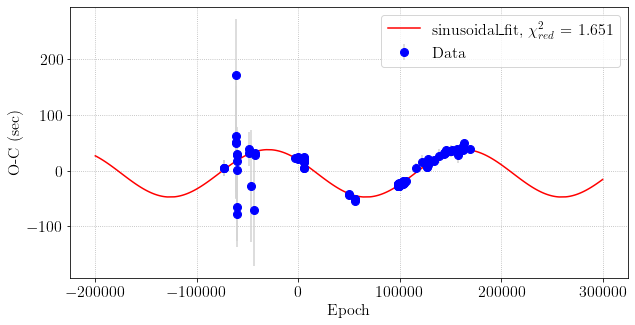

In [21]:
#Plotgraph
fig=plt.figure(figsize=(10, 5))
plt.errorbar(x, y, yerr= dy, fmt='o', markersize=8, color='blue', ecolor='lightgray',label='Data')
# create a line plot for the mapping function
#plt.plot(x_range, y_range, '-', color='red')
plt.plot(x_range, y_range, '-', color='red',label='sinusoidal\_fit, $\chi_{red}^{2}$ = '+str('%0.3f' %(Reduced_chisq)))
#plt.plot(BJD_time, OC_s_ecc, lw=2, color='black')
#plt.xlim(-6000,6000)
#plt.ylim(-200,200)
#plt.ylim(-40,60)
plt.xlabel('Epoch')
plt.ylabel('O-C (sec)')
plt.grid(linestyle='dotted')
plt.legend(loc="best")
#####plt.title('O-C diagram: DP Leo')
#output_filename = os.path.splitext(__file__)[0] + '.png'
plt.savefig("2022_Feb_week4_new_ephemeris_sin_fit.jpg", dpi=1000)
plt.show()

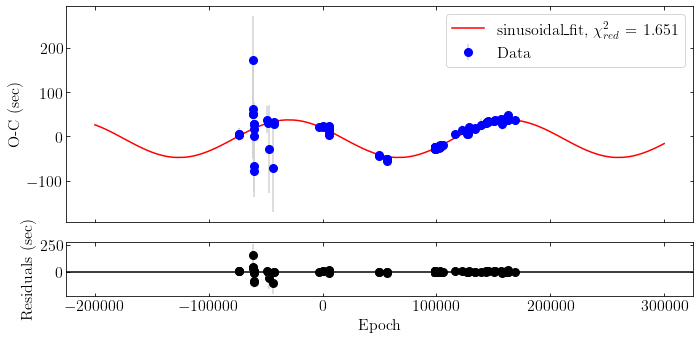

In [28]:
fig, (ax0, ax1) = plt.subplots(2, 1, gridspec_kw={'height_ratios': [4, 1]}, sharex=True, sharey=False, figsize=(10, 5), tight_layout=True)
plt.xlabel('Epoch')

ax0.tick_params(direction='in', which='both', bottom='on',top='on', right = 'on')
ax1.tick_params(direction='in', which='both', bottom='on',top='on', right = 'on')

ax0.errorbar(x, y, yerr= dy, fmt='o', markersize=8, color='blue', ecolor='lightgray', label = 'Data')
ax0.plot(x_range, y_range, '-', color='red',label='sinusoidal\_fit, $\chi_{red}^{2}$ = '+str('%0.3f' %(Reduced_chisq)))

ax0.set_ylabel('O-C (sec)')
ax1.set_ylabel('Residuals (sec)')
ax0.legend(loc="best")

Residual = y-s

ax1.errorbar(x, Residual, yerr= dy, fmt='o', markersize=8, color='black', ecolor='lightgray')
ax1.axhline(y=0, color='black', linestyle='-')
plt.savefig("2022_Feb_week4_new_ephemeris_sin_fit_Res_Boyd.jpg", dpi=1000)
plt.show()